In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random as python_random
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from tensorflow.keras import layers
from keras.utils import to_categorical
from keras.layers import Dense, LSTM, Conv1D, MaxPooling1D, Flatten, GRU, Dropout,Conv2D, MaxPooling2D, Reshape, Conv3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder
from sklearn.manifold import TSNE
import warnings
tf.random.set_seed(0)
np.random.seed(0)
python_random.seed(0)

class DeepLearningModelEvaluator:
    def __init__(self, model_type='DNN', input_shape=(28, 28), num_classes=10, use_seven_layer=False):
        self.model_type = model_type
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.use_seven_layer = use_seven_layer
        self.encoder = OneHotEncoder(sparse_output=False)
        self.model = self._initialize_model()

    def _initialize_model(self):
        if self.model_type == 'DNN':
            if self.use_seven_layer:
                model = Sequential([
                    Dense(512, activation='relu', input_shape=self.input_shape),
                    Dense(256, activation='relu'),
                    Dense(128, activation='relu'),
                    Dense(64, activation='relu'),
                    Dense(32, activation='relu'),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
            else:
                model = Sequential([
                    Flatten(input_shape=self.input_shape),
                    Dense(128, activation='relu'),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
        elif self.model_type == 'CNN':
            if self.use_seven_layer:
                model = Sequential([
                    Reshape((self.input_shape[0], 1), input_shape=self.input_shape),  # Reshape for Conv1D
                    Conv1D(filters=64, kernel_size=2, activation='relu'),
                    MaxPooling1D(pool_size=2),
                    Flatten(),
                    Dense(128, activation='relu'),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
            else:
                model = Sequential([
                    Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(*self.input_shape, 1)),
                    MaxPooling2D(pool_size=(2, 2)),
                    Flatten(),
                    Dense(128, activation='relu'),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
        elif self.model_type == 'LSTM':
            if self.use_seven_layer:
                model = Sequential([
                    LSTM(128, input_shape=self.input_shape, return_sequences=True),
                    LSTM(64, return_sequences=True),
                    LSTM(32, return_sequences=True),
                    Flatten(),
                    Dense(16, activation='relu'),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
            else:
                model = Sequential([
                    LSTM(128, input_shape=self.input_shape),
                    Flatten(),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
        elif self.model_type == 'GRU':
            if self.use_seven_layer:
                model = Sequential([
                    GRU(128, return_sequences=True, input_shape=self.input_shape),
                    GRU(64, return_sequences=True),
                    GRU(32, return_sequences=True),
                    Flatten(),
                    Dense(64, activation='relu'),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
            else:
                model = Sequential([
                    GRU(128, input_shape=self.input_shape),
                    Flatten(),
                    Dropout(0.2),
                    Dense(self.num_classes, activation='softmax')
                ])
        else:
            raise ValueError("Unsupported model type. Choose from 'DNN', 'CNN', 'LSTM', 'GRU'.")

        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
        return model

    def preprocess_data(self, X, y):
        X = X / 255.0
        y = self.encoder.fit_transform(y.reshape(-1, 1))
        return X, y

    def apply_pca(self, X, n_components=50):
        pca = PCA(n_components=n_components)
        return pca.fit_transform(X)

    def apply_tsne(self, X, n_components=3, perplexity=30):
        tsne = TSNE(n_components=n_components, perplexity=perplexity, init='pca')
        return tsne.fit_transform(X)

    def apply_pca_tsne(self, X, pca_components=50, tsne_components=3, perplexity=30):
        X_pca = self.apply_pca(X, n_components=pca_components)
        return self.apply_tsne(X_pca, n_components=tsne_components, perplexity=perplexity)

    def train_and_evaluate(self, X_train, X_test, y_train, y_test, epochs=100, runs=5, method=""):
        accuracies = []
        d_indexes = []

        for run in range(runs):
            self.model = self._initialize_model()

            history = self.model.fit(
                X_train, 
                y_train, 
                epochs=epochs, 
                validation_split=0.2, 
                verbose=1,  # =1 displays detailed output
            )

            y_pred = self.model.predict(X_test)
            y_pred_classes = np.argmax(y_pred, axis=1)
            y_true = np.argmax(y_test, axis=1)

            accuracy = accuracy_score(y_true, y_pred_classes)
            d_index = self.get_Didx(y_true, y_pred_classes)

            print("Accuracy for DNN is", accuracy)
            print("D-Index for DNN is", d_index)

            accuracies.append(accuracy)
            d_indexes.append(d_index)

            self._plot_loss(history, method, run)

        clr = np.mean(accuracies)
        print(f'CLR for {self.model_type} with {method} is:', clr)

        self._plot_d_index(d_indexes, method)

    def get_Didx(self, true, pred):
        ans = self.compute_measure(true, pred)
        d_idx = ans[6]
        return d_idx

    def compute_measure(self, true_label, predicted_label):
        t_idx = (true_label == predicted_label)
        f_idx = np.logical_not(t_idx)
        p_idx = (true_label > 0)
        n_idx = np.logical_not(p_idx)

        tp = np.sum(np.logical_and(t_idx, p_idx))
        tn = np.sum(np.logical_and(t_idx, n_idx))
        fp = np.sum(n_idx) - tn
        fn = np.sum(p_idx) - tp

        tp_fp_tn_fn_list = np.array([tp, fp, tn, fn])
        tp, fp, tn, fn = tp_fp_tn_fn_list

        with np.errstate(divide='ignore'):
            sen = tp / (tp + fn) if (tp + fn) != 0 else 0
            spec = tn / (tn + fp) if (tn + fp) != 0 else 0
            ppr = tp / (tp + fp) if (tp + fp) != 0 else 0
            npr = tn / (tn + fn) if (tn + fn) != 0 else 0
            f1 = tp / (tp + 0.5 * (fp + fn)) if (tp + 0.5 * (fp + fn)) != 0 else 0

        acc = (tp + tn) / (tp + fp + tn + fn)
        d = np.log2(1 + acc) + np.log2(1 + (sen + spec) / 2)

        return [acc, sen, spec, ppr, npr, f1, d]

    def _plot_loss(self, history, method, run):
        train_loss = history.history['loss']
        val_loss = history.history['val_loss']
        epochs = range(1, len(train_loss) + 1)

        plt.figure(figsize=(10, 5))
        plt.plot(epochs, train_loss, label='Training Loss')
        plt.plot(epochs, val_loss, label='Validation Loss')
        plt.title(f'Training and Validation Loss Curves {self.model_type}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

    def _plot_d_index(self, d_indexes, method):
        plt.bar(range(1, len(d_indexes) + 1), d_indexes)
        plt.xlabel('Run')
        plt.ylabel('d-index')
        plt.title(f'{self.model_type} Model d-index per Run with {method}')
        plt.show()

In [ ]:
def run_single_model_combinations(model_name, X_train, X_test, y_train, y_test, method=None, use_seven_layer=False):
    # Initial input shape: model type
    if method in ['PCA', 't-SNE', 'PCA+t-SNE']:
        if model_name in ['DNN', 'CNN']:
            initial_input_shape = (50,)
        elif model_name in ['LSTM', 'GRU']:
            initial_input_shape = (50, 1)
        else:
            raise ValueError(f"Unsupported model name: {model_name}")

        if method == 't-SNE' or method == 'PCA+t-SNE':
            input_shape = (3,)
        else:
            input_shape = initial_input_shape
    else:
        # When no preprocessing, we expect the original data shape
        if model_name in ['DNN']:
            input_shape = (784,)  # Flattened input for DNN
        elif model_name in ['CNN']:
            input_shape = (28, 28, 1)  # 2D input for CNN with single channel
        elif model_name in ['LSTM', 'GRU']:
            input_shape = (28, 28)  # LSTM/GRU expecting sequential data
        else:
            raise ValueError(f"Unsupported model name: {model_name}")

    # Initialize the evaluator with the selected architecture type
    evaluator = DeepLearningModelEvaluator(model_type=model_name, input_shape=input_shape, num_classes=10, use_seven_layer=use_seven_layer)

    if method == 'PCA':
        X_train_preprocessed = evaluator.apply_pca_preprocessing(X_train, n_components=50)
        X_test_preprocessed = evaluator.apply_pca_preprocessing(X_test, n_components=50)
    elif method == 't-SNE':
        X_train_preprocessed = evaluator.apply_tsne(X_train, n_components=3)
        X_test_preprocessed = evaluator.apply_tsne(X_test, n_components=3)
    elif method == 'PCA+t-SNE':
        X_train_preprocessed = evaluator.apply_pca_tsne(X_train, pca_components=50, tsne_components=3)
        X_test_preprocessed = evaluator.apply_pca_tsne(X_test, pca_components=50, tsne_components=3)
    else:
        X_train_preprocessed = X_train
        X_test_preprocessed = X_test

    # Reshape data for LSTM/GRU if necessary
    if model_name in ['LSTM', 'GRU'] and method in ['PCA', 't-SNE', 'PCA+t-SNE']:
        X_train_preprocessed = X_train_preprocessed.reshape(-1, input_shape[0], 1)
        X_test_preprocessed = X_test_preprocessed.reshape(-1, input_shape[0], 1)
    elif model_name in ['CNN']:
        X_train_preprocessed = X_train_preprocessed.reshape(-1, 28, 28, 1)
        X_test_preprocessed = X_test_preprocessed.reshape(-1, 28, 28, 1)

    # Ensure labels are correctly one-hot encoded
    encoder = OneHotEncoder(sparse_output=False)
    y_train_encoded = encoder.fit_transform(y_train.reshape(-1, 1))
    y_test_encoded = encoder.transform(y_test.reshape(-1, 1))

    # Split the data
    X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(X_train_preprocessed, y_train_encoded, test_size=0.2, random_state=42)

    method_name = method if method is not None else "No Preprocessing"

    evaluator.train_and_evaluate(X_train_final, X_test_final, y_train_final, y_test_final, epochs=100, method=method_name)

# EMODB Dataset

In [ ]:
df = pd.read_csv("/content/drive/My Drive/data/EMODB.csv")
df = df.drop(columns=[df.columns[0]])
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,"('f0', 'mean', '01')","('f0', 'std', '01')","('mfcc', 'mean', '01')","('mfcc', 'mean', '02')","('mfcc', 'mean', '03')","('mfcc', 'mean', '04')","('mfcc', 'mean', '05')","('mfcc', 'mean', '06')","('mfcc', 'mean', '07')","('mfcc', 'mean', '08')",...,"('spectral_contrast', 'std', '03')","('spectral_contrast', 'std', '04')","('spectral_contrast', 'std', '05')","('spectral_contrast', 'std', '06')","('spectral_contrast', 'std', '07')","('spectral_rolloff', 'mean', '01')","('spectral_rolloff', 'std', '01')","('zcr', 'mean', '01')","('zcr', 'std', '01')",file_label
0,145.343781,31.505808,-283.190918,32.031670,-5.474060,35.402897,-15.010938,6.353321,-21.260695,0.428079,...,7.090941,7.753490,5.282079,3.868765,5.157818,6150.666016,1411.208496,0.148645,0.118676,2
1,161.040619,28.293964,-331.655273,21.023169,-10.702972,16.975685,-20.727976,-1.133294,-20.328308,-10.350143,...,6.593383,6.704932,5.592353,4.171617,4.644610,6159.489746,1930.429321,0.166767,0.165202,1
2,157.494843,47.443073,-265.822510,44.915390,17.108959,34.688042,12.189463,14.549934,-6.697933,-12.441710,...,5.425709,4.906992,3.120835,3.226218,2.872664,5869.697754,2276.721191,0.183421,0.196017,4
3,152.910751,32.826759,-238.955154,62.968914,13.816337,29.617249,10.222418,-3.197157,-17.044815,-8.634521,...,5.051308,4.230397,3.716090,3.576874,2.821063,5139.747070,2326.412109,0.135328,0.149956,3
4,149.988342,32.928013,-300.787781,25.908279,-13.971348,11.797582,-26.056410,7.880186,-16.983875,-5.991604,...,7.276993,6.382456,5.751153,4.086729,5.434231,5980.590820,1982.044922,0.181920,0.165778,1


### DNN

Epoch 1/100
14/14 [==============================] - 2s 47ms/step - loss: 1.6499 - accuracy: 0.3621 - val_loss: 1.3362 - val_accuracy: 0.5140
Epoch 2/100
14/14 [==============================] - 0s 12ms/step - loss: 1.1619 - accuracy: 0.5724 - val_loss: 1.1027 - val_accuracy: 0.6168
Epoch 3/100
14/14 [==============================] - 0s 17ms/step - loss: 0.9025 - accuracy: 0.7033 - val_loss: 0.9729 - val_accuracy: 0.6449
Epoch 4/100
14/14 [==============================] - 0s 28ms/step - loss: 0.7084 - accuracy: 0.7874 - val_loss: 0.8937 - val_accuracy: 0.6262
Epoch 5/100
14/14 [==============================] - 0s 25ms/step - loss: 0.5822 - accuracy: 0.8154 - val_loss: 0.7988 - val_accuracy: 0.6636
Epoch 6/100
14/14 [==============================] - 0s 21ms/step - loss: 0.4832 - accuracy: 0.8551 - val_loss: 0.7285 - val_accuracy: 0.7009
Epoch 7/100
14/14 [==============================] - 0s 23ms/step - loss: 0.3965 - accuracy: 0.8785 - val_loss: 0.7037 - val_accuracy: 0.7290
Epoch 

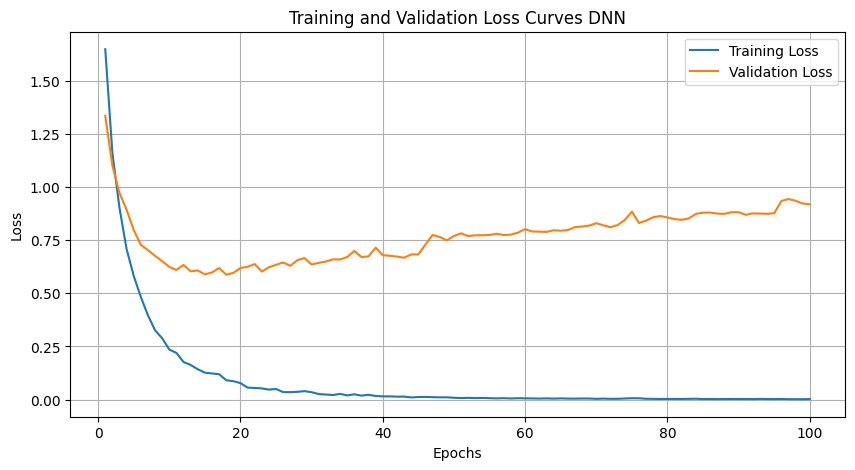

Epoch 1/100
14/14 [==============================] - 3s 36ms/step - loss: 1.7407 - accuracy: 0.3318 - val_loss: 1.3350 - val_accuracy: 0.5234
Epoch 2/100
14/14 [==============================] - 0s 9ms/step - loss: 1.1874 - accuracy: 0.5491 - val_loss: 1.0684 - val_accuracy: 0.6168
Epoch 3/100
14/14 [==============================] - 0s 10ms/step - loss: 0.9050 - accuracy: 0.7150 - val_loss: 0.9227 - val_accuracy: 0.6729
Epoch 4/100
14/14 [==============================] - 0s 10ms/step - loss: 0.7288 - accuracy: 0.7617 - val_loss: 0.8324 - val_accuracy: 0.7103
Epoch 5/100
14/14 [==============================] - 0s 10ms/step - loss: 0.5933 - accuracy: 0.8131 - val_loss: 0.7502 - val_accuracy: 0.7196
Epoch 6/100
14/14 [==============================] - 0s 11ms/step - loss: 0.4710 - accuracy: 0.8692 - val_loss: 0.6828 - val_accuracy: 0.7477
Epoch 7/100
14/14 [==============================] - 0s 7ms/step - loss: 0.4082 - accuracy: 0.8925 - val_loss: 0.6453 - val_accuracy: 0.7570
Epoch 8/

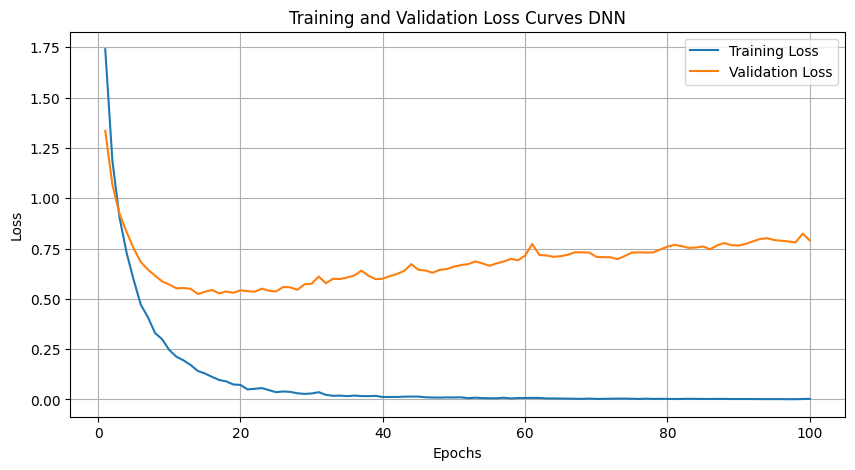

Epoch 1/100
14/14 [==============================] - 1s 21ms/step - loss: 1.6910 - accuracy: 0.3621 - val_loss: 1.3332 - val_accuracy: 0.5140
Epoch 2/100
14/14 [==============================] - 0s 7ms/step - loss: 1.1984 - accuracy: 0.5818 - val_loss: 1.0791 - val_accuracy: 0.6075
Epoch 3/100
14/14 [==============================] - 0s 7ms/step - loss: 0.9436 - accuracy: 0.6752 - val_loss: 0.9435 - val_accuracy: 0.6916
Epoch 4/100
14/14 [==============================] - 0s 7ms/step - loss: 0.7338 - accuracy: 0.7407 - val_loss: 0.8764 - val_accuracy: 0.6729
Epoch 5/100
14/14 [==============================] - 0s 7ms/step - loss: 0.6352 - accuracy: 0.7944 - val_loss: 0.7843 - val_accuracy: 0.6822
Epoch 6/100
14/14 [==============================] - 0s 6ms/step - loss: 0.5390 - accuracy: 0.8224 - val_loss: 0.7576 - val_accuracy: 0.7103
Epoch 7/100
14/14 [==============================] - 0s 5ms/step - loss: 0.4454 - accuracy: 0.8668 - val_loss: 0.7241 - val_accuracy: 0.7103
Epoch 8/100


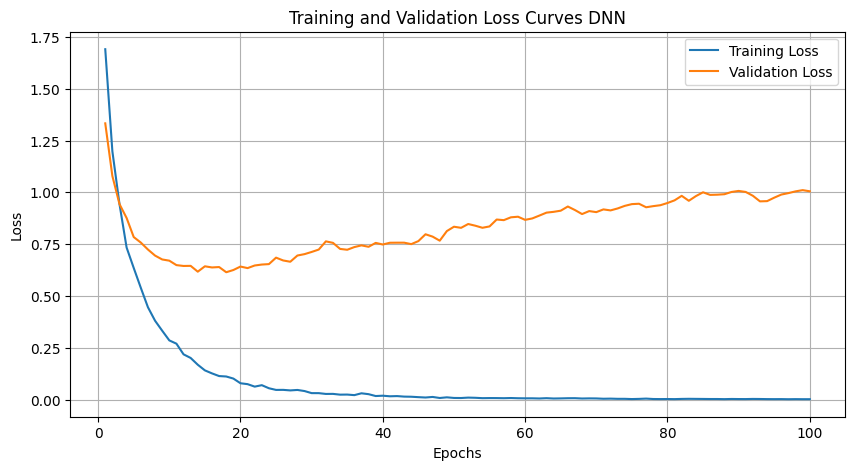

Epoch 1/100
14/14 [==============================] - 2s 28ms/step - loss: 1.7808 - accuracy: 0.3014 - val_loss: 1.3819 - val_accuracy: 0.5047
Epoch 2/100
14/14 [==============================] - 0s 11ms/step - loss: 1.2717 - accuracy: 0.5397 - val_loss: 1.1144 - val_accuracy: 0.6075
Epoch 3/100
14/14 [==============================] - 0s 9ms/step - loss: 0.9801 - accuracy: 0.6799 - val_loss: 0.9471 - val_accuracy: 0.6729
Epoch 4/100
14/14 [==============================] - 0s 11ms/step - loss: 0.7730 - accuracy: 0.7617 - val_loss: 0.8660 - val_accuracy: 0.6729
Epoch 5/100
14/14 [==============================] - 0s 10ms/step - loss: 0.6342 - accuracy: 0.7874 - val_loss: 0.7891 - val_accuracy: 0.7009
Epoch 6/100
14/14 [==============================] - 0s 9ms/step - loss: 0.5175 - accuracy: 0.8411 - val_loss: 0.7205 - val_accuracy: 0.6916
Epoch 7/100
14/14 [==============================] - 0s 10ms/step - loss: 0.4368 - accuracy: 0.8762 - val_loss: 0.6901 - val_accuracy: 0.6916
Epoch 8/

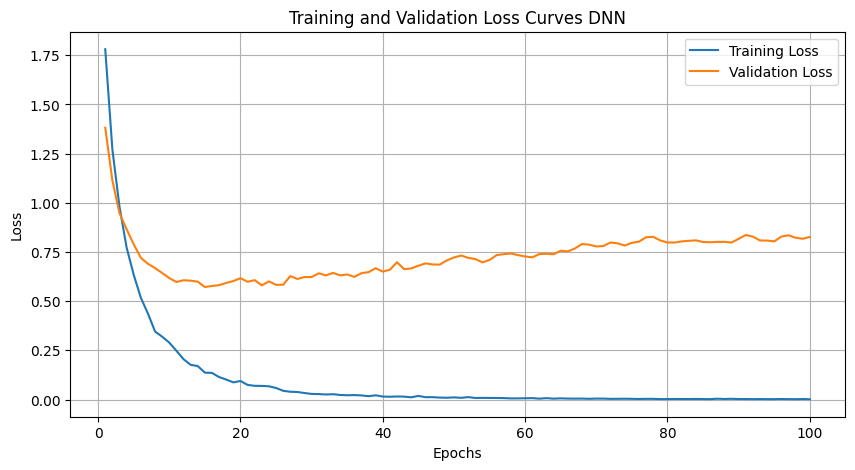

Epoch 1/100
14/14 [==============================] - 1s 20ms/step - loss: 1.6943 - accuracy: 0.3575 - val_loss: 1.3560 - val_accuracy: 0.5047
Epoch 2/100
14/14 [==============================] - 0s 7ms/step - loss: 1.1564 - accuracy: 0.6028 - val_loss: 1.0869 - val_accuracy: 0.6355
Epoch 3/100
14/14 [==============================] - 0s 7ms/step - loss: 0.9013 - accuracy: 0.7009 - val_loss: 0.9707 - val_accuracy: 0.6449
Epoch 4/100
14/14 [==============================] - 0s 7ms/step - loss: 0.7414 - accuracy: 0.7687 - val_loss: 0.8668 - val_accuracy: 0.7103
Epoch 5/100
14/14 [==============================] - 0s 7ms/step - loss: 0.6017 - accuracy: 0.8224 - val_loss: 0.7856 - val_accuracy: 0.7383
Epoch 6/100
14/14 [==============================] - 0s 8ms/step - loss: 0.5043 - accuracy: 0.8505 - val_loss: 0.7452 - val_accuracy: 0.7477
Epoch 7/100
14/14 [==============================] - 0s 6ms/step - loss: 0.4386 - accuracy: 0.8621 - val_loss: 0.7048 - val_accuracy: 0.7477
Epoch 8/100


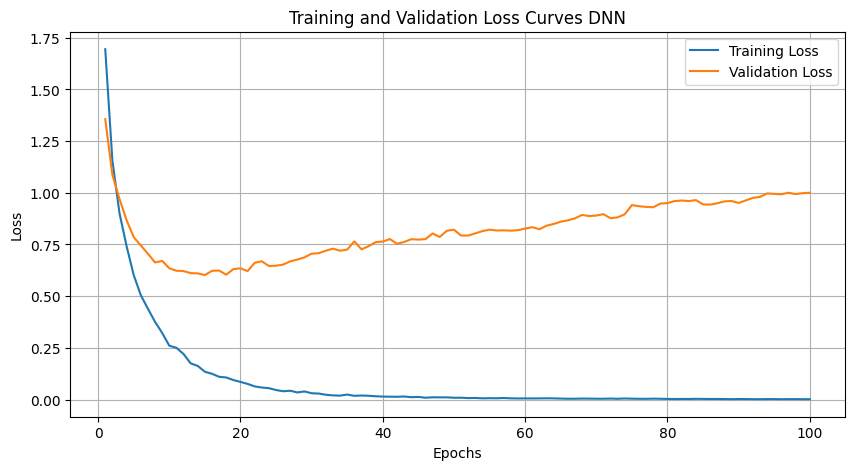

CLR for DNN is: 0.7981308411214953


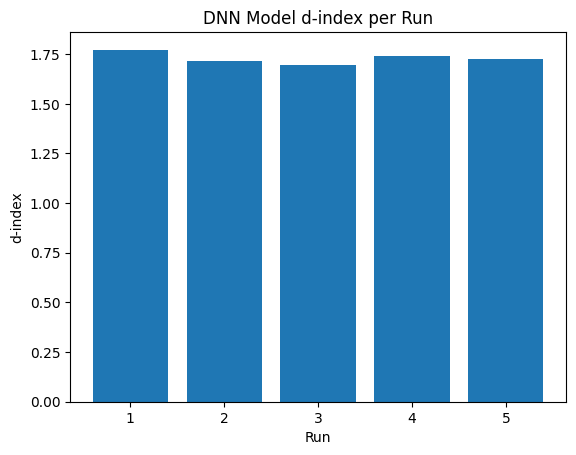

In [ ]:
y = df['file_label']

scaler = StandardScaler()
X_normalizated = scaler.fit_transform(X)

encoder = OneHotEncoder(sparse=False)
y_encoded = encoder.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_normalizated, y_encoded, test_size=0.2, random_state=42)


# Run the model with no preprocessing
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method=None)

### CNN

Epoch 1/100
11/11 [==============================] - 1s 43ms/step - loss: 1.8049 - accuracy: 0.3041 - val_loss: 1.6676 - val_accuracy: 0.4070
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 1.5375 - accuracy: 0.4474 - val_loss: 1.4477 - val_accuracy: 0.5116
Epoch 3/100
11/11 [==============================] - 0s 37ms/step - loss: 1.3738 - accuracy: 0.5146 - val_loss: 1.2941 - val_accuracy: 0.5349
Epoch 4/100
11/11 [==============================] - 1s 73ms/step - loss: 1.2324 - accuracy: 0.5848 - val_loss: 1.1709 - val_accuracy: 0.6163
Epoch 5/100
11/11 [==============================] - 0s 41ms/step - loss: 1.1159 - accuracy: 0.6404 - val_loss: 1.0742 - val_accuracy: 0.6860
Epoch 6/100
11/11 [==============================] - 0s 35ms/step - loss: 1.0083 - accuracy: 0.6901 - val_loss: 0.9959 - val_accuracy: 0.6628
Epoch 7/100
11/11 [==============================] - 0s 13ms/step - loss: 0.9561 - accuracy: 0.6813 - val_loss: 0.9457 - val_accuracy: 0.6512
Epoch 

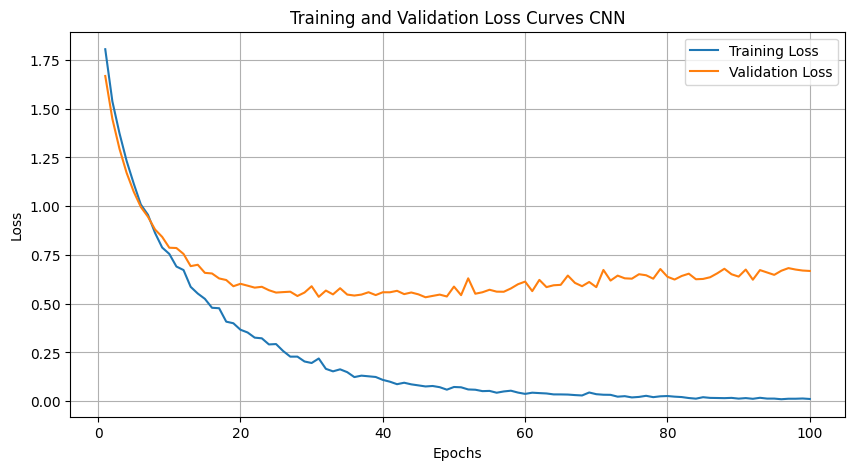

Epoch 1/100
11/11 [==============================] - 1s 30ms/step - loss: 1.8214 - accuracy: 0.2602 - val_loss: 1.6685 - val_accuracy: 0.3953
Epoch 2/100
11/11 [==============================] - 0s 9ms/step - loss: 1.5530 - accuracy: 0.4474 - val_loss: 1.4612 - val_accuracy: 0.4535
Epoch 3/100
11/11 [==============================] - 0s 11ms/step - loss: 1.3784 - accuracy: 0.5088 - val_loss: 1.3131 - val_accuracy: 0.5116
Epoch 4/100
11/11 [==============================] - 0s 10ms/step - loss: 1.2337 - accuracy: 0.5789 - val_loss: 1.1901 - val_accuracy: 0.5698
Epoch 5/100
11/11 [==============================] - 0s 7ms/step - loss: 1.1579 - accuracy: 0.5936 - val_loss: 1.0881 - val_accuracy: 0.6512
Epoch 6/100
11/11 [==============================] - 0s 9ms/step - loss: 1.0422 - accuracy: 0.6462 - val_loss: 1.0033 - val_accuracy: 0.6744
Epoch 7/100
11/11 [==============================] - 0s 8ms/step - loss: 0.9677 - accuracy: 0.6696 - val_loss: 0.9518 - val_accuracy: 0.7326
Epoch 8/10

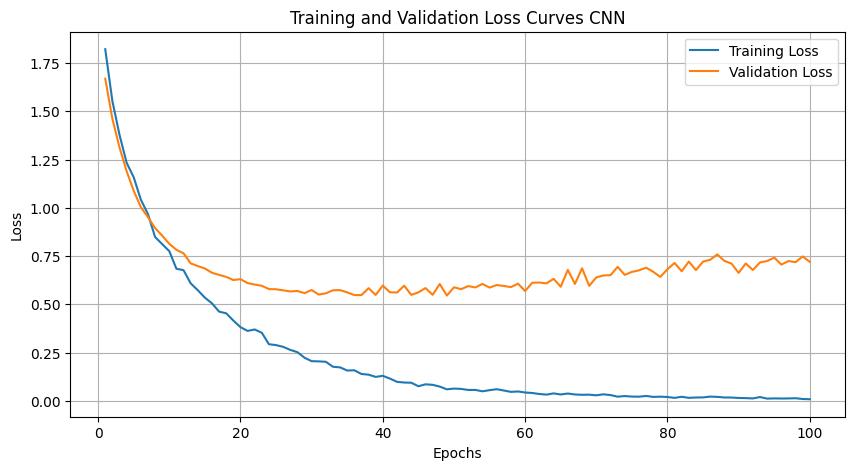

Epoch 1/100
11/11 [==============================] - 1s 26ms/step - loss: 1.8211 - accuracy: 0.2573 - val_loss: 1.6673 - val_accuracy: 0.4186
Epoch 2/100
11/11 [==============================] - 0s 9ms/step - loss: 1.5549 - accuracy: 0.4474 - val_loss: 1.4251 - val_accuracy: 0.5000
Epoch 3/100
11/11 [==============================] - 0s 10ms/step - loss: 1.3802 - accuracy: 0.5439 - val_loss: 1.2768 - val_accuracy: 0.6047
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.2353 - accuracy: 0.5877 - val_loss: 1.1642 - val_accuracy: 0.5930
Epoch 5/100
11/11 [==============================] - 0s 8ms/step - loss: 1.1224 - accuracy: 0.6082 - val_loss: 1.0731 - val_accuracy: 0.6744
Epoch 6/100
11/11 [==============================] - 0s 8ms/step - loss: 1.0229 - accuracy: 0.6462 - val_loss: 1.0060 - val_accuracy: 0.6163
Epoch 7/100
11/11 [==============================] - 0s 9ms/step - loss: 0.9503 - accuracy: 0.7018 - val_loss: 0.9326 - val_accuracy: 0.6977
Epoch 8/10

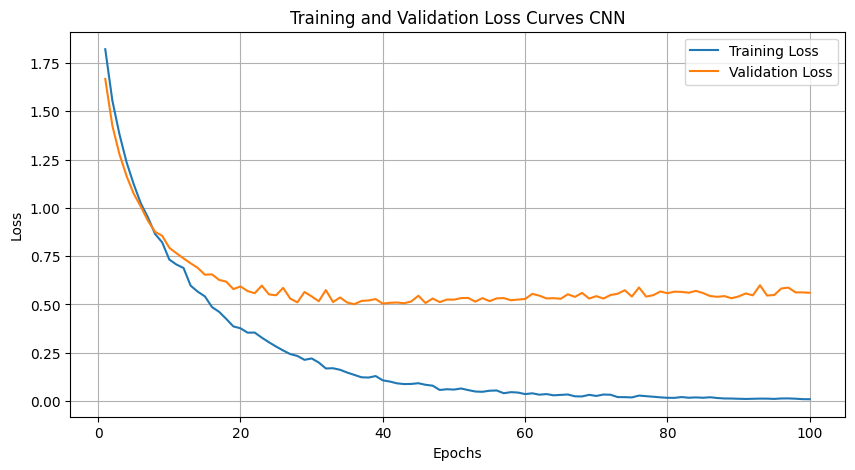

Epoch 1/100
11/11 [==============================] - 1s 28ms/step - loss: 1.8214 - accuracy: 0.2456 - val_loss: 1.6719 - val_accuracy: 0.3140
Epoch 2/100
11/11 [==============================] - 0s 9ms/step - loss: 1.5565 - accuracy: 0.4444 - val_loss: 1.4726 - val_accuracy: 0.5465
Epoch 3/100
11/11 [==============================] - 0s 8ms/step - loss: 1.3920 - accuracy: 0.5556 - val_loss: 1.3129 - val_accuracy: 0.5349
Epoch 4/100
11/11 [==============================] - 0s 11ms/step - loss: 1.2484 - accuracy: 0.5643 - val_loss: 1.1765 - val_accuracy: 0.5465
Epoch 5/100
11/11 [==============================] - 0s 9ms/step - loss: 1.1159 - accuracy: 0.6228 - val_loss: 1.0828 - val_accuracy: 0.6279
Epoch 6/100
11/11 [==============================] - 0s 8ms/step - loss: 1.0299 - accuracy: 0.6345 - val_loss: 0.9970 - val_accuracy: 0.6860
Epoch 7/100
11/11 [==============================] - 0s 8ms/step - loss: 0.9287 - accuracy: 0.6959 - val_loss: 0.9297 - val_accuracy: 0.7209
Epoch 8/100

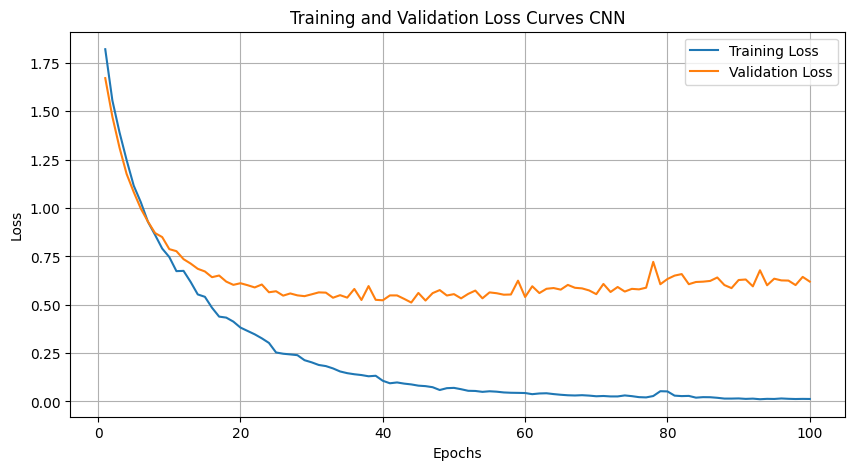

Epoch 1/100
11/11 [==============================] - 1s 28ms/step - loss: 1.7922 - accuracy: 0.3158 - val_loss: 1.6546 - val_accuracy: 0.3605
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 1.5209 - accuracy: 0.4327 - val_loss: 1.4178 - val_accuracy: 0.5000
Epoch 3/100
11/11 [==============================] - 0s 8ms/step - loss: 1.3597 - accuracy: 0.5175 - val_loss: 1.2752 - val_accuracy: 0.5698
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.2155 - accuracy: 0.5877 - val_loss: 1.1588 - val_accuracy: 0.6047
Epoch 5/100
11/11 [==============================] - 0s 9ms/step - loss: 1.1168 - accuracy: 0.6082 - val_loss: 1.0730 - val_accuracy: 0.6628
Epoch 6/100
11/11 [==============================] - 0s 10ms/step - loss: 1.0339 - accuracy: 0.6462 - val_loss: 1.0033 - val_accuracy: 0.6977
Epoch 7/100
11/11 [==============================] - 0s 11ms/step - loss: 0.9339 - accuracy: 0.6959 - val_loss: 0.9290 - val_accuracy: 0.7093
Epoch 8/

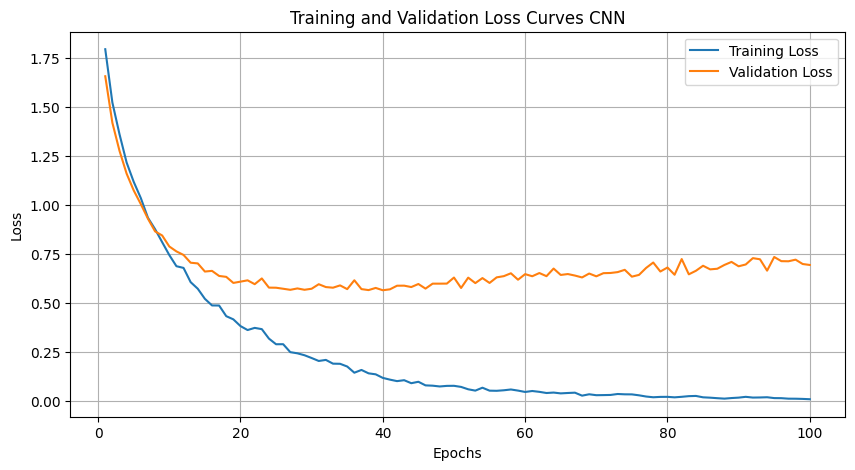

CLR for CNN is: 0.6747663551401869


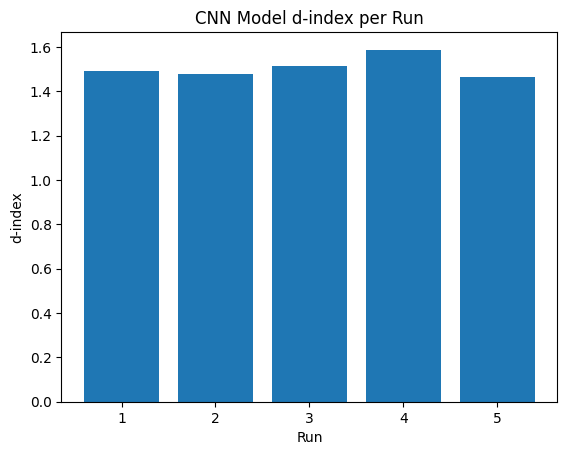

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method=None)

### LSTM

Epoch 1/100
11/11 [==============================] - 8s 252ms/step - loss: 1.9053 - accuracy: 0.2719 - val_loss: 1.8473 - val_accuracy: 0.2791
Epoch 2/100
11/11 [==============================] - 1s 103ms/step - loss: 1.7828 - accuracy: 0.3099 - val_loss: 1.7608 - val_accuracy: 0.3023
Epoch 3/100
11/11 [==============================] - 1s 71ms/step - loss: 1.7183 - accuracy: 0.3216 - val_loss: 1.7016 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 1s 67ms/step - loss: 1.6885 - accuracy: 0.3392 - val_loss: 1.6683 - val_accuracy: 0.3140
Epoch 5/100
11/11 [==============================] - 1s 69ms/step - loss: 1.6622 - accuracy: 0.3392 - val_loss: 1.6453 - val_accuracy: 0.3140
Epoch 6/100
11/11 [==============================] - 1s 68ms/step - loss: 1.6430 - accuracy: 0.3392 - val_loss: 1.6160 - val_accuracy: 0.3372
Epoch 7/100
11/11 [==============================] - 1s 69ms/step - loss: 1.5978 - accuracy: 0.3713 - val_loss: 1.5761 - val_accuracy: 0.3721
Epoc

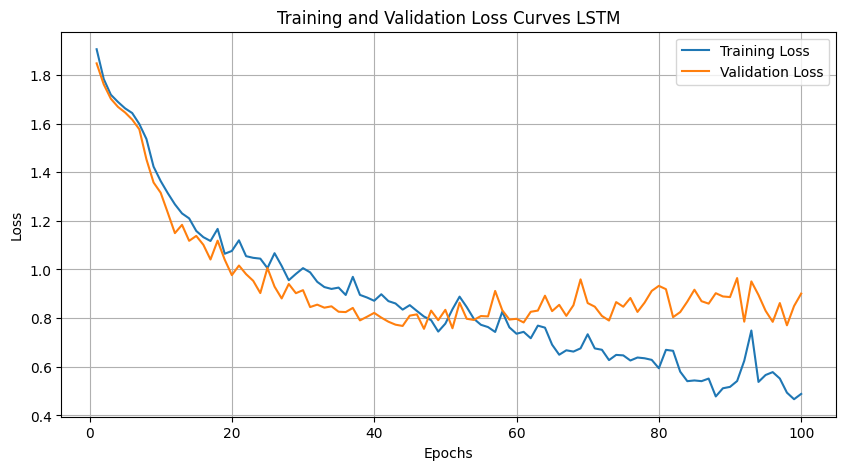

Epoch 1/100
11/11 [==============================] - 9s 254ms/step - loss: 1.9224 - accuracy: 0.2515 - val_loss: 1.8996 - val_accuracy: 0.2093
Epoch 2/100
11/11 [==============================] - 1s 111ms/step - loss: 1.8302 - accuracy: 0.3099 - val_loss: 1.8027 - val_accuracy: 0.3023
Epoch 3/100
11/11 [==============================] - 1s 114ms/step - loss: 1.7225 - accuracy: 0.3421 - val_loss: 1.7039 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 1s 118ms/step - loss: 1.6903 - accuracy: 0.3304 - val_loss: 1.6533 - val_accuracy: 0.3140
Epoch 5/100
11/11 [==============================] - 1s 119ms/step - loss: 1.6633 - accuracy: 0.3480 - val_loss: 1.6347 - val_accuracy: 0.3256
Epoch 6/100
11/11 [==============================] - 1s 108ms/step - loss: 1.6256 - accuracy: 0.3421 - val_loss: 1.6027 - val_accuracy: 0.3023
Epoch 7/100
11/11 [==============================] - 1s 103ms/step - loss: 1.6150 - accuracy: 0.3392 - val_loss: 1.6028 - val_accuracy: 0.3023

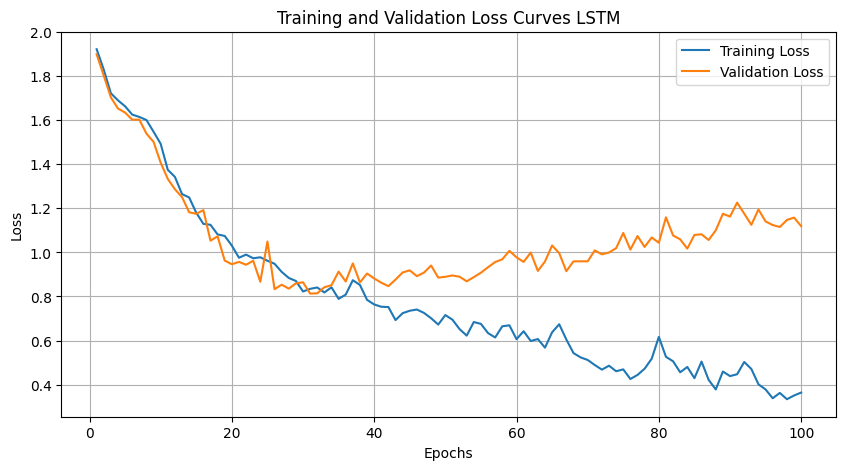

Epoch 1/100
11/11 [==============================] - 8s 266ms/step - loss: 1.9232 - accuracy: 0.2778 - val_loss: 1.9010 - val_accuracy: 0.3023
Epoch 2/100
11/11 [==============================] - 1s 115ms/step - loss: 1.8337 - accuracy: 0.3363 - val_loss: 1.7813 - val_accuracy: 0.3023
Epoch 3/100
11/11 [==============================] - 1s 93ms/step - loss: 1.7262 - accuracy: 0.3275 - val_loss: 1.6895 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 1s 70ms/step - loss: 1.6669 - accuracy: 0.3275 - val_loss: 1.6251 - val_accuracy: 0.3140
Epoch 5/100
11/11 [==============================] - 1s 70ms/step - loss: 1.6395 - accuracy: 0.3509 - val_loss: 1.5811 - val_accuracy: 0.3605
Epoch 6/100
11/11 [==============================] - 1s 69ms/step - loss: 1.6208 - accuracy: 0.3684 - val_loss: 1.5628 - val_accuracy: 0.3488
Epoch 7/100
11/11 [==============================] - 1s 70ms/step - loss: 1.5993 - accuracy: 0.3509 - val_loss: 1.5300 - val_accuracy: 0.3605
Epoc

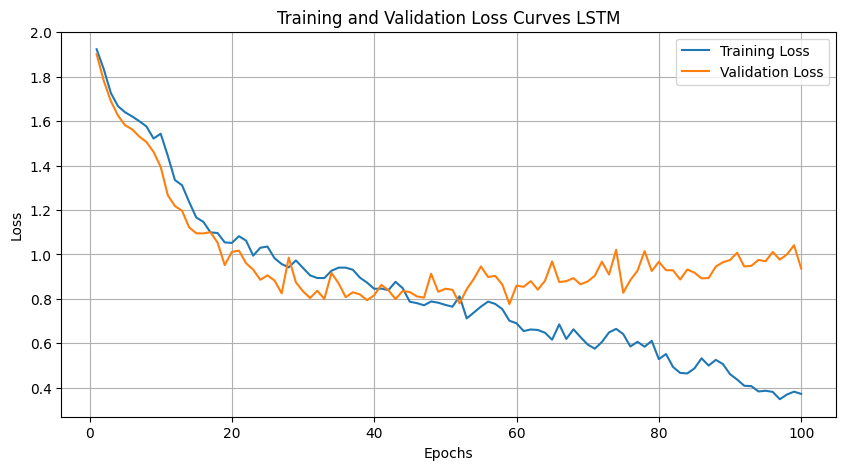

Epoch 1/100
11/11 [==============================] - 7s 272ms/step - loss: 1.9177 - accuracy: 0.2544 - val_loss: 1.8664 - val_accuracy: 0.2907
Epoch 2/100
11/11 [==============================] - 1s 78ms/step - loss: 1.7891 - accuracy: 0.3275 - val_loss: 1.7397 - val_accuracy: 0.3023
Epoch 3/100
11/11 [==============================] - 1s 101ms/step - loss: 1.7168 - accuracy: 0.3246 - val_loss: 1.6636 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 1s 116ms/step - loss: 1.6714 - accuracy: 0.3216 - val_loss: 1.6299 - val_accuracy: 0.3023
Epoch 5/100
11/11 [==============================] - 1s 114ms/step - loss: 1.6512 - accuracy: 0.3363 - val_loss: 1.6061 - val_accuracy: 0.3488
Epoch 6/100
11/11 [==============================] - 1s 122ms/step - loss: 1.6309 - accuracy: 0.3596 - val_loss: 1.5880 - val_accuracy: 0.3372
Epoch 7/100
11/11 [==============================] - 1s 122ms/step - loss: 1.5967 - accuracy: 0.3596 - val_loss: 1.5575 - val_accuracy: 0.3488


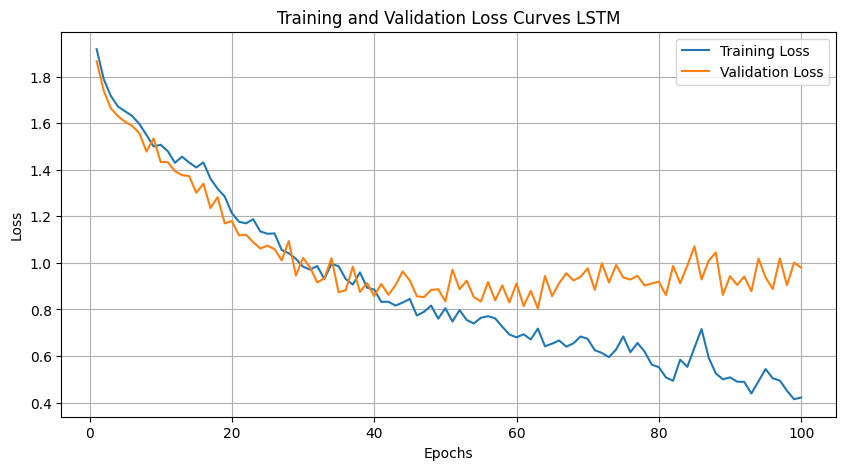

Epoch 1/100
11/11 [==============================] - 8s 282ms/step - loss: 1.9217 - accuracy: 0.2544 - val_loss: 1.8818 - val_accuracy: 0.3023
Epoch 2/100
11/11 [==============================] - 1s 125ms/step - loss: 1.8150 - accuracy: 0.3246 - val_loss: 1.7723 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 1s 125ms/step - loss: 1.7155 - accuracy: 0.3275 - val_loss: 1.6696 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 1s 115ms/step - loss: 1.6713 - accuracy: 0.3275 - val_loss: 1.6379 - val_accuracy: 0.2907
Epoch 5/100
11/11 [==============================] - 1s 108ms/step - loss: 1.6429 - accuracy: 0.3363 - val_loss: 1.6096 - val_accuracy: 0.3140
Epoch 6/100
11/11 [==============================] - 1s 87ms/step - loss: 1.6335 - accuracy: 0.3567 - val_loss: 1.5931 - val_accuracy: 0.3140
Epoch 7/100
11/11 [==============================] - 1s 75ms/step - loss: 1.6070 - accuracy: 0.3509 - val_loss: 1.5745 - val_accuracy: 0.3605
E

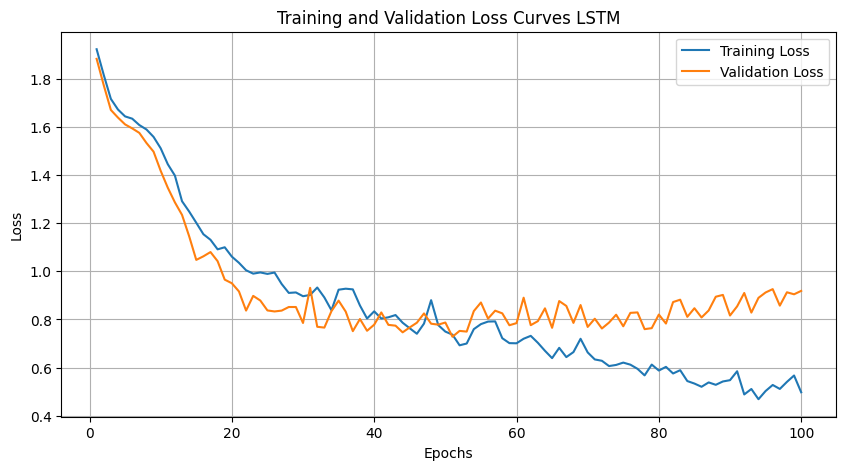

CLR for LSTM is: 0.616822429906542


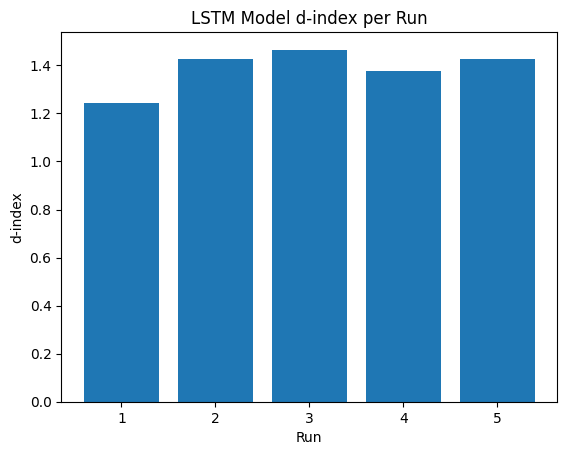

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method=None)

### GRU

Epoch 1/100
11/11 [==============================] - 4s 122ms/step - loss: 1.9035 - accuracy: 0.2602 - val_loss: 1.8529 - val_accuracy: 0.2674
Epoch 2/100
11/11 [==============================] - 1s 63ms/step - loss: 1.7681 - accuracy: 0.3655 - val_loss: 1.6830 - val_accuracy: 0.3140
Epoch 3/100
11/11 [==============================] - 1s 63ms/step - loss: 1.6467 - accuracy: 0.3450 - val_loss: 1.5752 - val_accuracy: 0.3256
Epoch 4/100
11/11 [==============================] - 1s 92ms/step - loss: 1.5831 - accuracy: 0.3713 - val_loss: 1.5080 - val_accuracy: 0.3256
Epoch 5/100
11/11 [==============================] - 1s 100ms/step - loss: 1.5418 - accuracy: 0.3713 - val_loss: 1.4753 - val_accuracy: 0.3488
Epoch 6/100
11/11 [==============================] - 1s 99ms/step - loss: 1.5212 - accuracy: 0.3947 - val_loss: 1.4389 - val_accuracy: 0.3372
Epoch 7/100
11/11 [==============================] - 1s 100ms/step - loss: 1.4492 - accuracy: 0.4181 - val_loss: 1.3378 - val_accuracy: 0.4884
Epo

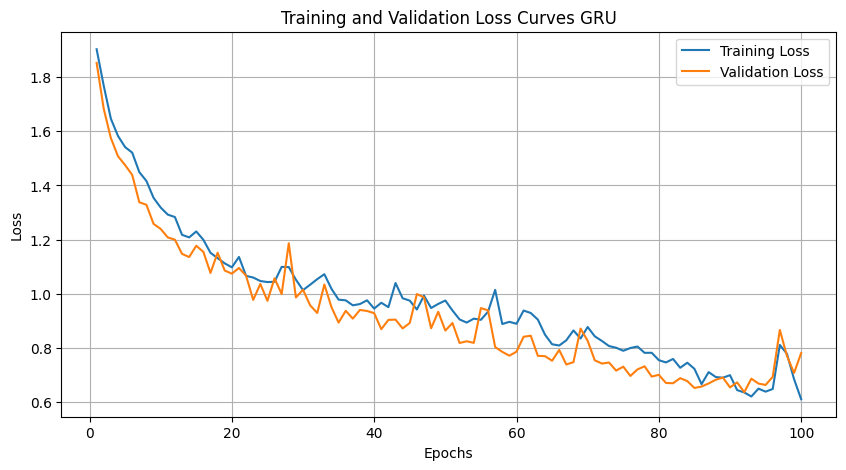

Epoch 1/100
11/11 [==============================] - 5s 145ms/step - loss: 1.9178 - accuracy: 0.2573 - val_loss: 1.8703 - val_accuracy: 0.2558
Epoch 2/100
11/11 [==============================] - 1s 65ms/step - loss: 1.7912 - accuracy: 0.3684 - val_loss: 1.7059 - val_accuracy: 0.3372
Epoch 3/100
11/11 [==============================] - 1s 67ms/step - loss: 1.6517 - accuracy: 0.3450 - val_loss: 1.5637 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 1s 64ms/step - loss: 1.5818 - accuracy: 0.3596 - val_loss: 1.5233 - val_accuracy: 0.3372
Epoch 5/100
11/11 [==============================] - 1s 85ms/step - loss: 1.5666 - accuracy: 0.3596 - val_loss: 1.4941 - val_accuracy: 0.3256
Epoch 6/100
11/11 [==============================] - 1s 103ms/step - loss: 1.5401 - accuracy: 0.3830 - val_loss: 1.4848 - val_accuracy: 0.3372
Epoch 7/100
11/11 [==============================] - 1s 102ms/step - loss: 1.5057 - accuracy: 0.3889 - val_loss: 1.4761 - val_accuracy: 0.3488
Epo

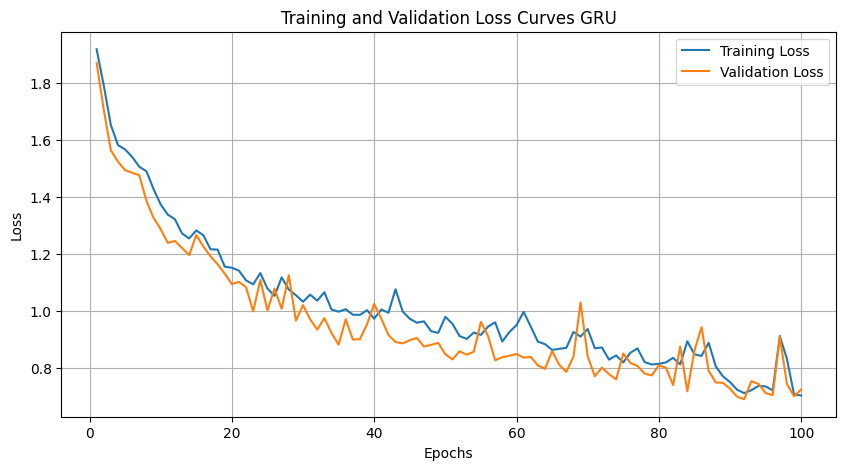

Epoch 1/100
11/11 [==============================] - 5s 130ms/step - loss: 1.9111 - accuracy: 0.2427 - val_loss: 1.8659 - val_accuracy: 0.3372
Epoch 2/100
11/11 [==============================] - 1s 69ms/step - loss: 1.7999 - accuracy: 0.3246 - val_loss: 1.7187 - val_accuracy: 0.3140
Epoch 3/100
11/11 [==============================] - 1s 72ms/step - loss: 1.6509 - accuracy: 0.3392 - val_loss: 1.5600 - val_accuracy: 0.3140
Epoch 4/100
11/11 [==============================] - 1s 65ms/step - loss: 1.5628 - accuracy: 0.3596 - val_loss: 1.5193 - val_accuracy: 0.3372
Epoch 5/100
11/11 [==============================] - 1s 67ms/step - loss: 1.5553 - accuracy: 0.3801 - val_loss: 1.4720 - val_accuracy: 0.3605
Epoch 6/100
11/11 [==============================] - 1s 70ms/step - loss: 1.4986 - accuracy: 0.4094 - val_loss: 1.4009 - val_accuracy: 0.3721
Epoch 7/100
11/11 [==============================] - 1s 70ms/step - loss: 1.4215 - accuracy: 0.4211 - val_loss: 1.3789 - val_accuracy: 0.4884
Epoch

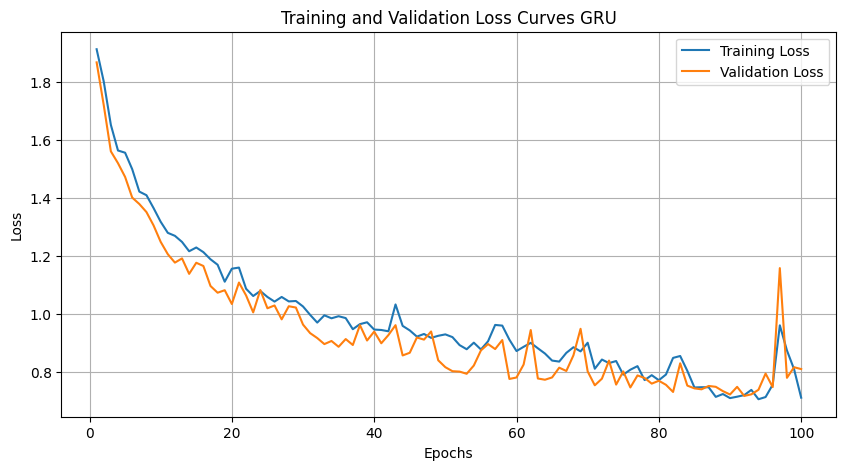

Epoch 1/100
11/11 [==============================] - 4s 123ms/step - loss: 1.9081 - accuracy: 0.2573 - val_loss: 1.8662 - val_accuracy: 0.3140
Epoch 2/100
11/11 [==============================] - 1s 68ms/step - loss: 1.7776 - accuracy: 0.3363 - val_loss: 1.7154 - val_accuracy: 0.3372
Epoch 3/100
11/11 [==============================] - 1s 78ms/step - loss: 1.6599 - accuracy: 0.3480 - val_loss: 1.5741 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 1s 110ms/step - loss: 1.5977 - accuracy: 0.3567 - val_loss: 1.5235 - val_accuracy: 0.3372
Epoch 5/100
11/11 [==============================] - 1s 108ms/step - loss: 1.5594 - accuracy: 0.3772 - val_loss: 1.4911 - val_accuracy: 0.3605
Epoch 6/100
11/11 [==============================] - 1s 105ms/step - loss: 1.5242 - accuracy: 0.3801 - val_loss: 1.4481 - val_accuracy: 0.3372
Epoch 7/100
11/11 [==============================] - 1s 109ms/step - loss: 1.4547 - accuracy: 0.3977 - val_loss: 1.3614 - val_accuracy: 0.4767
E

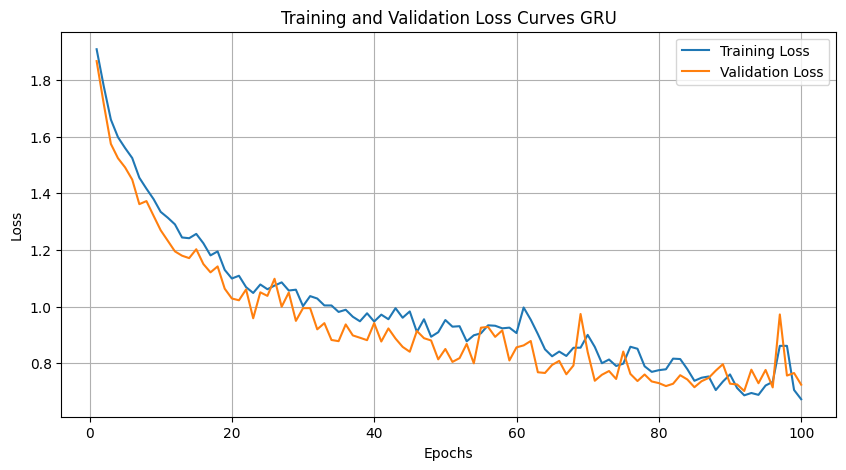

Epoch 1/100
11/11 [==============================] - 5s 128ms/step - loss: 1.9144 - accuracy: 0.2339 - val_loss: 1.8848 - val_accuracy: 0.2907
Epoch 2/100
11/11 [==============================] - 1s 69ms/step - loss: 1.7980 - accuracy: 0.3713 - val_loss: 1.7257 - val_accuracy: 0.3256
Epoch 3/100
11/11 [==============================] - 1s 68ms/step - loss: 1.6604 - accuracy: 0.3421 - val_loss: 1.5819 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 1s 70ms/step - loss: 1.5913 - accuracy: 0.3567 - val_loss: 1.5263 - val_accuracy: 0.3372
Epoch 5/100
11/11 [==============================] - 1s 71ms/step - loss: 1.5770 - accuracy: 0.3596 - val_loss: 1.4956 - val_accuracy: 0.3256
Epoch 6/100
11/11 [==============================] - 1s 70ms/step - loss: 1.5560 - accuracy: 0.3713 - val_loss: 1.4931 - val_accuracy: 0.3372
Epoch 7/100
11/11 [==============================] - 1s 65ms/step - loss: 1.4990 - accuracy: 0.4006 - val_loss: 1.4470 - val_accuracy: 0.3605
Epoch

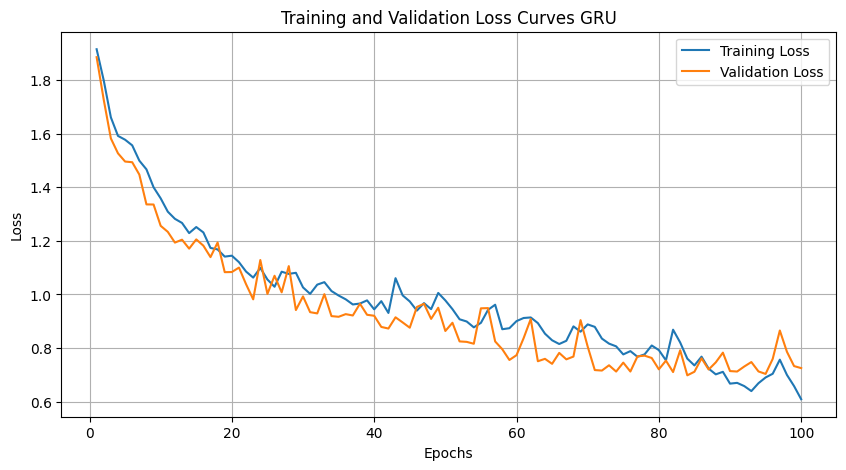

CLR for GRU is: 0.633644859813084


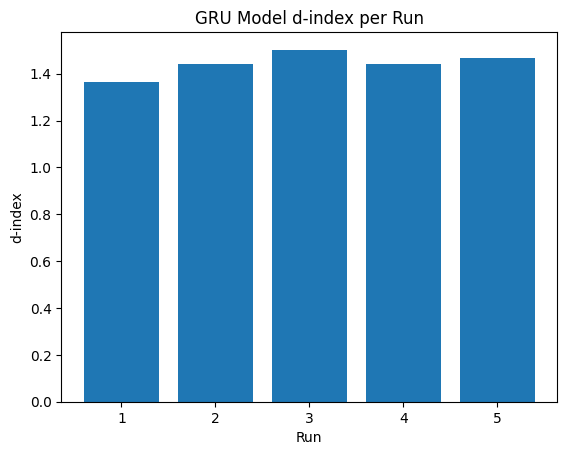

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method=None)

### PCA+TSNE DNN

Epoch 1/100
11/11 [==============================] - 1s 39ms/step - loss: 5.1238 - accuracy: 0.1140 - val_loss: 3.4234 - val_accuracy: 0.2558
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 3.9021 - accuracy: 0.1462 - val_loss: 2.5627 - val_accuracy: 0.1744
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 3.4035 - accuracy: 0.1404 - val_loss: 1.9978 - val_accuracy: 0.2326
Epoch 4/100
11/11 [==============================] - 0s 11ms/step - loss: 2.7395 - accuracy: 0.2018 - val_loss: 1.5675 - val_accuracy: 0.3140
Epoch 5/100
11/11 [==============================] - 0s 9ms/step - loss: 2.5231 - accuracy: 0.2105 - val_loss: 1.3432 - val_accuracy: 0.4419
Epoch 6/100
11/11 [==============================] - 0s 13ms/step - loss: 2.0086 - accuracy: 0.3450 - val_loss: 1.2822 - val_accuracy: 0.4419
Epoch 7/100
11/11 [==============================] - 0s 11ms/step - loss: 2.0805 - accuracy: 0.3099 - val_loss: 1.2465 - val_accuracy: 0.4302
Epoch 8

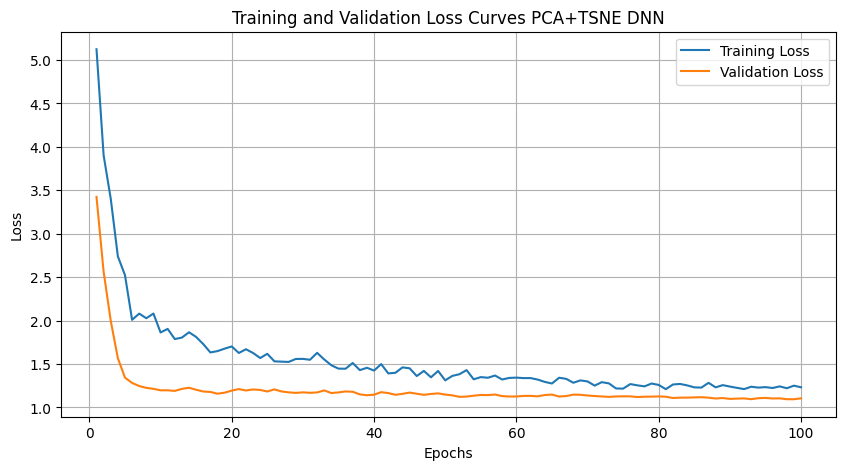

Epoch 1/100
11/11 [==============================] - 1s 25ms/step - loss: 5.0195 - accuracy: 0.1988 - val_loss: 4.3853 - val_accuracy: 0.2326
Epoch 2/100
11/11 [==============================] - 0s 8ms/step - loss: 4.1381 - accuracy: 0.2661 - val_loss: 3.4421 - val_accuracy: 0.2209
Epoch 3/100
11/11 [==============================] - 0s 9ms/step - loss: 3.6152 - accuracy: 0.2719 - val_loss: 2.8275 - val_accuracy: 0.2558
Epoch 4/100
11/11 [==============================] - 0s 6ms/step - loss: 3.0567 - accuracy: 0.3129 - val_loss: 2.3353 - val_accuracy: 0.2558
Epoch 5/100
11/11 [==============================] - 0s 7ms/step - loss: 2.7701 - accuracy: 0.2749 - val_loss: 1.9413 - val_accuracy: 0.2558
Epoch 6/100
11/11 [==============================] - 0s 7ms/step - loss: 2.4558 - accuracy: 0.3012 - val_loss: 1.7629 - val_accuracy: 0.1977
Epoch 7/100
11/11 [==============================] - 0s 7ms/step - loss: 2.4151 - accuracy: 0.3187 - val_loss: 1.6283 - val_accuracy: 0.3140
Epoch 8/100


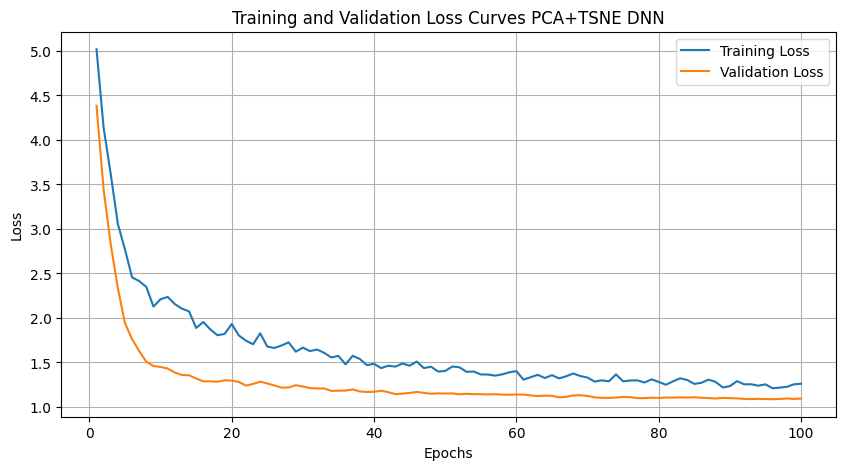

Epoch 1/100
11/11 [==============================] - 1s 33ms/step - loss: 4.2354 - accuracy: 0.1140 - val_loss: 2.0674 - val_accuracy: 0.2442
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 3.3439 - accuracy: 0.1754 - val_loss: 1.5604 - val_accuracy: 0.4186
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 2.8099 - accuracy: 0.2661 - val_loss: 1.3737 - val_accuracy: 0.4651
Epoch 4/100
11/11 [==============================] - 0s 10ms/step - loss: 2.6663 - accuracy: 0.2807 - val_loss: 1.3229 - val_accuracy: 0.4884
Epoch 5/100
11/11 [==============================] - 0s 11ms/step - loss: 2.4127 - accuracy: 0.2982 - val_loss: 1.2918 - val_accuracy: 0.4535
Epoch 6/100
11/11 [==============================] - 0s 9ms/step - loss: 2.3994 - accuracy: 0.2865 - val_loss: 1.3140 - val_accuracy: 0.4070
Epoch 7/100
11/11 [==============================] - 0s 10ms/step - loss: 2.1615 - accuracy: 0.3333 - val_loss: 1.2590 - val_accuracy: 0.4186
Epoch 8

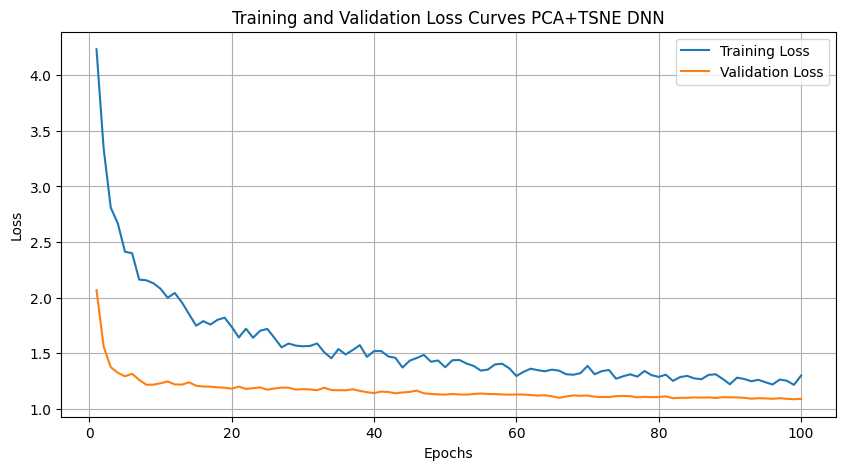

Epoch 1/100
11/11 [==============================] - 1s 36ms/step - loss: 5.4910 - accuracy: 0.1170 - val_loss: 3.8878 - val_accuracy: 0.0930
Epoch 2/100
11/11 [==============================] - 0s 12ms/step - loss: 4.1628 - accuracy: 0.1316 - val_loss: 2.5381 - val_accuracy: 0.2209
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 3.2218 - accuracy: 0.2485 - val_loss: 1.9153 - val_accuracy: 0.3837
Epoch 4/100
11/11 [==============================] - 0s 10ms/step - loss: 2.7653 - accuracy: 0.2924 - val_loss: 1.6097 - val_accuracy: 0.4070
Epoch 5/100
11/11 [==============================] - 0s 11ms/step - loss: 2.2604 - accuracy: 0.3304 - val_loss: 1.4509 - val_accuracy: 0.4651
Epoch 6/100
11/11 [==============================] - 0s 9ms/step - loss: 2.2486 - accuracy: 0.3216 - val_loss: 1.3774 - val_accuracy: 0.4419
Epoch 7/100
11/11 [==============================] - 0s 9ms/step - loss: 2.3167 - accuracy: 0.3099 - val_loss: 1.3241 - val_accuracy: 0.4419
Epoch 8/

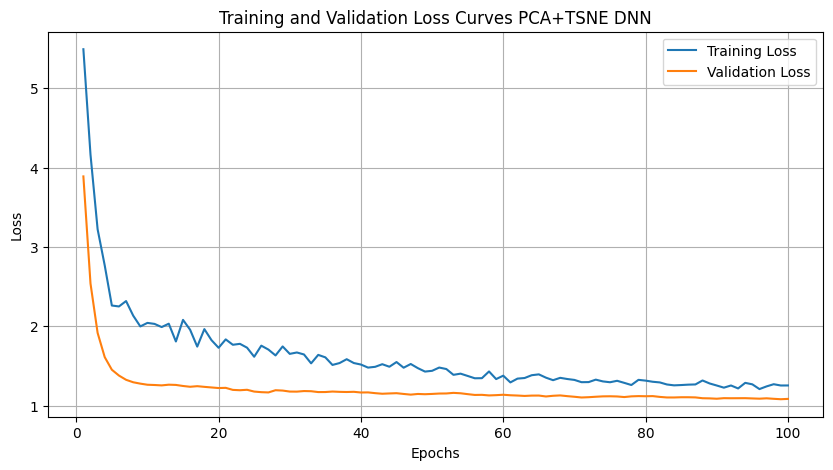

Epoch 1/100
11/11 [==============================] - 1s 24ms/step - loss: 5.0881 - accuracy: 0.0848 - val_loss: 3.4505 - val_accuracy: 0.0930
Epoch 2/100
11/11 [==============================] - 0s 8ms/step - loss: 3.8908 - accuracy: 0.1140 - val_loss: 2.3885 - val_accuracy: 0.2093
Epoch 3/100
11/11 [==============================] - 0s 6ms/step - loss: 2.8597 - accuracy: 0.1813 - val_loss: 1.9076 - val_accuracy: 0.2558
Epoch 4/100
11/11 [==============================] - 0s 9ms/step - loss: 2.5953 - accuracy: 0.2047 - val_loss: 1.6352 - val_accuracy: 0.3023
Epoch 5/100
11/11 [==============================] - 0s 9ms/step - loss: 2.2541 - accuracy: 0.2865 - val_loss: 1.4966 - val_accuracy: 0.3488
Epoch 6/100
11/11 [==============================] - 0s 9ms/step - loss: 2.2137 - accuracy: 0.2953 - val_loss: 1.4915 - val_accuracy: 0.3140
Epoch 7/100
11/11 [==============================] - 0s 7ms/step - loss: 2.1085 - accuracy: 0.3216 - val_loss: 1.4269 - val_accuracy: 0.3256
Epoch 8/100


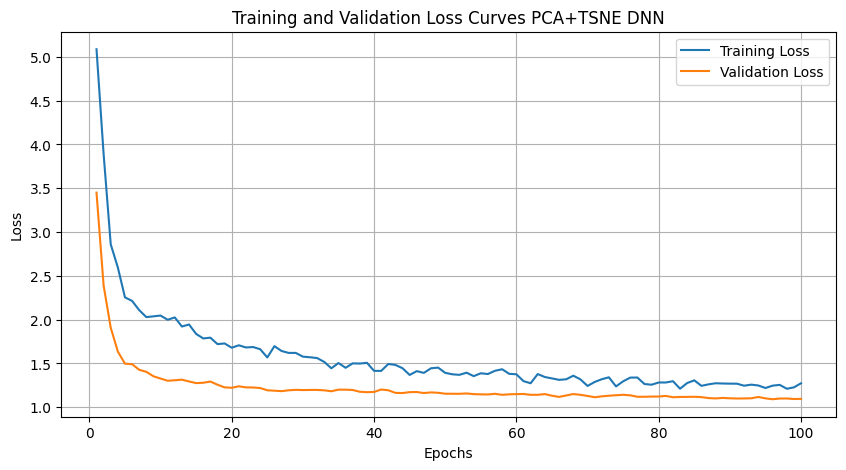

CLR for PCA+TSNE DNN is: 0.4934579439252336


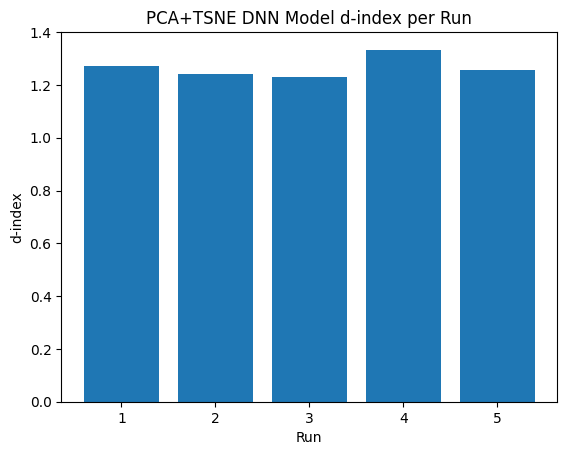

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE CNN

Epoch 1/100
11/11 [==============================] - 3s 33ms/step - loss: 2.1157 - accuracy: 0.2778 - val_loss: 1.4467 - val_accuracy: 0.4767
Epoch 2/100
11/11 [==============================] - 0s 7ms/step - loss: 1.5735 - accuracy: 0.3596 - val_loss: 1.3107 - val_accuracy: 0.3721
Epoch 3/100
11/11 [==============================] - 0s 7ms/step - loss: 1.4973 - accuracy: 0.3801 - val_loss: 1.2590 - val_accuracy: 0.3837
Epoch 4/100
11/11 [==============================] - 0s 10ms/step - loss: 1.4442 - accuracy: 0.4240 - val_loss: 1.2422 - val_accuracy: 0.5116
Epoch 5/100
11/11 [==============================] - 0s 27ms/step - loss: 1.4175 - accuracy: 0.4152 - val_loss: 1.2135 - val_accuracy: 0.4302
Epoch 6/100
11/11 [==============================] - 0s 24ms/step - loss: 1.4333 - accuracy: 0.3713 - val_loss: 1.2541 - val_accuracy: 0.4535
Epoch 7/100
11/11 [==============================] - 0s 34ms/step - loss: 1.3714 - accuracy: 0.4269 - val_loss: 1.1739 - val_accuracy: 0.5116
Epoch 8/

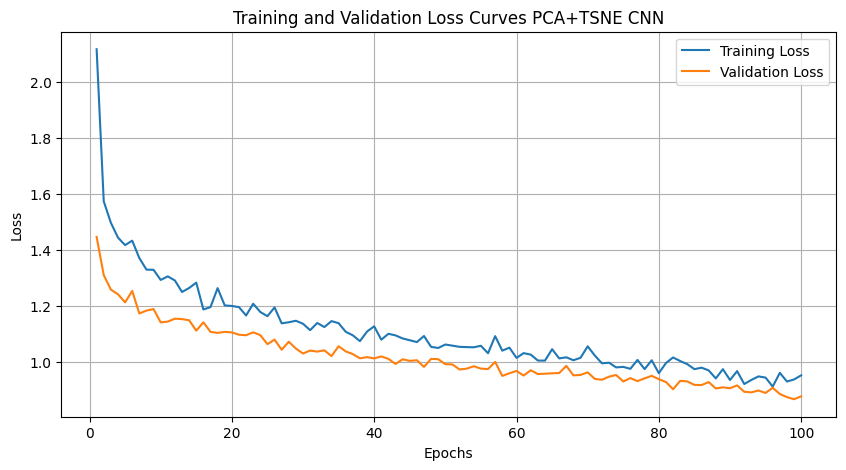

Epoch 1/100
11/11 [==============================] - 1s 40ms/step - loss: 2.1628 - accuracy: 0.2222 - val_loss: 1.4833 - val_accuracy: 0.3488
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 1.6694 - accuracy: 0.3129 - val_loss: 1.3399 - val_accuracy: 0.4186
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 1.5452 - accuracy: 0.3713 - val_loss: 1.2504 - val_accuracy: 0.4651
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4096 - accuracy: 0.4327 - val_loss: 1.2759 - val_accuracy: 0.4070
Epoch 5/100
11/11 [==============================] - 0s 11ms/step - loss: 1.4460 - accuracy: 0.4240 - val_loss: 1.1922 - val_accuracy: 0.3837
Epoch 6/100
11/11 [==============================] - 0s 15ms/step - loss: 1.3817 - accuracy: 0.4269 - val_loss: 1.2315 - val_accuracy: 0.4302
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 1.3591 - accuracy: 0.4474 - val_loss: 1.1642 - val_accuracy: 0.4535
Epoch 

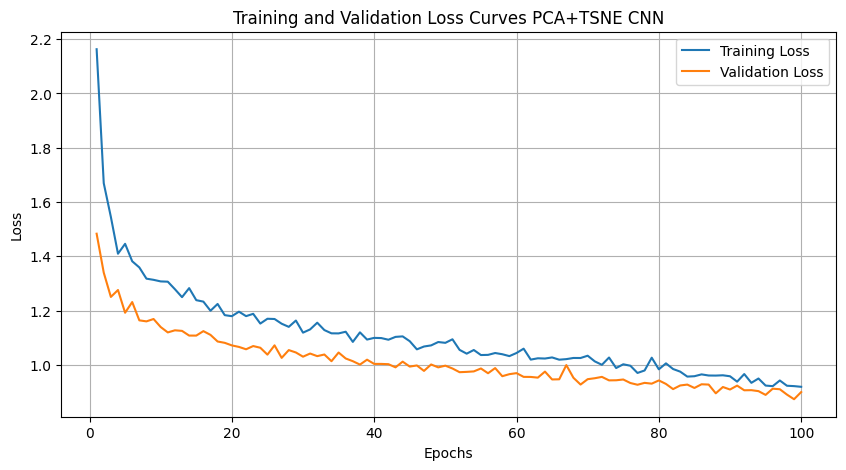

Epoch 1/100
11/11 [==============================] - 2s 42ms/step - loss: 2.0078 - accuracy: 0.2632 - val_loss: 1.3783 - val_accuracy: 0.4419
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 1.5463 - accuracy: 0.3801 - val_loss: 1.2969 - val_accuracy: 0.4767
Epoch 3/100
11/11 [==============================] - 0s 10ms/step - loss: 1.4420 - accuracy: 0.3567 - val_loss: 1.2010 - val_accuracy: 0.4535
Epoch 4/100
11/11 [==============================] - 0s 10ms/step - loss: 1.4542 - accuracy: 0.3889 - val_loss: 1.2152 - val_accuracy: 0.4651
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3820 - accuracy: 0.4064 - val_loss: 1.2205 - val_accuracy: 0.4302
Epoch 6/100
11/11 [==============================] - 0s 11ms/step - loss: 1.3426 - accuracy: 0.4825 - val_loss: 1.2079 - val_accuracy: 0.4302
Epoch 7/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3444 - accuracy: 0.4503 - val_loss: 1.1777 - val_accuracy: 0.4767
Epoch 

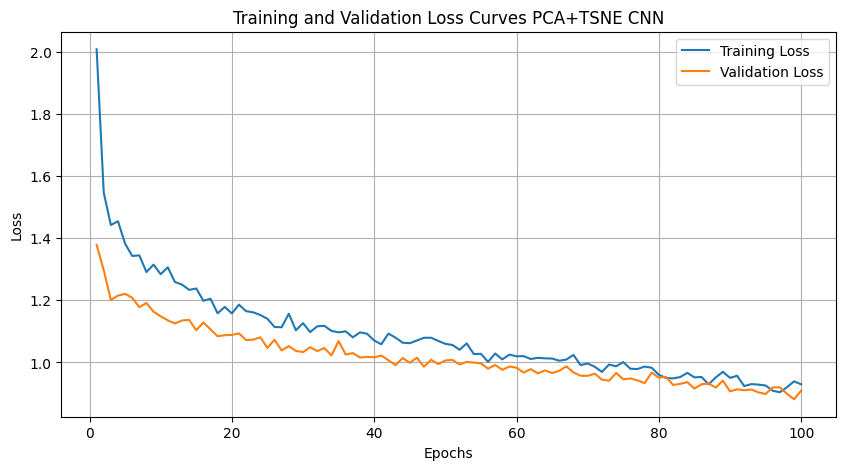

Epoch 1/100
11/11 [==============================] - 1s 28ms/step - loss: 2.7380 - accuracy: 0.1696 - val_loss: 1.5873 - val_accuracy: 0.3721
Epoch 2/100
11/11 [==============================] - 0s 7ms/step - loss: 1.6983 - accuracy: 0.3743 - val_loss: 1.3675 - val_accuracy: 0.3721
Epoch 3/100
11/11 [==============================] - 0s 9ms/step - loss: 1.5584 - accuracy: 0.3918 - val_loss: 1.2370 - val_accuracy: 0.4767
Epoch 4/100
11/11 [==============================] - 0s 9ms/step - loss: 1.4741 - accuracy: 0.4064 - val_loss: 1.2347 - val_accuracy: 0.4767
Epoch 5/100
11/11 [==============================] - 0s 9ms/step - loss: 1.4160 - accuracy: 0.4211 - val_loss: 1.2032 - val_accuracy: 0.4186
Epoch 6/100
11/11 [==============================] - 0s 7ms/step - loss: 1.3830 - accuracy: 0.4357 - val_loss: 1.2247 - val_accuracy: 0.3953
Epoch 7/100
11/11 [==============================] - 0s 7ms/step - loss: 1.3342 - accuracy: 0.4591 - val_loss: 1.1808 - val_accuracy: 0.4767
Epoch 8/100


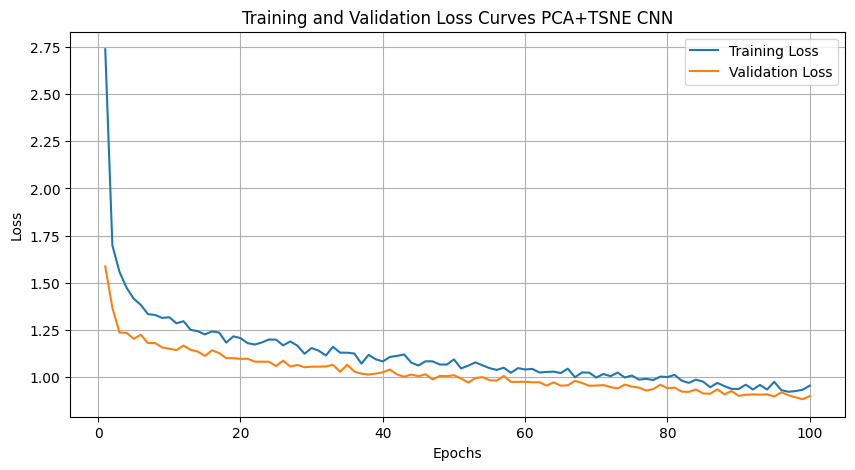

Epoch 1/100
11/11 [==============================] - 2s 42ms/step - loss: 2.1013 - accuracy: 0.2544 - val_loss: 1.4006 - val_accuracy: 0.4419
Epoch 2/100
11/11 [==============================] - 0s 12ms/step - loss: 1.5990 - accuracy: 0.3889 - val_loss: 1.3507 - val_accuracy: 0.3488
Epoch 3/100
11/11 [==============================] - 0s 15ms/step - loss: 1.4683 - accuracy: 0.3860 - val_loss: 1.2168 - val_accuracy: 0.4419
Epoch 4/100
11/11 [==============================] - 0s 15ms/step - loss: 1.4383 - accuracy: 0.4269 - val_loss: 1.2302 - val_accuracy: 0.5116
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4031 - accuracy: 0.4357 - val_loss: 1.1759 - val_accuracy: 0.4070
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3917 - accuracy: 0.4474 - val_loss: 1.2134 - val_accuracy: 0.5000
Epoch 7/100
11/11 [==============================] - 0s 13ms/step - loss: 1.3057 - accuracy: 0.4649 - val_loss: 1.1597 - val_accuracy: 0.4651
Epoch 

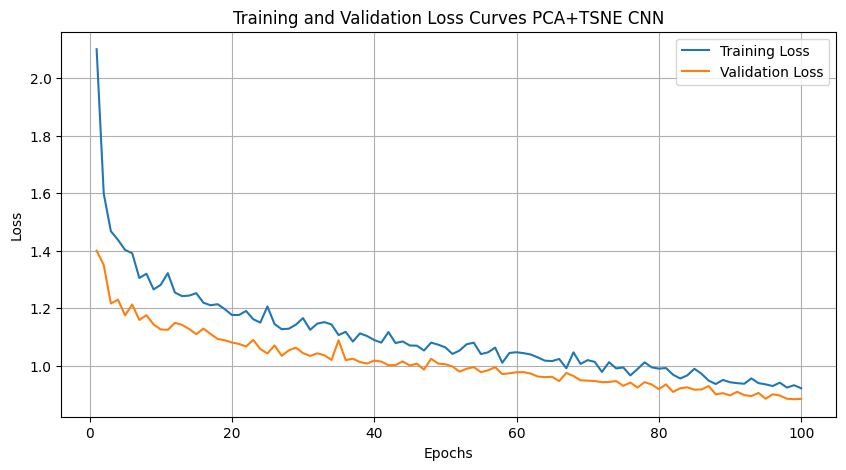

CLR for PCA+TSNE CNN is: 0.5401869158878504


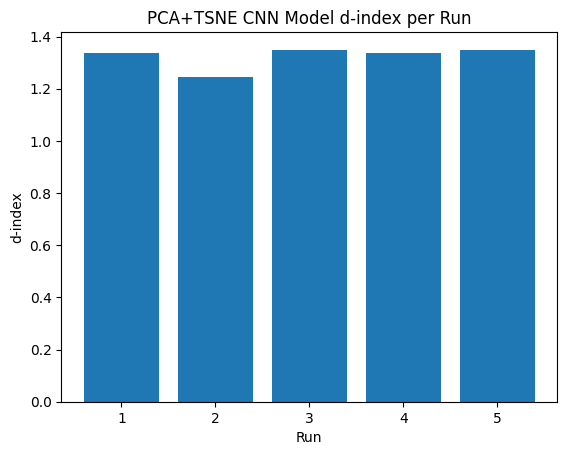

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE LSTM

Epoch 1/100
11/11 [==============================] - 6s 116ms/step - loss: 1.9297 - accuracy: 0.1696 - val_loss: 1.8986 - val_accuracy: 0.2907
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8932 - accuracy: 0.2895 - val_loss: 1.8589 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8540 - accuracy: 0.2924 - val_loss: 1.8066 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 0s 15ms/step - loss: 1.8143 - accuracy: 0.2924 - val_loss: 1.7390 - val_accuracy: 0.2907
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.7415 - accuracy: 0.2953 - val_loss: 1.6764 - val_accuracy: 0.2907
Epoch 6/100
11/11 [==============================] - 0s 13ms/step - loss: 1.6997 - accuracy: 0.2982 - val_loss: 1.6373 - val_accuracy: 0.2907
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 1.6846 - accuracy: 0.3041 - val_loss: 1.5899 - val_accuracy: 0.2907
Epoch

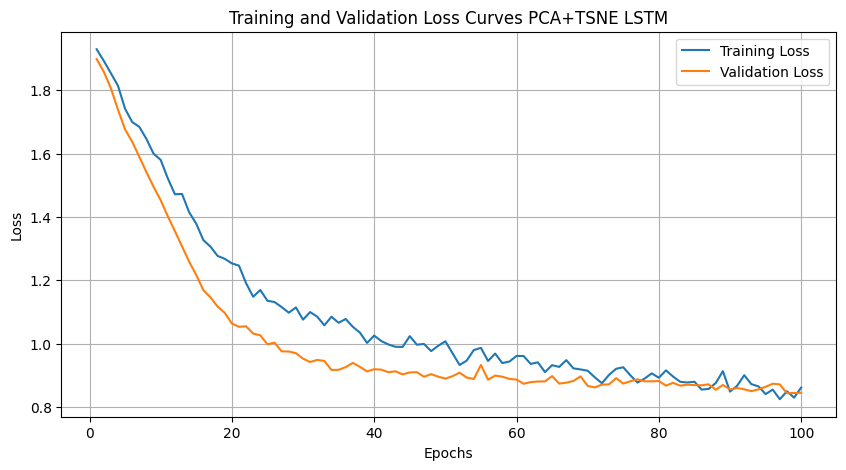

Epoch 1/100
11/11 [==============================] - 8s 131ms/step - loss: 1.9342 - accuracy: 0.2076 - val_loss: 1.9034 - val_accuracy: 0.2791
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 1.8974 - accuracy: 0.2602 - val_loss: 1.8592 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8529 - accuracy: 0.2749 - val_loss: 1.8042 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 1.8012 - accuracy: 0.2982 - val_loss: 1.7364 - val_accuracy: 0.2907
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.7285 - accuracy: 0.3158 - val_loss: 1.6692 - val_accuracy: 0.2907
Epoch 6/100
11/11 [==============================] - 0s 14ms/step - loss: 1.6888 - accuracy: 0.3158 - val_loss: 1.6246 - val_accuracy: 0.2907
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 1.6285 - accuracy: 0.3158 - val_loss: 1.5819 - val_accuracy: 0.3023
Epoch

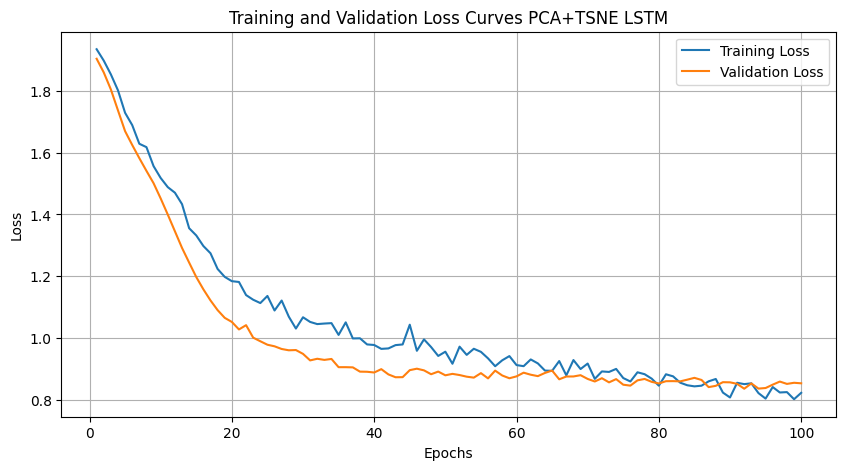

Epoch 1/100
11/11 [==============================] - 6s 114ms/step - loss: 1.9322 - accuracy: 0.1901 - val_loss: 1.8952 - val_accuracy: 0.2907
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 1.8893 - accuracy: 0.2982 - val_loss: 1.8326 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8347 - accuracy: 0.2953 - val_loss: 1.7583 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.7874 - accuracy: 0.3041 - val_loss: 1.6842 - val_accuracy: 0.2907
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.7115 - accuracy: 0.3129 - val_loss: 1.6233 - val_accuracy: 0.2907
Epoch 6/100
11/11 [==============================] - 0s 17ms/step - loss: 1.6651 - accuracy: 0.3187 - val_loss: 1.5700 - val_accuracy: 0.3023
Epoch 7/100
11/11 [==============================] - 0s 19ms/step - loss: 1.6419 - accuracy: 0.3187 - val_loss: 1.5109 - val_accuracy: 0.3372
Epoch

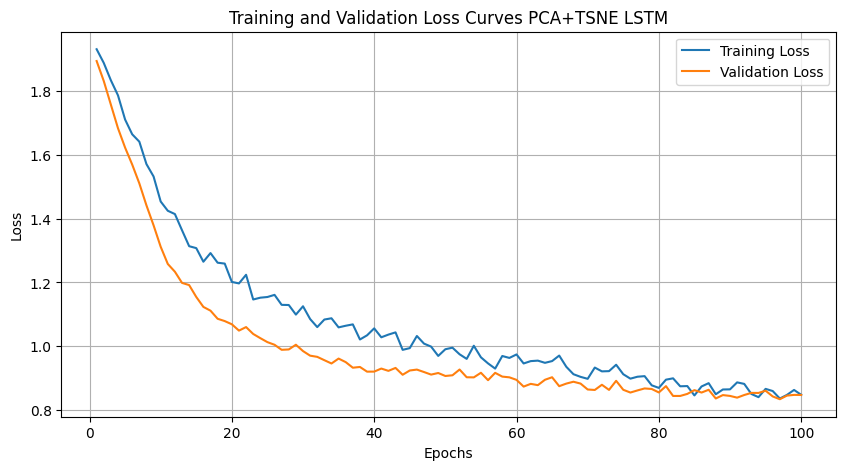

Epoch 1/100
11/11 [==============================] - 7s 113ms/step - loss: 1.9323 - accuracy: 0.2222 - val_loss: 1.9073 - val_accuracy: 0.1977
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8923 - accuracy: 0.2427 - val_loss: 1.8491 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8407 - accuracy: 0.2982 - val_loss: 1.7841 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.7951 - accuracy: 0.3129 - val_loss: 1.7108 - val_accuracy: 0.2907
Epoch 5/100
11/11 [==============================] - 0s 16ms/step - loss: 1.7222 - accuracy: 0.3041 - val_loss: 1.6562 - val_accuracy: 0.2907
Epoch 6/100
11/11 [==============================] - 0s 15ms/step - loss: 1.6934 - accuracy: 0.3070 - val_loss: 1.6178 - val_accuracy: 0.2907
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 1.6403 - accuracy: 0.3187 - val_loss: 1.5736 - val_accuracy: 0.3140
Epoch

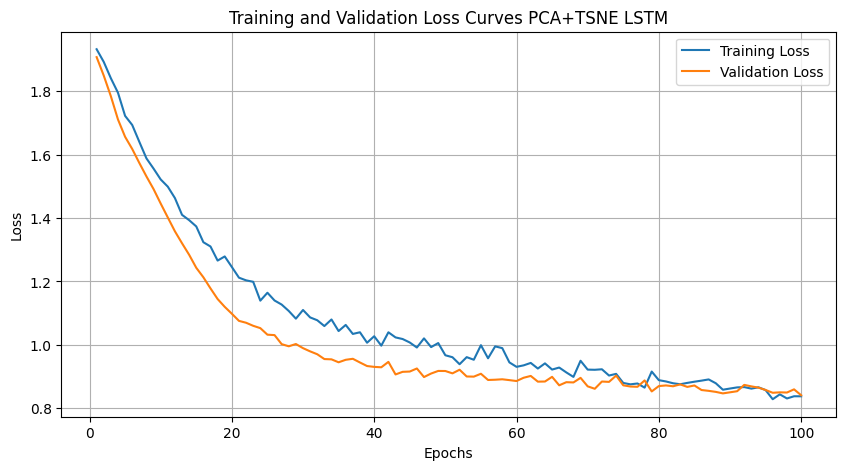

Epoch 1/100
11/11 [==============================] - 7s 117ms/step - loss: 1.9289 - accuracy: 0.1901 - val_loss: 1.9037 - val_accuracy: 0.2326
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 1.8817 - accuracy: 0.2924 - val_loss: 1.8457 - val_accuracy: 0.3140
Epoch 3/100
11/11 [==============================] - 0s 15ms/step - loss: 1.8255 - accuracy: 0.3012 - val_loss: 1.7766 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.7847 - accuracy: 0.2953 - val_loss: 1.7033 - val_accuracy: 0.2907
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.7255 - accuracy: 0.2895 - val_loss: 1.6482 - val_accuracy: 0.2907
Epoch 6/100
11/11 [==============================] - 0s 17ms/step - loss: 1.6676 - accuracy: 0.3041 - val_loss: 1.6069 - val_accuracy: 0.3023
Epoch 7/100
11/11 [==============================] - 0s 16ms/step - loss: 1.6386 - accuracy: 0.3158 - val_loss: 1.5617 - val_accuracy: 0.3372
Epoch

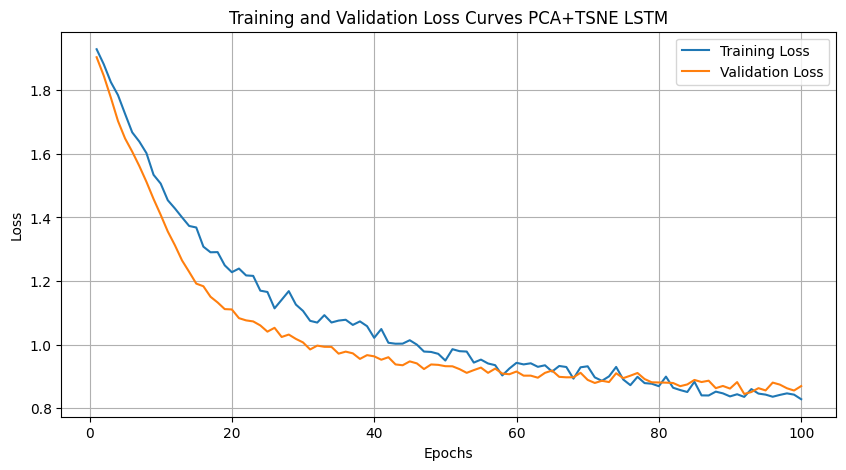

CLR for PCA+TSNE LSTM is: 0.6130841121495327


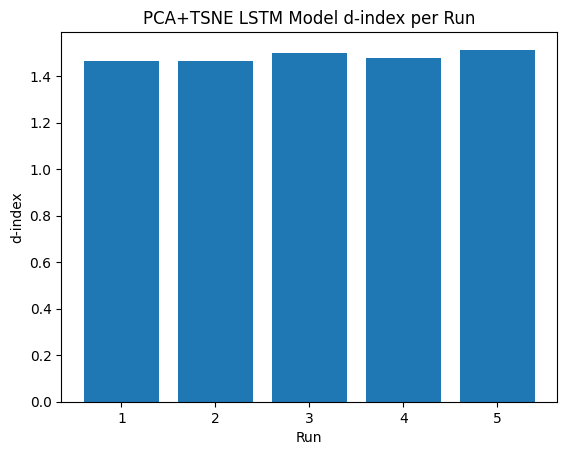

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE GRU

Epoch 1/100
11/11 [==============================] - 2s 43ms/step - loss: 2.1023 - accuracy: 0.1579 - val_loss: 1.8012 - val_accuracy: 0.1744
Epoch 2/100
11/11 [==============================] - 0s 12ms/step - loss: 1.7095 - accuracy: 0.2953 - val_loss: 1.5022 - val_accuracy: 0.3488
Epoch 3/100
11/11 [==============================] - 0s 10ms/step - loss: 1.5660 - accuracy: 0.3275 - val_loss: 1.3723 - val_accuracy: 0.4070
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4775 - accuracy: 0.3743 - val_loss: 1.3307 - val_accuracy: 0.4535
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4241 - accuracy: 0.4006 - val_loss: 1.2894 - val_accuracy: 0.4302
Epoch 6/100
11/11 [==============================] - 0s 11ms/step - loss: 1.4089 - accuracy: 0.3713 - val_loss: 1.2751 - val_accuracy: 0.4302
Epoch 7/100
11/11 [==============================] - 0s 11ms/step - loss: 1.4032 - accuracy: 0.3655 - val_loss: 1.2313 - val_accuracy: 0.4884
Epoch 

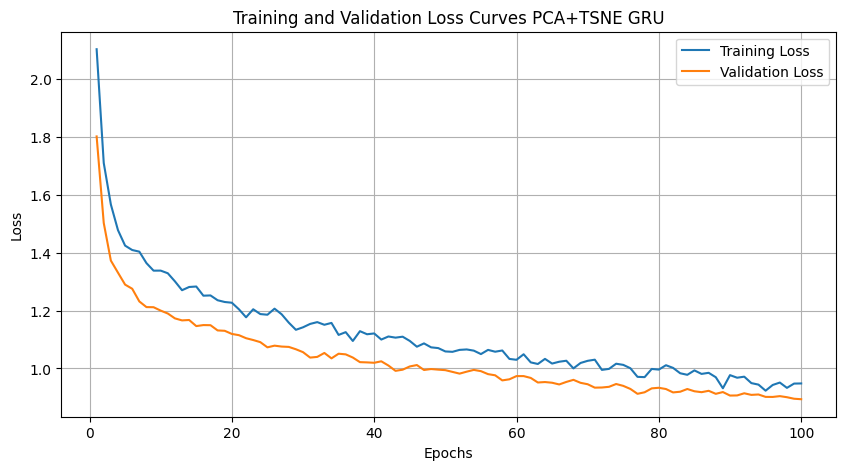

Epoch 1/100
11/11 [==============================] - 3s 61ms/step - loss: 2.3566 - accuracy: 0.1053 - val_loss: 2.0191 - val_accuracy: 0.2326
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8536 - accuracy: 0.2953 - val_loss: 1.6391 - val_accuracy: 0.3721
Epoch 3/100
11/11 [==============================] - 0s 17ms/step - loss: 1.6123 - accuracy: 0.3801 - val_loss: 1.4477 - val_accuracy: 0.4070
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4926 - accuracy: 0.3743 - val_loss: 1.3560 - val_accuracy: 0.4186
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 1.4161 - accuracy: 0.4181 - val_loss: 1.2863 - val_accuracy: 0.3953
Epoch 6/100
11/11 [==============================] - 0s 13ms/step - loss: 1.4449 - accuracy: 0.4006 - val_loss: 1.2811 - val_accuracy: 0.4070
Epoch 7/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3657 - accuracy: 0.4444 - val_loss: 1.2520 - val_accuracy: 0.3953
Epoch 

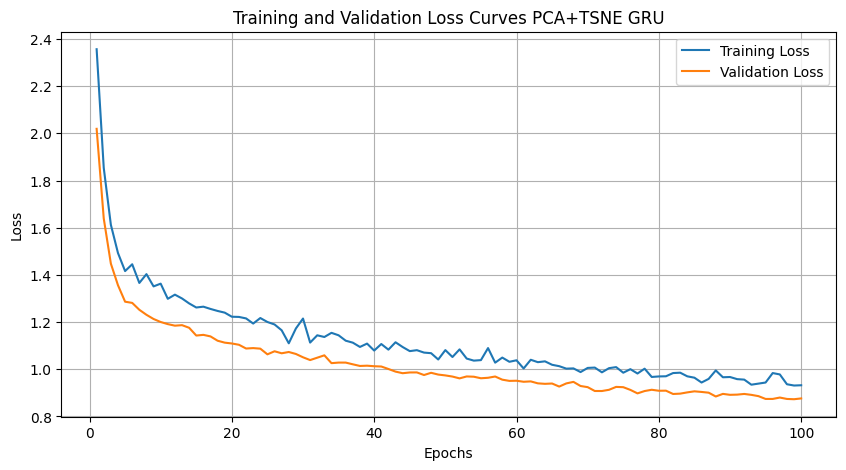

Epoch 1/100
11/11 [==============================] - 2s 43ms/step - loss: 2.0722 - accuracy: 0.1637 - val_loss: 1.6360 - val_accuracy: 0.2791
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 1.6026 - accuracy: 0.3304 - val_loss: 1.3676 - val_accuracy: 0.4535
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4786 - accuracy: 0.3918 - val_loss: 1.2869 - val_accuracy: 0.5233
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4835 - accuracy: 0.3655 - val_loss: 1.2752 - val_accuracy: 0.4535
Epoch 5/100
11/11 [==============================] - 0s 11ms/step - loss: 1.4321 - accuracy: 0.3918 - val_loss: 1.2491 - val_accuracy: 0.4419
Epoch 6/100
11/11 [==============================] - 0s 11ms/step - loss: 1.3924 - accuracy: 0.4211 - val_loss: 1.2515 - val_accuracy: 0.4535
Epoch 7/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3614 - accuracy: 0.3947 - val_loss: 1.2237 - val_accuracy: 0.5000
Epoch 

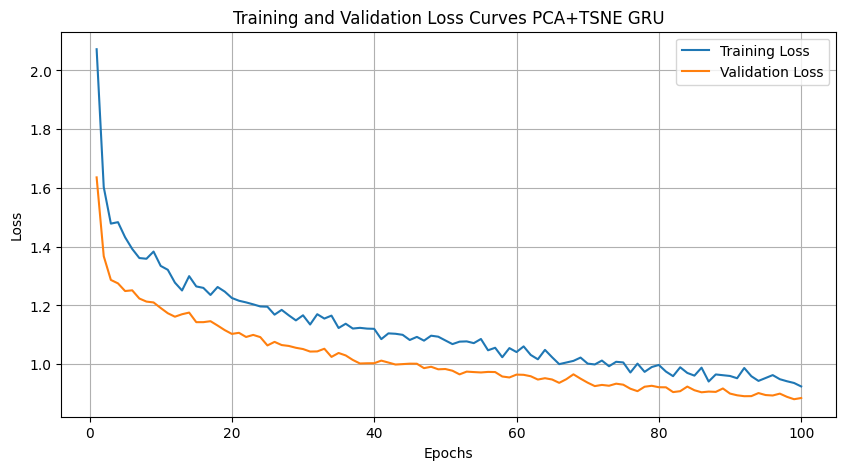

Epoch 1/100
11/11 [==============================] - 2s 55ms/step - loss: 1.9271 - accuracy: 0.2251 - val_loss: 1.6268 - val_accuracy: 0.4070
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 1.5967 - accuracy: 0.3333 - val_loss: 1.4587 - val_accuracy: 0.3953
Epoch 3/100
11/11 [==============================] - 0s 16ms/step - loss: 1.5084 - accuracy: 0.3947 - val_loss: 1.3747 - val_accuracy: 0.3721
Epoch 4/100
11/11 [==============================] - 0s 15ms/step - loss: 1.4615 - accuracy: 0.3860 - val_loss: 1.3306 - val_accuracy: 0.4767
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4152 - accuracy: 0.3830 - val_loss: 1.2749 - val_accuracy: 0.5116
Epoch 6/100
11/11 [==============================] - 0s 13ms/step - loss: 1.4270 - accuracy: 0.3977 - val_loss: 1.2766 - val_accuracy: 0.4302
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 1.3877 - accuracy: 0.4357 - val_loss: 1.2601 - val_accuracy: 0.4535
Epoch 

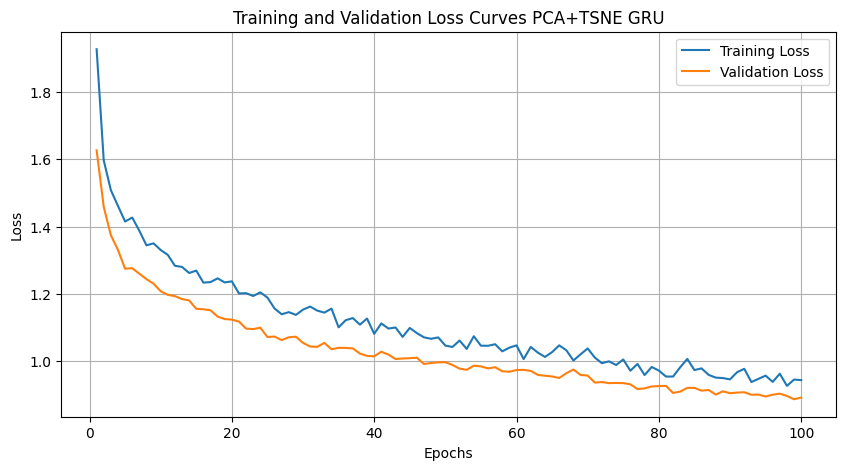

Epoch 1/100
11/11 [==============================] - 2s 41ms/step - loss: 2.2423 - accuracy: 0.0936 - val_loss: 1.8435 - val_accuracy: 0.1279
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 1.8117 - accuracy: 0.2076 - val_loss: 1.5338 - val_accuracy: 0.3256
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 1.5410 - accuracy: 0.3596 - val_loss: 1.4211 - val_accuracy: 0.3605
Epoch 4/100
11/11 [==============================] - 0s 24ms/step - loss: 1.5227 - accuracy: 0.3743 - val_loss: 1.3692 - val_accuracy: 0.4535
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4617 - accuracy: 0.3889 - val_loss: 1.3222 - val_accuracy: 0.3837
Epoch 6/100
11/11 [==============================] - 0s 15ms/step - loss: 1.4047 - accuracy: 0.4181 - val_loss: 1.3155 - val_accuracy: 0.3953
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4117 - accuracy: 0.4181 - val_loss: 1.2757 - val_accuracy: 0.3721
Epoch 

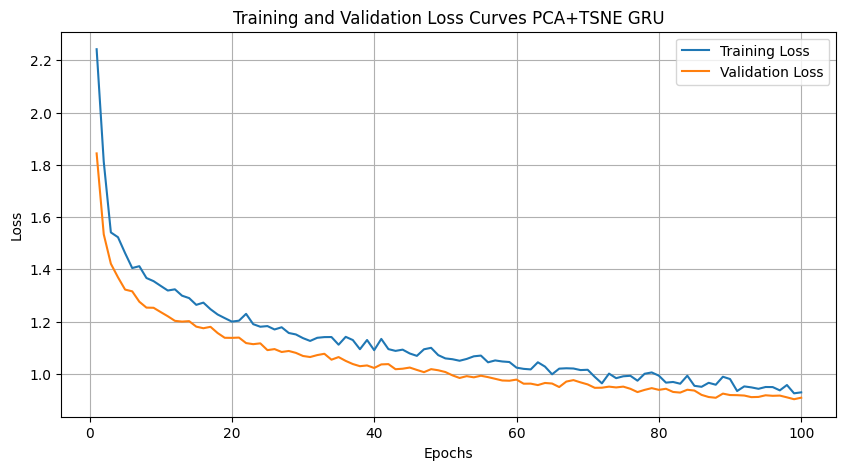

CLR for PCA+TSNE GRU is: 0.5644859813084111


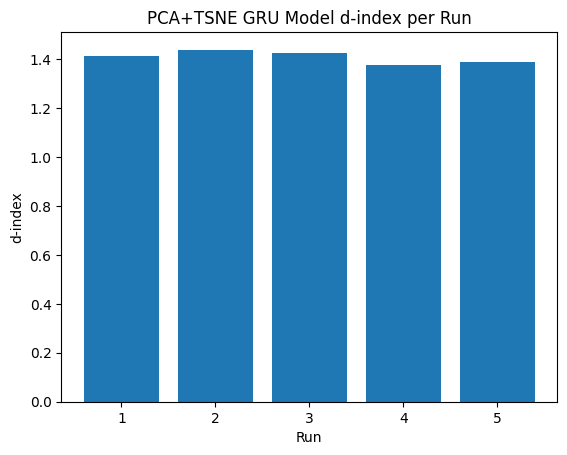

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE 7 LAYER DNN

Epoch 1/100
11/11 [==============================] - 2s 38ms/step - loss: 1.7841 - accuracy: 0.2807 - val_loss: 1.4372 - val_accuracy: 0.4535
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 1.5802 - accuracy: 0.3889 - val_loss: 1.4441 - val_accuracy: 0.3256
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4727 - accuracy: 0.3918 - val_loss: 1.3278 - val_accuracy: 0.3837
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4089 - accuracy: 0.4532 - val_loss: 1.2421 - val_accuracy: 0.4651
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 1.3903 - accuracy: 0.4152 - val_loss: 1.2193 - val_accuracy: 0.4070
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3618 - accuracy: 0.4503 - val_loss: 1.2313 - val_accuracy: 0.4070
Epoch 7/100
11/11 [==============================] - 0s 15ms/step - loss: 1.3478 - accuracy: 0.4298 - val_loss: 1.2253 - val_accuracy: 0.4535
Epoch 

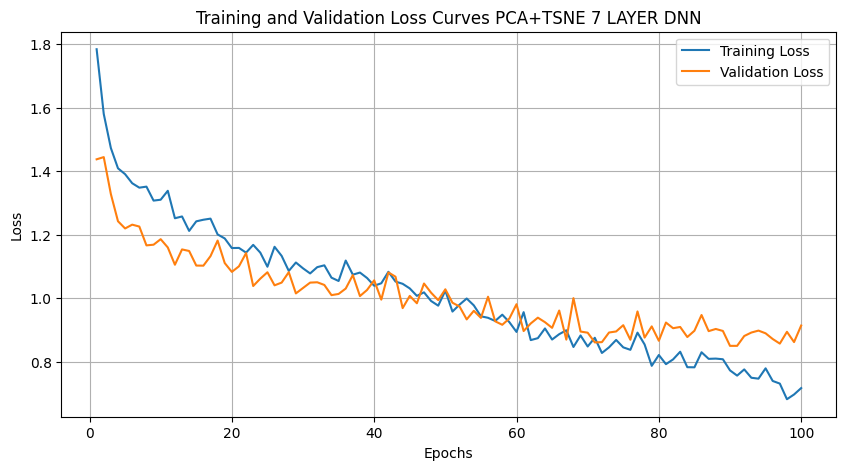

Epoch 1/100
11/11 [==============================] - 2s 49ms/step - loss: 1.7260 - accuracy: 0.3246 - val_loss: 1.3853 - val_accuracy: 0.4186
Epoch 2/100
11/11 [==============================] - 0s 20ms/step - loss: 1.5084 - accuracy: 0.3918 - val_loss: 1.3668 - val_accuracy: 0.3721
Epoch 3/100
11/11 [==============================] - 0s 18ms/step - loss: 1.4081 - accuracy: 0.4181 - val_loss: 1.2586 - val_accuracy: 0.4419
Epoch 4/100
11/11 [==============================] - 0s 21ms/step - loss: 1.4625 - accuracy: 0.4035 - val_loss: 1.2993 - val_accuracy: 0.4884
Epoch 5/100
11/11 [==============================] - 0s 18ms/step - loss: 1.4023 - accuracy: 0.4386 - val_loss: 1.2205 - val_accuracy: 0.4535
Epoch 6/100
11/11 [==============================] - 0s 20ms/step - loss: 1.3887 - accuracy: 0.4591 - val_loss: 1.2617 - val_accuracy: 0.4419
Epoch 7/100
11/11 [==============================] - 0s 20ms/step - loss: 1.2906 - accuracy: 0.5000 - val_loss: 1.1917 - val_accuracy: 0.4767
Epoch 

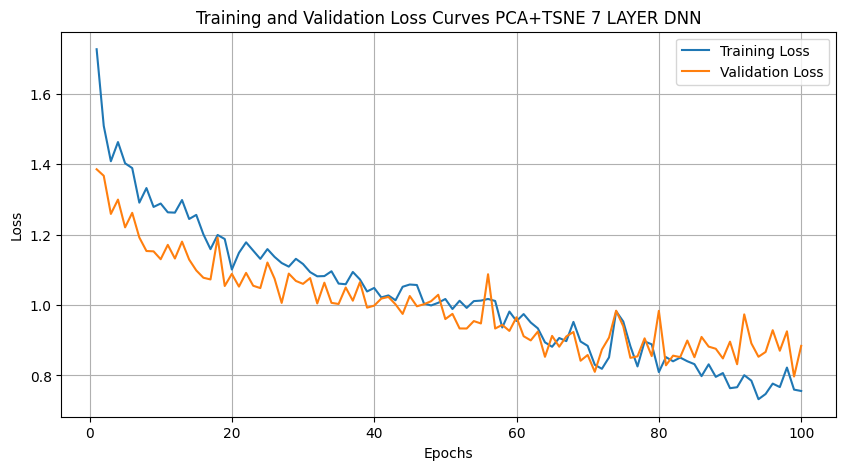

Epoch 1/100
11/11 [==============================] - 2s 36ms/step - loss: 1.8703 - accuracy: 0.2661 - val_loss: 1.5433 - val_accuracy: 0.3605
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 1.6020 - accuracy: 0.3567 - val_loss: 1.4079 - val_accuracy: 0.4767
Epoch 3/100
11/11 [==============================] - 0s 16ms/step - loss: 1.5859 - accuracy: 0.3684 - val_loss: 1.3122 - val_accuracy: 0.5000
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.5453 - accuracy: 0.3977 - val_loss: 1.3316 - val_accuracy: 0.4186
Epoch 5/100
11/11 [==============================] - 0s 15ms/step - loss: 1.4779 - accuracy: 0.4181 - val_loss: 1.3113 - val_accuracy: 0.4767
Epoch 6/100
11/11 [==============================] - 0s 16ms/step - loss: 1.3977 - accuracy: 0.4883 - val_loss: 1.2588 - val_accuracy: 0.5116
Epoch 7/100
11/11 [==============================] - 0s 15ms/step - loss: 1.3388 - accuracy: 0.4444 - val_loss: 1.2104 - val_accuracy: 0.4884
Epoch 

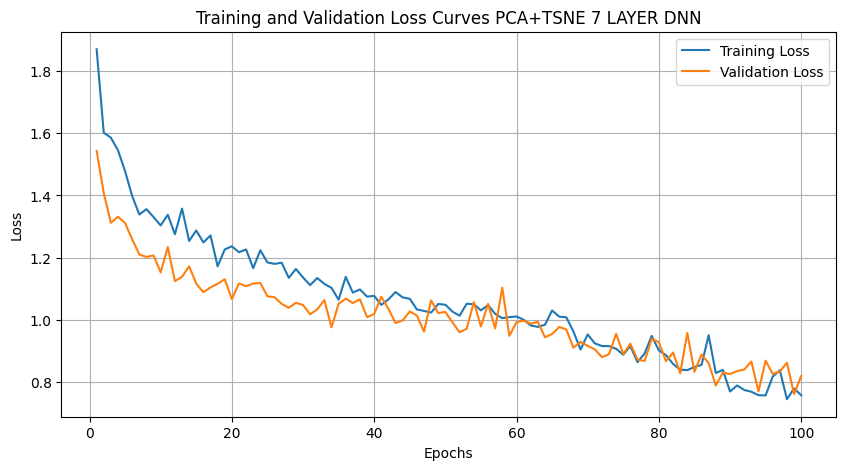

Epoch 1/100
11/11 [==============================] - 2s 34ms/step - loss: 1.7329 - accuracy: 0.2953 - val_loss: 1.3803 - val_accuracy: 0.5000
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 1.5096 - accuracy: 0.3684 - val_loss: 1.3123 - val_accuracy: 0.4767
Epoch 3/100
11/11 [==============================] - 0s 15ms/step - loss: 1.4530 - accuracy: 0.4064 - val_loss: 1.2459 - val_accuracy: 0.5116
Epoch 4/100
11/11 [==============================] - 0s 15ms/step - loss: 1.3702 - accuracy: 0.4327 - val_loss: 1.2054 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4157 - accuracy: 0.4211 - val_loss: 1.1866 - val_accuracy: 0.4535
Epoch 6/100
11/11 [==============================] - 0s 15ms/step - loss: 1.3234 - accuracy: 0.4240 - val_loss: 1.2383 - val_accuracy: 0.5349
Epoch 7/100
11/11 [==============================] - 0s 15ms/step - loss: 1.2932 - accuracy: 0.4620 - val_loss: 1.1629 - val_accuracy: 0.5000
Epoch 

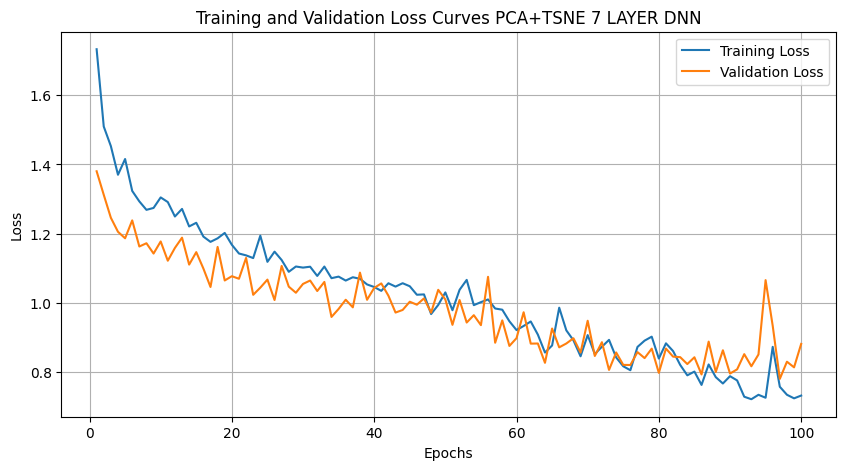

Epoch 1/100
11/11 [==============================] - 2s 38ms/step - loss: 1.6392 - accuracy: 0.3129 - val_loss: 1.3649 - val_accuracy: 0.4884
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4697 - accuracy: 0.4123 - val_loss: 1.2876 - val_accuracy: 0.4302
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4182 - accuracy: 0.3772 - val_loss: 1.2483 - val_accuracy: 0.4186
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.3524 - accuracy: 0.4386 - val_loss: 1.2267 - val_accuracy: 0.4186
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 1.3446 - accuracy: 0.4123 - val_loss: 1.1583 - val_accuracy: 0.4302
Epoch 6/100
11/11 [==============================] - 0s 16ms/step - loss: 1.3036 - accuracy: 0.4444 - val_loss: 1.2059 - val_accuracy: 0.4419
Epoch 7/100
11/11 [==============================] - 0s 16ms/step - loss: 1.2934 - accuracy: 0.4620 - val_loss: 1.2095 - val_accuracy: 0.4302
Epoch 

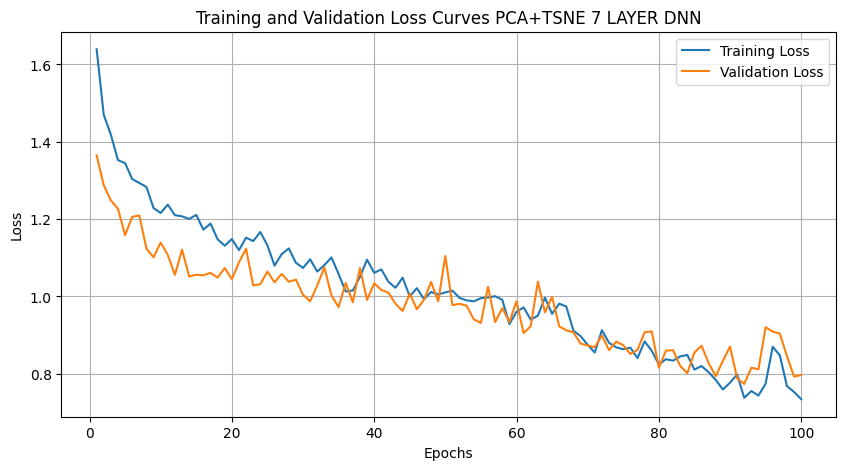

CLR for PCA+TSNE 7 LAYER DNN is: 0.5831775700934579


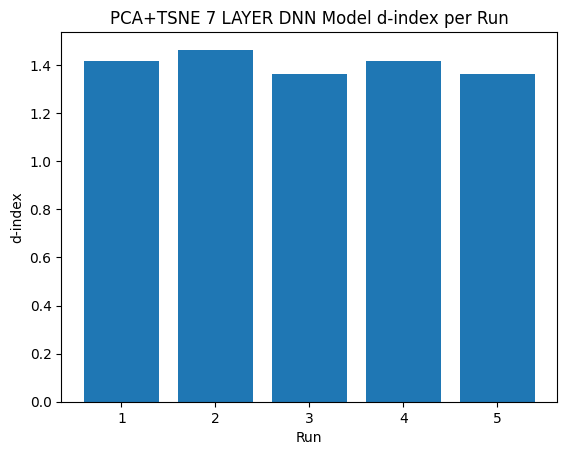

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER CNN

Epoch 1/100
11/11 [==============================] - 1s 38ms/step - loss: 2.0271 - accuracy: 0.3041 - val_loss: 1.3998 - val_accuracy: 0.4767
Epoch 2/100
11/11 [==============================] - 0s 14ms/step - loss: 1.5710 - accuracy: 0.3772 - val_loss: 1.3233 - val_accuracy: 0.3837
Epoch 3/100
11/11 [==============================] - 0s 10ms/step - loss: 1.5093 - accuracy: 0.3596 - val_loss: 1.2299 - val_accuracy: 0.4651
Epoch 4/100
11/11 [==============================] - 0s 9ms/step - loss: 1.4586 - accuracy: 0.3830 - val_loss: 1.2537 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4278 - accuracy: 0.4152 - val_loss: 1.1962 - val_accuracy: 0.3953
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3693 - accuracy: 0.4415 - val_loss: 1.2246 - val_accuracy: 0.4535
Epoch 7/100
11/11 [==============================] - 0s 10ms/step - loss: 1.3511 - accuracy: 0.4298 - val_loss: 1.1718 - val_accuracy: 0.5000
Epoch 8

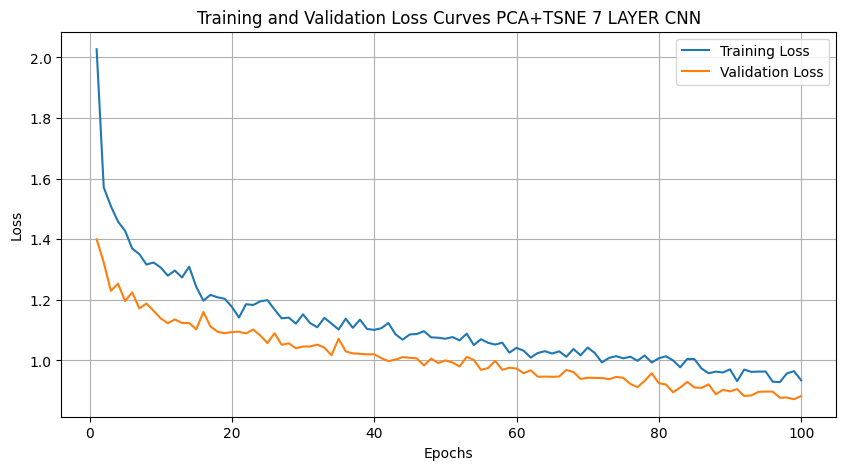

Epoch 1/100
11/11 [==============================] - 1s 29ms/step - loss: 2.3225 - accuracy: 0.2719 - val_loss: 1.6194 - val_accuracy: 0.4419
Epoch 2/100
11/11 [==============================] - 0s 9ms/step - loss: 1.6393 - accuracy: 0.3187 - val_loss: 1.3155 - val_accuracy: 0.4651
Epoch 3/100
11/11 [==============================] - 0s 7ms/step - loss: 1.5475 - accuracy: 0.3743 - val_loss: 1.2774 - val_accuracy: 0.3837
Epoch 4/100
11/11 [==============================] - 0s 9ms/step - loss: 1.4358 - accuracy: 0.4035 - val_loss: 1.2627 - val_accuracy: 0.3953
Epoch 5/100
11/11 [==============================] - 0s 9ms/step - loss: 1.3947 - accuracy: 0.4123 - val_loss: 1.1998 - val_accuracy: 0.4070
Epoch 6/100
11/11 [==============================] - 0s 7ms/step - loss: 1.3117 - accuracy: 0.4591 - val_loss: 1.2079 - val_accuracy: 0.4070
Epoch 7/100
11/11 [==============================] - 0s 8ms/step - loss: 1.3450 - accuracy: 0.4094 - val_loss: 1.1517 - val_accuracy: 0.5000
Epoch 8/100


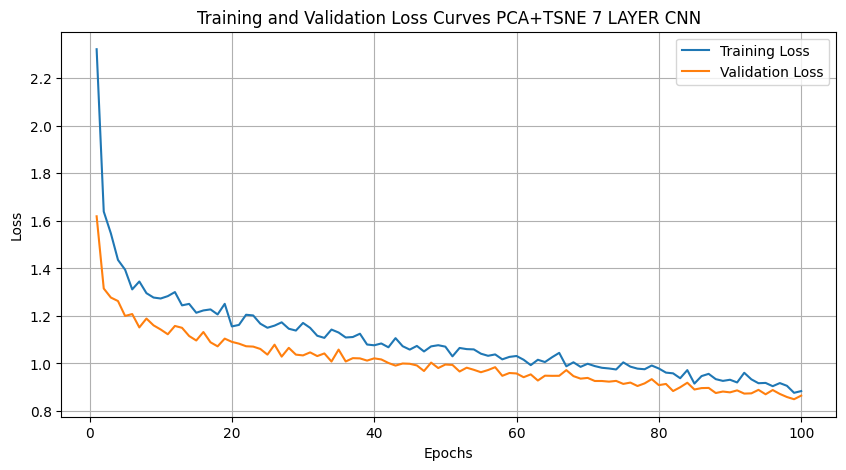

Epoch 1/100
11/11 [==============================] - 2s 39ms/step - loss: 2.0889 - accuracy: 0.2602 - val_loss: 1.4381 - val_accuracy: 0.3953
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 1.7271 - accuracy: 0.3421 - val_loss: 1.3404 - val_accuracy: 0.3605
Epoch 3/100
11/11 [==============================] - 0s 11ms/step - loss: 1.5505 - accuracy: 0.3772 - val_loss: 1.2748 - val_accuracy: 0.4535
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4880 - accuracy: 0.3509 - val_loss: 1.3087 - val_accuracy: 0.3953
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 1.4409 - accuracy: 0.4064 - val_loss: 1.2261 - val_accuracy: 0.4302
Epoch 6/100
11/11 [==============================] - 0s 14ms/step - loss: 1.3933 - accuracy: 0.4269 - val_loss: 1.2410 - val_accuracy: 0.4535
Epoch 7/100
11/11 [==============================] - 0s 13ms/step - loss: 1.3999 - accuracy: 0.4298 - val_loss: 1.2003 - val_accuracy: 0.4884
Epoch 

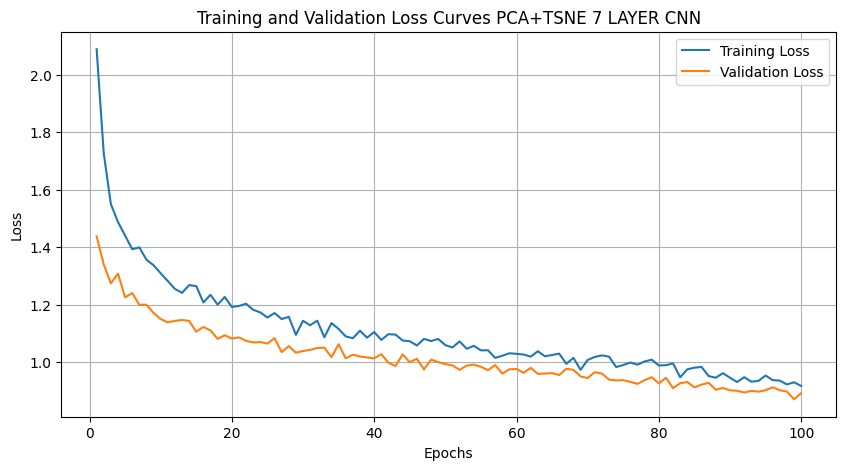

Epoch 1/100
11/11 [==============================] - 1s 30ms/step - loss: 2.0222 - accuracy: 0.2515 - val_loss: 1.4740 - val_accuracy: 0.3953
Epoch 2/100
11/11 [==============================] - 0s 8ms/step - loss: 1.6680 - accuracy: 0.3538 - val_loss: 1.3509 - val_accuracy: 0.3721
Epoch 3/100
11/11 [==============================] - 0s 7ms/step - loss: 1.4462 - accuracy: 0.3860 - val_loss: 1.2927 - val_accuracy: 0.4419
Epoch 4/100
11/11 [==============================] - 0s 10ms/step - loss: 1.4131 - accuracy: 0.4123 - val_loss: 1.2770 - val_accuracy: 0.4651
Epoch 5/100
11/11 [==============================] - 0s 8ms/step - loss: 1.3460 - accuracy: 0.4240 - val_loss: 1.2067 - val_accuracy: 0.3837
Epoch 6/100
11/11 [==============================] - 0s 8ms/step - loss: 1.3741 - accuracy: 0.4415 - val_loss: 1.2177 - val_accuracy: 0.3721
Epoch 7/100
11/11 [==============================] - 0s 9ms/step - loss: 1.3550 - accuracy: 0.4211 - val_loss: 1.1933 - val_accuracy: 0.4419
Epoch 8/100

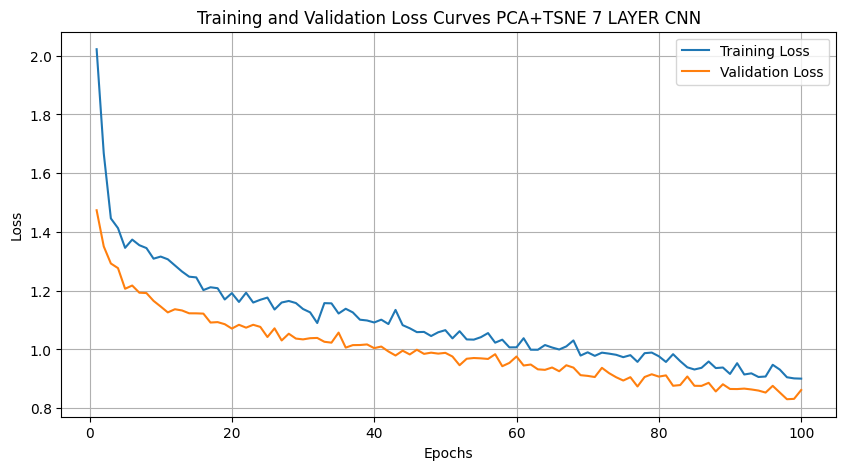

Epoch 1/100
11/11 [==============================] - 2s 39ms/step - loss: 1.9643 - accuracy: 0.2544 - val_loss: 1.4247 - val_accuracy: 0.4884
Epoch 2/100
11/11 [==============================] - 0s 12ms/step - loss: 1.5665 - accuracy: 0.3567 - val_loss: 1.2939 - val_accuracy: 0.4535
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 1.4525 - accuracy: 0.3743 - val_loss: 1.2450 - val_accuracy: 0.4767
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4079 - accuracy: 0.3830 - val_loss: 1.2771 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 1.3420 - accuracy: 0.4737 - val_loss: 1.2012 - val_accuracy: 0.3721
Epoch 6/100
11/11 [==============================] - 0s 13ms/step - loss: 1.3695 - accuracy: 0.4181 - val_loss: 1.2102 - val_accuracy: 0.4186
Epoch 7/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3149 - accuracy: 0.4503 - val_loss: 1.1612 - val_accuracy: 0.5000
Epoch 

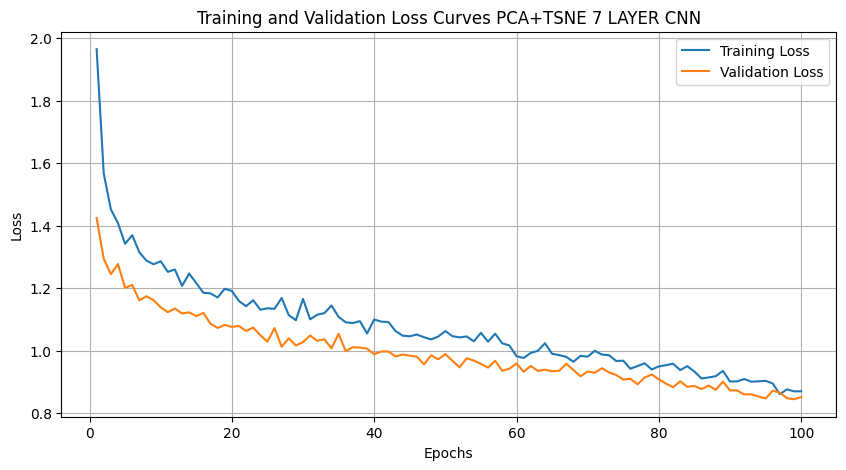

CLR for PCA+TSNE 7 LAYER CNN is: 0.5214953271028037


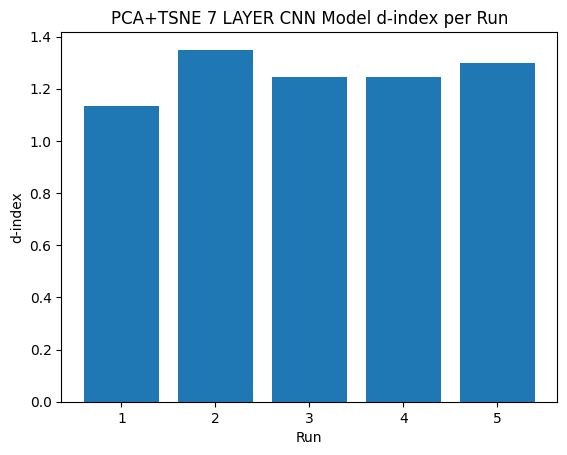

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER LSTM

Epoch 1/100
11/11 [==============================] - 11s 159ms/step - loss: 1.9305 - accuracy: 0.2018 - val_loss: 1.9085 - val_accuracy: 0.3023
Epoch 2/100
11/11 [==============================] - 0s 20ms/step - loss: 1.8946 - accuracy: 0.2602 - val_loss: 1.8486 - val_accuracy: 0.3023
Epoch 3/100
11/11 [==============================] - 0s 21ms/step - loss: 1.8266 - accuracy: 0.2661 - val_loss: 1.7876 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 0s 20ms/step - loss: 1.8012 - accuracy: 0.2690 - val_loss: 1.7339 - val_accuracy: 0.3023
Epoch 5/100
11/11 [==============================] - 0s 19ms/step - loss: 1.7481 - accuracy: 0.2544 - val_loss: 1.6859 - val_accuracy: 0.3023
Epoch 6/100
11/11 [==============================] - 0s 20ms/step - loss: 1.7137 - accuracy: 0.3070 - val_loss: 1.6419 - val_accuracy: 0.3256
Epoch 7/100
11/11 [==============================] - 0s 25ms/step - loss: 1.6433 - accuracy: 0.3392 - val_loss: 1.5868 - val_accuracy: 0.3140
Epoc

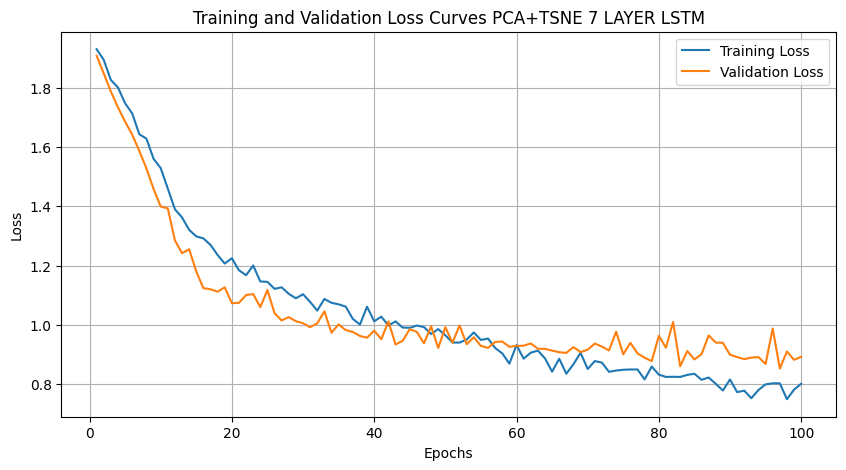

Epoch 1/100
11/11 [==============================] - 12s 162ms/step - loss: 1.9368 - accuracy: 0.1988 - val_loss: 1.9156 - val_accuracy: 0.2558
Epoch 2/100
11/11 [==============================] - 0s 20ms/step - loss: 1.9073 - accuracy: 0.2135 - val_loss: 1.8713 - val_accuracy: 0.2558
Epoch 3/100
11/11 [==============================] - 0s 23ms/step - loss: 1.8549 - accuracy: 0.2544 - val_loss: 1.7807 - val_accuracy: 0.2558
Epoch 4/100
11/11 [==============================] - 0s 20ms/step - loss: 1.7819 - accuracy: 0.2427 - val_loss: 1.6882 - val_accuracy: 0.3721
Epoch 5/100
11/11 [==============================] - 0s 19ms/step - loss: 1.7317 - accuracy: 0.2719 - val_loss: 1.6342 - val_accuracy: 0.2907
Epoch 6/100
11/11 [==============================] - 0s 23ms/step - loss: 1.7148 - accuracy: 0.2749 - val_loss: 1.5920 - val_accuracy: 0.3488
Epoch 7/100
11/11 [==============================] - 0s 22ms/step - loss: 1.6717 - accuracy: 0.3421 - val_loss: 1.5225 - val_accuracy: 0.4302
Epoc

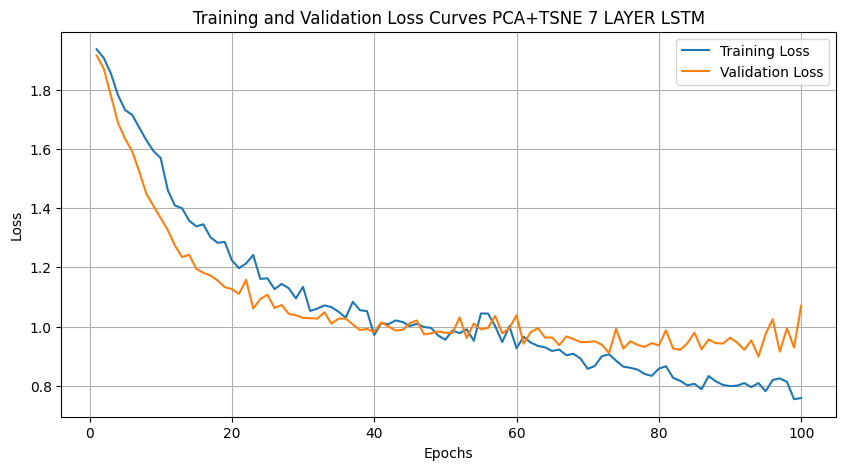

Epoch 1/100
11/11 [==============================] - 10s 245ms/step - loss: 1.9340 - accuracy: 0.1462 - val_loss: 1.9109 - val_accuracy: 0.1163
Epoch 2/100
11/11 [==============================] - 0s 36ms/step - loss: 1.9010 - accuracy: 0.2076 - val_loss: 1.8457 - val_accuracy: 0.3140
Epoch 3/100
11/11 [==============================] - 0s 30ms/step - loss: 1.8489 - accuracy: 0.2573 - val_loss: 1.7608 - val_accuracy: 0.2907
Epoch 4/100
11/11 [==============================] - 0s 27ms/step - loss: 1.7996 - accuracy: 0.2719 - val_loss: 1.7092 - val_accuracy: 0.3023
Epoch 5/100
11/11 [==============================] - 0s 32ms/step - loss: 1.7651 - accuracy: 0.2778 - val_loss: 1.6704 - val_accuracy: 0.3023
Epoch 6/100
11/11 [==============================] - 0s 28ms/step - loss: 1.7314 - accuracy: 0.3041 - val_loss: 1.6171 - val_accuracy: 0.4186
Epoch 7/100
11/11 [==============================] - 0s 31ms/step - loss: 1.6890 - accuracy: 0.3567 - val_loss: 1.5389 - val_accuracy: 0.4302
Epoc

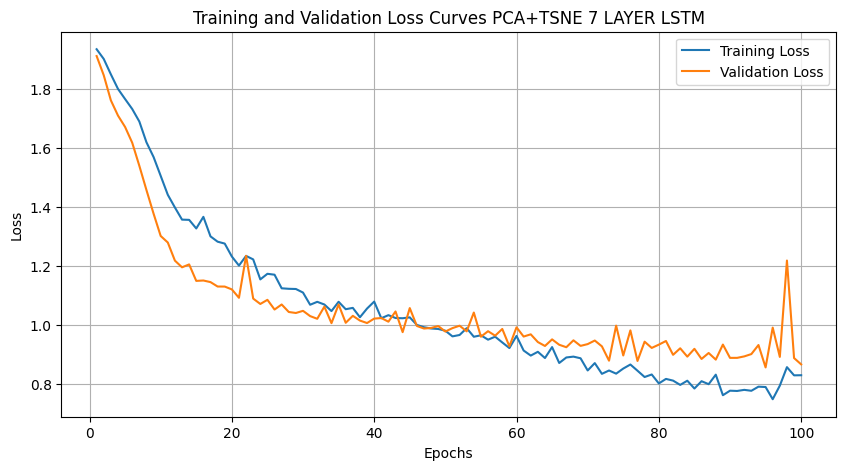

Epoch 1/100
11/11 [==============================] - 13s 269ms/step - loss: 1.9325 - accuracy: 0.2515 - val_loss: 1.9080 - val_accuracy: 0.3023
Epoch 2/100
11/11 [==============================] - 0s 37ms/step - loss: 1.8944 - accuracy: 0.3187 - val_loss: 1.8372 - val_accuracy: 0.3023
Epoch 3/100
11/11 [==============================] - 0s 29ms/step - loss: 1.8307 - accuracy: 0.2982 - val_loss: 1.7355 - val_accuracy: 0.3023
Epoch 4/100
11/11 [==============================] - 0s 36ms/step - loss: 1.7423 - accuracy: 0.3129 - val_loss: 1.6641 - val_accuracy: 0.3023
Epoch 5/100
11/11 [==============================] - 0s 24ms/step - loss: 1.7377 - accuracy: 0.2924 - val_loss: 1.6390 - val_accuracy: 0.3023
Epoch 6/100
11/11 [==============================] - 0s 20ms/step - loss: 1.7189 - accuracy: 0.2982 - val_loss: 1.6377 - val_accuracy: 0.3023
Epoch 7/100
11/11 [==============================] - 0s 20ms/step - loss: 1.6633 - accuracy: 0.3041 - val_loss: 1.6017 - val_accuracy: 0.3023
Epoc

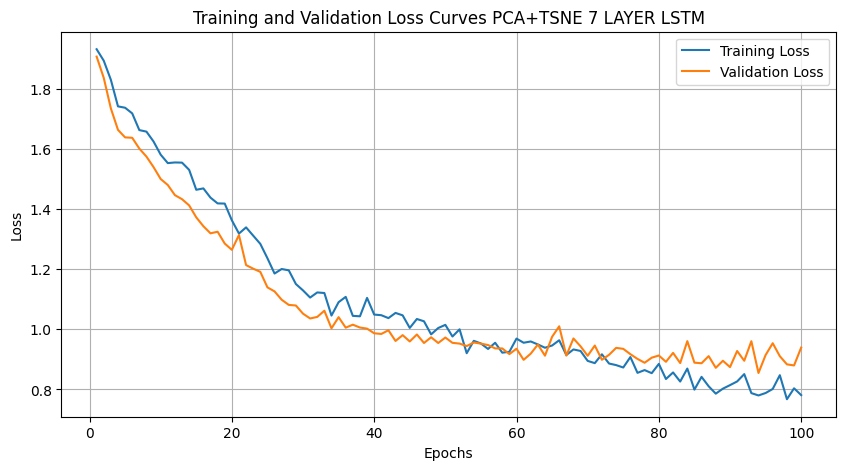

Epoch 1/100
11/11 [==============================] - 11s 180ms/step - loss: 1.9375 - accuracy: 0.1959 - val_loss: 1.9243 - val_accuracy: 0.1628
Epoch 2/100
11/11 [==============================] - 0s 20ms/step - loss: 1.9141 - accuracy: 0.1988 - val_loss: 1.8800 - val_accuracy: 0.1628
Epoch 3/100
11/11 [==============================] - 0s 21ms/step - loss: 1.8632 - accuracy: 0.1842 - val_loss: 1.8163 - val_accuracy: 0.1860
Epoch 4/100
11/11 [==============================] - 0s 20ms/step - loss: 1.8390 - accuracy: 0.1988 - val_loss: 1.7812 - val_accuracy: 0.2209
Epoch 5/100
11/11 [==============================] - 0s 20ms/step - loss: 1.8136 - accuracy: 0.2251 - val_loss: 1.7476 - val_accuracy: 0.2093
Epoch 6/100
11/11 [==============================] - 0s 20ms/step - loss: 1.7668 - accuracy: 0.2632 - val_loss: 1.7215 - val_accuracy: 0.2209
Epoch 7/100
11/11 [==============================] - 0s 21ms/step - loss: 1.7400 - accuracy: 0.2632 - val_loss: 1.6659 - val_accuracy: 0.2326
Epoc

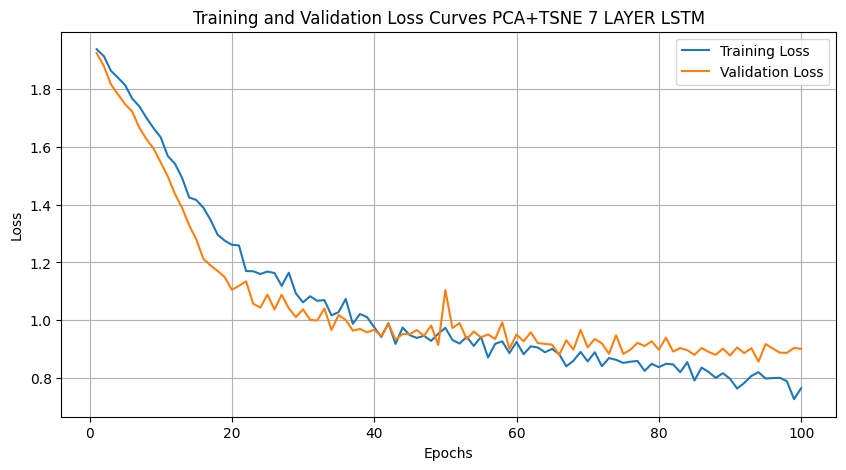

CLR for PCA+TSNE 7 LAYER LSTM is: 0.5925233644859812


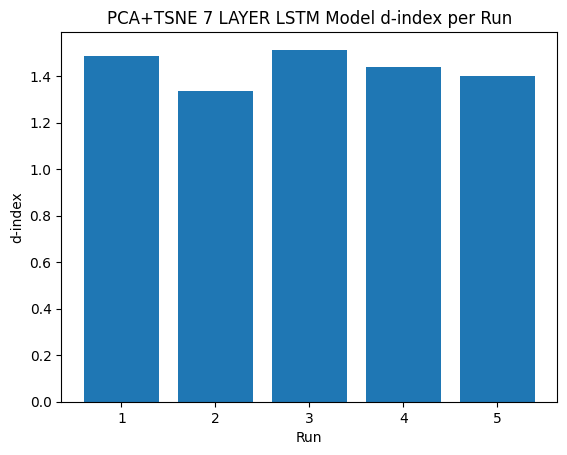

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER GRU

Epoch 1/100
11/11 [==============================] - 13s 165ms/step - loss: 1.8870 - accuracy: 0.2193 - val_loss: 1.7760 - val_accuracy: 0.3488
Epoch 2/100
11/11 [==============================] - 0s 17ms/step - loss: 1.7588 - accuracy: 0.3246 - val_loss: 1.6280 - val_accuracy: 0.4302
Epoch 3/100
11/11 [==============================] - 0s 16ms/step - loss: 1.6262 - accuracy: 0.3743 - val_loss: 1.4926 - val_accuracy: 0.4419
Epoch 4/100
11/11 [==============================] - 0s 18ms/step - loss: 1.5232 - accuracy: 0.4298 - val_loss: 1.4014 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 0s 17ms/step - loss: 1.4448 - accuracy: 0.4240 - val_loss: 1.3221 - val_accuracy: 0.4651
Epoch 6/100
11/11 [==============================] - 0s 18ms/step - loss: 1.4064 - accuracy: 0.4181 - val_loss: 1.2794 - val_accuracy: 0.4070
Epoch 7/100
11/11 [==============================] - 0s 19ms/step - loss: 1.3459 - accuracy: 0.4240 - val_loss: 1.2237 - val_accuracy: 0.4186
Epoc

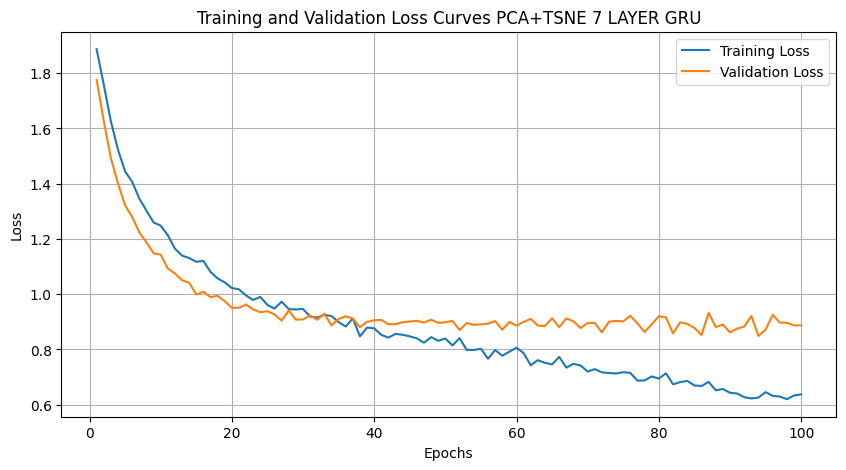

Epoch 1/100
11/11 [==============================] - 9s 147ms/step - loss: 1.8915 - accuracy: 0.2924 - val_loss: 1.8018 - val_accuracy: 0.3953
Epoch 2/100
11/11 [==============================] - 0s 17ms/step - loss: 1.7505 - accuracy: 0.3772 - val_loss: 1.6467 - val_accuracy: 0.4186
Epoch 3/100
11/11 [==============================] - 0s 15ms/step - loss: 1.5938 - accuracy: 0.4269 - val_loss: 1.5064 - val_accuracy: 0.4186
Epoch 4/100
11/11 [==============================] - 0s 19ms/step - loss: 1.5069 - accuracy: 0.4211 - val_loss: 1.4063 - val_accuracy: 0.4302
Epoch 5/100
11/11 [==============================] - 0s 17ms/step - loss: 1.4339 - accuracy: 0.4240 - val_loss: 1.3144 - val_accuracy: 0.4419
Epoch 6/100
11/11 [==============================] - 0s 18ms/step - loss: 1.3939 - accuracy: 0.4444 - val_loss: 1.2592 - val_accuracy: 0.4302
Epoch 7/100
11/11 [==============================] - 0s 17ms/step - loss: 1.3646 - accuracy: 0.4327 - val_loss: 1.2167 - val_accuracy: 0.4302
Epoch

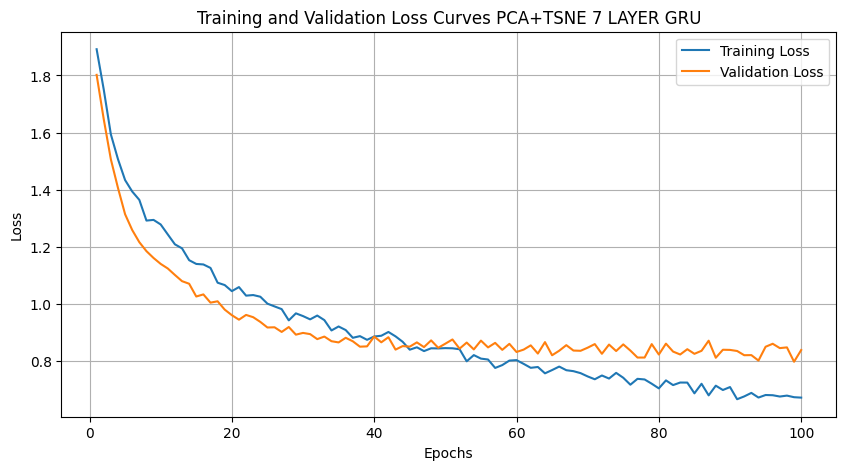

Epoch 1/100
11/11 [==============================] - 9s 146ms/step - loss: 1.8989 - accuracy: 0.2398 - val_loss: 1.8382 - val_accuracy: 0.3023
Epoch 2/100
11/11 [==============================] - 0s 16ms/step - loss: 1.7593 - accuracy: 0.3655 - val_loss: 1.7036 - val_accuracy: 0.3488
Epoch 3/100
11/11 [==============================] - 0s 16ms/step - loss: 1.6392 - accuracy: 0.3860 - val_loss: 1.5825 - val_accuracy: 0.3953
Epoch 4/100
11/11 [==============================] - 0s 19ms/step - loss: 1.5299 - accuracy: 0.4064 - val_loss: 1.4703 - val_accuracy: 0.3953
Epoch 5/100
11/11 [==============================] - 0s 16ms/step - loss: 1.4527 - accuracy: 0.4269 - val_loss: 1.3570 - val_accuracy: 0.4070
Epoch 6/100
11/11 [==============================] - 0s 17ms/step - loss: 1.3931 - accuracy: 0.4561 - val_loss: 1.2870 - val_accuracy: 0.4070
Epoch 7/100
11/11 [==============================] - 0s 18ms/step - loss: 1.3487 - accuracy: 0.4415 - val_loss: 1.2311 - val_accuracy: 0.5000
Epoch

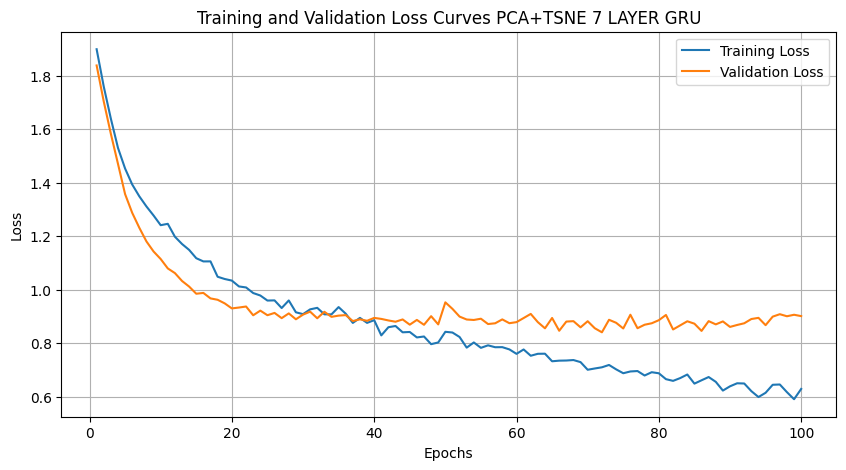

Epoch 1/100
11/11 [==============================] - 9s 148ms/step - loss: 1.8929 - accuracy: 0.3158 - val_loss: 1.7975 - val_accuracy: 0.5116
Epoch 2/100
11/11 [==============================] - 0s 15ms/step - loss: 1.7285 - accuracy: 0.3977 - val_loss: 1.6073 - val_accuracy: 0.4884
Epoch 3/100
11/11 [==============================] - 0s 16ms/step - loss: 1.5733 - accuracy: 0.3918 - val_loss: 1.4398 - val_accuracy: 0.5000
Epoch 4/100
11/11 [==============================] - 0s 18ms/step - loss: 1.4798 - accuracy: 0.4240 - val_loss: 1.3347 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 0s 17ms/step - loss: 1.4261 - accuracy: 0.4211 - val_loss: 1.2725 - val_accuracy: 0.4884
Epoch 6/100
11/11 [==============================] - 0s 17ms/step - loss: 1.3918 - accuracy: 0.4327 - val_loss: 1.2693 - val_accuracy: 0.4535
Epoch 7/100
11/11 [==============================] - 0s 17ms/step - loss: 1.3480 - accuracy: 0.4240 - val_loss: 1.2323 - val_accuracy: 0.4884
Epoch

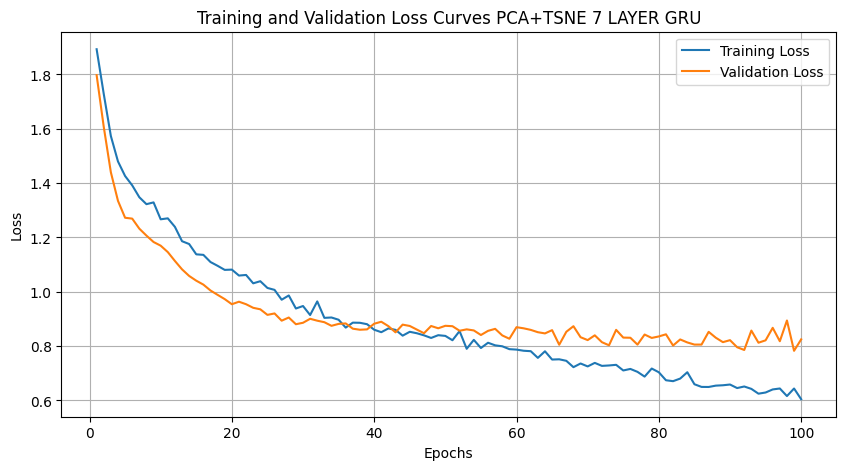

Epoch 1/100
11/11 [==============================] - 12s 230ms/step - loss: 1.8630 - accuracy: 0.2836 - val_loss: 1.7501 - val_accuracy: 0.3605
Epoch 2/100
11/11 [==============================] - 0s 26ms/step - loss: 1.7037 - accuracy: 0.3830 - val_loss: 1.5732 - val_accuracy: 0.3488
Epoch 3/100
11/11 [==============================] - 0s 25ms/step - loss: 1.5650 - accuracy: 0.3655 - val_loss: 1.4381 - val_accuracy: 0.4767
Epoch 4/100
11/11 [==============================] - 0s 22ms/step - loss: 1.4628 - accuracy: 0.4094 - val_loss: 1.3425 - val_accuracy: 0.4884
Epoch 5/100
11/11 [==============================] - 0s 21ms/step - loss: 1.3819 - accuracy: 0.4386 - val_loss: 1.2594 - val_accuracy: 0.4767
Epoch 6/100
11/11 [==============================] - 0s 22ms/step - loss: 1.3411 - accuracy: 0.4444 - val_loss: 1.2263 - val_accuracy: 0.3837
Epoch 7/100
11/11 [==============================] - 0s 25ms/step - loss: 1.3176 - accuracy: 0.4532 - val_loss: 1.2016 - val_accuracy: 0.4767
Epoc

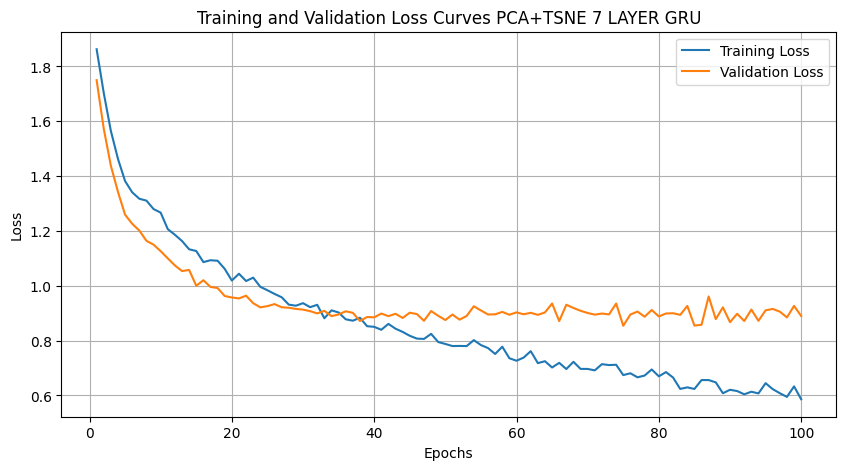

CLR for PCA+TSNE 7 LAYER GRU is: 0.6130841121495327


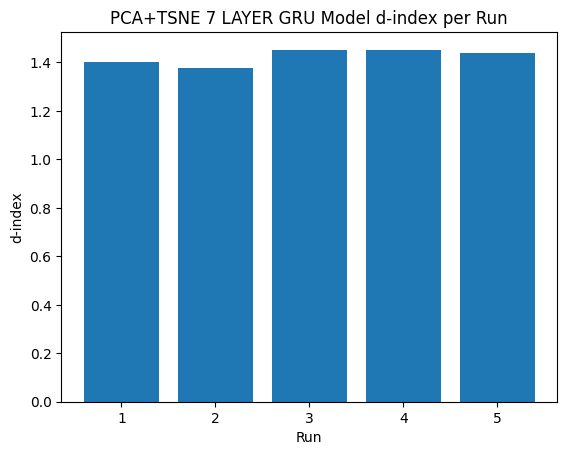

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA preprocessing DNN

Epoch 1/100
11/11 [==============================] - 1s 28ms/step - loss: 1.9835 - accuracy: 0.1667 - val_loss: 1.8958 - val_accuracy: 0.2442
Epoch 2/100
11/11 [==============================] - 0s 8ms/step - loss: 1.8465 - accuracy: 0.2105 - val_loss: 1.7957 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 0s 7ms/step - loss: 1.7477 - accuracy: 0.3099 - val_loss: 1.7166 - val_accuracy: 0.3256
Epoch 4/100
11/11 [==============================] - 0s 7ms/step - loss: 1.6466 - accuracy: 0.3538 - val_loss: 1.6378 - val_accuracy: 0.3953
Epoch 5/100
11/11 [==============================] - 0s 8ms/step - loss: 1.5347 - accuracy: 0.4269 - val_loss: 1.5527 - val_accuracy: 0.4186
Epoch 6/100
11/11 [==============================] - 0s 10ms/step - loss: 1.4387 - accuracy: 0.4708 - val_loss: 1.4658 - val_accuracy: 0.4302
Epoch 7/100
11/11 [==============================] - 0s 7ms/step - loss: 1.3412 - accuracy: 0.5263 - val_loss: 1.3818 - val_accuracy: 0.4767
Epoch 8/100

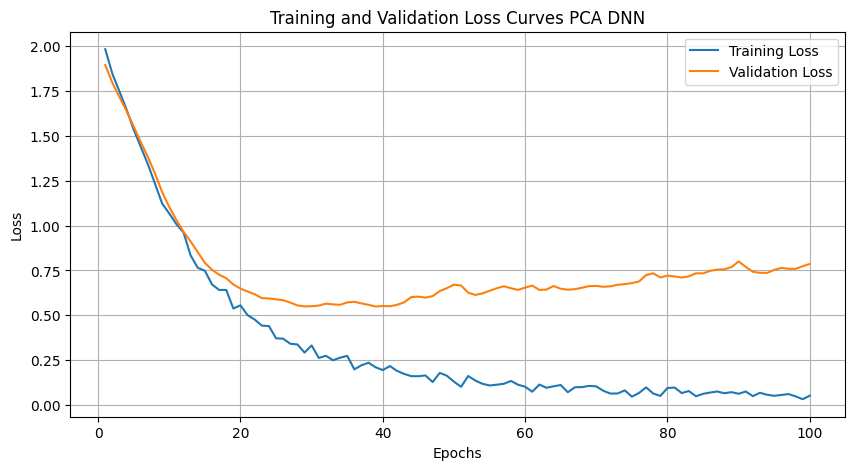

Epoch 1/100
11/11 [==============================] - 1s 29ms/step - loss: 2.0150 - accuracy: 0.1637 - val_loss: 1.8525 - val_accuracy: 0.2326
Epoch 2/100
11/11 [==============================] - 0s 8ms/step - loss: 1.8268 - accuracy: 0.2982 - val_loss: 1.7442 - val_accuracy: 0.3605
Epoch 3/100
11/11 [==============================] - 0s 7ms/step - loss: 1.7243 - accuracy: 0.3392 - val_loss: 1.6529 - val_accuracy: 0.4302
Epoch 4/100
11/11 [==============================] - 0s 7ms/step - loss: 1.6330 - accuracy: 0.4357 - val_loss: 1.5666 - val_accuracy: 0.4884
Epoch 5/100
11/11 [==============================] - 0s 8ms/step - loss: 1.5458 - accuracy: 0.4357 - val_loss: 1.4671 - val_accuracy: 0.4884
Epoch 6/100
11/11 [==============================] - 0s 7ms/step - loss: 1.4421 - accuracy: 0.4912 - val_loss: 1.3761 - val_accuracy: 0.5349
Epoch 7/100
11/11 [==============================] - 0s 7ms/step - loss: 1.3620 - accuracy: 0.5029 - val_loss: 1.2752 - val_accuracy: 0.5116
Epoch 8/100


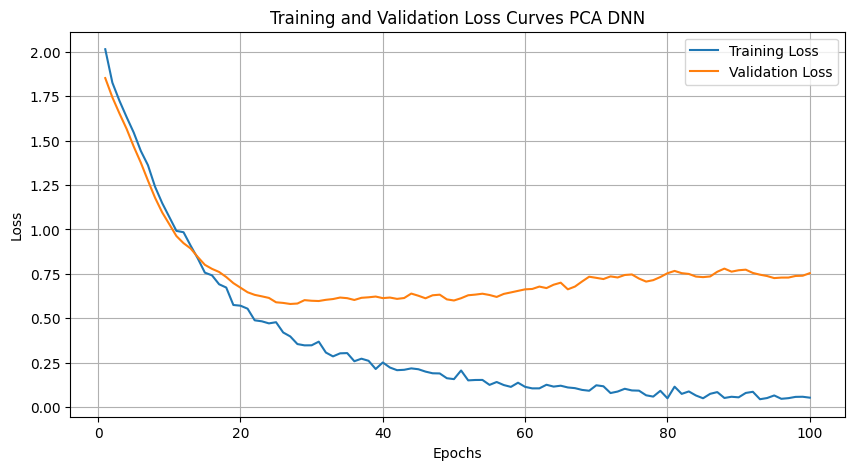

Epoch 1/100
11/11 [==============================] - 2s 46ms/step - loss: 1.9598 - accuracy: 0.2018 - val_loss: 1.8579 - val_accuracy: 0.2093
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 1.7817 - accuracy: 0.3099 - val_loss: 1.7193 - val_accuracy: 0.3256
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 1.6397 - accuracy: 0.3947 - val_loss: 1.6201 - val_accuracy: 0.4302
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 1.5376 - accuracy: 0.4474 - val_loss: 1.5357 - val_accuracy: 0.4419
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4640 - accuracy: 0.4327 - val_loss: 1.4605 - val_accuracy: 0.4767
Epoch 6/100
11/11 [==============================] - 0s 15ms/step - loss: 1.4193 - accuracy: 0.4825 - val_loss: 1.3957 - val_accuracy: 0.5233
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 1.2742 - accuracy: 0.5468 - val_loss: 1.3184 - val_accuracy: 0.5581
Epoch 

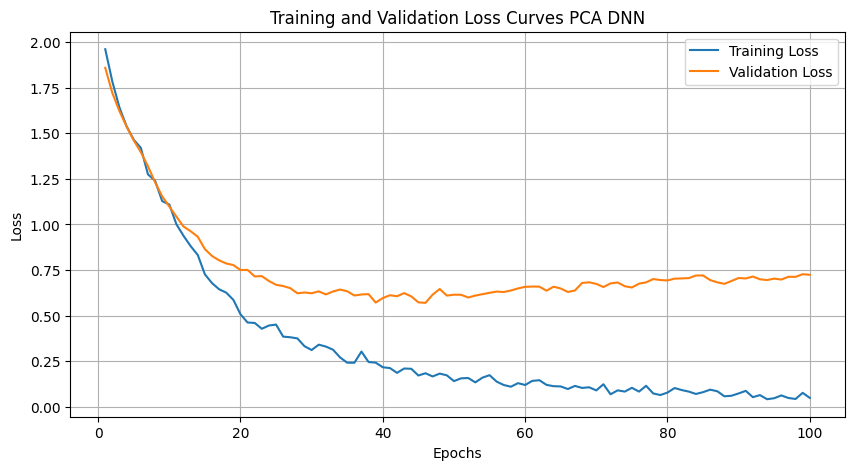

Epoch 1/100
11/11 [==============================] - 2s 41ms/step - loss: 1.7917 - accuracy: 0.2749 - val_loss: 1.6465 - val_accuracy: 0.3721
Epoch 2/100
11/11 [==============================] - 0s 13ms/step - loss: 1.6399 - accuracy: 0.3567 - val_loss: 1.5366 - val_accuracy: 0.4535
Epoch 3/100
11/11 [==============================] - 0s 11ms/step - loss: 1.4860 - accuracy: 0.4211 - val_loss: 1.4208 - val_accuracy: 0.5000
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 1.3690 - accuracy: 0.5058 - val_loss: 1.3121 - val_accuracy: 0.5349
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 1.3035 - accuracy: 0.4883 - val_loss: 1.2149 - val_accuracy: 0.5465
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.1830 - accuracy: 0.5409 - val_loss: 1.1282 - val_accuracy: 0.5930
Epoch 7/100
11/11 [==============================] - 0s 10ms/step - loss: 1.0933 - accuracy: 0.6287 - val_loss: 1.0497 - val_accuracy: 0.6163
Epoch 

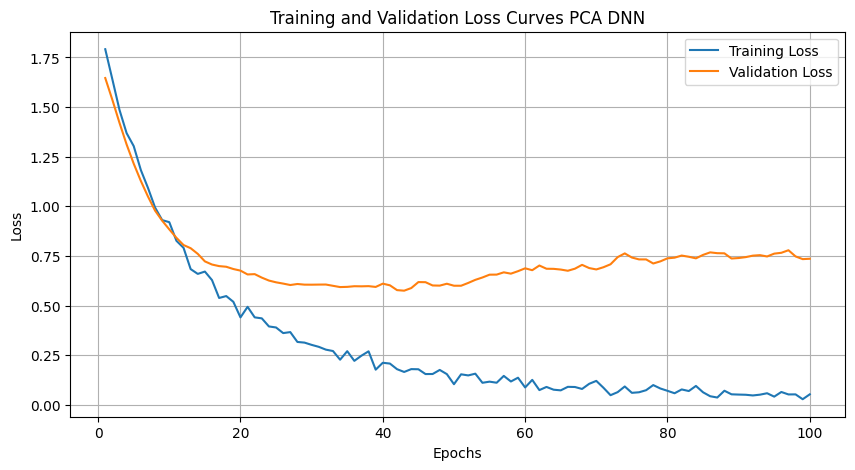

Epoch 1/100
11/11 [==============================] - 1s 27ms/step - loss: 1.9751 - accuracy: 0.1813 - val_loss: 1.8208 - val_accuracy: 0.2558
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 1.7920 - accuracy: 0.2836 - val_loss: 1.6941 - val_accuracy: 0.3721
Epoch 3/100
11/11 [==============================] - 0s 9ms/step - loss: 1.6511 - accuracy: 0.3801 - val_loss: 1.5838 - val_accuracy: 0.4302
Epoch 4/100
11/11 [==============================] - 0s 7ms/step - loss: 1.5511 - accuracy: 0.4357 - val_loss: 1.4818 - val_accuracy: 0.4651
Epoch 5/100
11/11 [==============================] - 0s 9ms/step - loss: 1.4430 - accuracy: 0.4561 - val_loss: 1.3831 - val_accuracy: 0.5116
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3275 - accuracy: 0.5088 - val_loss: 1.2841 - val_accuracy: 0.5698
Epoch 7/100
11/11 [==============================] - 0s 10ms/step - loss: 1.2727 - accuracy: 0.5292 - val_loss: 1.1786 - val_accuracy: 0.6512
Epoch 8/1

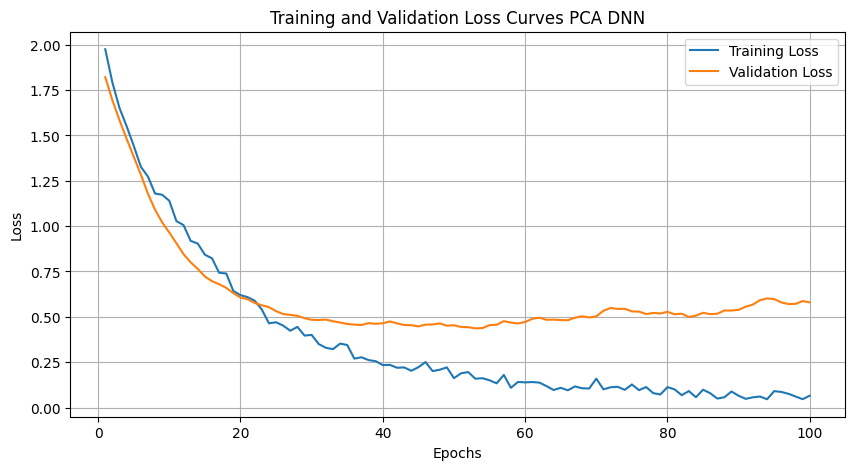

CLR for PCA DNN is: 0.7981308411214953


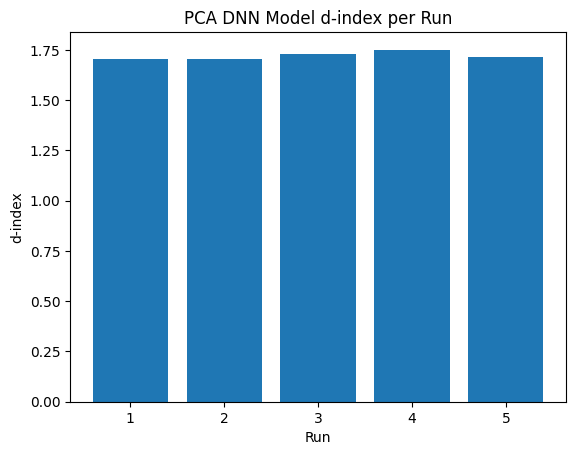

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA')

### PCA preprocessing CNN

Epoch 1/100
11/11 [==============================] - 1s 31ms/step - loss: 1.9470 - accuracy: 0.2047 - val_loss: 1.8806 - val_accuracy: 0.2326
Epoch 2/100
11/11 [==============================] - 0s 10ms/step - loss: 1.8140 - accuracy: 0.2865 - val_loss: 1.7916 - val_accuracy: 0.3372
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 1.6940 - accuracy: 0.4035 - val_loss: 1.6989 - val_accuracy: 0.4302
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 1.5628 - accuracy: 0.5263 - val_loss: 1.6004 - val_accuracy: 0.5233
Epoch 5/100
11/11 [==============================] - 0s 11ms/step - loss: 1.4421 - accuracy: 0.5731 - val_loss: 1.4964 - val_accuracy: 0.5698
Epoch 6/100
11/11 [==============================] - 0s 10ms/step - loss: 1.3110 - accuracy: 0.6374 - val_loss: 1.3935 - val_accuracy: 0.5465
Epoch 7/100
11/11 [==============================] - 0s 10ms/step - loss: 1.1731 - accuracy: 0.6784 - val_loss: 1.2742 - val_accuracy: 0.6163
Epoch 

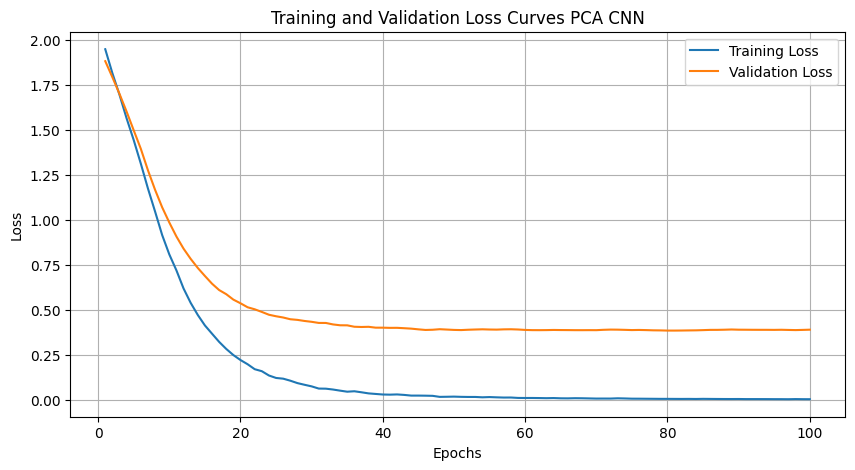

Epoch 1/100
11/11 [==============================] - 1s 33ms/step - loss: 1.9452 - accuracy: 0.1696 - val_loss: 1.8702 - val_accuracy: 0.2093
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 1.7961 - accuracy: 0.2807 - val_loss: 1.7904 - val_accuracy: 0.2674
Epoch 3/100
11/11 [==============================] - 0s 12ms/step - loss: 1.6809 - accuracy: 0.3801 - val_loss: 1.7066 - val_accuracy: 0.3721
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.5709 - accuracy: 0.5000 - val_loss: 1.6119 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4549 - accuracy: 0.5848 - val_loss: 1.5172 - val_accuracy: 0.5116
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3466 - accuracy: 0.5994 - val_loss: 1.4272 - val_accuracy: 0.5233
Epoch 7/100
11/11 [==============================] - 0s 10ms/step - loss: 1.2125 - accuracy: 0.6462 - val_loss: 1.3184 - val_accuracy: 0.5698
Epoch 

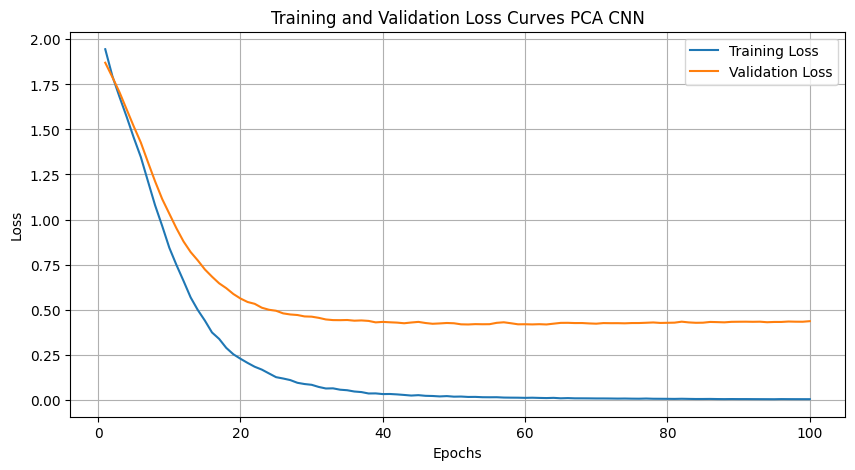

Epoch 1/100
11/11 [==============================] - 1s 32ms/step - loss: 2.0013 - accuracy: 0.1608 - val_loss: 1.8888 - val_accuracy: 0.1744
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 1.8036 - accuracy: 0.3421 - val_loss: 1.7906 - val_accuracy: 0.3721
Epoch 3/100
11/11 [==============================] - 0s 11ms/step - loss: 1.6815 - accuracy: 0.4035 - val_loss: 1.6992 - val_accuracy: 0.3837
Epoch 4/100
11/11 [==============================] - 0s 11ms/step - loss: 1.5590 - accuracy: 0.4795 - val_loss: 1.5977 - val_accuracy: 0.4186
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 1.4236 - accuracy: 0.5409 - val_loss: 1.4831 - val_accuracy: 0.5233
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.2894 - accuracy: 0.5965 - val_loss: 1.3750 - val_accuracy: 0.5465
Epoch 7/100
11/11 [==============================] - 0s 12ms/step - loss: 1.1543 - accuracy: 0.6784 - val_loss: 1.2545 - val_accuracy: 0.6163
Epoch 

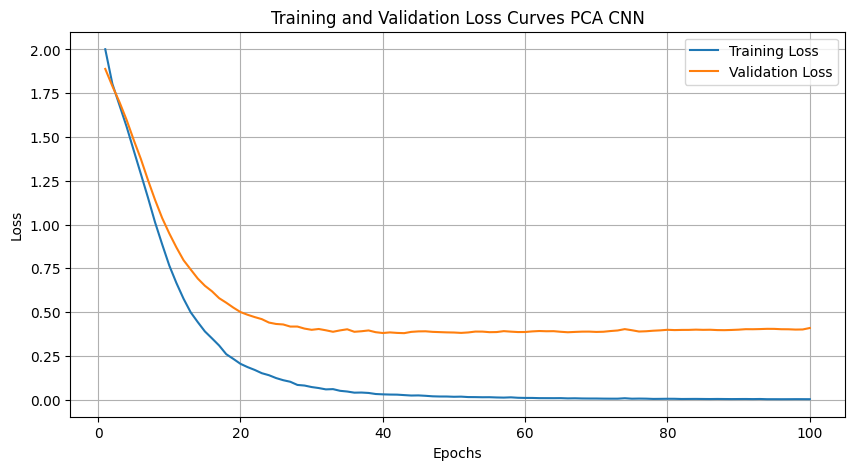

Epoch 1/100
11/11 [==============================] - 1s 32ms/step - loss: 1.9225 - accuracy: 0.2018 - val_loss: 1.8575 - val_accuracy: 0.2674
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 1.7950 - accuracy: 0.2865 - val_loss: 1.7811 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 0s 13ms/step - loss: 1.6903 - accuracy: 0.3392 - val_loss: 1.7015 - val_accuracy: 0.3372
Epoch 4/100
11/11 [==============================] - 0s 12ms/step - loss: 1.5757 - accuracy: 0.4298 - val_loss: 1.6075 - val_accuracy: 0.4651
Epoch 5/100
11/11 [==============================] - 0s 13ms/step - loss: 1.4564 - accuracy: 0.5409 - val_loss: 1.5060 - val_accuracy: 0.5349
Epoch 6/100
11/11 [==============================] - 0s 12ms/step - loss: 1.3318 - accuracy: 0.6111 - val_loss: 1.4062 - val_accuracy: 0.5698
Epoch 7/100
11/11 [==============================] - 0s 13ms/step - loss: 1.1869 - accuracy: 0.6696 - val_loss: 1.2900 - val_accuracy: 0.6047
Epoch 

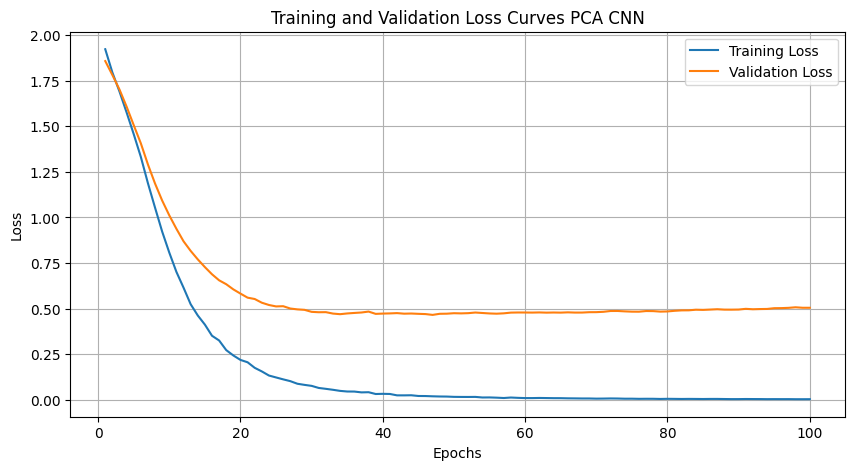

Epoch 1/100
11/11 [==============================] - 1s 30ms/step - loss: 1.9248 - accuracy: 0.2456 - val_loss: 1.8520 - val_accuracy: 0.2558
Epoch 2/100
11/11 [==============================] - 0s 11ms/step - loss: 1.7709 - accuracy: 0.2982 - val_loss: 1.7476 - val_accuracy: 0.3372
Epoch 3/100
11/11 [==============================] - 0s 11ms/step - loss: 1.6430 - accuracy: 0.4298 - val_loss: 1.6479 - val_accuracy: 0.4767
Epoch 4/100
11/11 [==============================] - 0s 11ms/step - loss: 1.5262 - accuracy: 0.5029 - val_loss: 1.5490 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 0s 16ms/step - loss: 1.3956 - accuracy: 0.5556 - val_loss: 1.4498 - val_accuracy: 0.5233
Epoch 6/100
11/11 [==============================] - 0s 14ms/step - loss: 1.2739 - accuracy: 0.6433 - val_loss: 1.3516 - val_accuracy: 0.5698
Epoch 7/100
11/11 [==============================] - 0s 16ms/step - loss: 1.1479 - accuracy: 0.6813 - val_loss: 1.2387 - val_accuracy: 0.6512
Epoch 

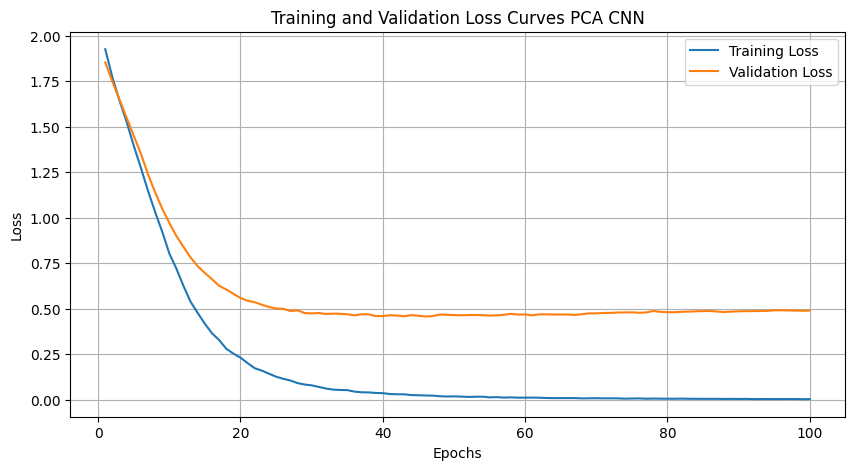

CLR for PCA CNN is: 0.805607476635514


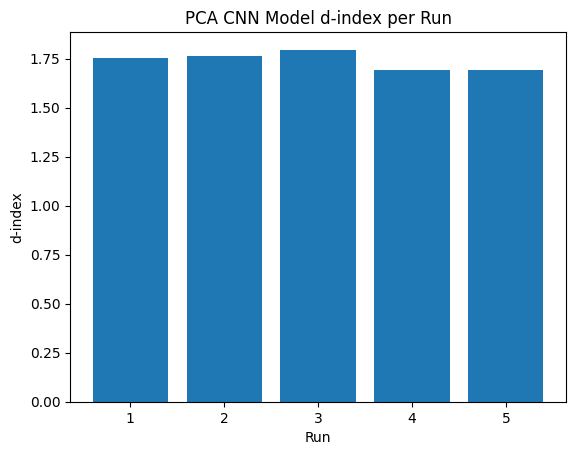

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA')

### PCA preprocessing LSTM

Epoch 1/100
11/11 [==============================] - 8s 176ms/step - loss: 1.9195 - accuracy: 0.2573 - val_loss: 1.8753 - val_accuracy: 0.2907
Epoch 2/100
11/11 [==============================] - 1s 82ms/step - loss: 1.8021 - accuracy: 0.2836 - val_loss: 1.7535 - val_accuracy: 0.2907
Epoch 3/100
11/11 [==============================] - 1s 75ms/step - loss: 1.6773 - accuracy: 0.3216 - val_loss: 1.6374 - val_accuracy: 0.3256
Epoch 4/100
11/11 [==============================] - 1s 73ms/step - loss: 1.5676 - accuracy: 0.3567 - val_loss: 1.5144 - val_accuracy: 0.4302
Epoch 5/100
11/11 [==============================] - 1s 73ms/step - loss: 1.4630 - accuracy: 0.3947 - val_loss: 1.3997 - val_accuracy: 0.4535
Epoch 6/100
11/11 [==============================] - 1s 80ms/step - loss: 1.4305 - accuracy: 0.4386 - val_loss: 1.3849 - val_accuracy: 0.4767
Epoch 7/100
11/11 [==============================] - 1s 73ms/step - loss: 1.3775 - accuracy: 0.4532 - val_loss: 1.3337 - val_accuracy: 0.5581
Epoch

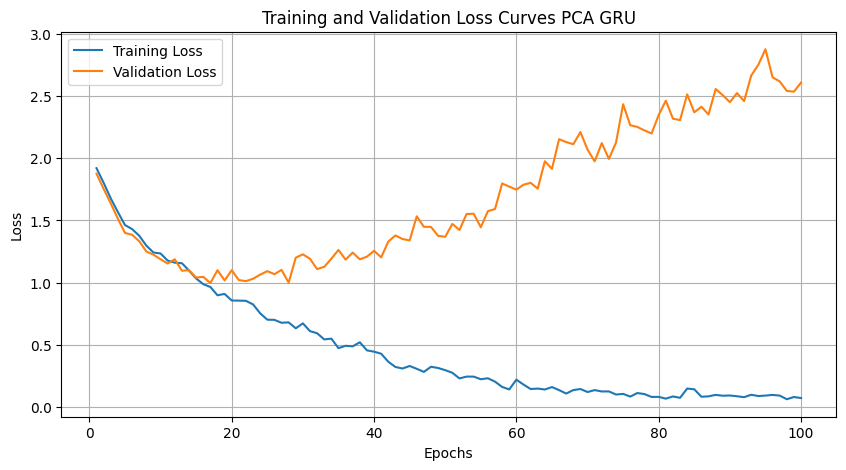

Epoch 1/100
11/11 [==============================] - 7s 191ms/step - loss: 1.9282 - accuracy: 0.2018 - val_loss: 1.9025 - val_accuracy: 0.2442
Epoch 2/100
11/11 [==============================] - 1s 74ms/step - loss: 1.8520 - accuracy: 0.2719 - val_loss: 1.8092 - val_accuracy: 0.3372
Epoch 3/100
11/11 [==============================] - 1s 75ms/step - loss: 1.7383 - accuracy: 0.3129 - val_loss: 1.6626 - val_accuracy: 0.4302
Epoch 4/100
11/11 [==============================] - 1s 75ms/step - loss: 1.6083 - accuracy: 0.3480 - val_loss: 1.5154 - val_accuracy: 0.4535
Epoch 5/100
11/11 [==============================] - 1s 73ms/step - loss: 1.4991 - accuracy: 0.4240 - val_loss: 1.4062 - val_accuracy: 0.5116
Epoch 6/100
11/11 [==============================] - 1s 73ms/step - loss: 1.4255 - accuracy: 0.4298 - val_loss: 1.3663 - val_accuracy: 0.4884
Epoch 7/100
11/11 [==============================] - 1s 111ms/step - loss: 1.3963 - accuracy: 0.4386 - val_loss: 1.2690 - val_accuracy: 0.5233
Epoc

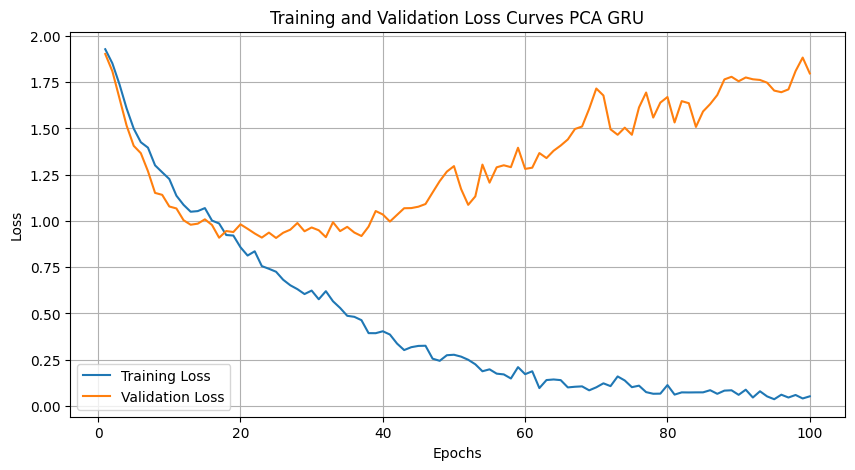

Epoch 1/100
11/11 [==============================] - 8s 177ms/step - loss: 1.8933 - accuracy: 0.1901 - val_loss: 1.7947 - val_accuracy: 0.1977
Epoch 2/100
11/11 [==============================] - 1s 72ms/step - loss: 1.7579 - accuracy: 0.2632 - val_loss: 1.7175 - val_accuracy: 0.2326
Epoch 3/100
11/11 [==============================] - 1s 74ms/step - loss: 1.7001 - accuracy: 0.2953 - val_loss: 1.6713 - val_accuracy: 0.3953
Epoch 4/100
11/11 [==============================] - 1s 73ms/step - loss: 1.6488 - accuracy: 0.3450 - val_loss: 1.6166 - val_accuracy: 0.3023
Epoch 5/100
11/11 [==============================] - 1s 76ms/step - loss: 1.5627 - accuracy: 0.3830 - val_loss: 1.5623 - val_accuracy: 0.3837
Epoch 6/100
11/11 [==============================] - 1s 74ms/step - loss: 1.4773 - accuracy: 0.4503 - val_loss: 1.4918 - val_accuracy: 0.3953
Epoch 7/100
11/11 [==============================] - 1s 81ms/step - loss: 1.4477 - accuracy: 0.4211 - val_loss: 1.4859 - val_accuracy: 0.4651
Epoch

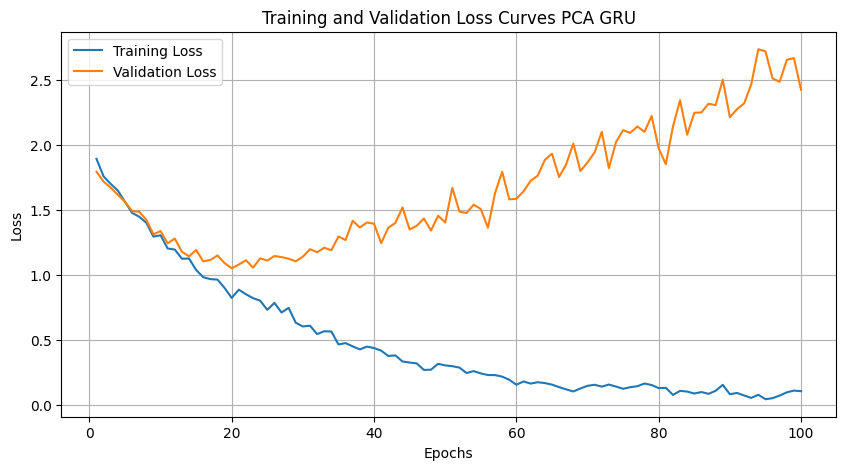

Epoch 1/100
11/11 [==============================] - 13s 198ms/step - loss: 1.9339 - accuracy: 0.2281 - val_loss: 1.8941 - val_accuracy: 0.3721
Epoch 2/100
11/11 [==============================] - 1s 92ms/step - loss: 1.8466 - accuracy: 0.3041 - val_loss: 1.7193 - val_accuracy: 0.3488
Epoch 3/100
11/11 [==============================] - 1s 83ms/step - loss: 1.7607 - accuracy: 0.3129 - val_loss: 1.6235 - val_accuracy: 0.4070
Epoch 4/100
11/11 [==============================] - 1s 87ms/step - loss: 1.6367 - accuracy: 0.3655 - val_loss: 1.4935 - val_accuracy: 0.4767
Epoch 5/100
11/11 [==============================] - 1s 88ms/step - loss: 1.5252 - accuracy: 0.4298 - val_loss: 1.4048 - val_accuracy: 0.4884
Epoch 6/100
11/11 [==============================] - 1s 79ms/step - loss: 1.4616 - accuracy: 0.4269 - val_loss: 1.4033 - val_accuracy: 0.4419
Epoch 7/100
11/11 [==============================] - 1s 81ms/step - loss: 1.4408 - accuracy: 0.4678 - val_loss: 1.2989 - val_accuracy: 0.5814
Epoc

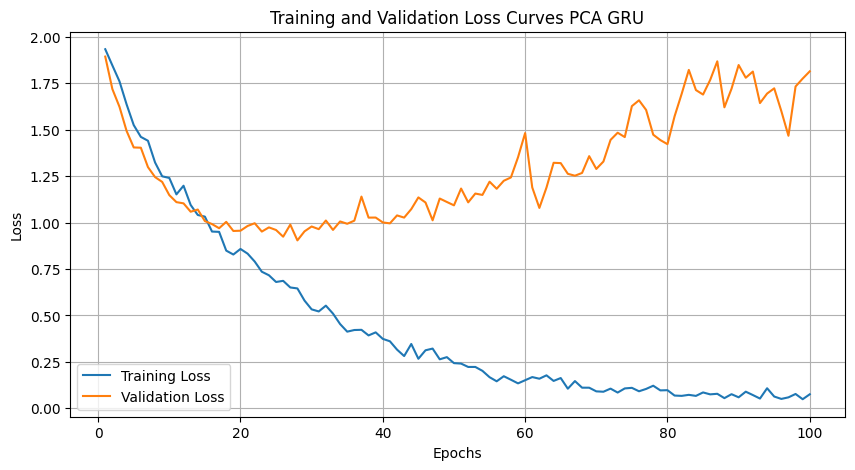

Epoch 1/100
11/11 [==============================] - 9s 285ms/step - loss: 1.9085 - accuracy: 0.2485 - val_loss: 1.8134 - val_accuracy: 0.3140
Epoch 2/100
11/11 [==============================] - 1s 130ms/step - loss: 1.7729 - accuracy: 0.3216 - val_loss: 1.6344 - val_accuracy: 0.3023
Epoch 3/100
11/11 [==============================] - 1s 127ms/step - loss: 1.6465 - accuracy: 0.3655 - val_loss: 1.5523 - val_accuracy: 0.4070
Epoch 4/100
11/11 [==============================] - 1s 94ms/step - loss: 1.5634 - accuracy: 0.3509 - val_loss: 1.4575 - val_accuracy: 0.4070
Epoch 5/100
11/11 [==============================] - 1s 81ms/step - loss: 1.5000 - accuracy: 0.4152 - val_loss: 1.4520 - val_accuracy: 0.4651
Epoch 6/100
11/11 [==============================] - 1s 82ms/step - loss: 1.3840 - accuracy: 0.4561 - val_loss: 1.3393 - val_accuracy: 0.4884
Epoch 7/100
11/11 [==============================] - 1s 85ms/step - loss: 1.3278 - accuracy: 0.4620 - val_loss: 1.2882 - val_accuracy: 0.5000
Epo

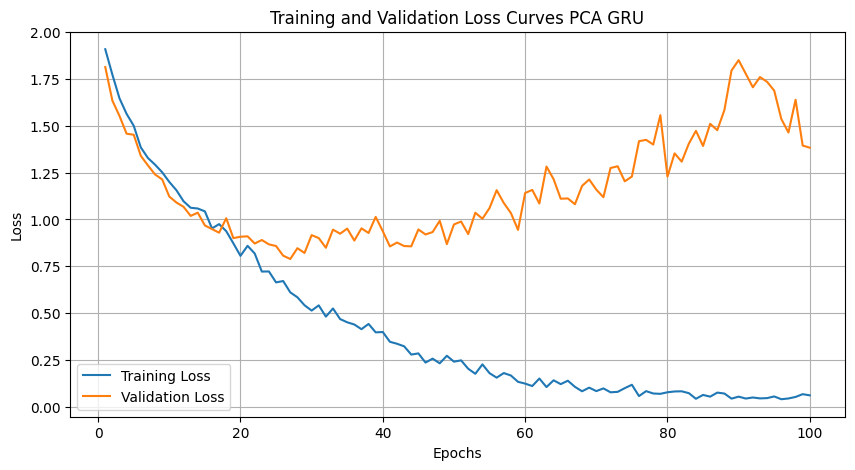

CLR for PCA LSTM is: 0.6317757009345795


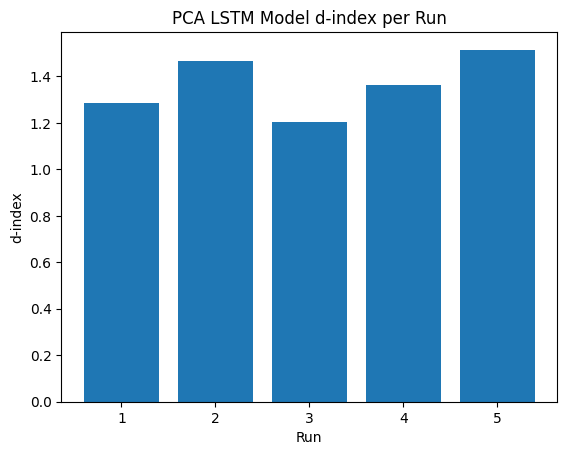

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA')

### PCA preprocessing GRU

Epoch 1/100
11/11 [==============================] - 11s 393ms/step - loss: 1.9025 - accuracy: 0.2719 - val_loss: 1.7909 - val_accuracy: 0.3256
Epoch 2/100
11/11 [==============================] - 2s 169ms/step - loss: 1.7140 - accuracy: 0.3246 - val_loss: 1.5527 - val_accuracy: 0.3837
Epoch 3/100
11/11 [==============================] - 2s 144ms/step - loss: 1.5100 - accuracy: 0.3860 - val_loss: 1.4444 - val_accuracy: 0.5000
Epoch 4/100
11/11 [==============================] - 1s 104ms/step - loss: 1.3987 - accuracy: 0.4620 - val_loss: 1.3566 - val_accuracy: 0.5000
Epoch 5/100
11/11 [==============================] - 1s 101ms/step - loss: 1.2982 - accuracy: 0.5263 - val_loss: 1.2481 - val_accuracy: 0.5465
Epoch 6/100
11/11 [==============================] - 1s 101ms/step - loss: 1.1788 - accuracy: 0.6023 - val_loss: 1.1167 - val_accuracy: 0.5930
Epoch 7/100
11/11 [==============================] - 1s 102ms/step - loss: 1.1030 - accuracy: 0.6228 - val_loss: 1.0649 - val_accuracy: 0.581

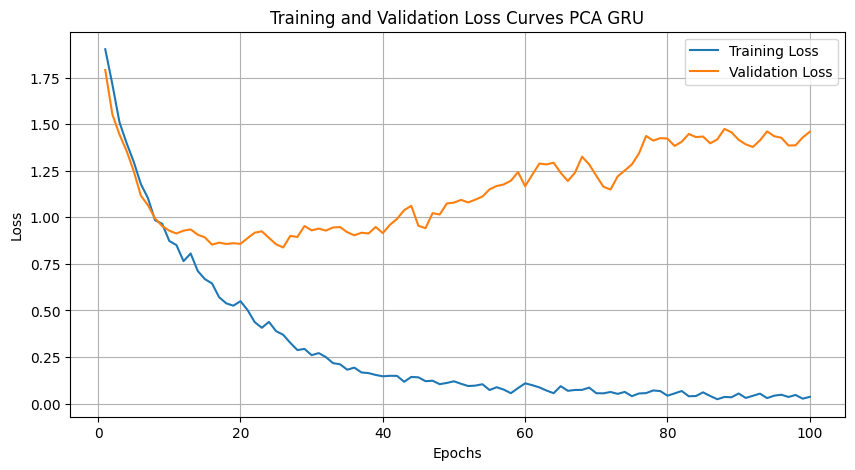

Epoch 1/100
11/11 [==============================] - 11s 253ms/step - loss: 1.8324 - accuracy: 0.3041 - val_loss: 1.6654 - val_accuracy: 0.2907
Epoch 2/100
11/11 [==============================] - 1s 113ms/step - loss: 1.5599 - accuracy: 0.3684 - val_loss: 1.4696 - val_accuracy: 0.4651
Epoch 3/100
11/11 [==============================] - 1s 101ms/step - loss: 1.3991 - accuracy: 0.4532 - val_loss: 1.3727 - val_accuracy: 0.4651
Epoch 4/100
11/11 [==============================] - 2s 157ms/step - loss: 1.2897 - accuracy: 0.5088 - val_loss: 1.3238 - val_accuracy: 0.5116
Epoch 5/100
11/11 [==============================] - 2s 164ms/step - loss: 1.1982 - accuracy: 0.5497 - val_loss: 1.2486 - val_accuracy: 0.5698
Epoch 6/100
11/11 [==============================] - 2s 162ms/step - loss: 1.1443 - accuracy: 0.5877 - val_loss: 1.1928 - val_accuracy: 0.5930
Epoch 7/100
11/11 [==============================] - 2s 173ms/step - loss: 1.1163 - accuracy: 0.5848 - val_loss: 1.1550 - val_accuracy: 0.558

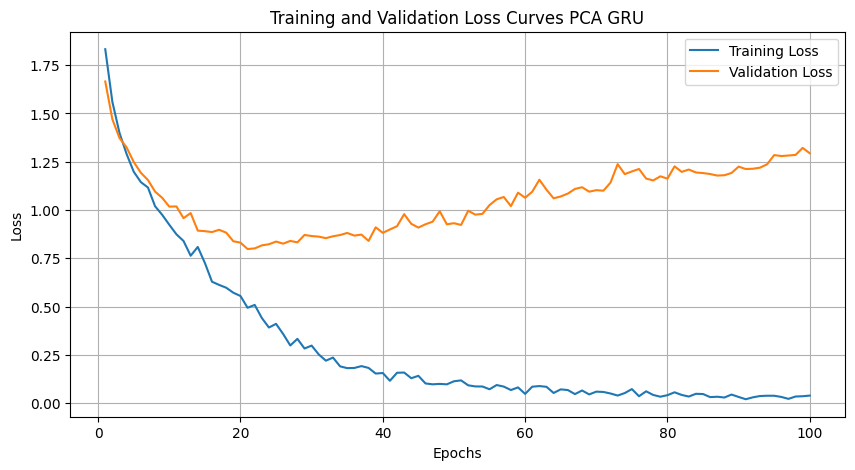

Epoch 1/100
11/11 [==============================] - 11s 351ms/step - loss: 1.8750 - accuracy: 0.2251 - val_loss: 1.7579 - val_accuracy: 0.3256
Epoch 2/100
11/11 [==============================] - 2s 163ms/step - loss: 1.5981 - accuracy: 0.3889 - val_loss: 1.4805 - val_accuracy: 0.4419
Epoch 3/100
11/11 [==============================] - 1s 100ms/step - loss: 1.3777 - accuracy: 0.4532 - val_loss: 1.3407 - val_accuracy: 0.5349
Epoch 4/100
11/11 [==============================] - 1s 98ms/step - loss: 1.2293 - accuracy: 0.5234 - val_loss: 1.2843 - val_accuracy: 0.5116
Epoch 5/100
11/11 [==============================] - 1s 100ms/step - loss: 1.1736 - accuracy: 0.5556 - val_loss: 1.1601 - val_accuracy: 0.6163
Epoch 6/100
11/11 [==============================] - 1s 102ms/step - loss: 1.1018 - accuracy: 0.5994 - val_loss: 1.0942 - val_accuracy: 0.6512
Epoch 7/100
11/11 [==============================] - 1s 101ms/step - loss: 1.0510 - accuracy: 0.6111 - val_loss: 1.0569 - val_accuracy: 0.6163

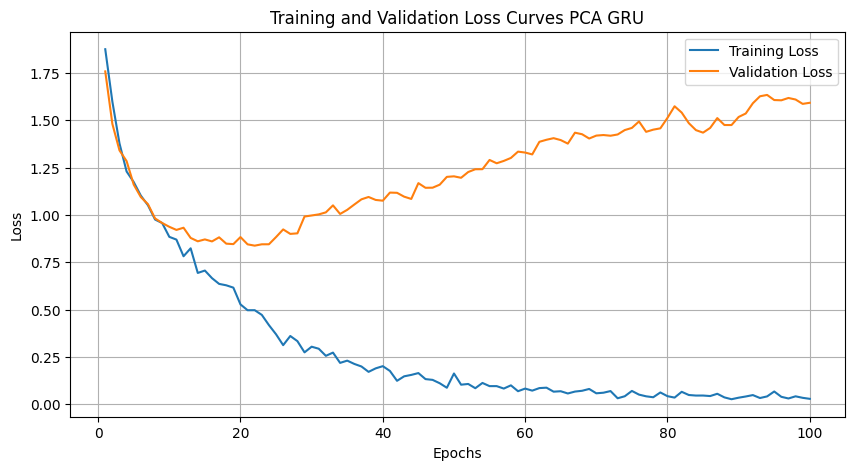

Epoch 1/100
11/11 [==============================] - 11s 252ms/step - loss: 1.8645 - accuracy: 0.2661 - val_loss: 1.7179 - val_accuracy: 0.2442
Epoch 2/100
11/11 [==============================] - 1s 103ms/step - loss: 1.6175 - accuracy: 0.3684 - val_loss: 1.4905 - val_accuracy: 0.4302
Epoch 3/100
11/11 [==============================] - 1s 101ms/step - loss: 1.4158 - accuracy: 0.4649 - val_loss: 1.3660 - val_accuracy: 0.4884
Epoch 4/100
11/11 [==============================] - 2s 146ms/step - loss: 1.2895 - accuracy: 0.5146 - val_loss: 1.2483 - val_accuracy: 0.5698
Epoch 5/100
11/11 [==============================] - 2s 163ms/step - loss: 1.1757 - accuracy: 0.5556 - val_loss: 1.1089 - val_accuracy: 0.6163
Epoch 6/100
11/11 [==============================] - 2s 164ms/step - loss: 1.1306 - accuracy: 0.6053 - val_loss: 1.0779 - val_accuracy: 0.6512
Epoch 7/100
11/11 [==============================] - 2s 173ms/step - loss: 1.0302 - accuracy: 0.6287 - val_loss: 1.0192 - val_accuracy: 0.639

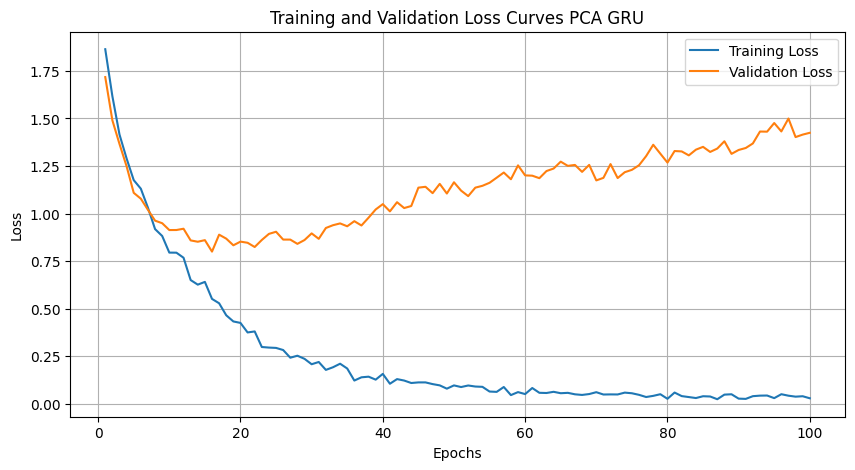

Epoch 1/100
11/11 [==============================] - 17s 380ms/step - loss: 1.8765 - accuracy: 0.3275 - val_loss: 1.7217 - val_accuracy: 0.3837
Epoch 2/100
11/11 [==============================] - 1s 129ms/step - loss: 1.6553 - accuracy: 0.3830 - val_loss: 1.4910 - val_accuracy: 0.5116
Epoch 3/100
11/11 [==============================] - 1s 122ms/step - loss: 1.4727 - accuracy: 0.4474 - val_loss: 1.3935 - val_accuracy: 0.4535
Epoch 4/100
11/11 [==============================] - 1s 121ms/step - loss: 1.2875 - accuracy: 0.5380 - val_loss: 1.2677 - val_accuracy: 0.5581
Epoch 5/100
11/11 [==============================] - 1s 131ms/step - loss: 1.1523 - accuracy: 0.5643 - val_loss: 1.1223 - val_accuracy: 0.6279
Epoch 6/100
11/11 [==============================] - 1s 129ms/step - loss: 1.0572 - accuracy: 0.5965 - val_loss: 1.0454 - val_accuracy: 0.6163
Epoch 7/100
11/11 [==============================] - 1s 131ms/step - loss: 1.0424 - accuracy: 0.5994 - val_loss: 1.0117 - val_accuracy: 0.662

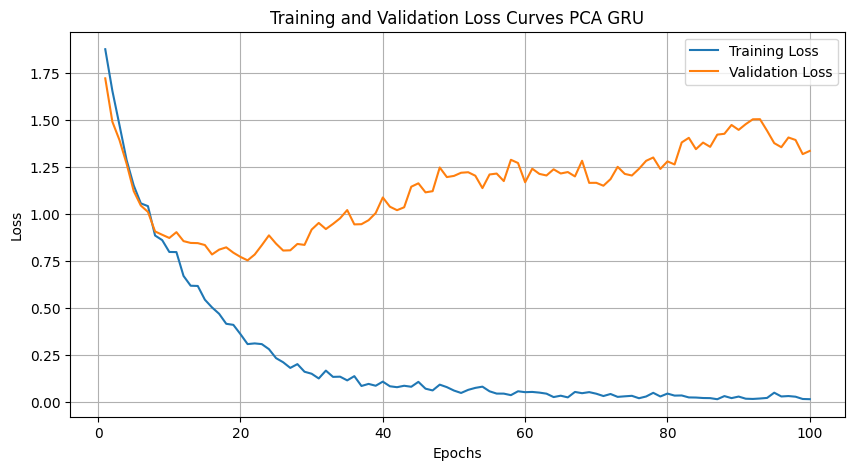

CLR for PCA GRU is: 0.6822429906542056


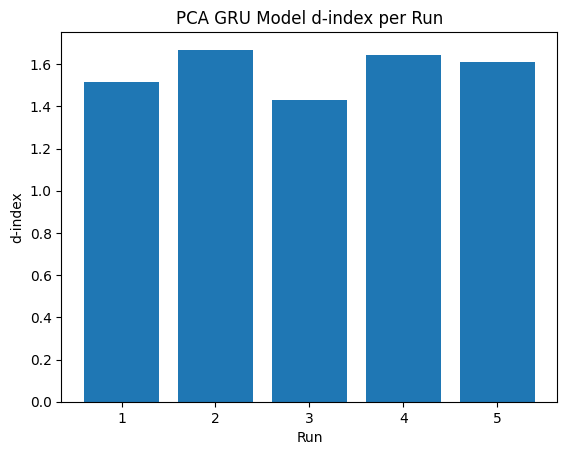

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA')

# MNIST Dataset

### DNN

Epoch 1/100
1500/1500 [==============================] - 21s 8ms/step - loss: 0.3249 - accuracy: 0.9053 - val_loss: 0.1638 - val_accuracy: 0.9525
Epoch 2/100
1500/1500 [==============================] - 7s 5ms/step - loss: 0.1569 - accuracy: 0.9536 - val_loss: 0.1139 - val_accuracy: 0.9656
Epoch 3/100
1500/1500 [==============================] - 7s 5ms/step - loss: 0.1191 - accuracy: 0.9635 - val_loss: 0.1022 - val_accuracy: 0.9705
Epoch 4/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0953 - accuracy: 0.9712 - val_loss: 0.0897 - val_accuracy: 0.9724
Epoch 5/100
1500/1500 [==============================] - 7s 4ms/step - loss: 0.0811 - accuracy: 0.9749 - val_loss: 0.0856 - val_accuracy: 0.9738
Epoch 6/100
1500/1500 [==============================] - 8s 5ms/step - loss: 0.0705 - accuracy: 0.9777 - val_loss: 0.0797 - val_accuracy: 0.9763
Epoch 7/100
1500/1500 [==============================] - 11s 7ms/step - loss: 0.0631 - accuracy: 0.9796 - val_loss: 0.0813 - val_

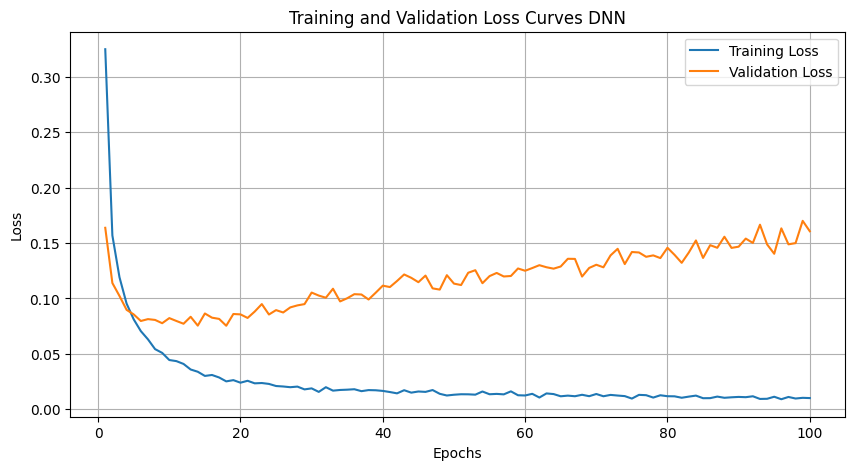

Epoch 1/100
1500/1500 [==============================] - 7s 4ms/step - loss: 0.3192 - accuracy: 0.9073 - val_loss: 0.1613 - val_accuracy: 0.9551
Epoch 2/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.1513 - accuracy: 0.9549 - val_loss: 0.1125 - val_accuracy: 0.9663
Epoch 3/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.1144 - accuracy: 0.9652 - val_loss: 0.1006 - val_accuracy: 0.9709
Epoch 4/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0908 - accuracy: 0.9728 - val_loss: 0.0875 - val_accuracy: 0.9737
Epoch 5/100
1500/1500 [==============================] - 5s 3ms/step - loss: 0.0795 - accuracy: 0.9751 - val_loss: 0.0884 - val_accuracy: 0.9754
Epoch 6/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0695 - accuracy: 0.9787 - val_loss: 0.0775 - val_accuracy: 0.9765
Epoch 7/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0591 - accuracy: 0.9815 - val_loss: 0.0833 - val_ac

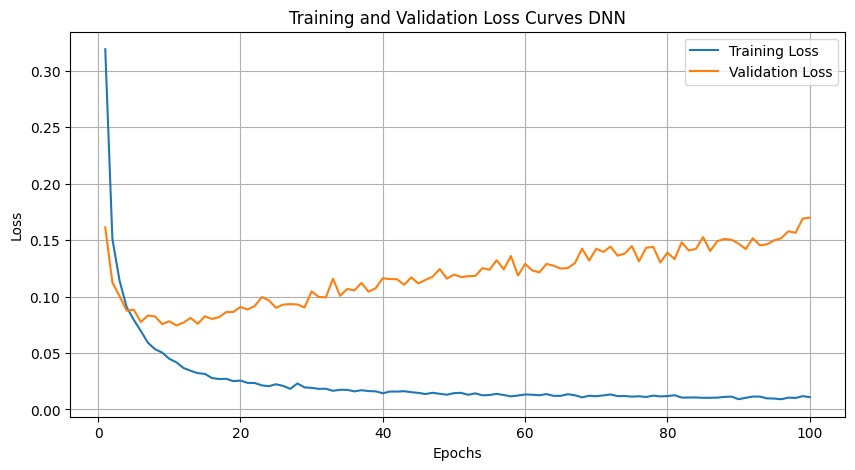

Epoch 1/100
1500/1500 [==============================] - 7s 4ms/step - loss: 0.3258 - accuracy: 0.9055 - val_loss: 0.1681 - val_accuracy: 0.9509
Epoch 2/100
1500/1500 [==============================] - 5s 3ms/step - loss: 0.1574 - accuracy: 0.9534 - val_loss: 0.1146 - val_accuracy: 0.9661
Epoch 3/100
1500/1500 [==============================] - 5s 4ms/step - loss: 0.1184 - accuracy: 0.9644 - val_loss: 0.1008 - val_accuracy: 0.9703
Epoch 4/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0957 - accuracy: 0.9705 - val_loss: 0.0919 - val_accuracy: 0.9722
Epoch 5/100
1500/1500 [==============================] - 5s 3ms/step - loss: 0.0796 - accuracy: 0.9753 - val_loss: 0.0871 - val_accuracy: 0.9734
Epoch 6/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0711 - accuracy: 0.9782 - val_loss: 0.0805 - val_accuracy: 0.9766
Epoch 7/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0592 - accuracy: 0.9806 - val_loss: 0.0840 - val_ac

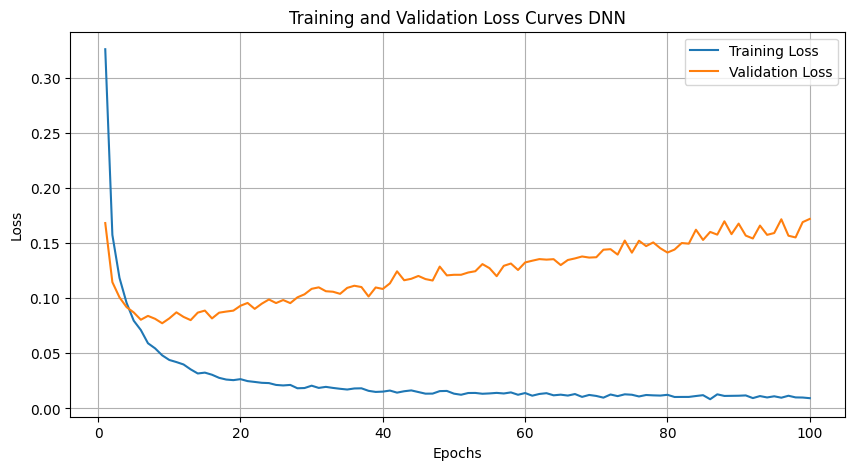

Epoch 1/100
1500/1500 [==============================] - 7s 4ms/step - loss: 0.3293 - accuracy: 0.9031 - val_loss: 0.1638 - val_accuracy: 0.9524
Epoch 2/100
1500/1500 [==============================] - 5s 4ms/step - loss: 0.1608 - accuracy: 0.9526 - val_loss: 0.1185 - val_accuracy: 0.9643
Epoch 3/100
1500/1500 [==============================] - 5s 3ms/step - loss: 0.1191 - accuracy: 0.9649 - val_loss: 0.1024 - val_accuracy: 0.9704
Epoch 4/100
1500/1500 [==============================] - 7s 5ms/step - loss: 0.0951 - accuracy: 0.9706 - val_loss: 0.0892 - val_accuracy: 0.9741
Epoch 5/100
1500/1500 [==============================] - 5s 3ms/step - loss: 0.0836 - accuracy: 0.9741 - val_loss: 0.0910 - val_accuracy: 0.9720
Epoch 6/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0700 - accuracy: 0.9783 - val_loss: 0.0815 - val_accuracy: 0.9750
Epoch 7/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0616 - accuracy: 0.9804 - val_loss: 0.0929 - val_ac

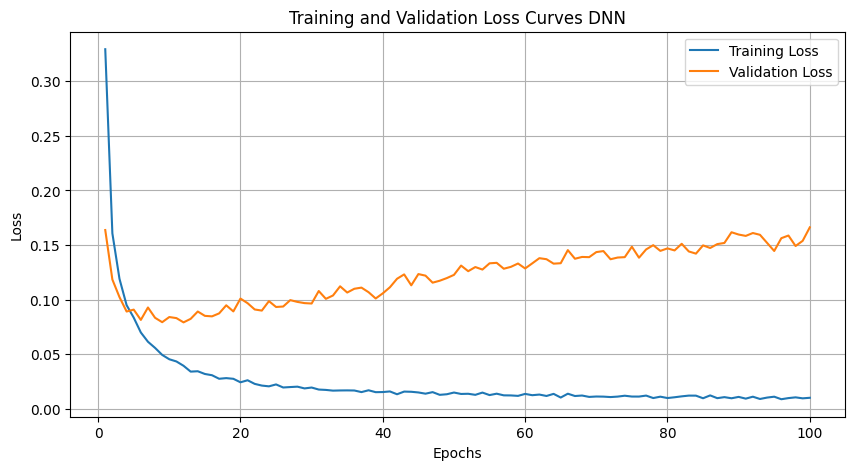

Epoch 1/100
1500/1500 [==============================] - 7s 4ms/step - loss: 0.3243 - accuracy: 0.9051 - val_loss: 0.1643 - val_accuracy: 0.9510
Epoch 2/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.1563 - accuracy: 0.9537 - val_loss: 0.1133 - val_accuracy: 0.9663
Epoch 3/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.1155 - accuracy: 0.9655 - val_loss: 0.1014 - val_accuracy: 0.9687
Epoch 4/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0928 - accuracy: 0.9715 - val_loss: 0.0950 - val_accuracy: 0.9697
Epoch 5/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0806 - accuracy: 0.9756 - val_loss: 0.0895 - val_accuracy: 0.9736
Epoch 6/100
1500/1500 [==============================] - 5s 3ms/step - loss: 0.0691 - accuracy: 0.9783 - val_loss: 0.0756 - val_accuracy: 0.9774
Epoch 7/100
1500/1500 [==============================] - 6s 4ms/step - loss: 0.0604 - accuracy: 0.9807 - val_loss: 0.0973 - val_ac

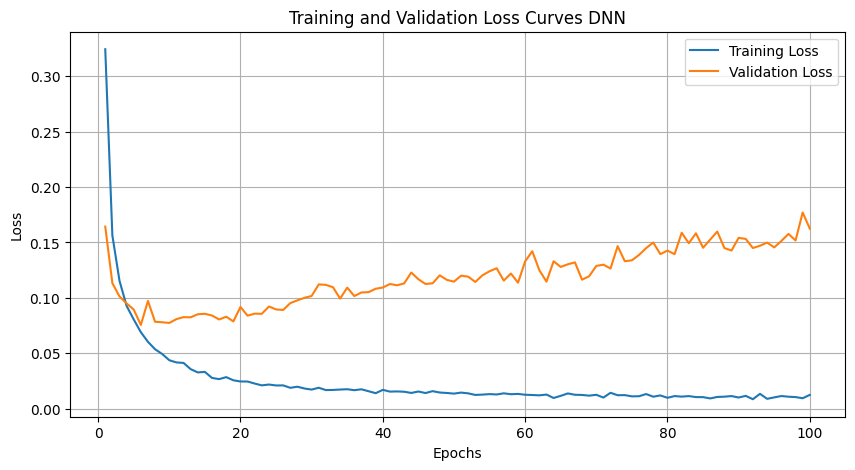

CLR for DNN is: 0.9796666666666667


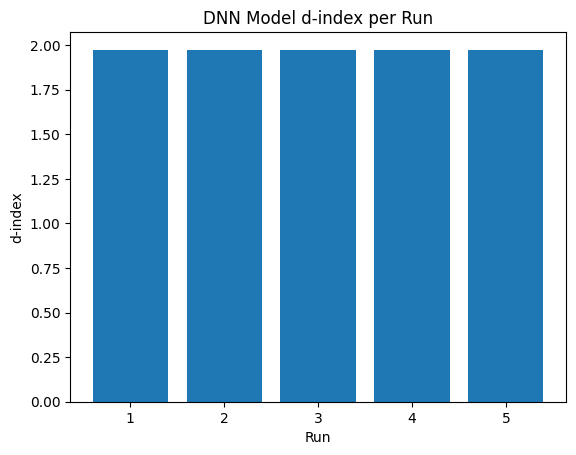

In [ ]:
mnist = tf.keras.datasets.mnist
(X_train, y_train), (X_test, y_test) = mnist.load_data()

# Flatten and normalize data
X_train = X_train.reshape(-1, 28*28) / 255.0
X_test = X_test.reshape(-1, 28*28) / 255.0

# Run the model with no preprocessing
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method=None)

### CNN

Epoch 1/100
1200/1200 [==============================] - 7s 4ms/step - loss: 0.2206 - accuracy: 0.9343 - val_loss: 0.0820 - val_accuracy: 0.9754
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0803 - accuracy: 0.9758 - val_loss: 0.0619 - val_accuracy: 0.9806
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0543 - accuracy: 0.9839 - val_loss: 0.0583 - val_accuracy: 0.9820
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0403 - accuracy: 0.9867 - val_loss: 0.0513 - val_accuracy: 0.9848
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0303 - accuracy: 0.9901 - val_loss: 0.0456 - val_accuracy: 0.9864
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0270 - accuracy: 0.9912 - val_loss: 0.0532 - val_accuracy: 0.9848
Epoch 7/100
1200/1200 [==============================] - 4s 4ms/step - loss: 0.0190 - accuracy: 0.9936 - val_loss: 0.0597 - val_ac

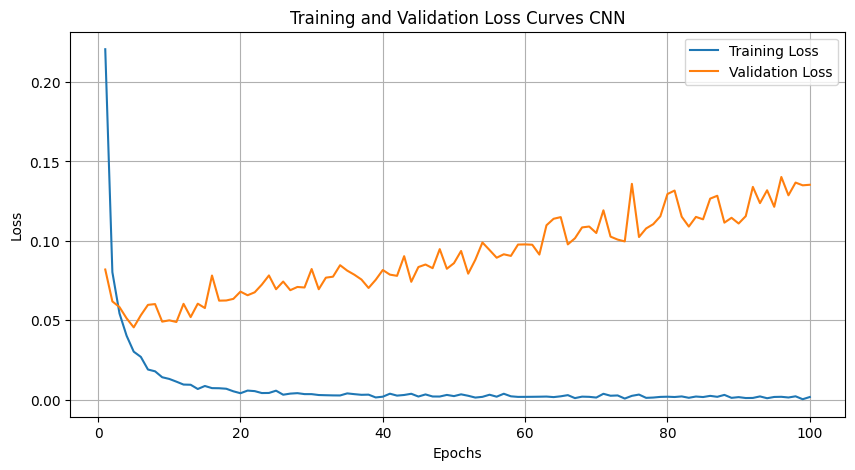

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.2264 - accuracy: 0.9312 - val_loss: 0.0872 - val_accuracy: 0.9726
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0806 - accuracy: 0.9758 - val_loss: 0.0670 - val_accuracy: 0.9791
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0567 - accuracy: 0.9824 - val_loss: 0.0581 - val_accuracy: 0.9815
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0396 - accuracy: 0.9877 - val_loss: 0.0505 - val_accuracy: 0.9851
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0300 - accuracy: 0.9904 - val_loss: 0.0453 - val_accuracy: 0.9869
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0249 - accuracy: 0.9917 - val_loss: 0.0491 - val_accuracy: 0.9858
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0185 - accuracy: 0.9941 - val_loss: 0.0524 - val_ac

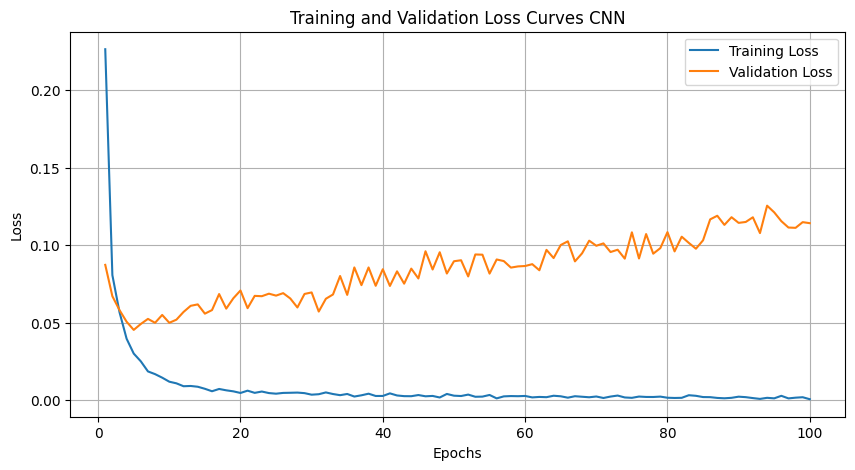

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.2154 - accuracy: 0.9351 - val_loss: 0.0794 - val_accuracy: 0.9755
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0751 - accuracy: 0.9774 - val_loss: 0.0597 - val_accuracy: 0.9818
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0531 - accuracy: 0.9832 - val_loss: 0.0532 - val_accuracy: 0.9842
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0355 - accuracy: 0.9883 - val_loss: 0.0533 - val_accuracy: 0.9837
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0285 - accuracy: 0.9907 - val_loss: 0.0485 - val_accuracy: 0.9854
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0226 - accuracy: 0.9924 - val_loss: 0.0484 - val_accuracy: 0.9870
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0187 - accuracy: 0.9936 - val_loss: 0.0504 - val_ac

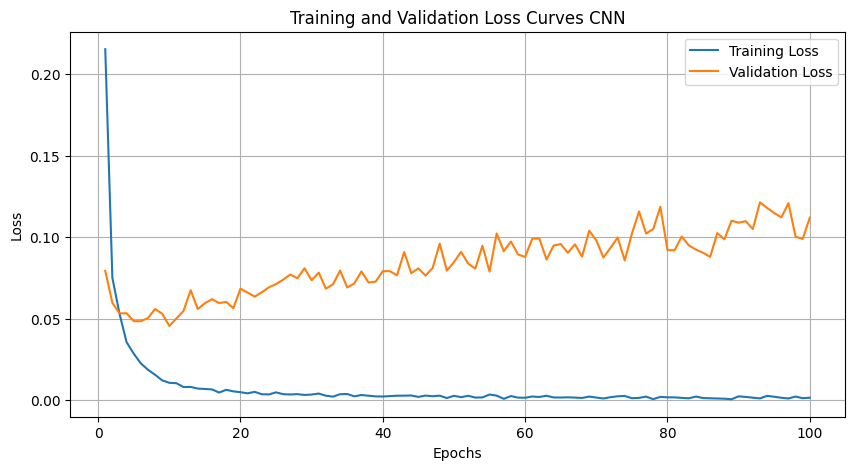

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.2299 - accuracy: 0.9317 - val_loss: 0.0894 - val_accuracy: 0.9719
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0788 - accuracy: 0.9763 - val_loss: 0.0605 - val_accuracy: 0.9808
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0539 - accuracy: 0.9837 - val_loss: 0.0552 - val_accuracy: 0.9830
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0400 - accuracy: 0.9874 - val_loss: 0.0578 - val_accuracy: 0.9828
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0309 - accuracy: 0.9901 - val_loss: 0.0493 - val_accuracy: 0.9859
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0233 - accuracy: 0.9922 - val_loss: 0.0504 - val_accuracy: 0.9857
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0192 - accuracy: 0.9940 - val_loss: 0.0581 - val_ac

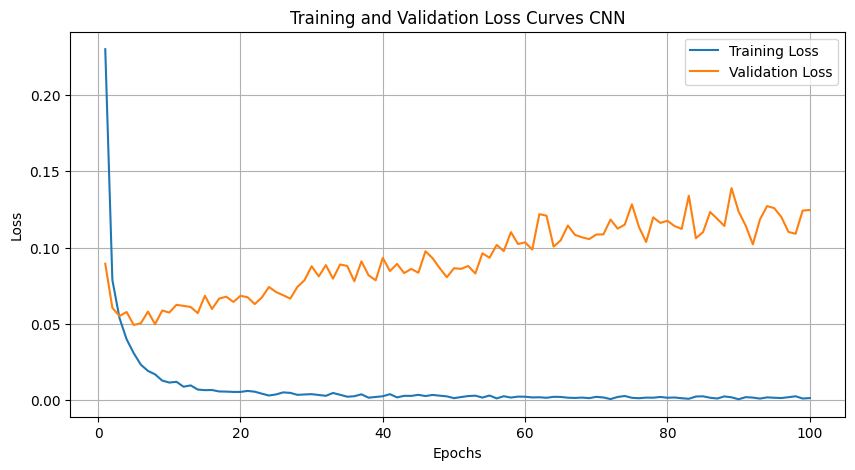

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.2097 - accuracy: 0.9370 - val_loss: 0.0785 - val_accuracy: 0.9749
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0750 - accuracy: 0.9772 - val_loss: 0.0569 - val_accuracy: 0.9824
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0522 - accuracy: 0.9831 - val_loss: 0.0542 - val_accuracy: 0.9833
Epoch 4/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.0377 - accuracy: 0.9878 - val_loss: 0.0525 - val_accuracy: 0.9822
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0275 - accuracy: 0.9909 - val_loss: 0.0510 - val_accuracy: 0.9837
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0219 - accuracy: 0.9930 - val_loss: 0.0534 - val_accuracy: 0.9837
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0195 - accuracy: 0.9936 - val_loss: 0.0483 - val_ac

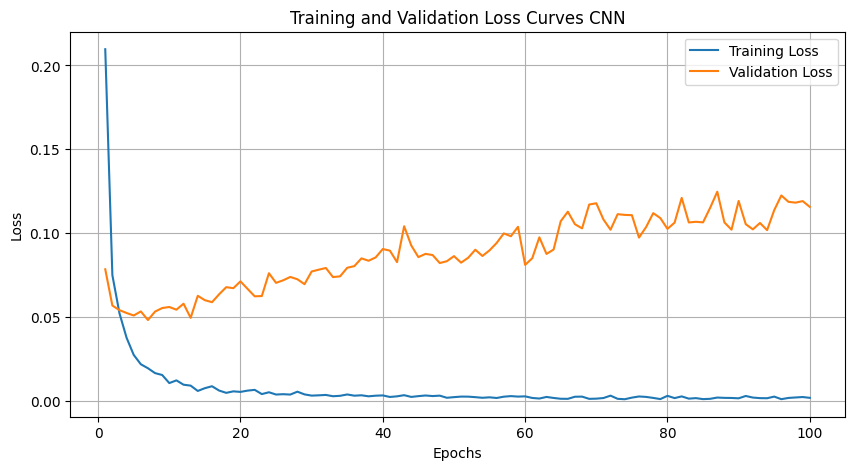

CLR for CNN is: 0.9876000000000001


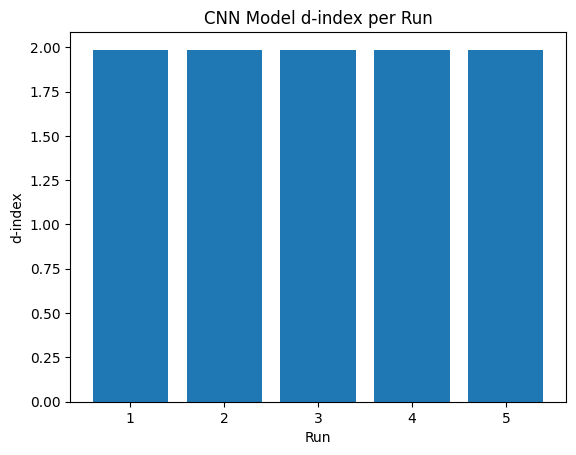

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method=None)

### LSTM

Epoch 1/100
1200/1200 [==============================] - 10s 7ms/step - loss: 0.4644 - accuracy: 0.8505 - val_loss: 0.1771 - val_accuracy: 0.9446
Epoch 2/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.1408 - accuracy: 0.9591 - val_loss: 0.1299 - val_accuracy: 0.9607
Epoch 3/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.1002 - accuracy: 0.9701 - val_loss: 0.0776 - val_accuracy: 0.9773
Epoch 4/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.0747 - accuracy: 0.9777 - val_loss: 0.0803 - val_accuracy: 0.9742
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0620 - accuracy: 0.9821 - val_loss: 0.0717 - val_accuracy: 0.9796
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0543 - accuracy: 0.9842 - val_loss: 0.0525 - val_accuracy: 0.9847
Epoch 7/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.0468 - accuracy: 0.9865 - val_loss: 0.0586 - val_a

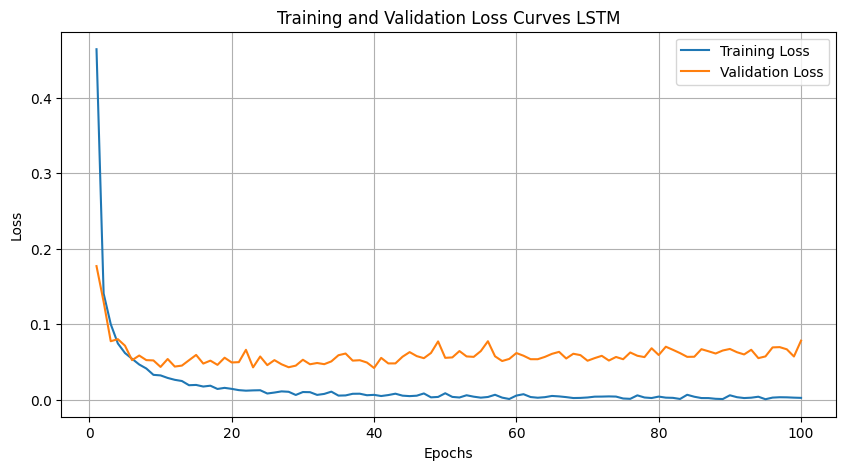

Epoch 1/100
1200/1200 [==============================] - 10s 7ms/step - loss: 0.4683 - accuracy: 0.8480 - val_loss: 0.1995 - val_accuracy: 0.9398
Epoch 2/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1535 - accuracy: 0.9540 - val_loss: 0.1415 - val_accuracy: 0.9586
Epoch 3/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.1037 - accuracy: 0.9692 - val_loss: 0.1022 - val_accuracy: 0.9682
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0803 - accuracy: 0.9759 - val_loss: 0.0913 - val_accuracy: 0.9729
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0616 - accuracy: 0.9818 - val_loss: 0.0578 - val_accuracy: 0.9819
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0566 - accuracy: 0.9830 - val_loss: 0.0590 - val_accuracy: 0.9818
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0469 - accuracy: 0.9857 - val_loss: 0.0536 - val_a

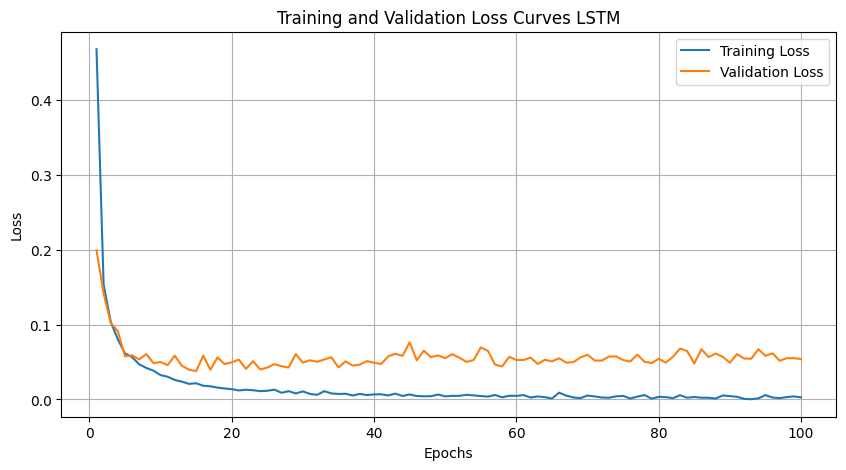

Epoch 1/100
1200/1200 [==============================] - 10s 6ms/step - loss: 0.4833 - accuracy: 0.8423 - val_loss: 0.1758 - val_accuracy: 0.9477
Epoch 2/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1509 - accuracy: 0.9548 - val_loss: 0.1340 - val_accuracy: 0.9601
Epoch 3/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.1042 - accuracy: 0.9696 - val_loss: 0.0858 - val_accuracy: 0.9739
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0782 - accuracy: 0.9761 - val_loss: 0.0734 - val_accuracy: 0.9786
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0629 - accuracy: 0.9806 - val_loss: 0.0666 - val_accuracy: 0.9807
Epoch 6/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0550 - accuracy: 0.9829 - val_loss: 0.0609 - val_accuracy: 0.9817
Epoch 7/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.0461 - accuracy: 0.9860 - val_loss: 0.0515 - val_a

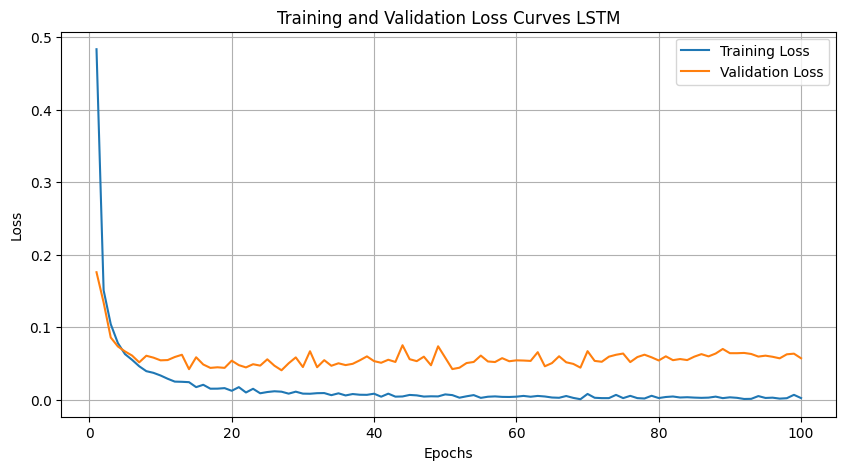

Epoch 1/100
1200/1200 [==============================] - 10s 6ms/step - loss: 0.4672 - accuracy: 0.8477 - val_loss: 0.1648 - val_accuracy: 0.9502
Epoch 2/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1467 - accuracy: 0.9560 - val_loss: 0.1264 - val_accuracy: 0.9589
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1017 - accuracy: 0.9693 - val_loss: 0.0781 - val_accuracy: 0.9752
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0762 - accuracy: 0.9772 - val_loss: 0.0718 - val_accuracy: 0.9778
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0611 - accuracy: 0.9816 - val_loss: 0.0658 - val_accuracy: 0.9801
Epoch 6/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.0544 - accuracy: 0.9837 - val_loss: 0.0564 - val_accuracy: 0.9827
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0498 - accuracy: 0.9845 - val_loss: 0.0625 - val_a

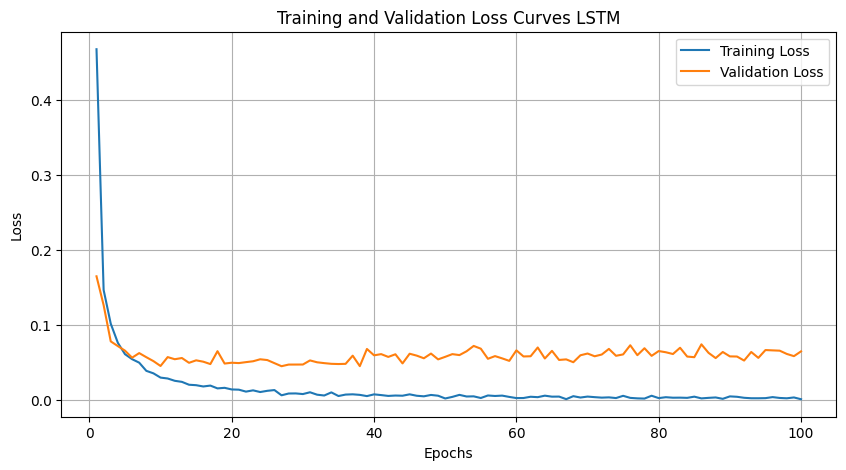

Epoch 1/100
1200/1200 [==============================] - 9s 6ms/step - loss: 0.4720 - accuracy: 0.8450 - val_loss: 0.1734 - val_accuracy: 0.9466
Epoch 2/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.1506 - accuracy: 0.9545 - val_loss: 0.1076 - val_accuracy: 0.9674
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1009 - accuracy: 0.9701 - val_loss: 0.0790 - val_accuracy: 0.9755
Epoch 4/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.0757 - accuracy: 0.9772 - val_loss: 0.0786 - val_accuracy: 0.9762
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0625 - accuracy: 0.9807 - val_loss: 0.0591 - val_accuracy: 0.9836
Epoch 6/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0548 - accuracy: 0.9837 - val_loss: 0.0634 - val_accuracy: 0.9809
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0471 - accuracy: 0.9864 - val_loss: 0.0608 - val_ac

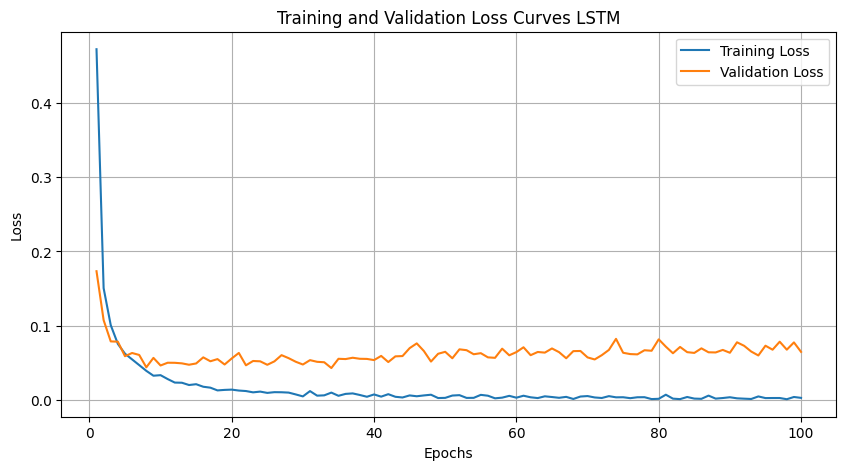

CLR for LSTM is: 0.9882666666666667


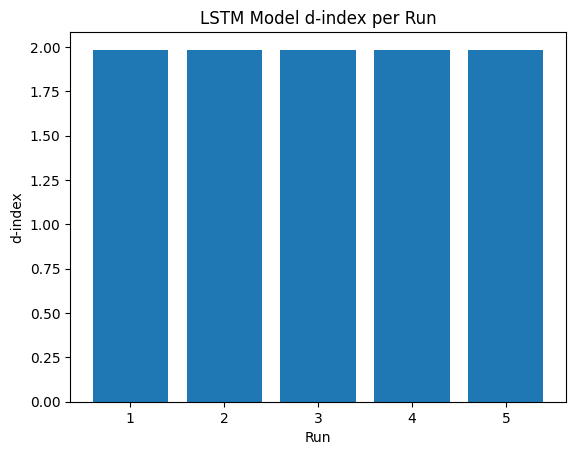

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method=None)

### GRU

Epoch 1/100
1200/1200 [==============================] - 9s 6ms/step - loss: 0.4956 - accuracy: 0.8356 - val_loss: 0.1877 - val_accuracy: 0.9452
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1479 - accuracy: 0.9567 - val_loss: 0.1459 - val_accuracy: 0.9560
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0992 - accuracy: 0.9708 - val_loss: 0.0859 - val_accuracy: 0.9727
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0756 - accuracy: 0.9770 - val_loss: 0.0676 - val_accuracy: 0.9786
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0580 - accuracy: 0.9825 - val_loss: 0.0577 - val_accuracy: 0.9835
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0513 - accuracy: 0.9849 - val_loss: 0.0521 - val_accuracy: 0.9850
Epoch 7/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.0417 - accuracy: 0.9871 - val_loss: 0.0545 - val_ac

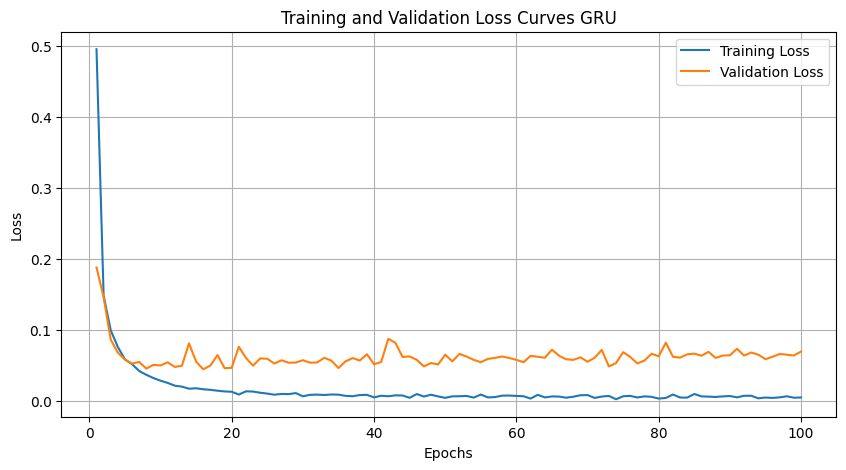

Epoch 1/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.4914 - accuracy: 0.8363 - val_loss: 0.1857 - val_accuracy: 0.9459
Epoch 2/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.1423 - accuracy: 0.9562 - val_loss: 0.1454 - val_accuracy: 0.9560
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0947 - accuracy: 0.9715 - val_loss: 0.0759 - val_accuracy: 0.9769
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0725 - accuracy: 0.9781 - val_loss: 0.0690 - val_accuracy: 0.9785
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0582 - accuracy: 0.9830 - val_loss: 0.0557 - val_accuracy: 0.9837
Epoch 6/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.0481 - accuracy: 0.9851 - val_loss: 0.0612 - val_accuracy: 0.9819
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0405 - accuracy: 0.9877 - val_loss: 0.0557 - val_ac

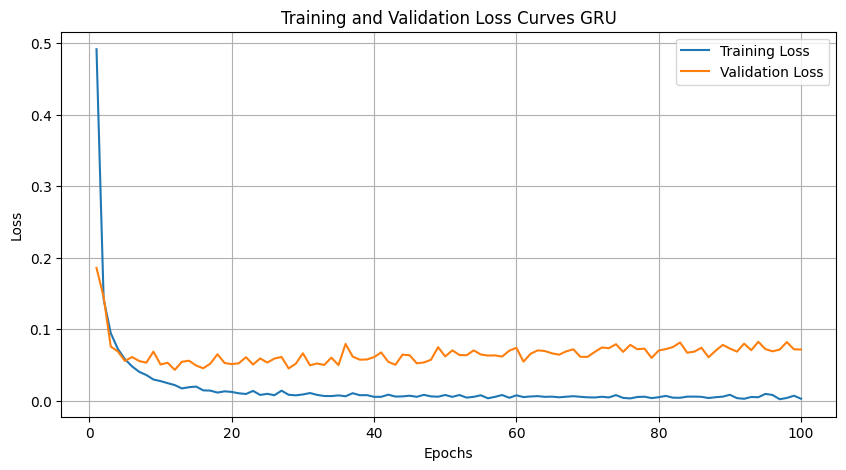

Epoch 1/100
1200/1200 [==============================] - 9s 6ms/step - loss: 0.4723 - accuracy: 0.8463 - val_loss: 0.1678 - val_accuracy: 0.9493
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1365 - accuracy: 0.9589 - val_loss: 0.1378 - val_accuracy: 0.9594
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0948 - accuracy: 0.9720 - val_loss: 0.0772 - val_accuracy: 0.9762
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0706 - accuracy: 0.9792 - val_loss: 0.0749 - val_accuracy: 0.9767
Epoch 5/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.0562 - accuracy: 0.9834 - val_loss: 0.0658 - val_accuracy: 0.9809
Epoch 6/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0494 - accuracy: 0.9849 - val_loss: 0.0601 - val_accuracy: 0.9814
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0423 - accuracy: 0.9867 - val_loss: 0.0530 - val_ac

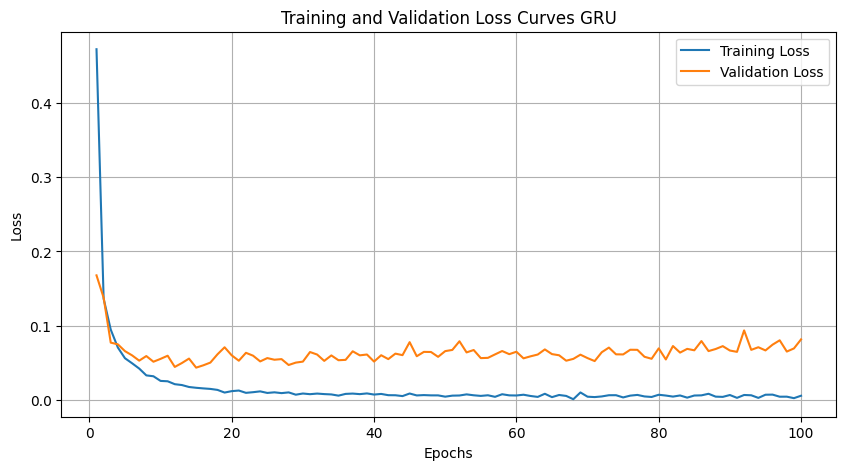

Epoch 1/100
1200/1200 [==============================] - 9s 6ms/step - loss: 0.5103 - accuracy: 0.8310 - val_loss: 0.1902 - val_accuracy: 0.9436
Epoch 2/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1513 - accuracy: 0.9543 - val_loss: 0.1398 - val_accuracy: 0.9577
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0991 - accuracy: 0.9710 - val_loss: 0.0865 - val_accuracy: 0.9730
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0765 - accuracy: 0.9777 - val_loss: 0.0836 - val_accuracy: 0.9765
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0581 - accuracy: 0.9822 - val_loss: 0.0650 - val_accuracy: 0.9796
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0521 - accuracy: 0.9842 - val_loss: 0.0657 - val_accuracy: 0.9807
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0397 - accuracy: 0.9885 - val_loss: 0.0560 - val_ac

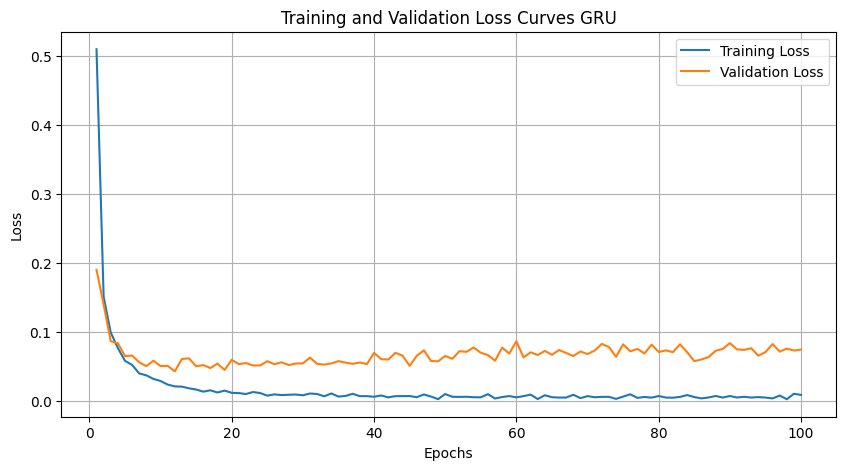

Epoch 1/100
1200/1200 [==============================] - 9s 6ms/step - loss: 0.5054 - accuracy: 0.8328 - val_loss: 0.1978 - val_accuracy: 0.9374
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1516 - accuracy: 0.9546 - val_loss: 0.1409 - val_accuracy: 0.9561
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0991 - accuracy: 0.9704 - val_loss: 0.0883 - val_accuracy: 0.9742
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0734 - accuracy: 0.9784 - val_loss: 0.0800 - val_accuracy: 0.9760
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0559 - accuracy: 0.9839 - val_loss: 0.0622 - val_accuracy: 0.9808
Epoch 6/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.0496 - accuracy: 0.9850 - val_loss: 0.0675 - val_accuracy: 0.9809
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0433 - accuracy: 0.9865 - val_loss: 0.0510 - val_ac

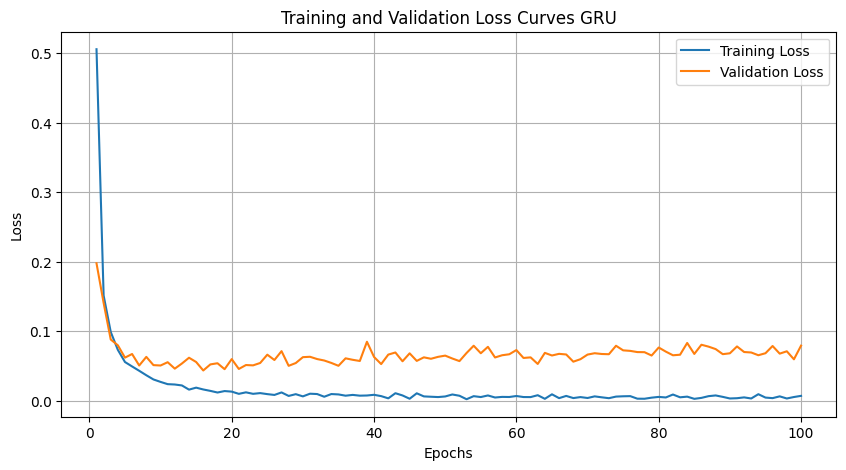

CLR for GRU is: 0.9864666666666666


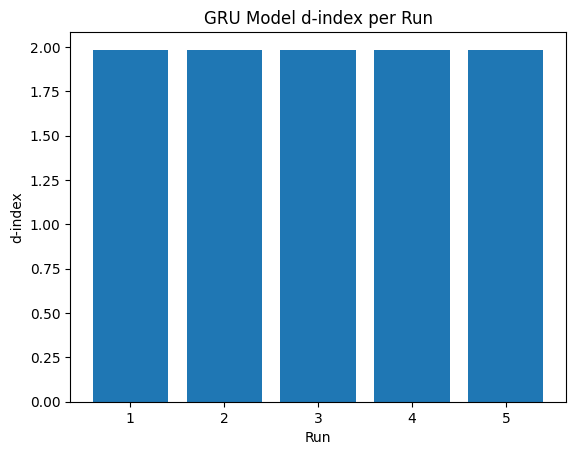

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method=None)

### PCA+TSNE DNN

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.5040 - accuracy: 0.8596 - val_loss: 0.2761 - val_accuracy: 0.9427
Epoch 2/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2879 - accuracy: 0.9423 - val_loss: 0.2270 - val_accuracy: 0.9672
Epoch 3/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2462 - accuracy: 0.9588 - val_loss: 0.2125 - val_accuracy: 0.9677
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2313 - accuracy: 0.9619 - val_loss: 0.2043 - val_accuracy: 0.9706
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2231 - accuracy: 0.9641 - val_loss: 0.2014 - val_accuracy: 0.9702
Epoch 6/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2213 - accuracy: 0.9648 - val_loss: 0.1968 - val_accuracy: 0.9701
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2164 - accuracy: 0.9653 - val_loss: 0.1921 - val_ac

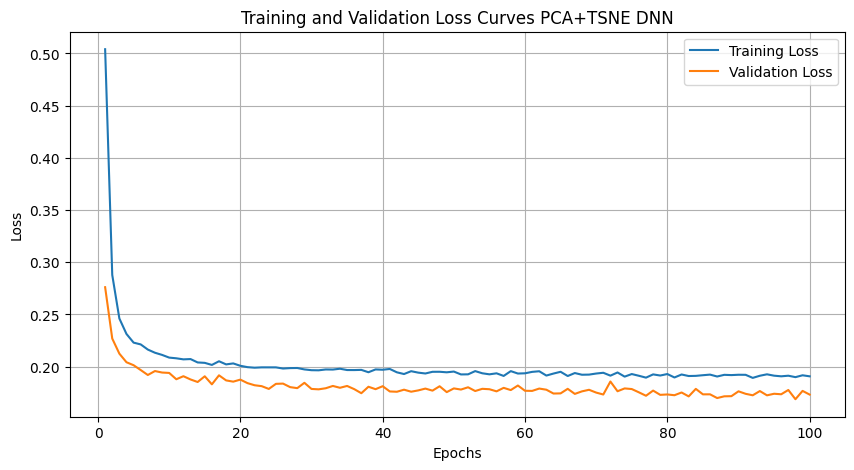

Epoch 1/100
1200/1200 [==============================] - 5s 3ms/step - loss: 0.4777 - accuracy: 0.8667 - val_loss: 0.2749 - val_accuracy: 0.9441
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2835 - accuracy: 0.9456 - val_loss: 0.2213 - val_accuracy: 0.9679
Epoch 3/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2427 - accuracy: 0.9595 - val_loss: 0.2132 - val_accuracy: 0.9684
Epoch 4/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2322 - accuracy: 0.9620 - val_loss: 0.2073 - val_accuracy: 0.9693
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2249 - accuracy: 0.9641 - val_loss: 0.2062 - val_accuracy: 0.9697
Epoch 6/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2234 - accuracy: 0.9643 - val_loss: 0.1966 - val_accuracy: 0.9701
Epoch 7/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2175 - accuracy: 0.9652 - val_loss: 0.1953 - val_ac

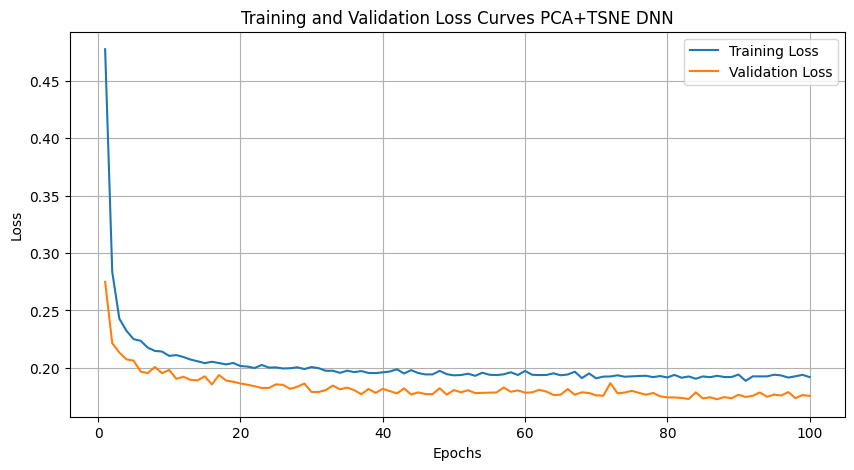

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.4914 - accuracy: 0.8646 - val_loss: 0.2671 - val_accuracy: 0.9443
Epoch 2/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2786 - accuracy: 0.9460 - val_loss: 0.2180 - val_accuracy: 0.9673
Epoch 3/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2416 - accuracy: 0.9590 - val_loss: 0.2129 - val_accuracy: 0.9674
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2302 - accuracy: 0.9627 - val_loss: 0.2033 - val_accuracy: 0.9697
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2192 - accuracy: 0.9642 - val_loss: 0.2011 - val_accuracy: 0.9695
Epoch 6/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2189 - accuracy: 0.9642 - val_loss: 0.1947 - val_accuracy: 0.9701
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2145 - accuracy: 0.9657 - val_loss: 0.1937 - val_ac

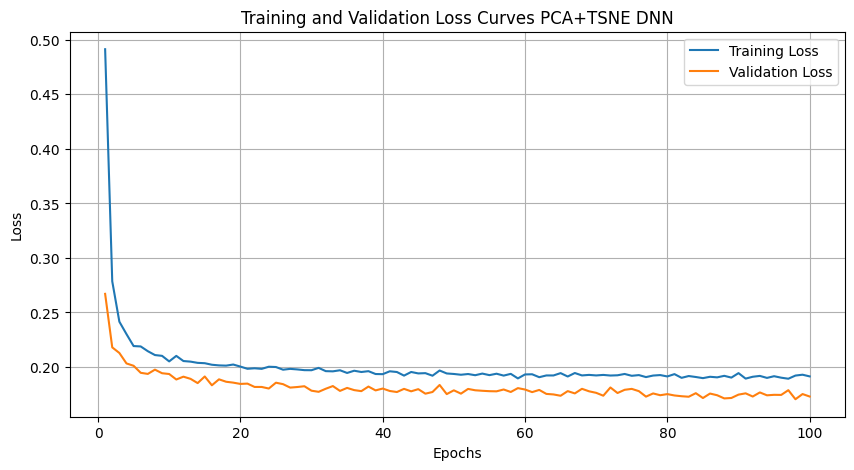

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.5205 - accuracy: 0.8559 - val_loss: 0.2807 - val_accuracy: 0.9384
Epoch 2/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2971 - accuracy: 0.9383 - val_loss: 0.2321 - val_accuracy: 0.9633
Epoch 3/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2504 - accuracy: 0.9553 - val_loss: 0.2164 - val_accuracy: 0.9661
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2342 - accuracy: 0.9605 - val_loss: 0.2062 - val_accuracy: 0.9701
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2239 - accuracy: 0.9635 - val_loss: 0.2037 - val_accuracy: 0.9702
Epoch 6/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2216 - accuracy: 0.9634 - val_loss: 0.1988 - val_accuracy: 0.9706
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2175 - accuracy: 0.9646 - val_loss: 0.1942 - val_ac

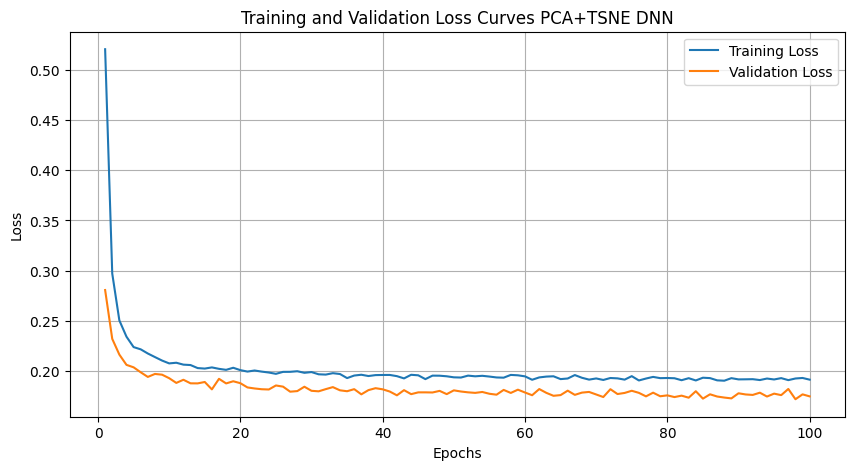

Epoch 1/100
1200/1200 [==============================] - 5s 3ms/step - loss: 0.5114 - accuracy: 0.8610 - val_loss: 0.2708 - val_accuracy: 0.9475
Epoch 2/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2850 - accuracy: 0.9450 - val_loss: 0.2243 - val_accuracy: 0.9661
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2440 - accuracy: 0.9592 - val_loss: 0.2165 - val_accuracy: 0.9655
Epoch 4/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2328 - accuracy: 0.9617 - val_loss: 0.2049 - val_accuracy: 0.9707
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2218 - accuracy: 0.9637 - val_loss: 0.2023 - val_accuracy: 0.9707
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2183 - accuracy: 0.9645 - val_loss: 0.1968 - val_accuracy: 0.9698
Epoch 7/100
1200/1200 [==============================] - 4s 4ms/step - loss: 0.2145 - accuracy: 0.9657 - val_loss: 0.1949 - val_ac

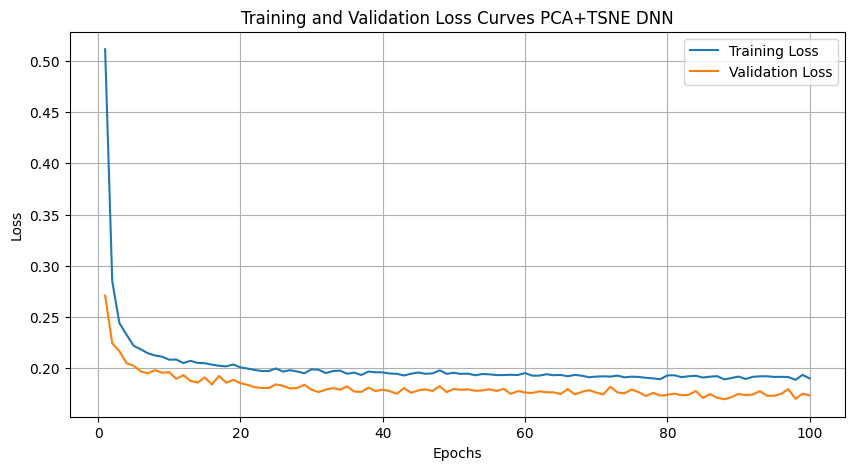

CLR for PCA+TSNE DNN is: 0.9714166666666667


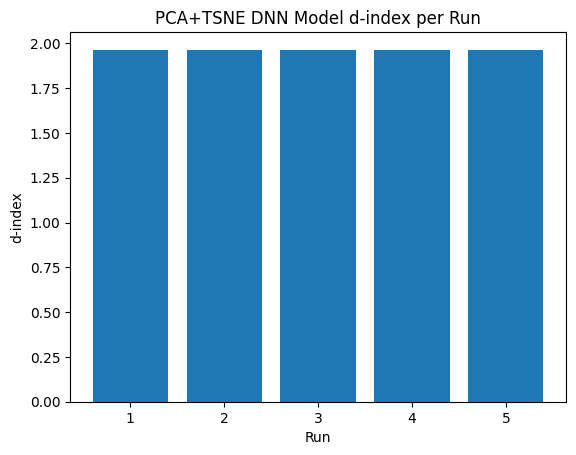

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE CNN

Epoch 1/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.4883 - accuracy: 0.8608 - val_loss: 0.2718 - val_accuracy: 0.9424
Epoch 2/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2847 - accuracy: 0.9446 - val_loss: 0.2235 - val_accuracy: 0.9665
Epoch 3/100
1200/1200 [==============================] - 4s 4ms/step - loss: 0.2460 - accuracy: 0.9578 - val_loss: 0.2129 - val_accuracy: 0.9684
Epoch 4/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2332 - accuracy: 0.9626 - val_loss: 0.2049 - val_accuracy: 0.9701
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2243 - accuracy: 0.9642 - val_loss: 0.2032 - val_accuracy: 0.9703
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2210 - accuracy: 0.9648 - val_loss: 0.1965 - val_accuracy: 0.9709
Epoch 7/100
1200/1200 [==============================] - 4s 4ms/step - loss: 0.2156 - accuracy: 0.9657 - val_loss: 0.1926 - val_ac

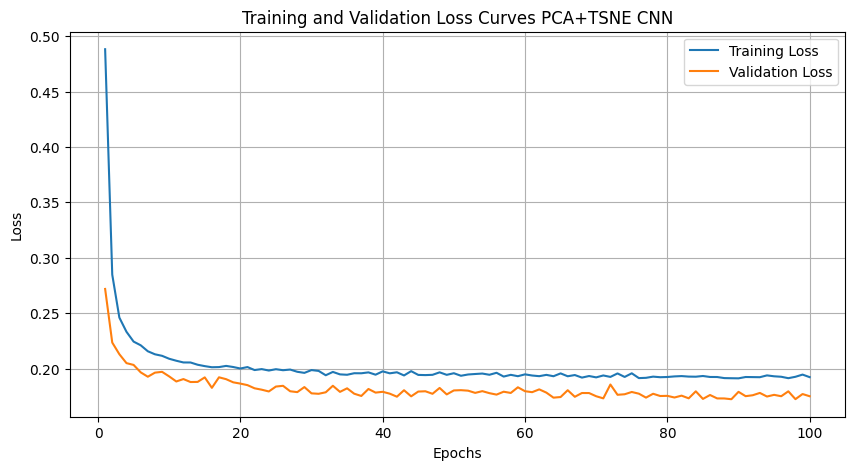

Epoch 1/100
1200/1200 [==============================] - 5s 3ms/step - loss: 0.4818 - accuracy: 0.8619 - val_loss: 0.2749 - val_accuracy: 0.9409
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2871 - accuracy: 0.9427 - val_loss: 0.2240 - val_accuracy: 0.9668
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2445 - accuracy: 0.9590 - val_loss: 0.2131 - val_accuracy: 0.9672
Epoch 4/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2334 - accuracy: 0.9616 - val_loss: 0.2054 - val_accuracy: 0.9708
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2245 - accuracy: 0.9640 - val_loss: 0.2049 - val_accuracy: 0.9701
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2239 - accuracy: 0.9644 - val_loss: 0.1975 - val_accuracy: 0.9707
Epoch 7/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2199 - accuracy: 0.9649 - val_loss: 0.1980 - val_ac

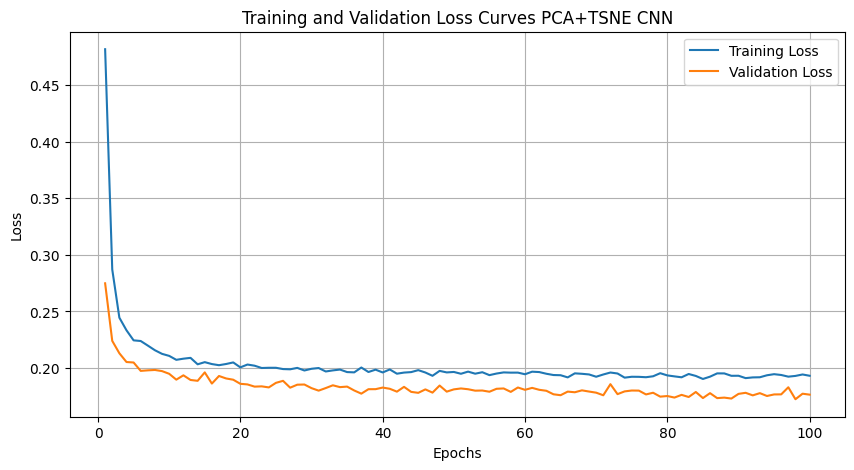

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.5147 - accuracy: 0.8593 - val_loss: 0.2693 - val_accuracy: 0.9455
Epoch 2/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2844 - accuracy: 0.9442 - val_loss: 0.2218 - val_accuracy: 0.9673
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2447 - accuracy: 0.9581 - val_loss: 0.2126 - val_accuracy: 0.9677
Epoch 4/100
1200/1200 [==============================] - 4s 4ms/step - loss: 0.2328 - accuracy: 0.9615 - val_loss: 0.2038 - val_accuracy: 0.9703
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2245 - accuracy: 0.9634 - val_loss: 0.2017 - val_accuracy: 0.9708
Epoch 6/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2202 - accuracy: 0.9644 - val_loss: 0.1976 - val_accuracy: 0.9701
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2160 - accuracy: 0.9643 - val_loss: 0.1917 - val_ac

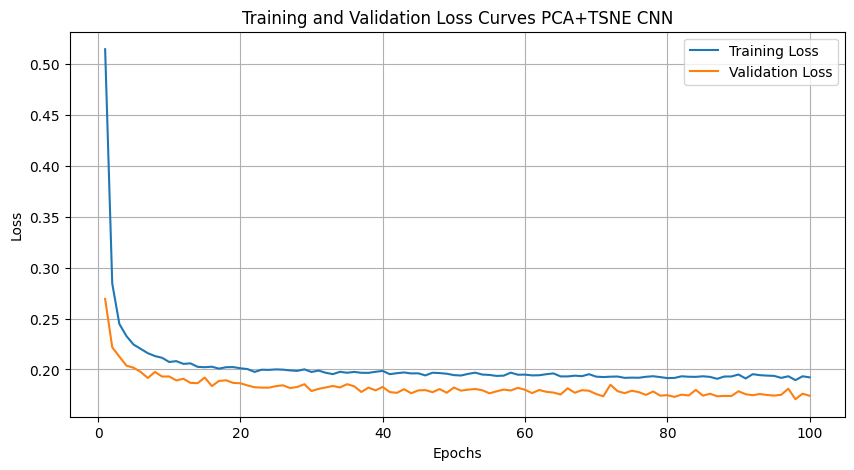

Epoch 1/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.4881 - accuracy: 0.8632 - val_loss: 0.2736 - val_accuracy: 0.9442
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2861 - accuracy: 0.9423 - val_loss: 0.2231 - val_accuracy: 0.9667
Epoch 3/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2449 - accuracy: 0.9571 - val_loss: 0.2155 - val_accuracy: 0.9644
Epoch 4/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2315 - accuracy: 0.9619 - val_loss: 0.2057 - val_accuracy: 0.9698
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2243 - accuracy: 0.9633 - val_loss: 0.2023 - val_accuracy: 0.9704
Epoch 6/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2206 - accuracy: 0.9643 - val_loss: 0.1990 - val_accuracy: 0.9692
Epoch 7/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2157 - accuracy: 0.9652 - val_loss: 0.1943 - val_ac

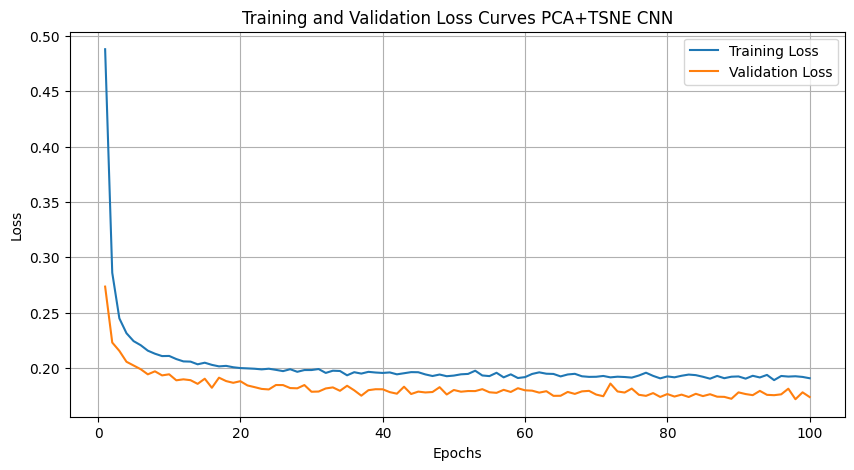

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.4782 - accuracy: 0.8672 - val_loss: 0.2663 - val_accuracy: 0.9468
Epoch 2/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2794 - accuracy: 0.9455 - val_loss: 0.2199 - val_accuracy: 0.9675
Epoch 3/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2444 - accuracy: 0.9585 - val_loss: 0.2120 - val_accuracy: 0.9664
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2309 - accuracy: 0.9611 - val_loss: 0.2020 - val_accuracy: 0.9707
Epoch 5/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2225 - accuracy: 0.9641 - val_loss: 0.2020 - val_accuracy: 0.9704
Epoch 6/100
1200/1200 [==============================] - 4s 3ms/step - loss: 0.2185 - accuracy: 0.9648 - val_loss: 0.1956 - val_accuracy: 0.9690
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2139 - accuracy: 0.9644 - val_loss: 0.1937 - val_ac

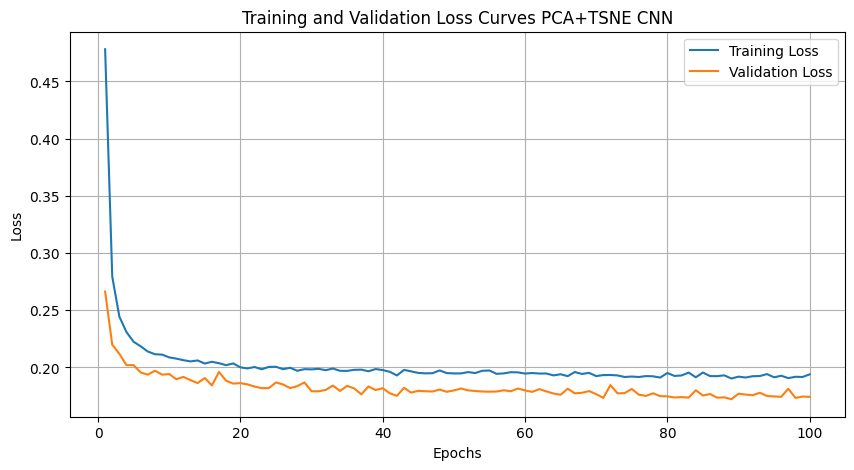

CLR for PCA+TSNE CNN is: 0.9714166666666667


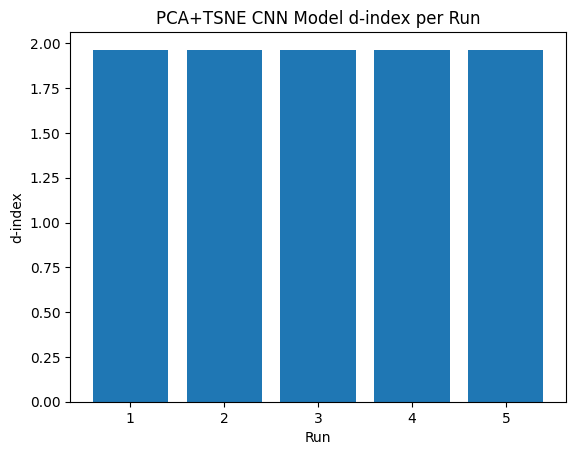

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE LSTM

Epoch 1/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.3061 - accuracy: 0.9359 - val_loss: 0.1786 - val_accuracy: 0.9695
Epoch 2/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1840 - accuracy: 0.9685 - val_loss: 0.1635 - val_accuracy: 0.9717
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1728 - accuracy: 0.9688 - val_loss: 0.1620 - val_accuracy: 0.9714
Epoch 4/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.1671 - accuracy: 0.9699 - val_loss: 0.1544 - val_accuracy: 0.9723
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1619 - accuracy: 0.9711 - val_loss: 0.1528 - val_accuracy: 0.9720
Epoch 6/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1605 - accuracy: 0.9712 - val_loss: 0.1480 - val_accuracy: 0.9727
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1551 - accuracy: 0.9711 - val_loss: 0.1523 - val_ac

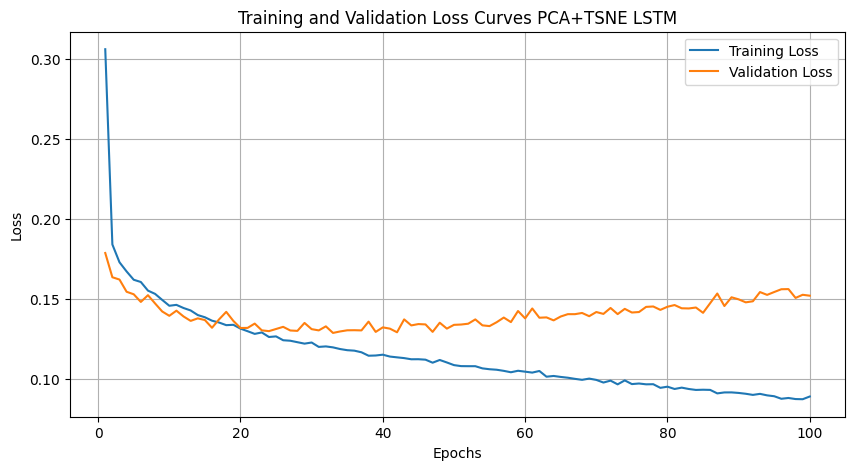

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.3060 - accuracy: 0.9374 - val_loss: 0.1769 - val_accuracy: 0.9685
Epoch 2/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1836 - accuracy: 0.9680 - val_loss: 0.1608 - val_accuracy: 0.9720
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1732 - accuracy: 0.9698 - val_loss: 0.1601 - val_accuracy: 0.9715
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1672 - accuracy: 0.9702 - val_loss: 0.1537 - val_accuracy: 0.9723
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1613 - accuracy: 0.9705 - val_loss: 0.1535 - val_accuracy: 0.9716
Epoch 6/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.1590 - accuracy: 0.9709 - val_loss: 0.1487 - val_accuracy: 0.9726
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1557 - accuracy: 0.9712 - val_loss: 0.1505 - val_ac

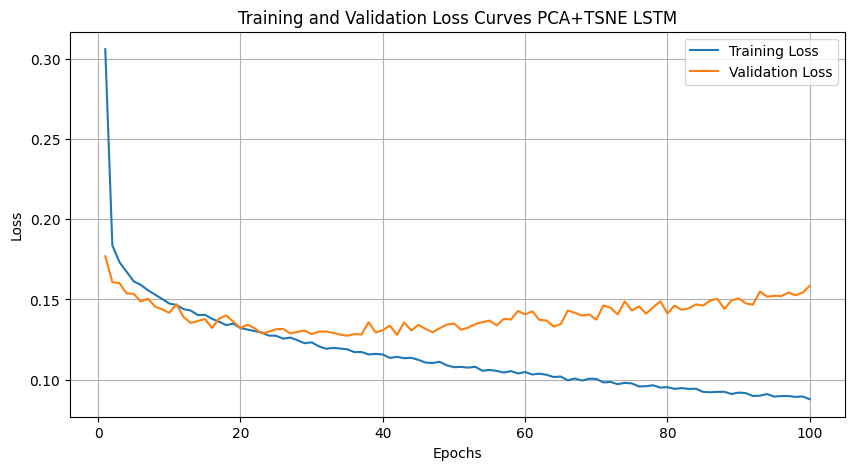

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.3026 - accuracy: 0.9363 - val_loss: 0.1762 - val_accuracy: 0.9694
Epoch 2/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1835 - accuracy: 0.9682 - val_loss: 0.1614 - val_accuracy: 0.9716
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1718 - accuracy: 0.9692 - val_loss: 0.1599 - val_accuracy: 0.9715
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1664 - accuracy: 0.9702 - val_loss: 0.1566 - val_accuracy: 0.9716
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1606 - accuracy: 0.9707 - val_loss: 0.1515 - val_accuracy: 0.9722
Epoch 6/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.1569 - accuracy: 0.9709 - val_loss: 0.1469 - val_accuracy: 0.9725
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1530 - accuracy: 0.9711 - val_loss: 0.1509 - val_ac

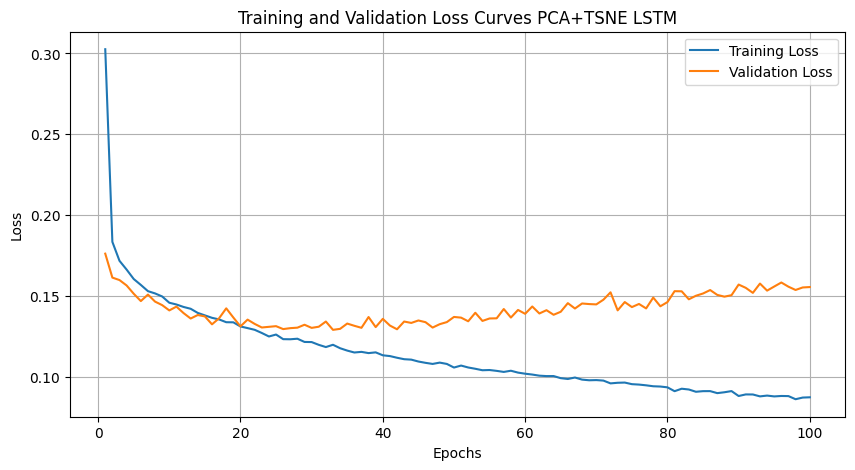

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.3081 - accuracy: 0.9354 - val_loss: 0.1787 - val_accuracy: 0.9690
Epoch 2/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.1853 - accuracy: 0.9685 - val_loss: 0.1642 - val_accuracy: 0.9711
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1711 - accuracy: 0.9695 - val_loss: 0.1611 - val_accuracy: 0.9725
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1683 - accuracy: 0.9698 - val_loss: 0.1548 - val_accuracy: 0.9726
Epoch 5/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.1613 - accuracy: 0.9708 - val_loss: 0.1526 - val_accuracy: 0.9723
Epoch 6/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1581 - accuracy: 0.9711 - val_loss: 0.1476 - val_accuracy: 0.9725
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1537 - accuracy: 0.9716 - val_loss: 0.1510 - val_ac

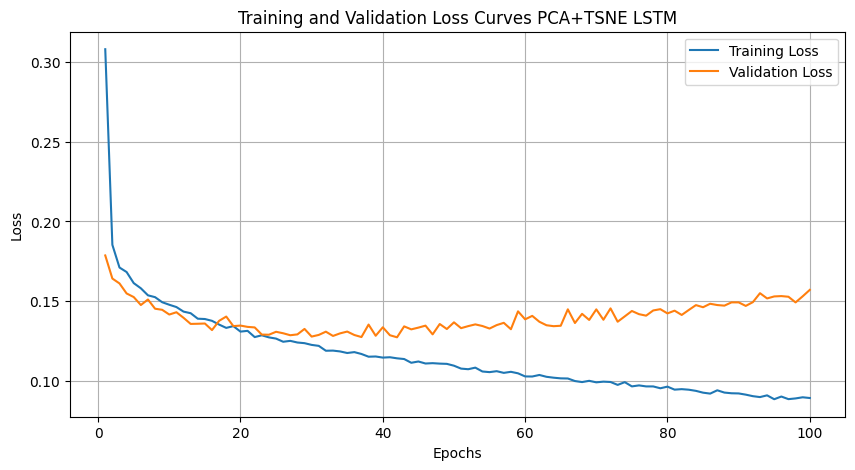

Epoch 1/100
1200/1200 [==============================] - 9s 6ms/step - loss: 0.3117 - accuracy: 0.9352 - val_loss: 0.1771 - val_accuracy: 0.9696
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1844 - accuracy: 0.9685 - val_loss: 0.1612 - val_accuracy: 0.9717
Epoch 3/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1708 - accuracy: 0.9694 - val_loss: 0.1601 - val_accuracy: 0.9720
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1670 - accuracy: 0.9700 - val_loss: 0.1539 - val_accuracy: 0.9723
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1606 - accuracy: 0.9711 - val_loss: 0.1532 - val_accuracy: 0.9723
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1585 - accuracy: 0.9708 - val_loss: 0.1468 - val_accuracy: 0.9729
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1538 - accuracy: 0.9712 - val_loss: 0.1472 - val_ac

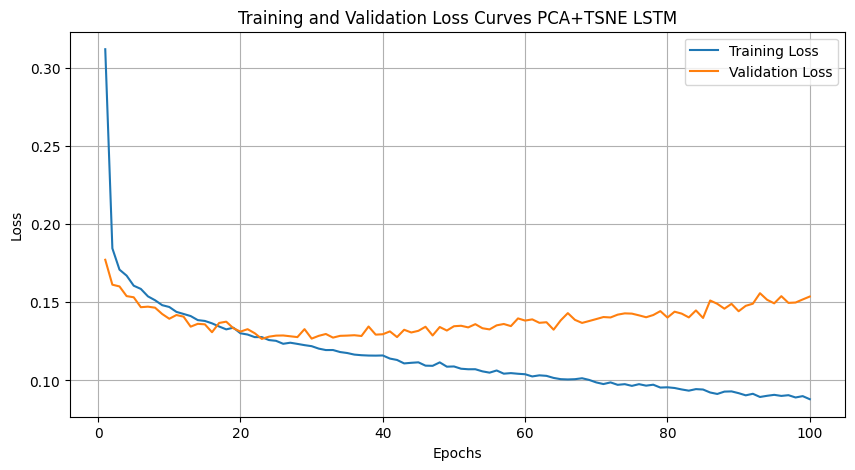

CLR for PCA+TSNE LSTM is: 0.9766333333333334


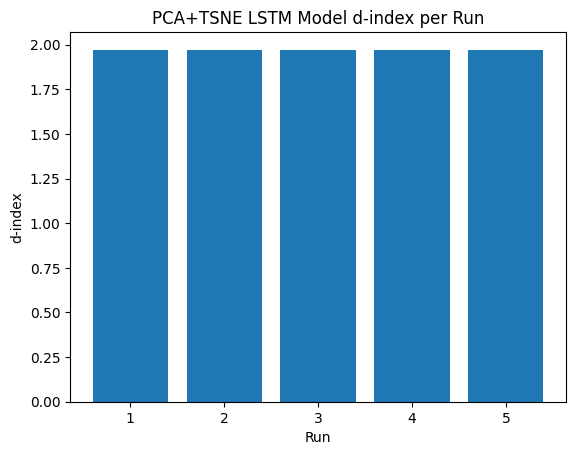

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE GRU

Epoch 1/100
1200/1200 [==============================] - 15s 7ms/step - loss: 0.3313 - accuracy: 0.9289 - val_loss: 0.1950 - val_accuracy: 0.9680
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2057 - accuracy: 0.9654 - val_loss: 0.1746 - val_accuracy: 0.9707
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1910 - accuracy: 0.9670 - val_loss: 0.1714 - val_accuracy: 0.9714
Epoch 4/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.1861 - accuracy: 0.9680 - val_loss: 0.1659 - val_accuracy: 0.9710
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1788 - accuracy: 0.9686 - val_loss: 0.1645 - val_accuracy: 0.9711
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1756 - accuracy: 0.9688 - val_loss: 0.1585 - val_accuracy: 0.9718
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1728 - accuracy: 0.9694 - val_loss: 0.1583 - val_a

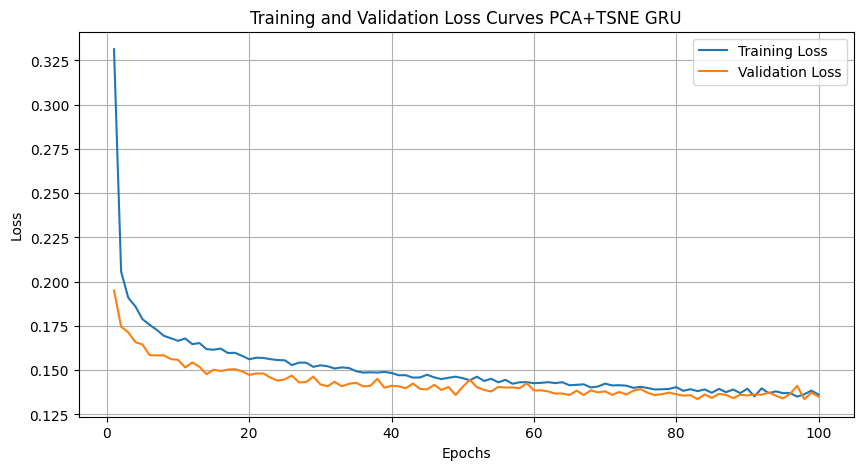

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.3349 - accuracy: 0.9279 - val_loss: 0.1940 - val_accuracy: 0.9690
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2054 - accuracy: 0.9658 - val_loss: 0.1760 - val_accuracy: 0.9706
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1905 - accuracy: 0.9677 - val_loss: 0.1705 - val_accuracy: 0.9709
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1847 - accuracy: 0.9677 - val_loss: 0.1651 - val_accuracy: 0.9716
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1782 - accuracy: 0.9695 - val_loss: 0.1635 - val_accuracy: 0.9711
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1763 - accuracy: 0.9690 - val_loss: 0.1597 - val_accuracy: 0.9712
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1746 - accuracy: 0.9689 - val_loss: 0.1583 - val_ac

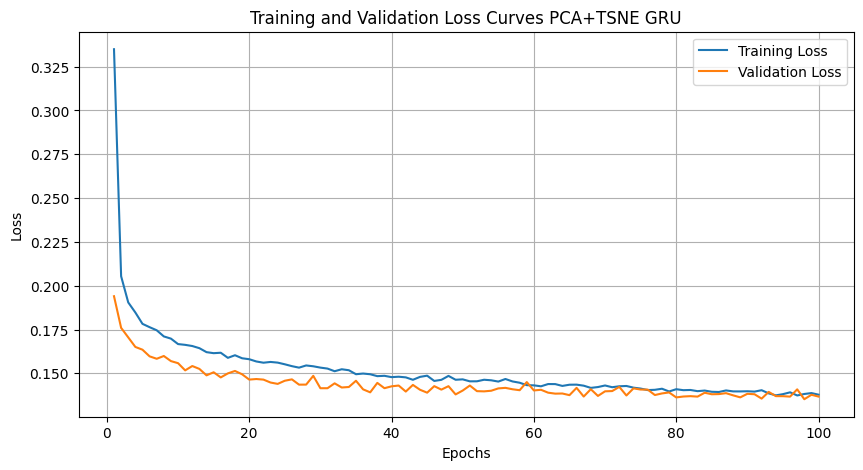

Epoch 1/100
1200/1200 [==============================] - 8s 5ms/step - loss: 0.3412 - accuracy: 0.9261 - val_loss: 0.1955 - val_accuracy: 0.9693
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2050 - accuracy: 0.9654 - val_loss: 0.1768 - val_accuracy: 0.9707
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1906 - accuracy: 0.9669 - val_loss: 0.1716 - val_accuracy: 0.9710
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1841 - accuracy: 0.9682 - val_loss: 0.1662 - val_accuracy: 0.9702
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1775 - accuracy: 0.9690 - val_loss: 0.1649 - val_accuracy: 0.9703
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1771 - accuracy: 0.9687 - val_loss: 0.1588 - val_accuracy: 0.9716
Epoch 7/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.1722 - accuracy: 0.9698 - val_loss: 0.1574 - val_ac

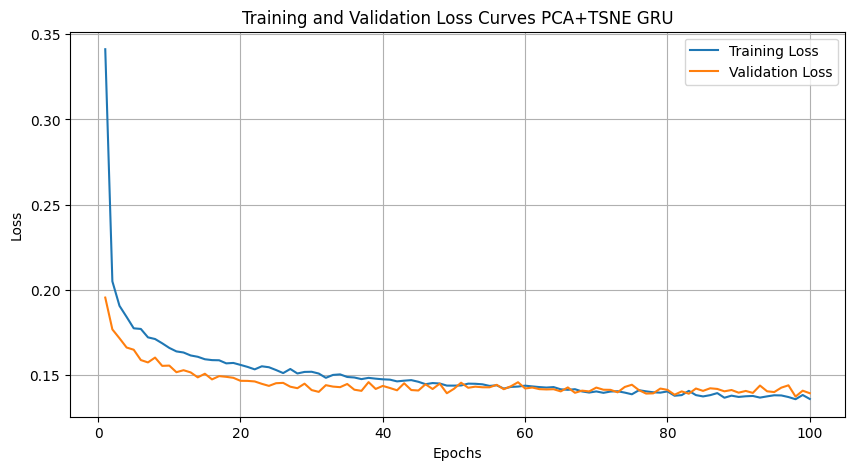

Epoch 1/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.3429 - accuracy: 0.9246 - val_loss: 0.1947 - val_accuracy: 0.9696
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2093 - accuracy: 0.9647 - val_loss: 0.1775 - val_accuracy: 0.9710
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1926 - accuracy: 0.9672 - val_loss: 0.1717 - val_accuracy: 0.9710
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1847 - accuracy: 0.9684 - val_loss: 0.1650 - val_accuracy: 0.9714
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1781 - accuracy: 0.9691 - val_loss: 0.1628 - val_accuracy: 0.9707
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1772 - accuracy: 0.9695 - val_loss: 0.1587 - val_accuracy: 0.9720
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1740 - accuracy: 0.9689 - val_loss: 0.1573 - val_ac

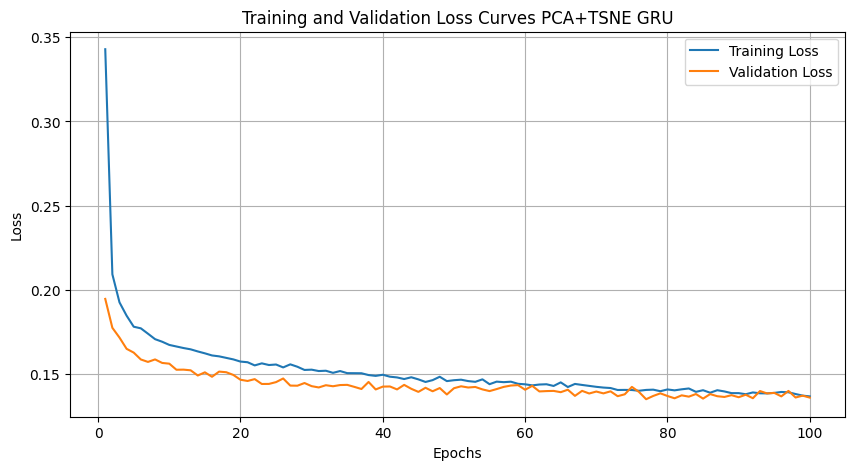

Epoch 1/100
1200/1200 [==============================] - 7s 4ms/step - loss: 0.3421 - accuracy: 0.9271 - val_loss: 0.2004 - val_accuracy: 0.9683
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2089 - accuracy: 0.9649 - val_loss: 0.1798 - val_accuracy: 0.9712
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1912 - accuracy: 0.9673 - val_loss: 0.1723 - val_accuracy: 0.9704
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1836 - accuracy: 0.9674 - val_loss: 0.1673 - val_accuracy: 0.9708
Epoch 5/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.1789 - accuracy: 0.9685 - val_loss: 0.1648 - val_accuracy: 0.9707
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1779 - accuracy: 0.9690 - val_loss: 0.1619 - val_accuracy: 0.9715
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1727 - accuracy: 0.9695 - val_loss: 0.1587 - val_ac

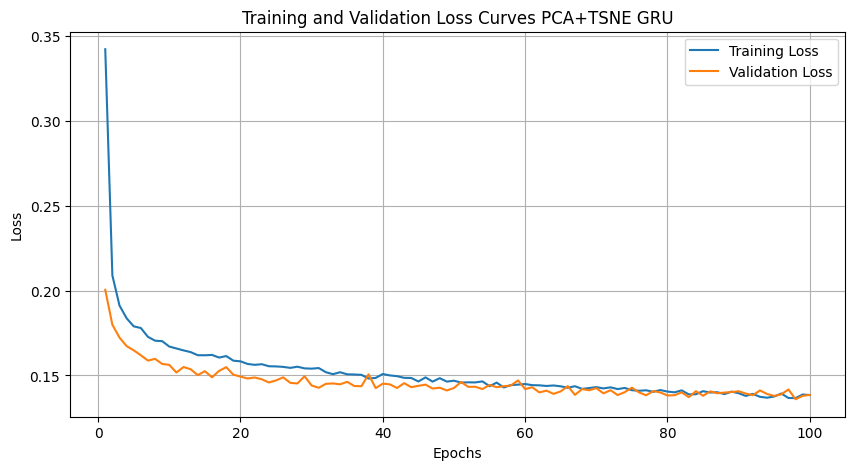

CLR for PCA+TSNE GRU is: 0.9743999999999999


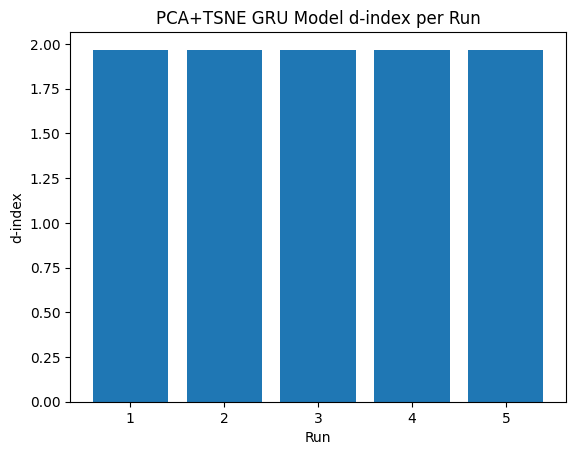

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE 7 LAYER DNN

Epoch 1/100
1200/1200 [==============================] - 8s 5ms/step - loss: 0.3417 - accuracy: 0.9180 - val_loss: 0.1866 - val_accuracy: 0.9629
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2150 - accuracy: 0.9619 - val_loss: 0.1693 - val_accuracy: 0.9707
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1984 - accuracy: 0.9657 - val_loss: 0.1671 - val_accuracy: 0.9701
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1919 - accuracy: 0.9683 - val_loss: 0.1532 - val_accuracy: 0.9723
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1822 - accuracy: 0.9691 - val_loss: 0.1689 - val_accuracy: 0.9676
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1824 - accuracy: 0.9686 - val_loss: 0.1534 - val_accuracy: 0.9711
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1758 - accuracy: 0.9698 - val_loss: 0.1608 - val_ac

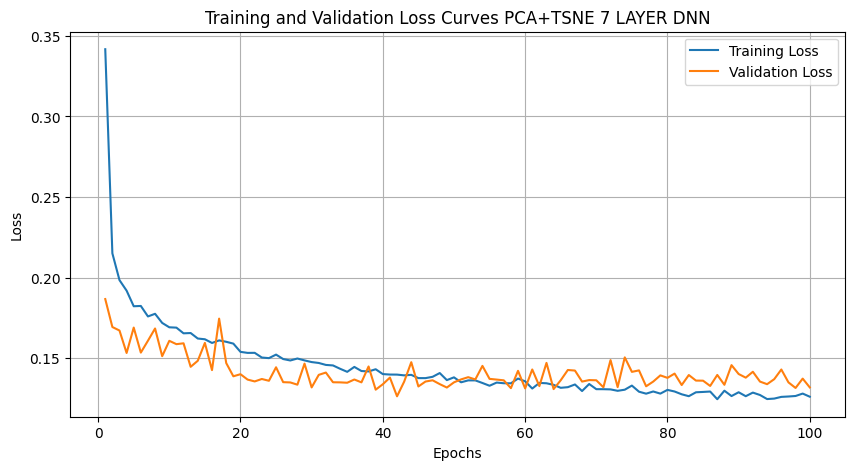

Epoch 1/100
1200/1200 [==============================] - 8s 4ms/step - loss: 0.3660 - accuracy: 0.9113 - val_loss: 0.2037 - val_accuracy: 0.9584
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2199 - accuracy: 0.9617 - val_loss: 0.1758 - val_accuracy: 0.9675
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2005 - accuracy: 0.9649 - val_loss: 0.1802 - val_accuracy: 0.9647
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1951 - accuracy: 0.9667 - val_loss: 0.1556 - val_accuracy: 0.9721
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1849 - accuracy: 0.9691 - val_loss: 0.1734 - val_accuracy: 0.9668
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1859 - accuracy: 0.9686 - val_loss: 0.2587 - val_accuracy: 0.9499
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1791 - accuracy: 0.9693 - val_loss: 0.1689 - val_ac

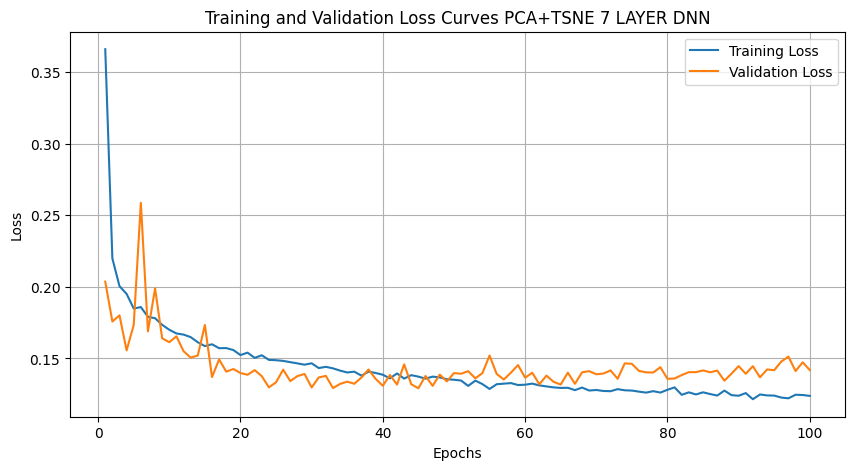

Epoch 1/100
1200/1200 [==============================] - 8s 5ms/step - loss: 0.3490 - accuracy: 0.9136 - val_loss: 0.1860 - val_accuracy: 0.9656
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2141 - accuracy: 0.9622 - val_loss: 0.1675 - val_accuracy: 0.9711
Epoch 3/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.2000 - accuracy: 0.9654 - val_loss: 0.1730 - val_accuracy: 0.9676
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1937 - accuracy: 0.9674 - val_loss: 0.1571 - val_accuracy: 0.9715
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1855 - accuracy: 0.9683 - val_loss: 0.1640 - val_accuracy: 0.9670
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1852 - accuracy: 0.9673 - val_loss: 0.1919 - val_accuracy: 0.9594
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1763 - accuracy: 0.9695 - val_loss: 0.1708 - val_ac

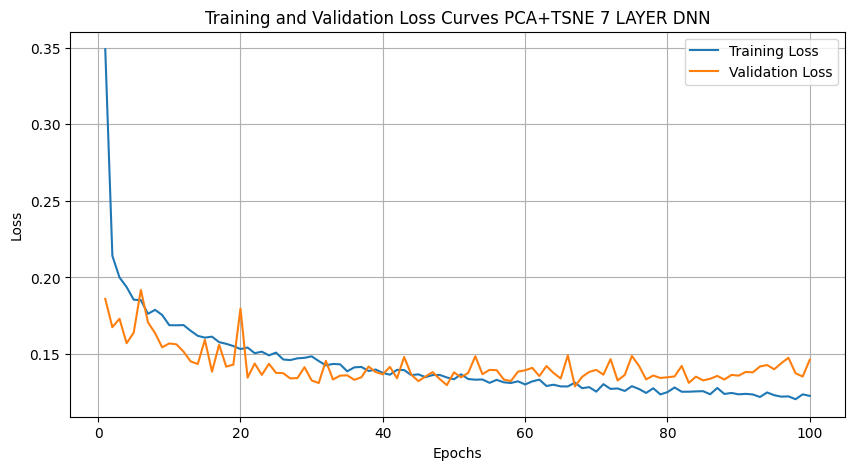

Epoch 1/100
1200/1200 [==============================] - 8s 5ms/step - loss: 0.3525 - accuracy: 0.9145 - val_loss: 0.1864 - val_accuracy: 0.9649
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2162 - accuracy: 0.9623 - val_loss: 0.1732 - val_accuracy: 0.9691
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2032 - accuracy: 0.9656 - val_loss: 0.1850 - val_accuracy: 0.9664
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1973 - accuracy: 0.9666 - val_loss: 0.1578 - val_accuracy: 0.9703
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1861 - accuracy: 0.9685 - val_loss: 0.1697 - val_accuracy: 0.9665
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1834 - accuracy: 0.9691 - val_loss: 0.1602 - val_accuracy: 0.9701
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1773 - accuracy: 0.9696 - val_loss: 0.1653 - val_ac

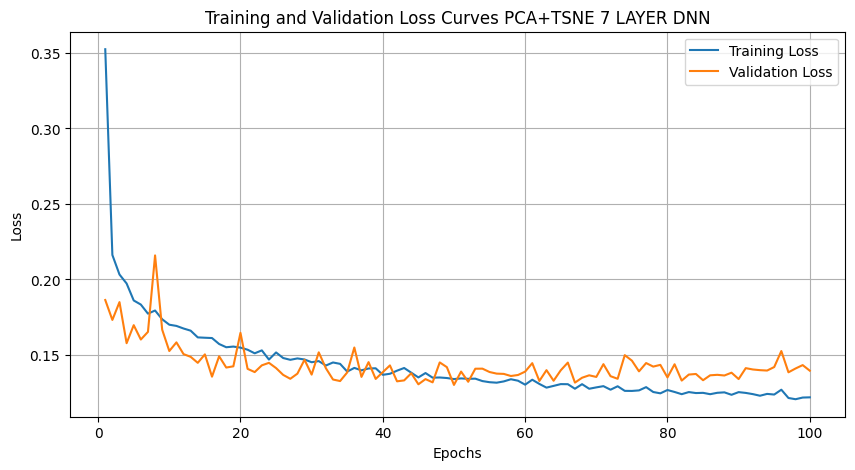

Epoch 1/100
1200/1200 [==============================] - 8s 5ms/step - loss: 0.3517 - accuracy: 0.9138 - val_loss: 0.1904 - val_accuracy: 0.9607
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2164 - accuracy: 0.9618 - val_loss: 0.1749 - val_accuracy: 0.9700
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2009 - accuracy: 0.9652 - val_loss: 0.1808 - val_accuracy: 0.9678
Epoch 4/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.1958 - accuracy: 0.9670 - val_loss: 0.1560 - val_accuracy: 0.9718
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1857 - accuracy: 0.9688 - val_loss: 0.1684 - val_accuracy: 0.9664
Epoch 6/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1834 - accuracy: 0.9688 - val_loss: 0.1501 - val_accuracy: 0.9721
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1759 - accuracy: 0.9697 - val_loss: 0.1586 - val_ac

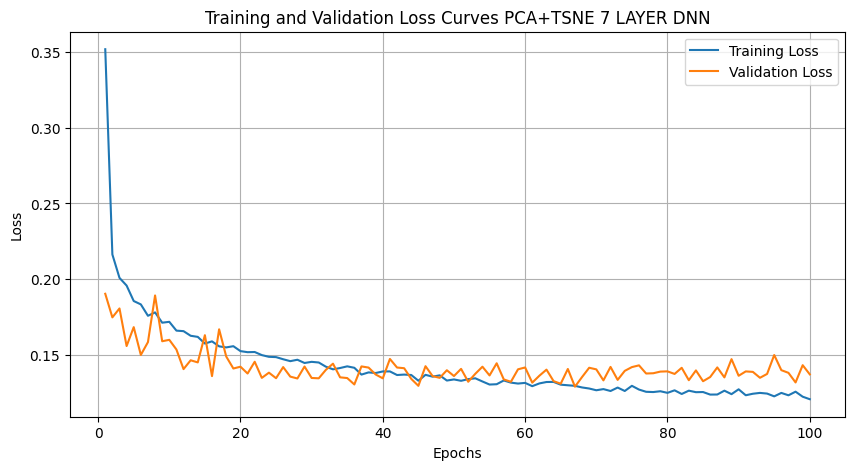

CLR for PCA+TSNE 7 LAYER DNN is: 0.9744833333333334


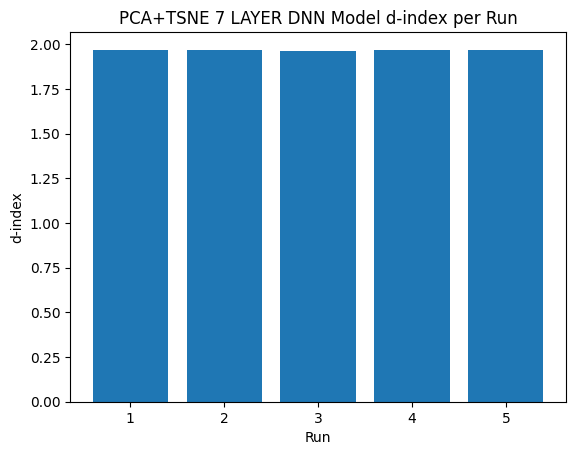

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER CNN

Epoch 1/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.4663 - accuracy: 0.8657 - val_loss: 0.2641 - val_accuracy: 0.9448
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2733 - accuracy: 0.9415 - val_loss: 0.2262 - val_accuracy: 0.9577
Epoch 3/100
1200/1200 [==============================] - 4s 4ms/step - loss: 0.2471 - accuracy: 0.9491 - val_loss: 0.2138 - val_accuracy: 0.9607
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2366 - accuracy: 0.9519 - val_loss: 0.2072 - val_accuracy: 0.9583
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2253 - accuracy: 0.9538 - val_loss: 0.2073 - val_accuracy: 0.9592
Epoch 6/100
1200/1200 [==============================] - 4s 4ms/step - loss: 0.2242 - accuracy: 0.9538 - val_loss: 0.2035 - val_accuracy: 0.9577
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2176 - accuracy: 0.9561 - val_loss: 0.1958 - val_ac

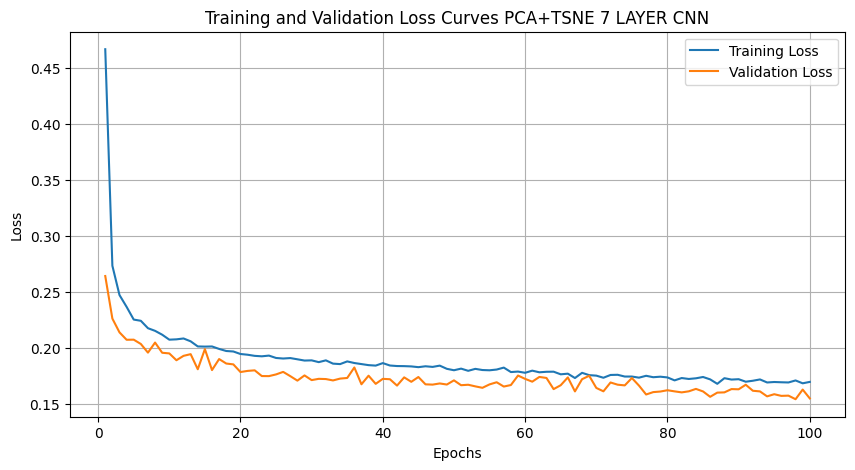

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.4811 - accuracy: 0.8592 - val_loss: 0.2683 - val_accuracy: 0.9421
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2770 - accuracy: 0.9421 - val_loss: 0.2281 - val_accuracy: 0.9560
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2477 - accuracy: 0.9493 - val_loss: 0.2192 - val_accuracy: 0.9597
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2383 - accuracy: 0.9522 - val_loss: 0.2098 - val_accuracy: 0.9593
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2314 - accuracy: 0.9542 - val_loss: 0.2108 - val_accuracy: 0.9602
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2290 - accuracy: 0.9549 - val_loss: 0.2013 - val_accuracy: 0.9593
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2228 - accuracy: 0.9562 - val_loss: 0.2015 - val_ac

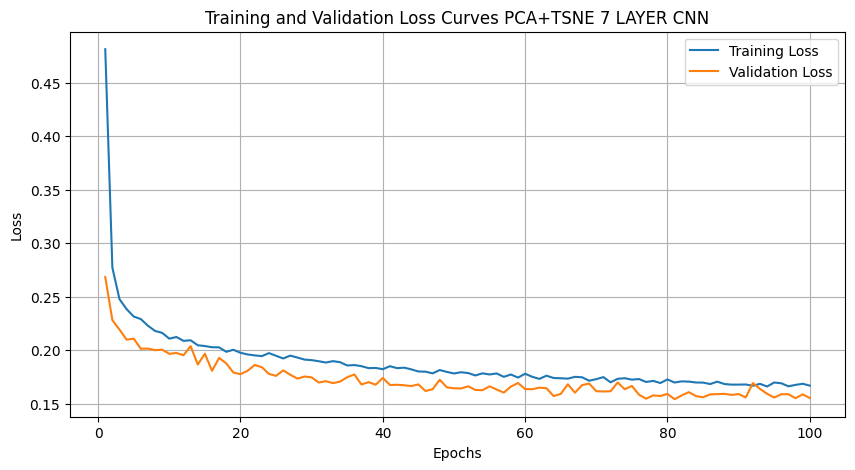

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.4851 - accuracy: 0.8579 - val_loss: 0.2662 - val_accuracy: 0.9465
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2805 - accuracy: 0.9399 - val_loss: 0.2286 - val_accuracy: 0.9574
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2515 - accuracy: 0.9480 - val_loss: 0.2265 - val_accuracy: 0.9560
Epoch 4/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.2434 - accuracy: 0.9510 - val_loss: 0.2155 - val_accuracy: 0.9579
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2321 - accuracy: 0.9535 - val_loss: 0.2130 - val_accuracy: 0.9603
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2276 - accuracy: 0.9543 - val_loss: 0.2050 - val_accuracy: 0.9577
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2256 - accuracy: 0.9551 - val_loss: 0.2047 - val_ac

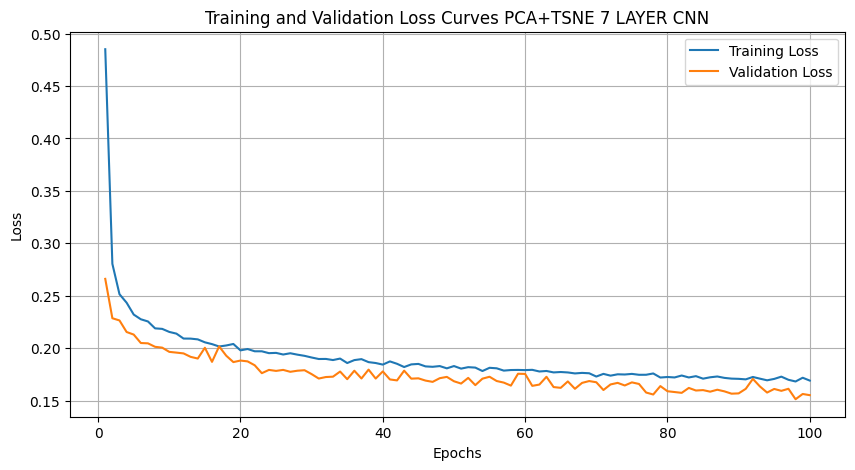

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.4458 - accuracy: 0.8751 - val_loss: 0.2599 - val_accuracy: 0.9460
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2698 - accuracy: 0.9428 - val_loss: 0.2260 - val_accuracy: 0.9579
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2458 - accuracy: 0.9500 - val_loss: 0.2189 - val_accuracy: 0.9580
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2379 - accuracy: 0.9524 - val_loss: 0.2120 - val_accuracy: 0.9584
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2284 - accuracy: 0.9532 - val_loss: 0.2089 - val_accuracy: 0.9597
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2280 - accuracy: 0.9548 - val_loss: 0.2026 - val_accuracy: 0.9608
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2194 - accuracy: 0.9560 - val_loss: 0.2035 - val_ac

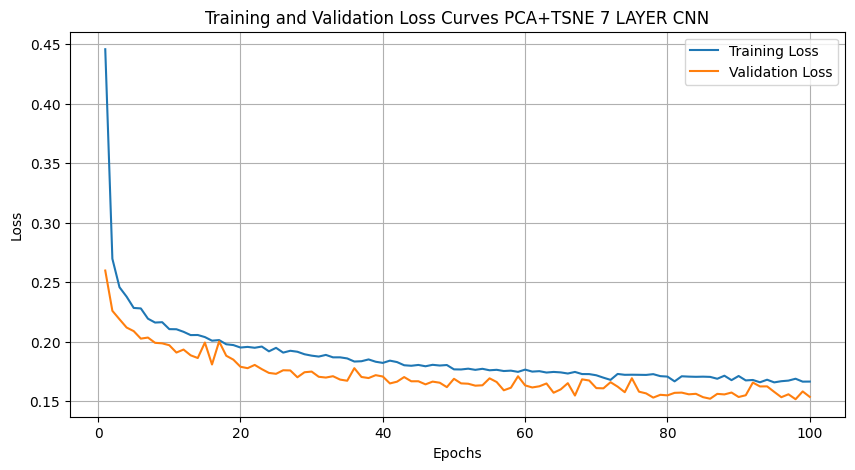

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.4858 - accuracy: 0.8607 - val_loss: 0.2694 - val_accuracy: 0.9443
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2816 - accuracy: 0.9405 - val_loss: 0.2309 - val_accuracy: 0.9565
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.2506 - accuracy: 0.9489 - val_loss: 0.2261 - val_accuracy: 0.9573
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2400 - accuracy: 0.9527 - val_loss: 0.2103 - val_accuracy: 0.9617
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2323 - accuracy: 0.9538 - val_loss: 0.2165 - val_accuracy: 0.9584
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.2291 - accuracy: 0.9543 - val_loss: 0.2013 - val_accuracy: 0.9628
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.2211 - accuracy: 0.9561 - val_loss: 0.2024 - val_ac

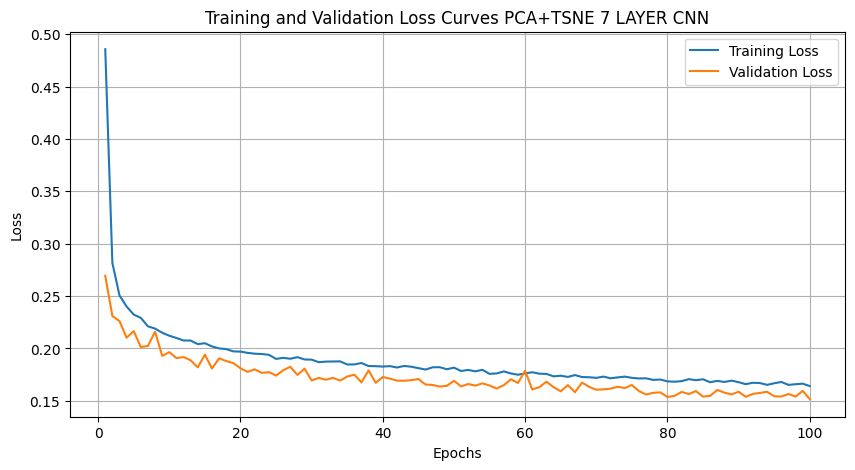

CLR for PCA+TSNE 7 LAYER CNN is: 0.9694499999999999


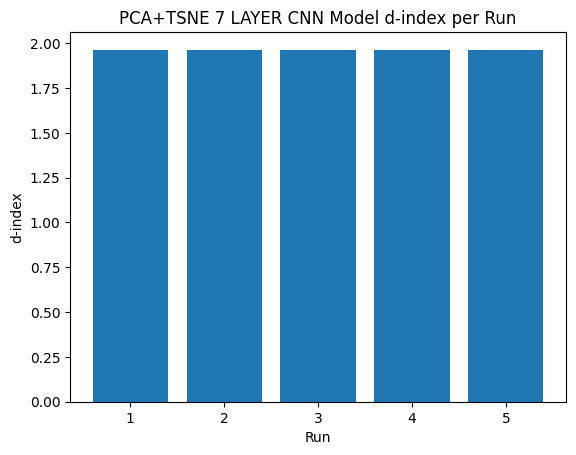

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER LSTM

Epoch 1/100
1200/1200 [==============================] - 18s 11ms/step - loss: 0.4628 - accuracy: 0.8793 - val_loss: 0.2038 - val_accuracy: 0.9601
Epoch 2/100
1200/1200 [==============================] - 19s 16ms/step - loss: 0.2360 - accuracy: 0.9586 - val_loss: 0.1600 - val_accuracy: 0.9711
Epoch 3/100
1200/1200 [==============================] - 18s 15ms/step - loss: 0.2209 - accuracy: 0.9616 - val_loss: 0.1581 - val_accuracy: 0.9704
Epoch 4/100
1200/1200 [==============================] - 11s 10ms/step - loss: 0.2110 - accuracy: 0.9628 - val_loss: 0.1542 - val_accuracy: 0.9720
Epoch 5/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2035 - accuracy: 0.9643 - val_loss: 0.1523 - val_accuracy: 0.9707
Epoch 6/100
1200/1200 [==============================] - 19s 16ms/step - loss: 0.1984 - accuracy: 0.9651 - val_loss: 0.1563 - val_accuracy: 0.9690
Epoch 7/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.1924 - accuracy: 0.9671 - val_loss: 0.

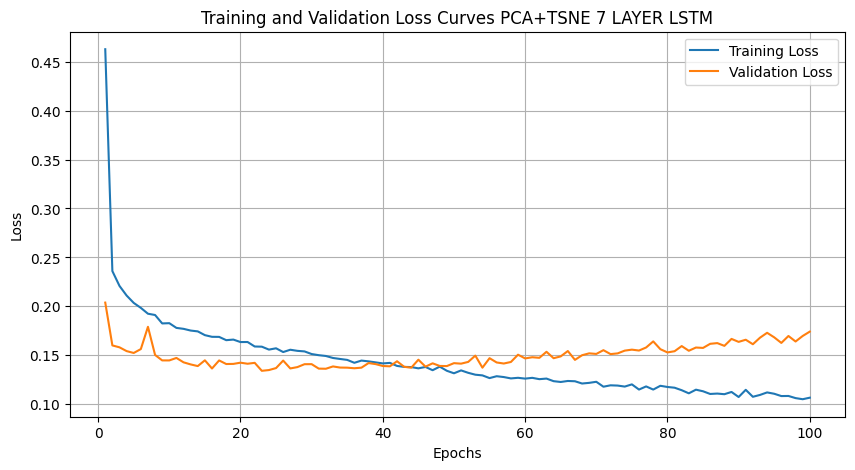

Epoch 1/100
1200/1200 [==============================] - 15s 9ms/step - loss: 0.5016 - accuracy: 0.8652 - val_loss: 0.1912 - val_accuracy: 0.9630
Epoch 2/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.2422 - accuracy: 0.9561 - val_loss: 0.1603 - val_accuracy: 0.9711
Epoch 3/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.2248 - accuracy: 0.9617 - val_loss: 0.1520 - val_accuracy: 0.9719
Epoch 4/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2121 - accuracy: 0.9617 - val_loss: 0.1525 - val_accuracy: 0.9723
Epoch 5/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2076 - accuracy: 0.9648 - val_loss: 0.1570 - val_accuracy: 0.9716
Epoch 6/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2014 - accuracy: 0.9643 - val_loss: 0.1471 - val_accuracy: 0.9708
Epoch 7/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.1973 - accuracy: 0.9651 - val_loss: 0.1521 -

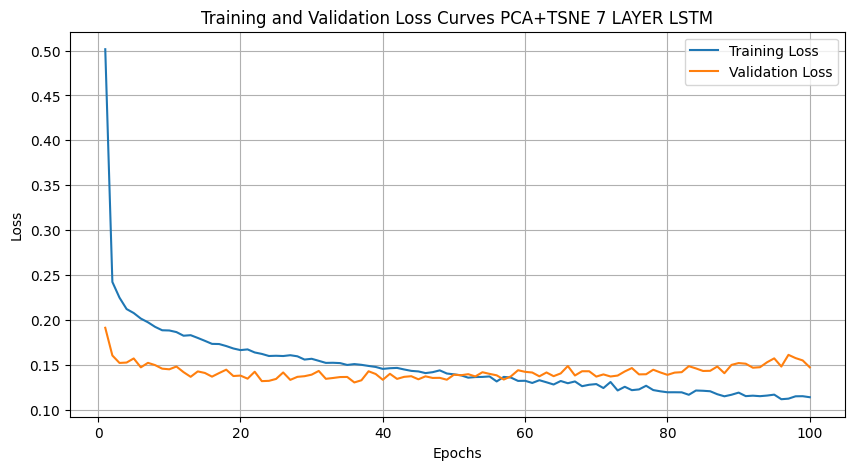

Epoch 1/100
1200/1200 [==============================] - 17s 10ms/step - loss: 0.4987 - accuracy: 0.8649 - val_loss: 0.1960 - val_accuracy: 0.9645
Epoch 2/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2604 - accuracy: 0.9502 - val_loss: 0.1718 - val_accuracy: 0.9695
Epoch 3/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.2375 - accuracy: 0.9586 - val_loss: 0.1632 - val_accuracy: 0.9716
Epoch 4/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2216 - accuracy: 0.9614 - val_loss: 0.1663 - val_accuracy: 0.9695
Epoch 5/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2173 - accuracy: 0.9630 - val_loss: 0.1574 - val_accuracy: 0.9707
Epoch 6/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2106 - accuracy: 0.9632 - val_loss: 0.1571 - val_accuracy: 0.9700
Epoch 7/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2047 - accuracy: 0.9646 - val_loss: 0.1783 

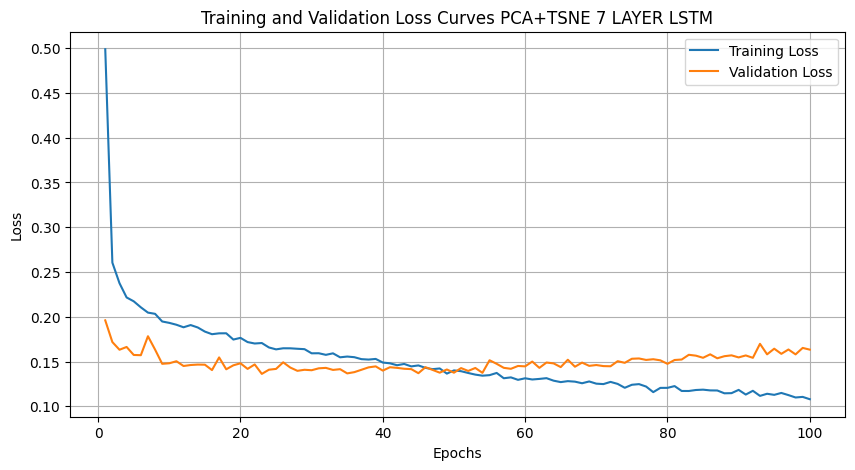

Epoch 1/100
1200/1200 [==============================] - 17s 11ms/step - loss: 0.4943 - accuracy: 0.8635 - val_loss: 0.1801 - val_accuracy: 0.9675
Epoch 2/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2449 - accuracy: 0.9552 - val_loss: 0.1595 - val_accuracy: 0.9708
Epoch 3/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2291 - accuracy: 0.9579 - val_loss: 0.1686 - val_accuracy: 0.9676
Epoch 4/100
1200/1200 [==============================] - 10s 9ms/step - loss: 0.2154 - accuracy: 0.9611 - val_loss: 0.1623 - val_accuracy: 0.9679
Epoch 5/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2132 - accuracy: 0.9624 - val_loss: 0.1548 - val_accuracy: 0.9702
Epoch 6/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2067 - accuracy: 0.9625 - val_loss: 0.1491 - val_accuracy: 0.9708
Epoch 7/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.1998 - accuracy: 0.9631 - val_loss: 0.1555 

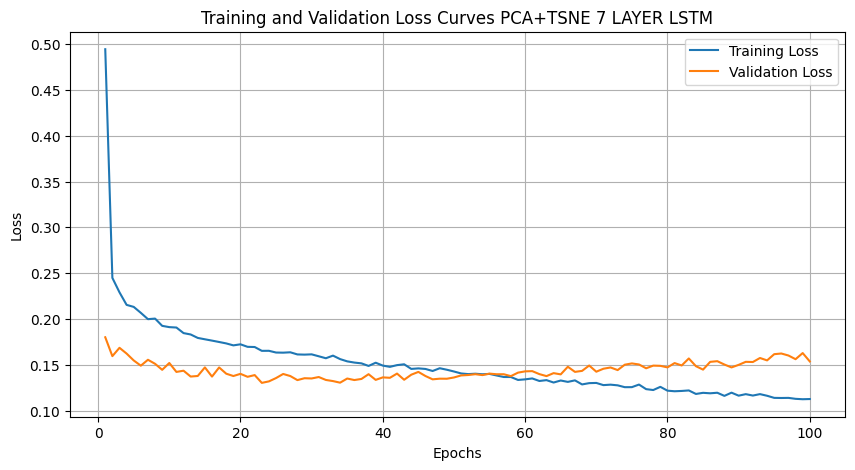

Epoch 1/100
1200/1200 [==============================] - 18s 11ms/step - loss: 0.5128 - accuracy: 0.8613 - val_loss: 0.1879 - val_accuracy: 0.9640
Epoch 2/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2422 - accuracy: 0.9552 - val_loss: 0.1641 - val_accuracy: 0.9709
Epoch 3/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2260 - accuracy: 0.9602 - val_loss: 0.1617 - val_accuracy: 0.9701
Epoch 4/100
1200/1200 [==============================] - 11s 10ms/step - loss: 0.2107 - accuracy: 0.9632 - val_loss: 0.1538 - val_accuracy: 0.9716
Epoch 5/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2032 - accuracy: 0.9656 - val_loss: 0.1740 - val_accuracy: 0.9636
Epoch 6/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2011 - accuracy: 0.9652 - val_loss: 0.1470 - val_accuracy: 0.9725
Epoch 7/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.1928 - accuracy: 0.9665 - val_loss: 0.1530

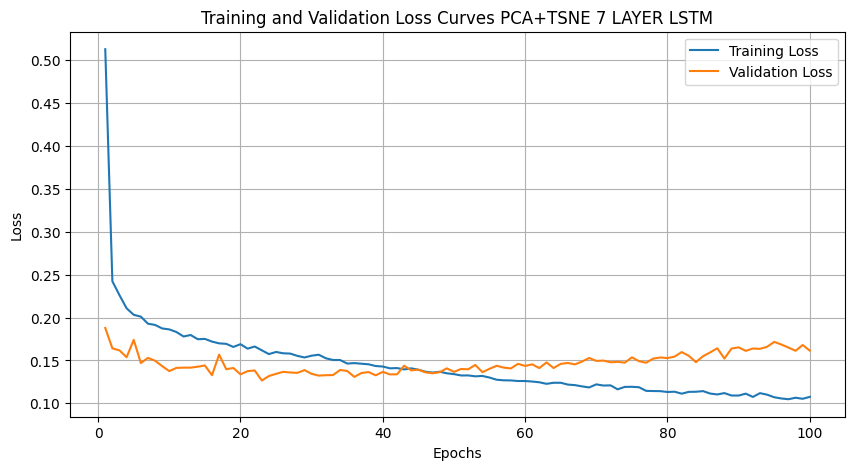

CLR for PCA+TSNE 7 LAYER LSTM is: 0.976


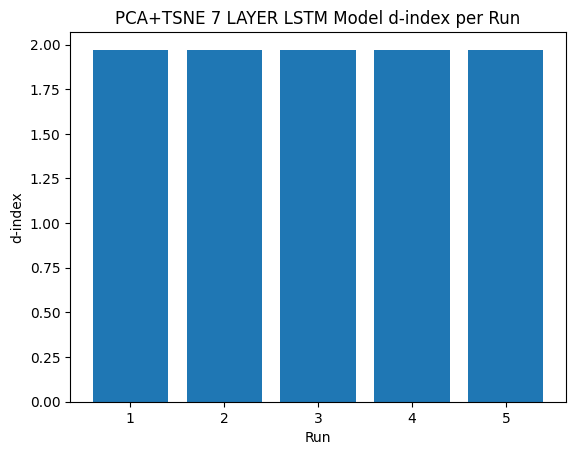

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER GRU

Epoch 1/100
1200/1200 [==============================] - 17s 8ms/step - loss: 0.2819 - accuracy: 0.9422 - val_loss: 0.1618 - val_accuracy: 0.9693
Epoch 2/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1691 - accuracy: 0.9690 - val_loss: 0.1548 - val_accuracy: 0.9706
Epoch 3/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1647 - accuracy: 0.9698 - val_loss: 0.1494 - val_accuracy: 0.9719
Epoch 4/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1586 - accuracy: 0.9713 - val_loss: 0.1419 - val_accuracy: 0.9721
Epoch 5/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.1535 - accuracy: 0.9716 - val_loss: 0.1514 - val_accuracy: 0.9693
Epoch 6/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1540 - accuracy: 0.9715 - val_loss: 0.1402 - val_accuracy: 0.9715
Epoch 7/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.1473 - accuracy: 0.9721 - val_loss: 0.1470 - val

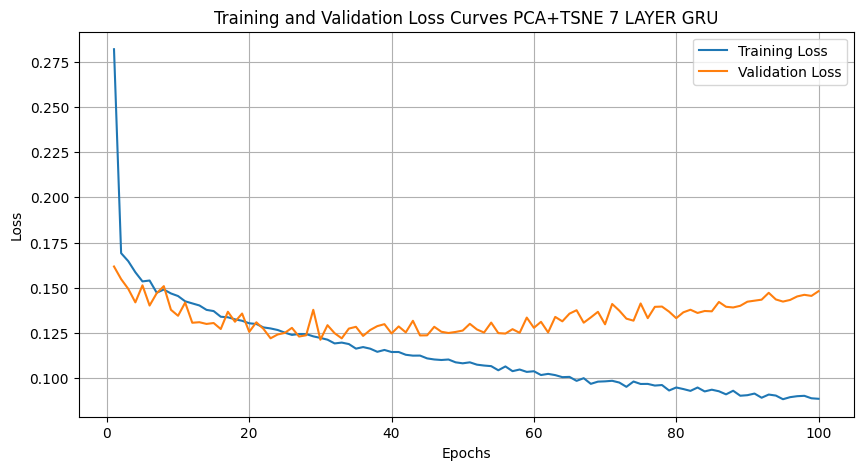

Epoch 1/100
1200/1200 [==============================] - 14s 8ms/step - loss: 0.2964 - accuracy: 0.9422 - val_loss: 0.1654 - val_accuracy: 0.9690
Epoch 2/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1734 - accuracy: 0.9688 - val_loss: 0.1522 - val_accuracy: 0.9718
Epoch 3/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1666 - accuracy: 0.9694 - val_loss: 0.1530 - val_accuracy: 0.9703
Epoch 4/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1612 - accuracy: 0.9709 - val_loss: 0.1404 - val_accuracy: 0.9737
Epoch 5/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1563 - accuracy: 0.9716 - val_loss: 0.1649 - val_accuracy: 0.9645
Epoch 6/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1553 - accuracy: 0.9718 - val_loss: 0.1426 - val_accuracy: 0.9718
Epoch 7/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1511 - accuracy: 0.9721 - val_loss: 0.1402 - val_a

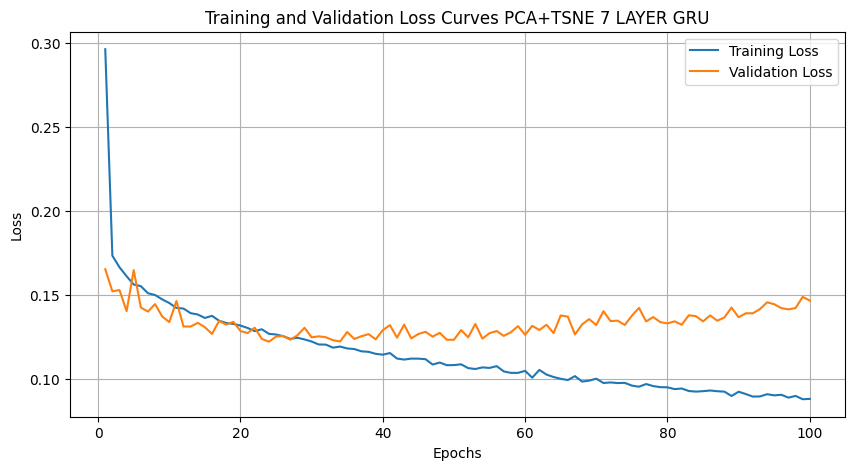

Epoch 1/100
1200/1200 [==============================] - 14s 8ms/step - loss: 0.2846 - accuracy: 0.9431 - val_loss: 0.1616 - val_accuracy: 0.9690
Epoch 2/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1729 - accuracy: 0.9686 - val_loss: 0.1616 - val_accuracy: 0.9679
Epoch 3/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1658 - accuracy: 0.9695 - val_loss: 0.1521 - val_accuracy: 0.9702
Epoch 4/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1597 - accuracy: 0.9709 - val_loss: 0.1403 - val_accuracy: 0.9733
Epoch 5/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1548 - accuracy: 0.9715 - val_loss: 0.1471 - val_accuracy: 0.9717
Epoch 6/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1533 - accuracy: 0.9718 - val_loss: 0.1414 - val_accuracy: 0.9715
Epoch 7/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1485 - accuracy: 0.9721 - val_loss: 0.1405 - val_a

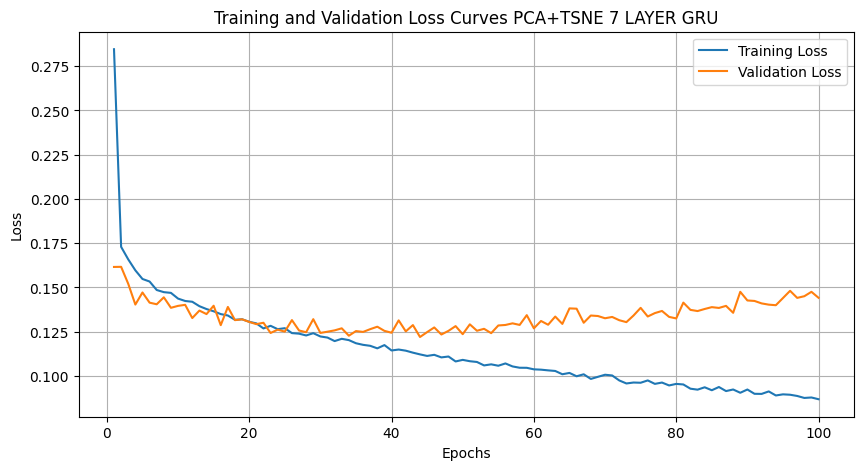

Epoch 1/100
1200/1200 [==============================] - 14s 8ms/step - loss: 0.2909 - accuracy: 0.9407 - val_loss: 0.1595 - val_accuracy: 0.9696
Epoch 2/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1721 - accuracy: 0.9692 - val_loss: 0.1583 - val_accuracy: 0.9695
Epoch 3/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.1631 - accuracy: 0.9700 - val_loss: 0.1501 - val_accuracy: 0.9714
Epoch 4/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1611 - accuracy: 0.9709 - val_loss: 0.1416 - val_accuracy: 0.9732
Epoch 5/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1562 - accuracy: 0.9715 - val_loss: 0.1446 - val_accuracy: 0.9721
Epoch 6/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1529 - accuracy: 0.9716 - val_loss: 0.1384 - val_accuracy: 0.9727
Epoch 7/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1499 - accuracy: 0.9722 - val_loss: 0.1404 - val_

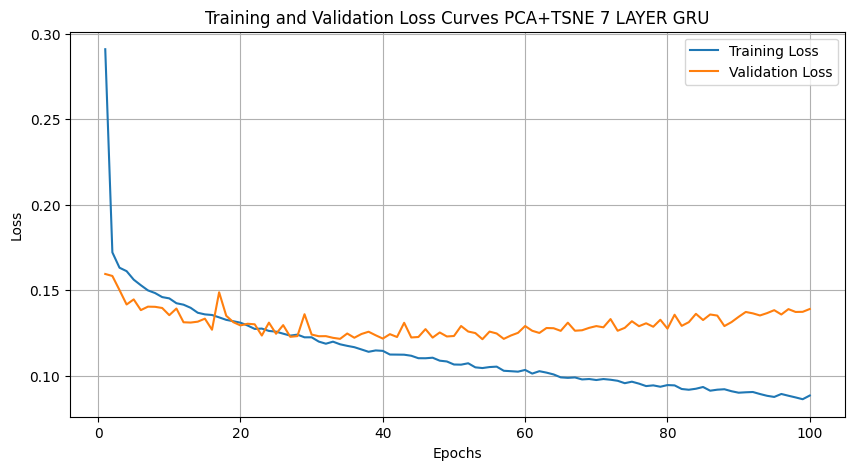

Epoch 1/100
1200/1200 [==============================] - 15s 8ms/step - loss: 0.2905 - accuracy: 0.9437 - val_loss: 0.1674 - val_accuracy: 0.9675
Epoch 2/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.1718 - accuracy: 0.9686 - val_loss: 0.1554 - val_accuracy: 0.9704
Epoch 3/100
1200/1200 [==============================] - 10s 8ms/step - loss: 0.1656 - accuracy: 0.9698 - val_loss: 0.1558 - val_accuracy: 0.9690
Epoch 4/100
1200/1200 [==============================] - 8s 7ms/step - loss: 0.1605 - accuracy: 0.9710 - val_loss: 0.1440 - val_accuracy: 0.9734
Epoch 5/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1573 - accuracy: 0.9714 - val_loss: 0.1568 - val_accuracy: 0.9675
Epoch 6/100
1200/1200 [==============================] - 9s 8ms/step - loss: 0.1543 - accuracy: 0.9713 - val_loss: 0.1427 - val_accuracy: 0.9711
Epoch 7/100
1200/1200 [==============================] - 9s 7ms/step - loss: 0.1499 - accuracy: 0.9724 - val_loss: 0.1429 - val

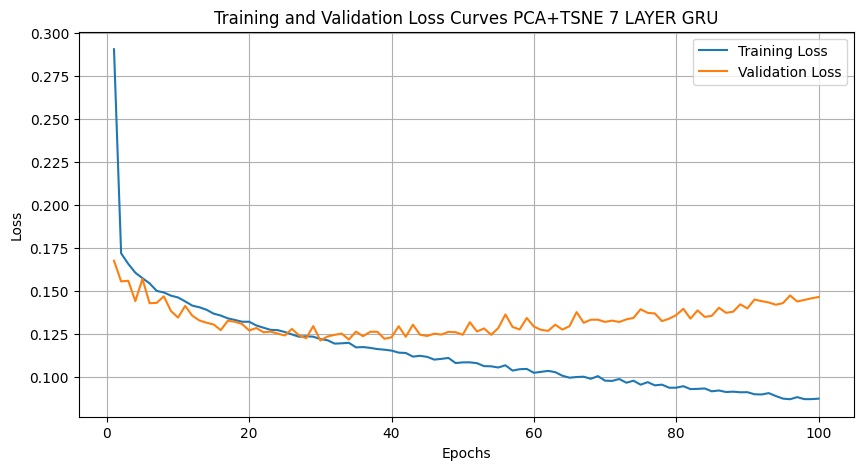

CLR for PCA+TSNE 7 LAYER GRU is: 0.9762000000000001


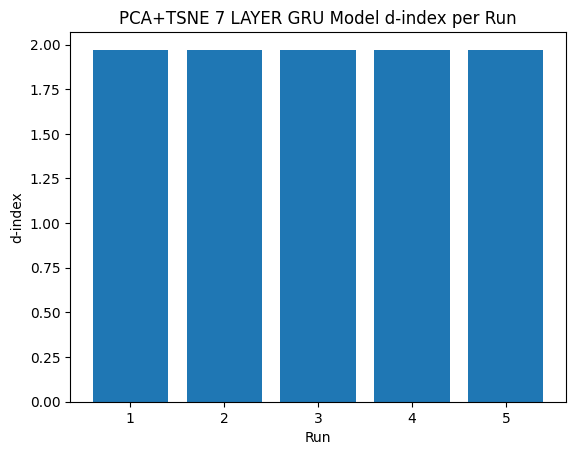

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA DNN

Epoch 1/100
1200/1200 [==============================] - 9s 6ms/step - loss: 0.3075 - accuracy: 0.9065 - val_loss: 0.1464 - val_accuracy: 0.9560
Epoch 2/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.1386 - accuracy: 0.9580 - val_loss: 0.0995 - val_accuracy: 0.9696
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1022 - accuracy: 0.9703 - val_loss: 0.0870 - val_accuracy: 0.9728
Epoch 4/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0881 - accuracy: 0.9739 - val_loss: 0.1101 - val_accuracy: 0.9688
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0750 - accuracy: 0.9777 - val_loss: 0.0812 - val_accuracy: 0.9774
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0640 - accuracy: 0.9809 - val_loss: 0.0859 - val_accuracy: 0.9749
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0553 - accuracy: 0.9836 - val_loss: 0.0791 - val_ac

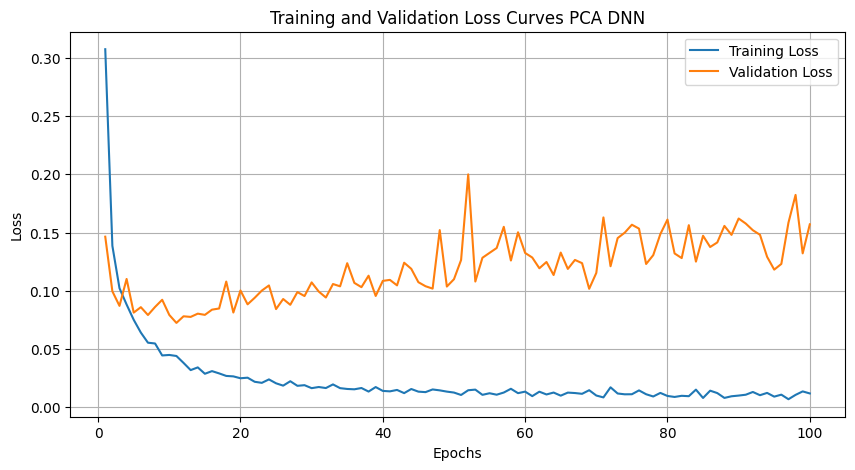

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.3031 - accuracy: 0.9078 - val_loss: 0.1292 - val_accuracy: 0.9614
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1347 - accuracy: 0.9593 - val_loss: 0.0957 - val_accuracy: 0.9718
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1054 - accuracy: 0.9673 - val_loss: 0.1124 - val_accuracy: 0.9677
Epoch 4/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.0877 - accuracy: 0.9738 - val_loss: 0.0897 - val_accuracy: 0.9748
Epoch 5/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.0717 - accuracy: 0.9789 - val_loss: 0.0917 - val_accuracy: 0.9725
Epoch 6/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.0660 - accuracy: 0.9808 - val_loss: 0.0921 - val_accuracy: 0.9741
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0570 - accuracy: 0.9830 - val_loss: 0.0736 - val_ac

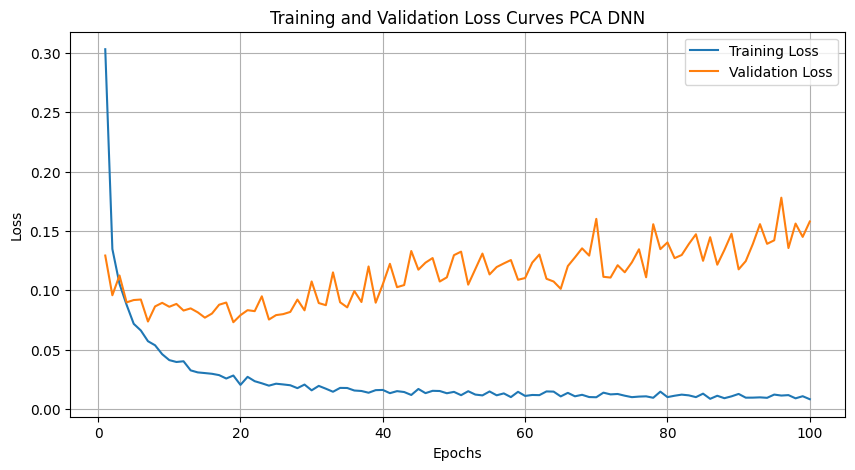

Epoch 1/100
1200/1200 [==============================] - 8s 6ms/step - loss: 0.3066 - accuracy: 0.9061 - val_loss: 0.1298 - val_accuracy: 0.9607
Epoch 2/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.1379 - accuracy: 0.9581 - val_loss: 0.1126 - val_accuracy: 0.9678
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1045 - accuracy: 0.9700 - val_loss: 0.0970 - val_accuracy: 0.9703
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0835 - accuracy: 0.9752 - val_loss: 0.0940 - val_accuracy: 0.9729
Epoch 5/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0719 - accuracy: 0.9789 - val_loss: 0.0861 - val_accuracy: 0.9765
Epoch 6/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.0635 - accuracy: 0.9811 - val_loss: 0.0791 - val_accuracy: 0.9773
Epoch 7/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.0579 - accuracy: 0.9823 - val_loss: 0.0830 - val_ac

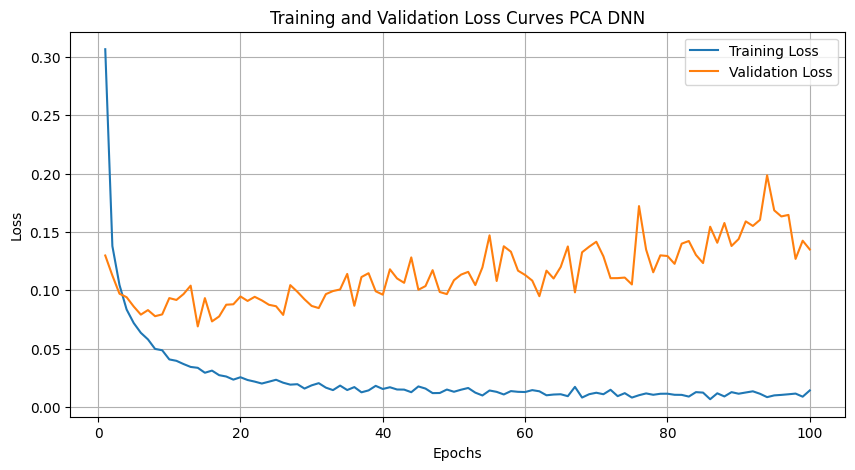

Epoch 1/100
1200/1200 [==============================] - 8s 5ms/step - loss: 0.3128 - accuracy: 0.9061 - val_loss: 0.1378 - val_accuracy: 0.9573
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1358 - accuracy: 0.9598 - val_loss: 0.1066 - val_accuracy: 0.9670
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1041 - accuracy: 0.9695 - val_loss: 0.1109 - val_accuracy: 0.9684
Epoch 4/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.0886 - accuracy: 0.9734 - val_loss: 0.0962 - val_accuracy: 0.9736
Epoch 5/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.0716 - accuracy: 0.9788 - val_loss: 0.0899 - val_accuracy: 0.9752
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0668 - accuracy: 0.9802 - val_loss: 0.0845 - val_accuracy: 0.9762
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0550 - accuracy: 0.9833 - val_loss: 0.0792 - val_ac

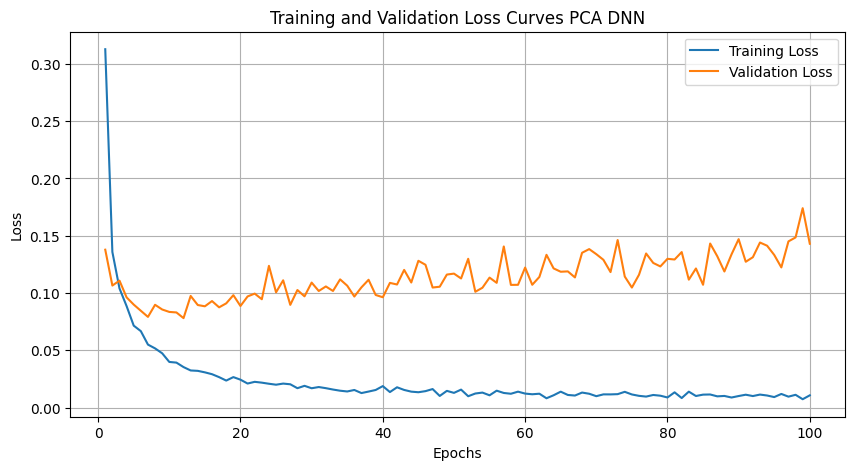

Epoch 1/100
1200/1200 [==============================] - 8s 5ms/step - loss: 0.3029 - accuracy: 0.9071 - val_loss: 0.1364 - val_accuracy: 0.9575
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1337 - accuracy: 0.9602 - val_loss: 0.1072 - val_accuracy: 0.9675
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1029 - accuracy: 0.9692 - val_loss: 0.1074 - val_accuracy: 0.9680
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0865 - accuracy: 0.9750 - val_loss: 0.1063 - val_accuracy: 0.9712
Epoch 5/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0743 - accuracy: 0.9776 - val_loss: 0.0817 - val_accuracy: 0.9776
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0647 - accuracy: 0.9808 - val_loss: 0.0787 - val_accuracy: 0.9779
Epoch 7/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.0530 - accuracy: 0.9843 - val_loss: 0.0842 - val_ac

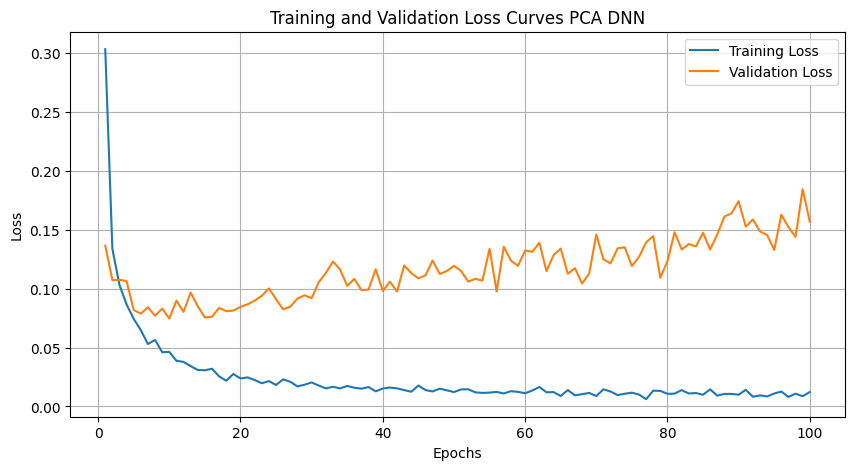

CLR for PCA DNN is: 0.9827166666666667


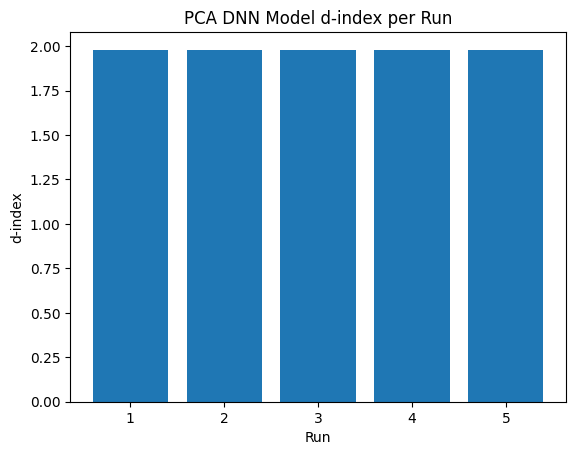

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA')

### PCA CNN

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.4502 - accuracy: 0.8771 - val_loss: 0.1855 - val_accuracy: 0.9477
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1444 - accuracy: 0.9574 - val_loss: 0.1285 - val_accuracy: 0.9615
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1089 - accuracy: 0.9672 - val_loss: 0.1112 - val_accuracy: 0.9663
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0873 - accuracy: 0.9734 - val_loss: 0.0983 - val_accuracy: 0.9705
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0745 - accuracy: 0.9769 - val_loss: 0.0949 - val_accuracy: 0.9719
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0657 - accuracy: 0.9805 - val_loss: 0.0858 - val_accuracy: 0.9736
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0570 - accuracy: 0.9821 - val_loss: 0.0850 - val_ac

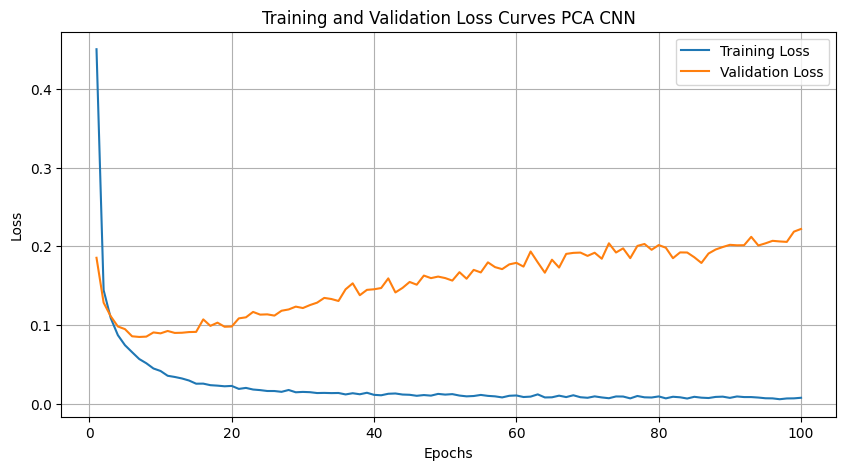

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.4290 - accuracy: 0.8830 - val_loss: 0.1822 - val_accuracy: 0.9490
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1456 - accuracy: 0.9573 - val_loss: 0.1224 - val_accuracy: 0.9636
Epoch 3/100
1200/1200 [==============================] - 7s 6ms/step - loss: 0.1101 - accuracy: 0.9668 - val_loss: 0.1098 - val_accuracy: 0.9669
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0885 - accuracy: 0.9727 - val_loss: 0.0941 - val_accuracy: 0.9717
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0724 - accuracy: 0.9782 - val_loss: 0.0859 - val_accuracy: 0.9729
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0642 - accuracy: 0.9797 - val_loss: 0.0807 - val_accuracy: 0.9762
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0590 - accuracy: 0.9813 - val_loss: 0.0799 - val_ac

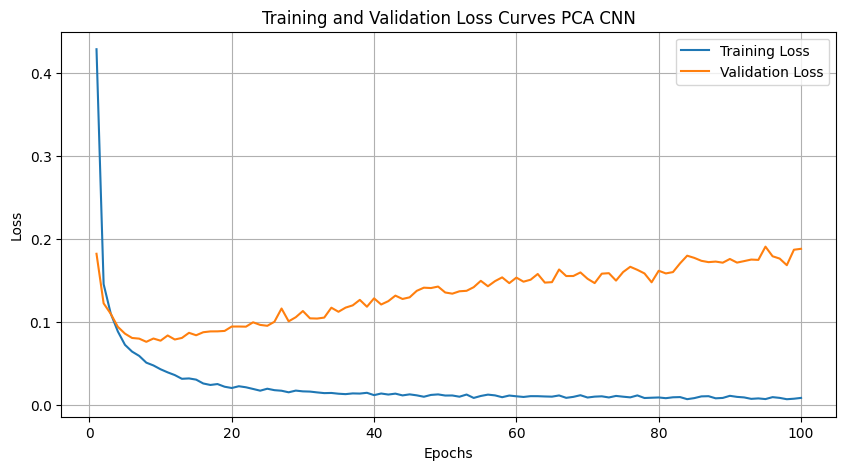

Epoch 1/100
1200/1200 [==============================] - 7s 5ms/step - loss: 0.4347 - accuracy: 0.8811 - val_loss: 0.1842 - val_accuracy: 0.9481
Epoch 2/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1481 - accuracy: 0.9562 - val_loss: 0.1276 - val_accuracy: 0.9613
Epoch 3/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1100 - accuracy: 0.9664 - val_loss: 0.1130 - val_accuracy: 0.9644
Epoch 4/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0882 - accuracy: 0.9727 - val_loss: 0.0953 - val_accuracy: 0.9725
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0750 - accuracy: 0.9774 - val_loss: 0.0931 - val_accuracy: 0.9727
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0637 - accuracy: 0.9803 - val_loss: 0.0888 - val_accuracy: 0.9718
Epoch 7/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0565 - accuracy: 0.9820 - val_loss: 0.0845 - val_ac

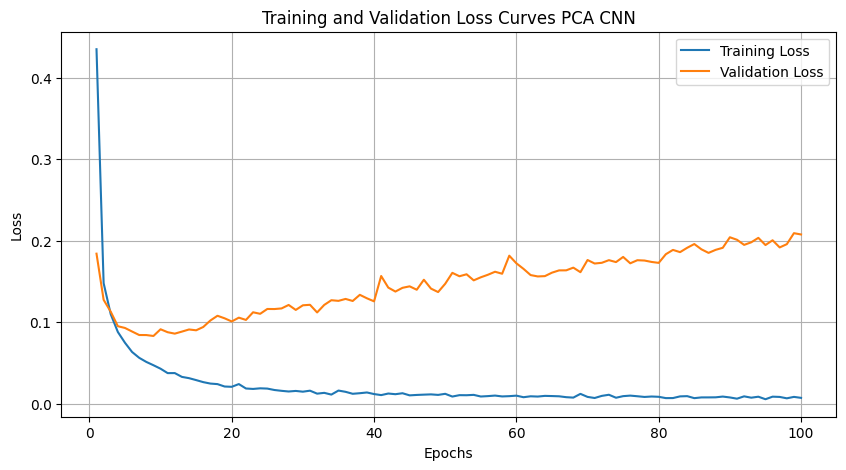

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.4322 - accuracy: 0.8819 - val_loss: 0.1843 - val_accuracy: 0.9492
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1511 - accuracy: 0.9552 - val_loss: 0.1304 - val_accuracy: 0.9632
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1135 - accuracy: 0.9661 - val_loss: 0.1153 - val_accuracy: 0.9658
Epoch 4/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.0923 - accuracy: 0.9708 - val_loss: 0.1007 - val_accuracy: 0.9698
Epoch 5/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0765 - accuracy: 0.9762 - val_loss: 0.0949 - val_accuracy: 0.9718
Epoch 6/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.0678 - accuracy: 0.9788 - val_loss: 0.0930 - val_accuracy: 0.9717
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0606 - accuracy: 0.9807 - val_loss: 0.0861 - val_ac

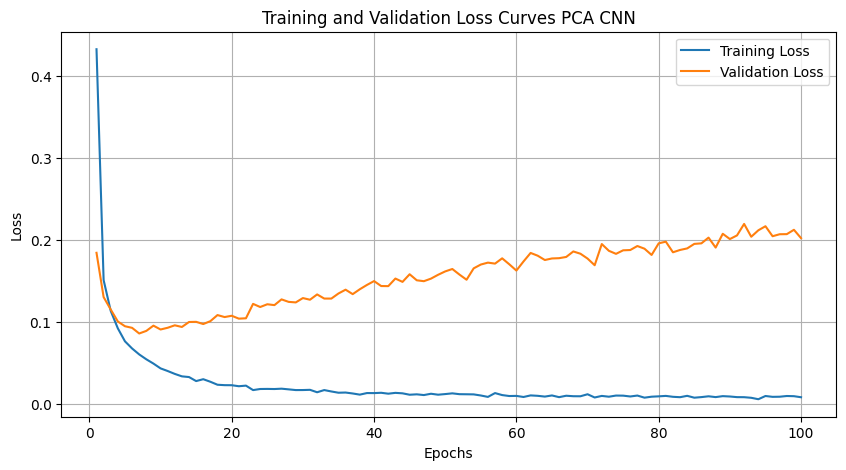

Epoch 1/100
1200/1200 [==============================] - 6s 4ms/step - loss: 0.4343 - accuracy: 0.8791 - val_loss: 0.1852 - val_accuracy: 0.9476
Epoch 2/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.1501 - accuracy: 0.9542 - val_loss: 0.1301 - val_accuracy: 0.9615
Epoch 3/100
1200/1200 [==============================] - 5s 4ms/step - loss: 0.1110 - accuracy: 0.9665 - val_loss: 0.1110 - val_accuracy: 0.9667
Epoch 4/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0898 - accuracy: 0.9728 - val_loss: 0.0964 - val_accuracy: 0.9712
Epoch 5/100
1200/1200 [==============================] - 5s 5ms/step - loss: 0.0768 - accuracy: 0.9760 - val_loss: 0.0897 - val_accuracy: 0.9737
Epoch 6/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0675 - accuracy: 0.9795 - val_loss: 0.0889 - val_accuracy: 0.9727
Epoch 7/100
1200/1200 [==============================] - 6s 5ms/step - loss: 0.0597 - accuracy: 0.9811 - val_loss: 0.0864 - val_ac

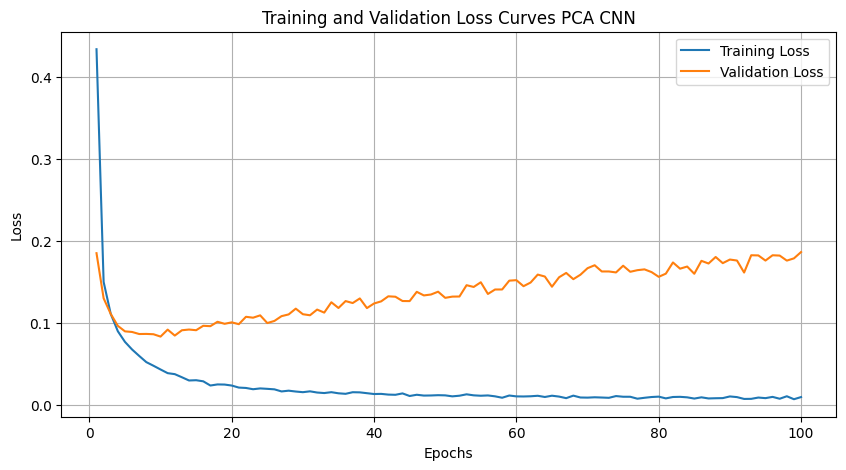

CLR for PCA CNN is: 0.97245


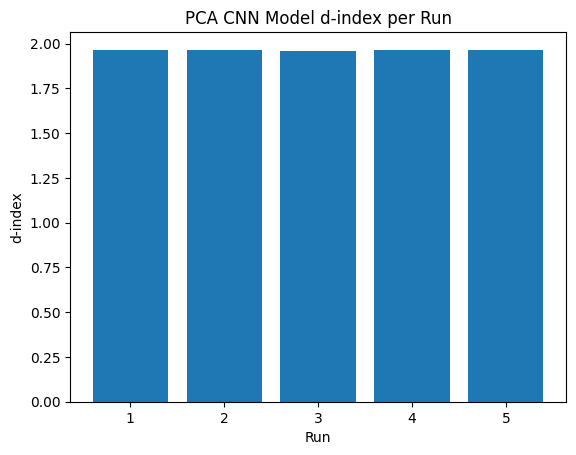

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA')

### PCA LSTM

Epoch 1/100
1200/1200 [==============================] - 16s 10ms/step - loss: 0.5997 - accuracy: 0.8037 - val_loss: 0.2183 - val_accuracy: 0.9335
Epoch 2/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.2261 - accuracy: 0.9332 - val_loss: 0.1601 - val_accuracy: 0.9511
Epoch 3/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1671 - accuracy: 0.9488 - val_loss: 0.1300 - val_accuracy: 0.9608
Epoch 4/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1378 - accuracy: 0.9577 - val_loss: 0.1112 - val_accuracy: 0.9678
Epoch 5/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1155 - accuracy: 0.9627 - val_loss: 0.1069 - val_accuracy: 0.9683
Epoch 6/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.0984 - accuracy: 0.9690 - val_loss: 0.1038 - val_accuracy: 0.9685
Epoch 7/100
1200/1200 [==============================] - 11s 10ms/step - loss: 0.0848 - accuracy: 0.9726 - val_loss: 0.

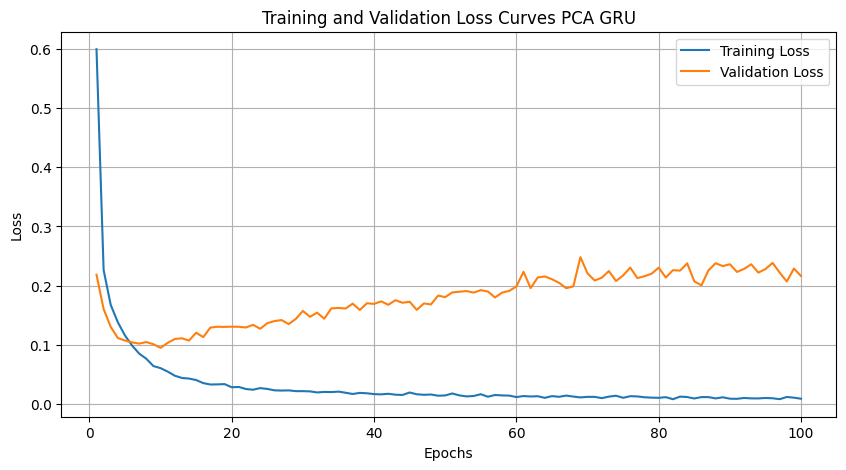

Epoch 1/100
1200/1200 [==============================] - 17s 11ms/step - loss: 0.6417 - accuracy: 0.7906 - val_loss: 0.2329 - val_accuracy: 0.9310
Epoch 2/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.2335 - accuracy: 0.9306 - val_loss: 0.1562 - val_accuracy: 0.9504
Epoch 3/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.1724 - accuracy: 0.9480 - val_loss: 0.1278 - val_accuracy: 0.9603
Epoch 4/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1404 - accuracy: 0.9561 - val_loss: 0.1169 - val_accuracy: 0.9639
Epoch 5/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.1143 - accuracy: 0.9648 - val_loss: 0.1020 - val_accuracy: 0.9686
Epoch 6/100
1200/1200 [==============================] - 11s 10ms/step - loss: 0.1017 - accuracy: 0.9666 - val_loss: 0.0957 - val_accuracy: 0.9720
Epoch 7/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.0861 - accuracy: 0.9724 - val_loss: 0.10

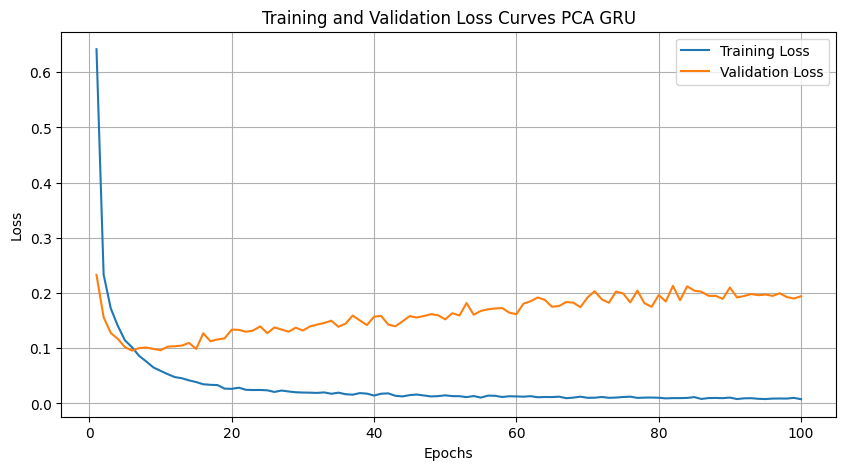

Epoch 1/100
1200/1200 [==============================] - 17s 11ms/step - loss: 0.5981 - accuracy: 0.8042 - val_loss: 0.2172 - val_accuracy: 0.9353
Epoch 2/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.2233 - accuracy: 0.9328 - val_loss: 0.1424 - val_accuracy: 0.9560
Epoch 3/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1675 - accuracy: 0.9491 - val_loss: 0.1259 - val_accuracy: 0.9609
Epoch 4/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.1372 - accuracy: 0.9580 - val_loss: 0.1225 - val_accuracy: 0.9632
Epoch 5/100
1200/1200 [==============================] - 11s 10ms/step - loss: 0.1170 - accuracy: 0.9626 - val_loss: 0.1012 - val_accuracy: 0.9693
Epoch 6/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.1001 - accuracy: 0.9681 - val_loss: 0.0962 - val_accuracy: 0.9701
Epoch 7/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.0842 - accuracy: 0.9732 - val_loss: 0.10

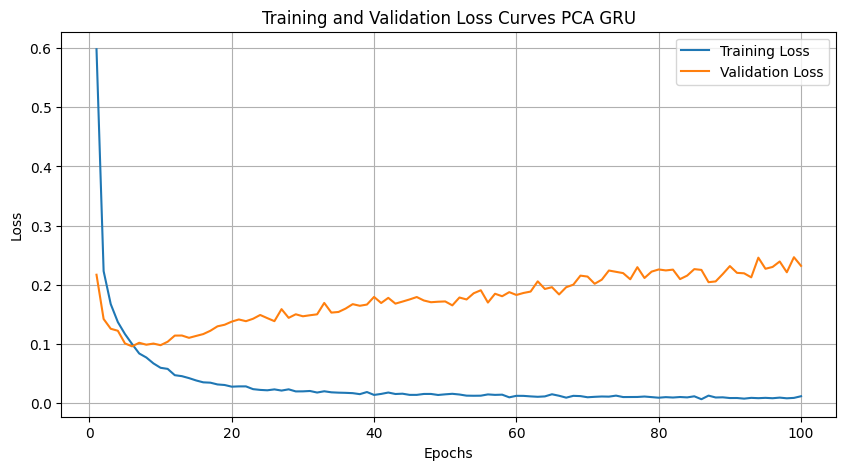

Epoch 1/100
1200/1200 [==============================] - 15s 10ms/step - loss: 0.6155 - accuracy: 0.7992 - val_loss: 0.2302 - val_accuracy: 0.9296
Epoch 2/100
1200/1200 [==============================] - 11s 10ms/step - loss: 0.2299 - accuracy: 0.9317 - val_loss: 0.1636 - val_accuracy: 0.9508
Epoch 3/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1693 - accuracy: 0.9482 - val_loss: 0.1281 - val_accuracy: 0.9617
Epoch 4/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1366 - accuracy: 0.9585 - val_loss: 0.1146 - val_accuracy: 0.9664
Epoch 5/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.1143 - accuracy: 0.9645 - val_loss: 0.1046 - val_accuracy: 0.9690
Epoch 6/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.0987 - accuracy: 0.9688 - val_loss: 0.1027 - val_accuracy: 0.9675
Epoch 7/100
1200/1200 [==============================] - 11s 10ms/step - loss: 0.0853 - accuracy: 0.9717 - val_loss: 0.1

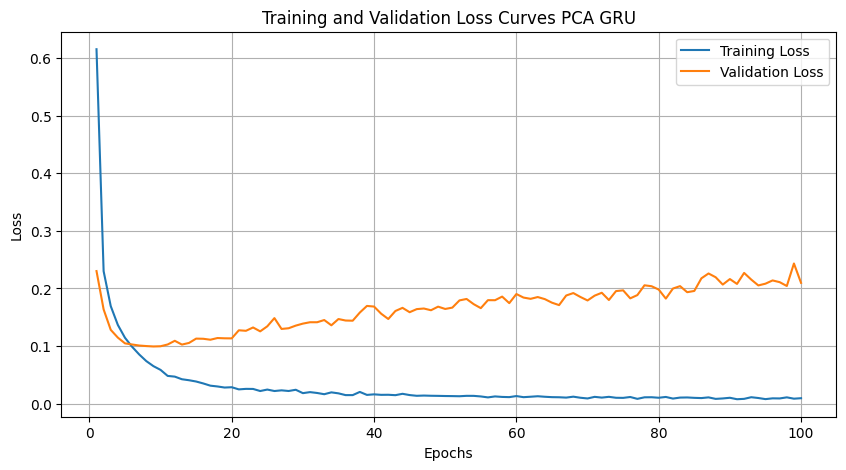

Epoch 1/100
1200/1200 [==============================] - 18s 12ms/step - loss: 0.5871 - accuracy: 0.8110 - val_loss: 0.2116 - val_accuracy: 0.9366
Epoch 2/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.2224 - accuracy: 0.9325 - val_loss: 0.1575 - val_accuracy: 0.9514
Epoch 3/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1657 - accuracy: 0.9494 - val_loss: 0.1270 - val_accuracy: 0.9607
Epoch 4/100
1200/1200 [==============================] - 11s 9ms/step - loss: 0.1380 - accuracy: 0.9571 - val_loss: 0.1150 - val_accuracy: 0.9646
Epoch 5/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.1129 - accuracy: 0.9651 - val_loss: 0.1046 - val_accuracy: 0.9686
Epoch 6/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.0999 - accuracy: 0.9694 - val_loss: 0.1052 - val_accuracy: 0.9668
Epoch 7/100
1200/1200 [==============================] - 12s 10ms/step - loss: 0.0868 - accuracy: 0.9719 - val_loss: 0.

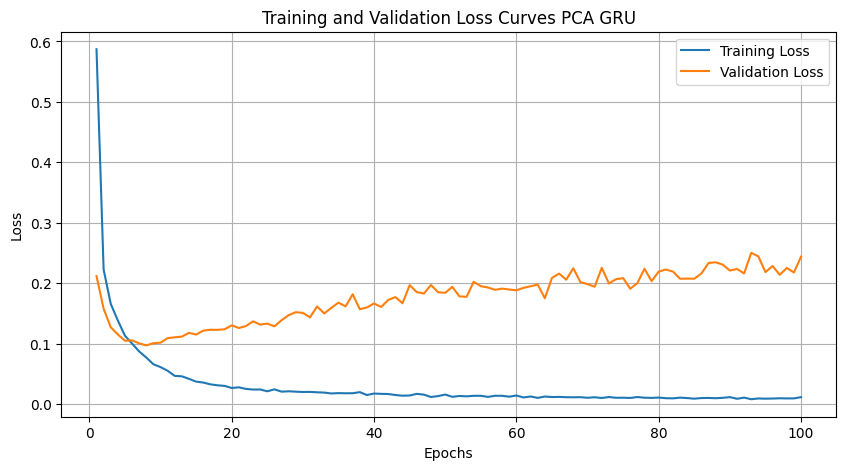

CLR for PCA LSTM is: 0.9719333333333333


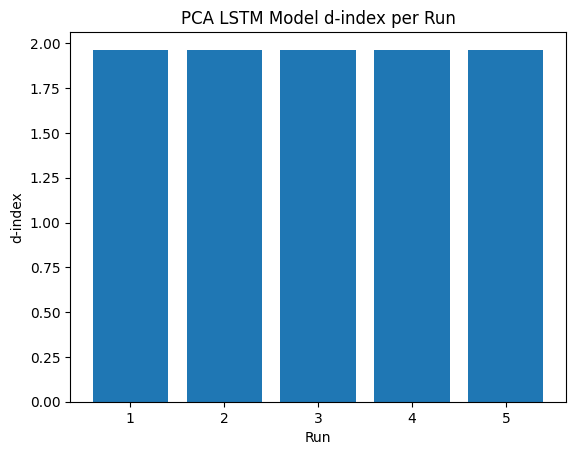

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA')

### PCA GRU

Epoch 1/100
1200/1200 [==============================] - 18s 12ms/step - loss: 0.4256 - accuracy: 0.8675 - val_loss: 0.1735 - val_accuracy: 0.9488
Epoch 2/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.1865 - accuracy: 0.9448 - val_loss: 0.1301 - val_accuracy: 0.9608
Epoch 3/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.1425 - accuracy: 0.9572 - val_loss: 0.1147 - val_accuracy: 0.9640
Epoch 4/100
1200/1200 [==============================] - 14s 11ms/step - loss: 0.1214 - accuracy: 0.9623 - val_loss: 0.1095 - val_accuracy: 0.9657
Epoch 5/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.0981 - accuracy: 0.9691 - val_loss: 0.1044 - val_accuracy: 0.9693
Epoch 6/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.0879 - accuracy: 0.9719 - val_loss: 0.0982 - val_accuracy: 0.9709
Epoch 7/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.0739 - accuracy: 0.9759 - val_loss: 0

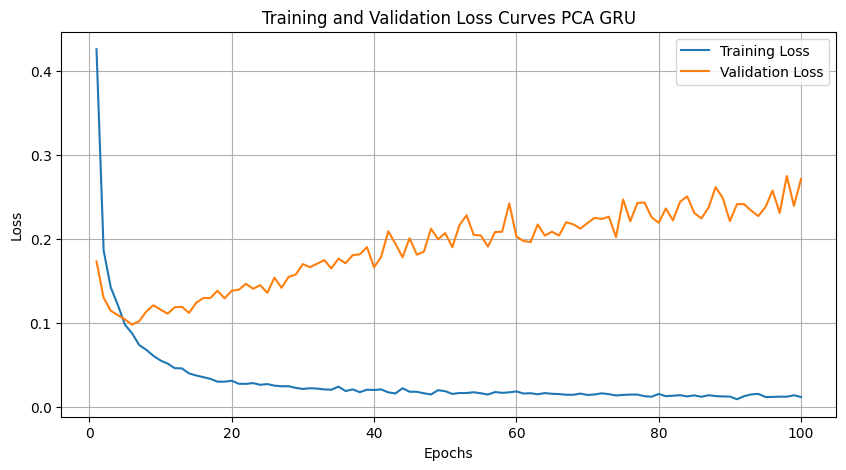

Epoch 1/100
1200/1200 [==============================] - 20s 12ms/step - loss: 0.4357 - accuracy: 0.8631 - val_loss: 0.1741 - val_accuracy: 0.9464
Epoch 2/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.1867 - accuracy: 0.9440 - val_loss: 0.1272 - val_accuracy: 0.9600
Epoch 3/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1459 - accuracy: 0.9543 - val_loss: 0.1207 - val_accuracy: 0.9611
Epoch 4/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.1185 - accuracy: 0.9621 - val_loss: 0.1161 - val_accuracy: 0.9641
Epoch 5/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.1009 - accuracy: 0.9681 - val_loss: 0.1031 - val_accuracy: 0.9697
Epoch 6/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.0874 - accuracy: 0.9726 - val_loss: 0.1082 - val_accuracy: 0.9685
Epoch 7/100
1200/1200 [==============================] - 13s 11ms/step - loss: 0.0765 - accuracy: 0.9747 - val_loss: 0

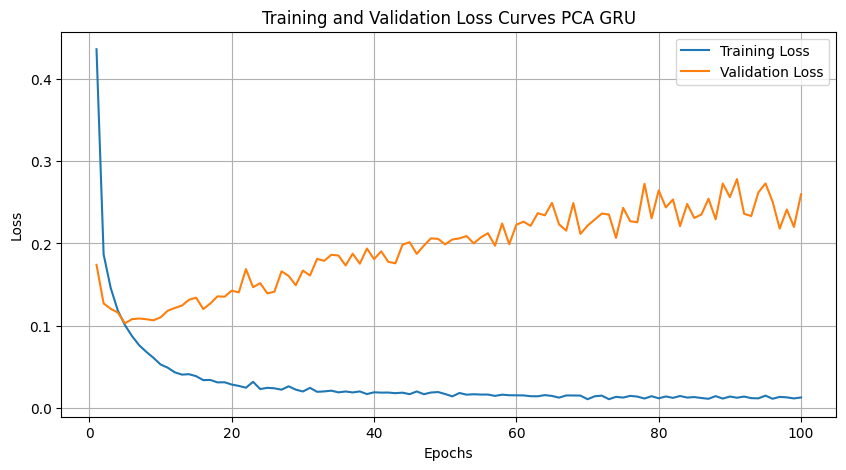

Epoch 1/100
1200/1200 [==============================] - 20s 13ms/step - loss: 0.4385 - accuracy: 0.8625 - val_loss: 0.1692 - val_accuracy: 0.9491
Epoch 2/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1889 - accuracy: 0.9429 - val_loss: 0.1232 - val_accuracy: 0.9607
Epoch 3/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1429 - accuracy: 0.9555 - val_loss: 0.1170 - val_accuracy: 0.9638
Epoch 4/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1210 - accuracy: 0.9624 - val_loss: 0.1105 - val_accuracy: 0.9670
Epoch 5/100
1200/1200 [==============================] - 14s 11ms/step - loss: 0.1016 - accuracy: 0.9671 - val_loss: 0.1007 - val_accuracy: 0.9693
Epoch 6/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.0876 - accuracy: 0.9718 - val_loss: 0.0980 - val_accuracy: 0.9694
Epoch 7/100
1200/1200 [==============================] - 14s 11ms/step - loss: 0.0754 - accuracy: 0.9745 - val_loss: 0

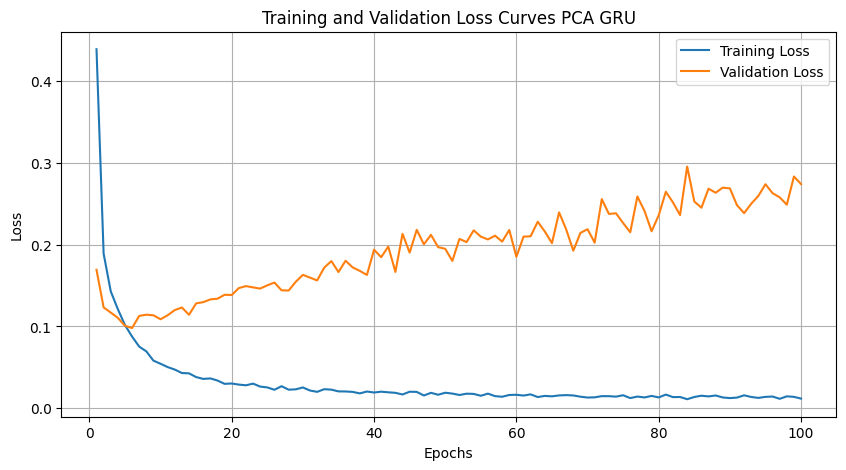

Epoch 1/100
1200/1200 [==============================] - 21s 13ms/step - loss: 0.4259 - accuracy: 0.8658 - val_loss: 0.1814 - val_accuracy: 0.9448
Epoch 2/100
1200/1200 [==============================] - 15s 12ms/step - loss: 0.1874 - accuracy: 0.9427 - val_loss: 0.1297 - val_accuracy: 0.9607
Epoch 3/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1470 - accuracy: 0.9552 - val_loss: 0.1158 - val_accuracy: 0.9659
Epoch 4/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1235 - accuracy: 0.9613 - val_loss: 0.1117 - val_accuracy: 0.9641
Epoch 5/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1009 - accuracy: 0.9681 - val_loss: 0.1104 - val_accuracy: 0.9685
Epoch 6/100
1200/1200 [==============================] - 15s 12ms/step - loss: 0.0889 - accuracy: 0.9718 - val_loss: 0.1049 - val_accuracy: 0.9680
Epoch 7/100
1200/1200 [==============================] - 15s 12ms/step - loss: 0.0748 - accuracy: 0.9742 - val_loss: 0

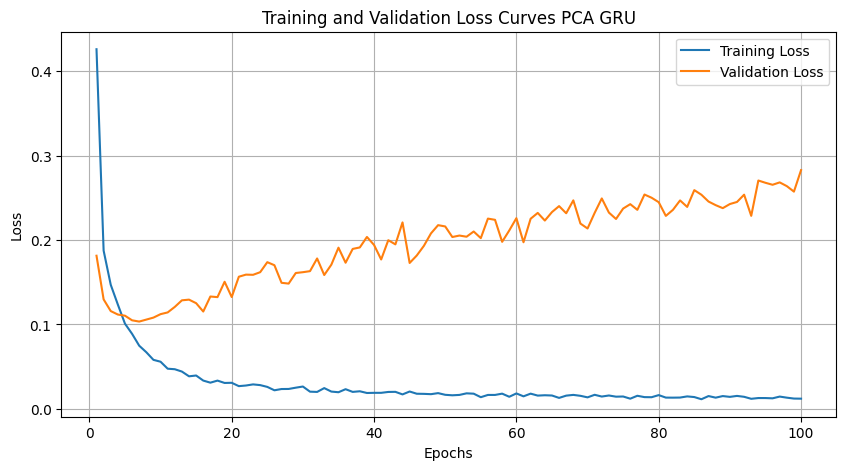

Epoch 1/100
1200/1200 [==============================] - 19s 12ms/step - loss: 0.4273 - accuracy: 0.8666 - val_loss: 0.1721 - val_accuracy: 0.9463
Epoch 2/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1896 - accuracy: 0.9433 - val_loss: 0.1408 - val_accuracy: 0.9566
Epoch 3/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1473 - accuracy: 0.9554 - val_loss: 0.1214 - val_accuracy: 0.9644
Epoch 4/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1225 - accuracy: 0.9608 - val_loss: 0.1150 - val_accuracy: 0.9659
Epoch 5/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.1034 - accuracy: 0.9660 - val_loss: 0.1103 - val_accuracy: 0.9684
Epoch 6/100
1200/1200 [==============================] - 14s 11ms/step - loss: 0.0885 - accuracy: 0.9712 - val_loss: 0.1044 - val_accuracy: 0.9674
Epoch 7/100
1200/1200 [==============================] - 14s 12ms/step - loss: 0.0768 - accuracy: 0.9744 - val_loss: 0

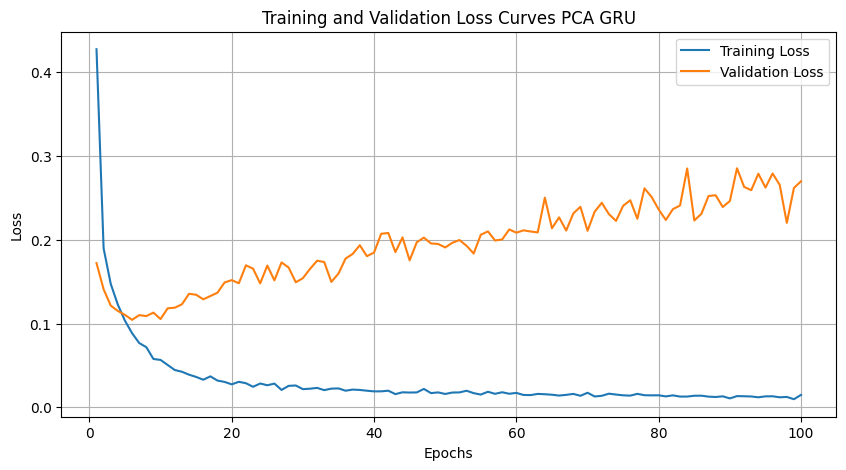

CLR for PCA GRU is: 0.9704166666666666


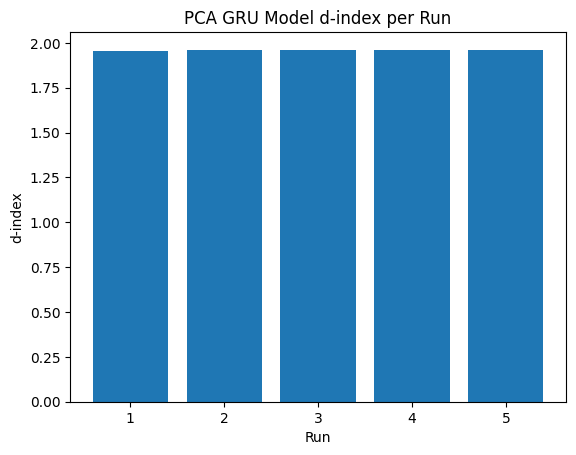

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA')

# Kolod Dataset

In [ ]:
df = pd.read_csv("/content/drive/My Drive/data/Kolod.csv")
df['label'] -= 1
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,ENSMUSG00000000001,ENSMUSG00000000028,ENSMUSG00000000031,ENSMUSG00000000056,ENSMUSG00000000078,ENSMUSG00000000085,ENSMUSG00000000120,ENSMUSG00000000127,ENSMUSG00000000131,ENSMUSG00000000134,...,ENSMUSG00000098098,ENSMUSG00000098112,ENSMUSG00000098148,ENSMUSG00000098161,ENSMUSG00000098166,ENSMUSG00000098183,ENSMUSG00000098202,ENSMUSG00000098234,ENSMUSG00000098238,label
0,2.4362,2.4346,0.0,1.2304,2.7143,0.00000,1.77820,2.61490,2.1732,2.7443,...,0.0000,0.0000,0.95424,0.00000,1.82610,2.1139,2.2742,2.4200,1.0000,0
1,2.5670,2.9930,0.0,0.0000,3.2011,0.30103,1.14610,2.62320,3.2052,2.0682,...,2.2253,0.0000,1.61280,0.00000,0.60206,2.3838,0.0000,2.7101,1.2041,0
2,3.1559,3.0966,0.0,0.0000,2.9335,2.80480,1.20410,2.61070,2.4594,2.6149,...,1.5798,2.6998,0.30103,0.30103,0.00000,1.3222,0.0000,2.6345,0.8451,0
3,3.3522,2.9877,0.0,0.0000,1.8692,0.00000,0.30103,0.30103,2.9330,2.9315,...,1.8261,0.0000,1.93450,0.00000,0.00000,0.0000,2.9542,2.8603,1.3222,0
4,2.5866,3.0607,0.0,0.0000,2.6893,0.90309,1.67210,2.58320,2.5302,2.1703,...,1.6232,0.0000,0.47712,0.60206,1.80620,0.0000,0.0000,2.2648,1.0000,0


In [ ]:
X = df.drop('label', axis=1)
y = df['label']


scaler = StandardScaler()
X_normalizated = scaler.fit_transform(X)


encoder = OneHotEncoder(sparse=False)
y_encoded = encoder.fit_transform(y.values.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_normalizated, y_encoded, test_size=0.2, random_state=42)

### DNN

Epoch 1/100
18/18 [==============================] - 3s 18ms/step - loss: 0.1711 - accuracy: 0.9272 - val_loss: 0.0986 - val_accuracy: 0.9787
Epoch 2/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 0.9947 - val_loss: 0.0671 - val_accuracy: 0.9929
Epoch 3/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.0349 - val_accuracy: 0.9929
Epoch 4/100
18/18 [==============================] - 0s 6ms/step - loss: 9.3114e-05 - accuracy: 1.0000 - val_loss: 0.0302 - val_accuracy: 0.9929
Epoch 5/100
18/18 [==============================] - 0s 6ms/step - loss: 2.0367e-04 - accuracy: 1.0000 - val_loss: 0.0273 - val_accuracy: 0.9929
Epoch 6/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0021 - accuracy: 0.9982 - val_loss: 0.0138 - val_accuracy: 0.9929
Epoch 7/100
18/18 [==============================] - 0s 7ms/step - loss: 0.0075 - accuracy: 0.9982 - val_loss: 0.0247 - val_accuracy: 0.9929
Epoc

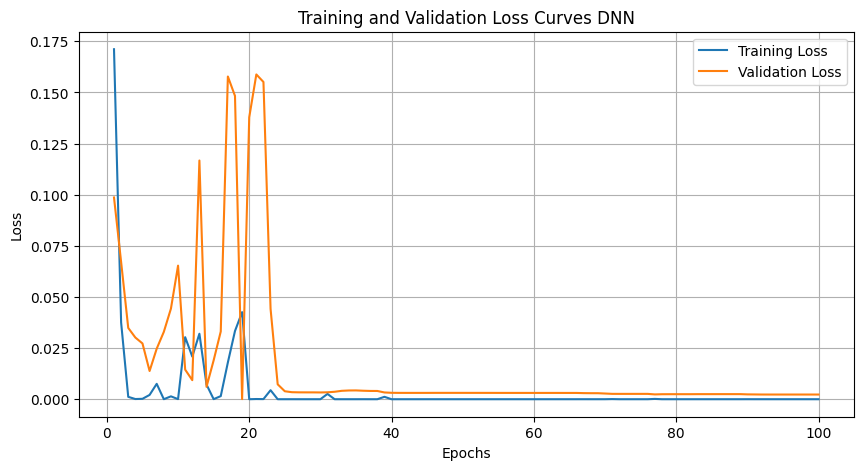

Epoch 1/100
18/18 [==============================] - 1s 15ms/step - loss: 0.1657 - accuracy: 0.9218 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 2/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0152 - accuracy: 0.9964 - val_loss: 1.1950e-04 - val_accuracy: 1.0000
Epoch 3/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0031 - accuracy: 0.9982 - val_loss: 0.0476 - val_accuracy: 0.9929
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0042 - accuracy: 0.9982 - val_loss: 2.7485e-05 - val_accuracy: 1.0000
Epoch 5/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0198 - accuracy: 0.9964 - val_loss: 0.0522 - val_accuracy: 0.9929
Epoch 6/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0028 - accuracy: 0.9982 - val_loss: 0.1303 - val_accuracy: 0.9929
Epoch 7/100
18/18 [==============================] - 0s 6ms/step - loss: 3.7254e-06 - accuracy: 1.0000 - val_loss: 0.1303 - val_accuracy: 0.9929


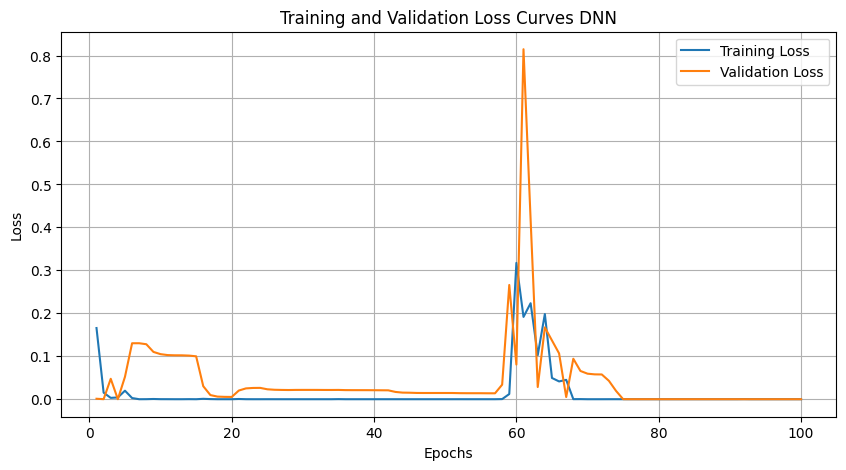

Epoch 1/100
18/18 [==============================] - 1s 14ms/step - loss: 0.1730 - accuracy: 0.9361 - val_loss: 0.0401 - val_accuracy: 0.9929
Epoch 2/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0376 - accuracy: 0.9929 - val_loss: 0.0395 - val_accuracy: 0.9929
Epoch 3/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0046 - accuracy: 0.9982 - val_loss: 0.0072 - val_accuracy: 0.9929
Epoch 4/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0318 - accuracy: 0.9964 - val_loss: 1.3276e-04 - val_accuracy: 1.0000
Epoch 5/100
18/18 [==============================] - 0s 5ms/step - loss: 5.2379e-04 - accuracy: 1.0000 - val_loss: 8.4788e-04 - val_accuracy: 1.0000
Epoch 6/100
18/18 [==============================] - 0s 6ms/step - loss: 4.5283e-04 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 7/100
18/18 [==============================] - 0s 6ms/step - loss: 6.0333e-05 - accuracy: 1.0000 - val_loss: 0.0017 - val_accuracy:

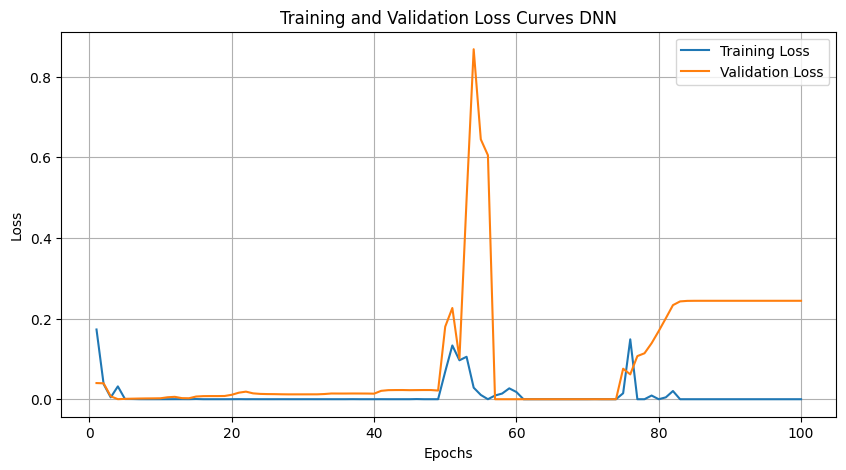

Epoch 1/100
18/18 [==============================] - 1s 14ms/step - loss: 0.1424 - accuracy: 0.9361 - val_loss: 0.0162 - val_accuracy: 0.9929
Epoch 2/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0174 - accuracy: 0.9964 - val_loss: 0.0052 - val_accuracy: 1.0000
Epoch 3/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0070 - accuracy: 0.9982 - val_loss: 1.1467e-04 - val_accuracy: 1.0000
Epoch 4/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0049 - accuracy: 0.9982 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 5/100
18/18 [==============================] - 0s 6ms/step - loss: 4.4299e-05 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 6/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0053 - accuracy: 0.9982 - val_loss: 1.4123e-04 - val_accuracy: 1.0000
Epoch 7/100
18/18 [==============================] - 0s 5ms/step - loss: 0.0142 - accuracy: 0.9982 - val_loss: 7.6239e-04 - val_accuracy: 1.0

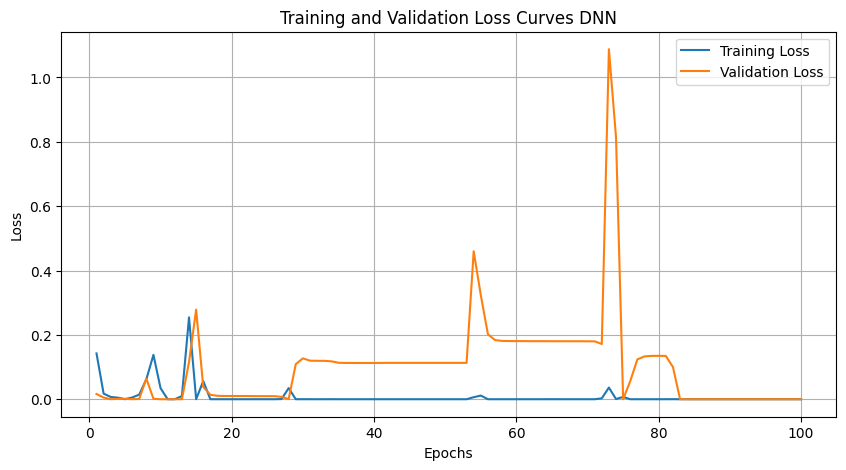

Epoch 1/100
18/18 [==============================] - 1s 14ms/step - loss: 0.1900 - accuracy: 0.9165 - val_loss: 0.0090 - val_accuracy: 0.9929
Epoch 2/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0035 - accuracy: 0.9982 - val_loss: 0.0065 - val_accuracy: 0.9929
Epoch 3/100
18/18 [==============================] - 0s 6ms/step - loss: 1.1052e-04 - accuracy: 1.0000 - val_loss: 0.0047 - val_accuracy: 1.0000
Epoch 4/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0134 - accuracy: 0.9964 - val_loss: 1.1741e-04 - val_accuracy: 1.0000
Epoch 5/100
18/18 [==============================] - 0s 6ms/step - loss: 1.4555e-04 - accuracy: 1.0000 - val_loss: 7.7567e-05 - val_accuracy: 1.0000
Epoch 6/100
18/18 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 6.6508e-05 - val_accuracy: 1.0000
Epoch 7/100
18/18 [==============================] - 0s 6ms/step - loss: 8.9956e-06 - accuracy: 1.0000 - val_loss: 1.8726e-04 - val_a

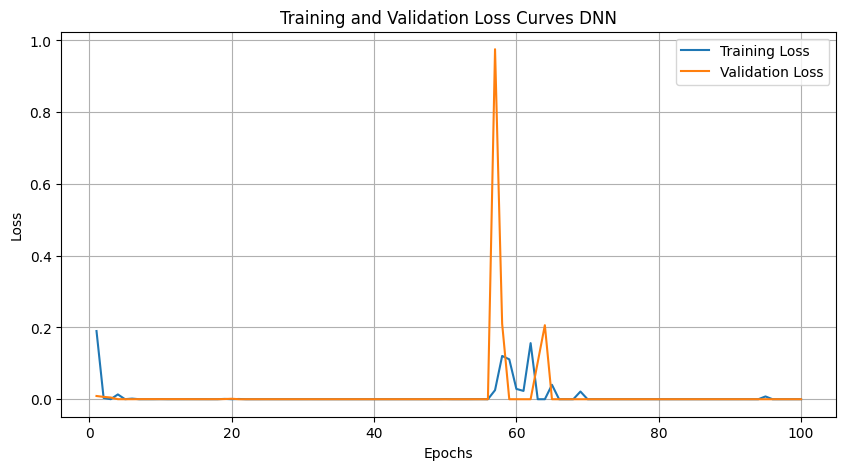

CLR for DNN is: 0.9985815602836879


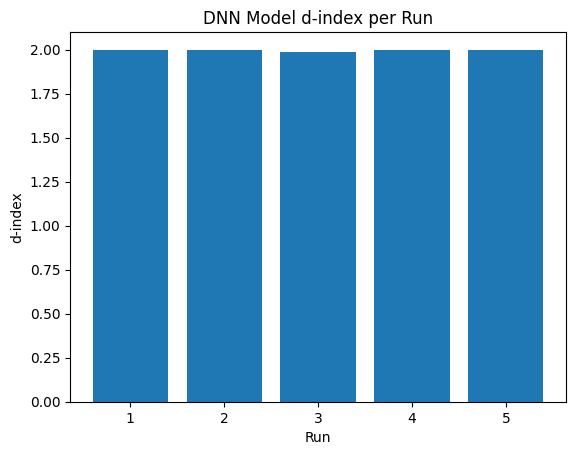

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method=None)

### CNN

Epoch 1/100
15/15 [==============================] - 3s 38ms/step - loss: 5.2944 - accuracy: 0.6111 - val_loss: 0.0631 - val_accuracy: 0.9646
Epoch 2/100
15/15 [==============================] - 0s 19ms/step - loss: 0.2601 - accuracy: 0.9289 - val_loss: 0.0607 - val_accuracy: 0.9735
Epoch 3/100
15/15 [==============================] - 0s 20ms/step - loss: 0.0275 - accuracy: 0.9867 - val_loss: 0.0770 - val_accuracy: 0.9735
Epoch 4/100
15/15 [==============================] - 0s 19ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.0045 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 19ms/step - loss: 2.2730e-04 - accuracy: 1.0000 - val_loss: 8.1222e-04 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 19ms/step - loss: 6.1065e-05 - accuracy: 1.0000 - val_loss: 4.9419e-04 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 19ms/step - loss: 4.4941e-05 - accuracy: 1.0000 - val_loss: 4.1976e-04 - val

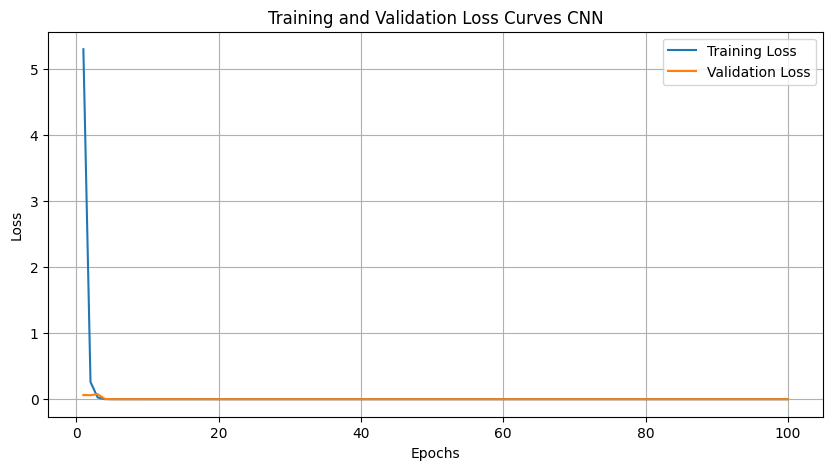

Epoch 1/100
15/15 [==============================] - 1s 29ms/step - loss: 4.0780 - accuracy: 0.6111 - val_loss: 0.0277 - val_accuracy: 0.9912
Epoch 2/100
15/15 [==============================] - 0s 19ms/step - loss: 0.1063 - accuracy: 0.9667 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0182 - accuracy: 0.9956 - val_loss: 0.0646 - val_accuracy: 0.9735
Epoch 4/100
15/15 [==============================] - 0s 19ms/step - loss: 0.0044 - accuracy: 0.9978 - val_loss: 0.0105 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 19ms/step - loss: 0.0030 - accuracy: 0.9978 - val_loss: 0.0106 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 19ms/step - loss: 0.4560 - accuracy: 0.9378 - val_loss: 0.3891 - val_accuracy: 0.9027
Epoch 7/100
15/15 [==============================] - 0s 19ms/step - loss: 0.0710 - accuracy: 0.9800 - val_loss: 0.2604 - val_accuracy: 0.9558
Epoch 

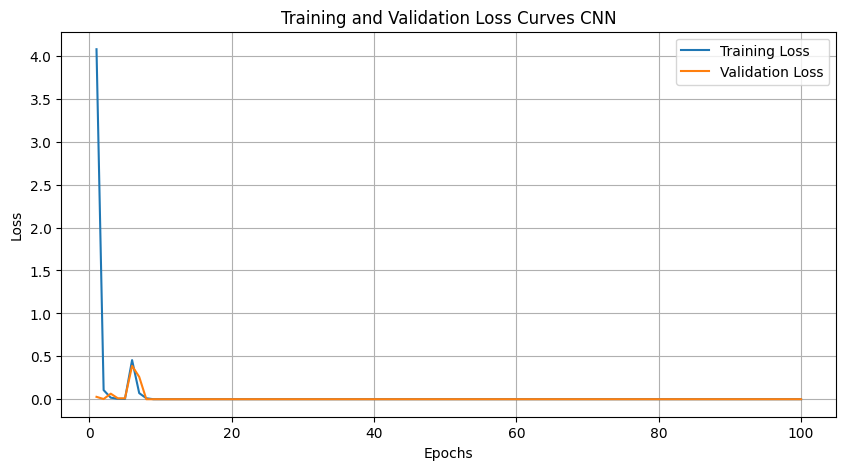

Epoch 1/100
15/15 [==============================] - 1s 28ms/step - loss: 2.8207 - accuracy: 0.7089 - val_loss: 0.2825 - val_accuracy: 0.9027
Epoch 2/100
15/15 [==============================] - 0s 18ms/step - loss: 0.1040 - accuracy: 0.9600 - val_loss: 0.3875 - val_accuracy: 0.9027
Epoch 3/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0606 - accuracy: 0.9889 - val_loss: 0.0107 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0225 - accuracy: 0.9933 - val_loss: 0.0412 - val_accuracy: 0.9912
Epoch 5/100
15/15 [==============================] - 0s 18ms/step - loss: 3.3428e-04 - accuracy: 1.0000 - val_loss: 3.2419e-04 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 18ms/step - loss: 7.1892e-05 - accuracy: 1.0000 - val_loss: 1.2346e-04 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 18ms/step - loss: 8.9116e-05 - accuracy: 1.0000 - val_loss: 1.3304e-04 - val

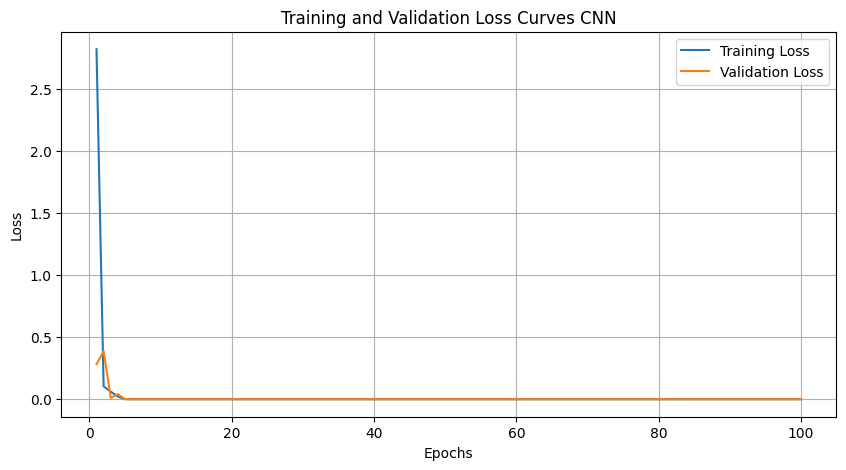

Epoch 1/100
15/15 [==============================] - 1s 28ms/step - loss: 3.8012 - accuracy: 0.6067 - val_loss: 0.0215 - val_accuracy: 0.9912
Epoch 2/100
15/15 [==============================] - 0s 18ms/step - loss: 0.1208 - accuracy: 0.9600 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0146 - accuracy: 0.9933 - val_loss: 0.1015 - val_accuracy: 0.9469
Epoch 4/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0167 - accuracy: 0.9978 - val_loss: 6.0630e-04 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.6648e-04 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0269 - accuracy: 0.9844 - val_loss: 1.1259 - val_accuracy: 0.8142
Epoch 7/100
15/15 [==============================] - 0s 18ms/step - loss: 0.1230 - accuracy: 0.9667 - val_loss: 3.7799e-04 - val_accuracy: 1

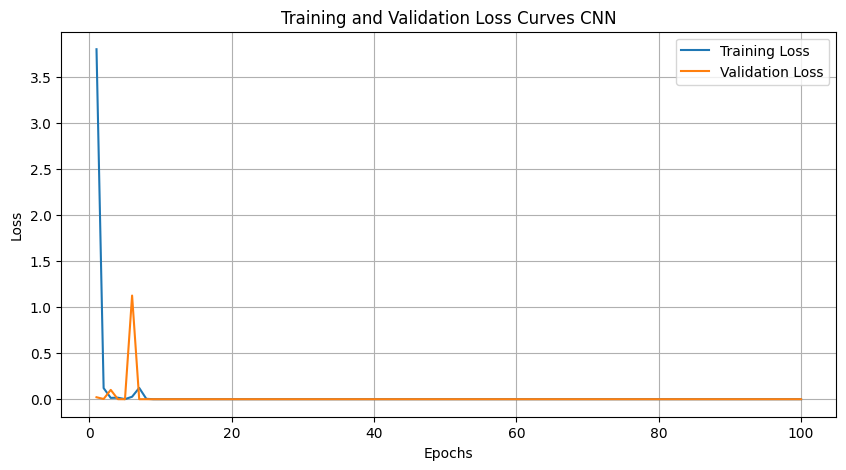

Epoch 1/100
15/15 [==============================] - 1s 28ms/step - loss: 3.4237 - accuracy: 0.6778 - val_loss: 0.1683 - val_accuracy: 0.9381
Epoch 2/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0904 - accuracy: 0.9622 - val_loss: 0.0255 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0318 - accuracy: 0.9933 - val_loss: 0.1345 - val_accuracy: 0.9204
Epoch 4/100
15/15 [==============================] - 0s 18ms/step - loss: 0.0240 - accuracy: 0.9889 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 18ms/step - loss: 4.1559e-05 - accuracy: 1.0000 - val_loss: 2.9157e-04 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 18ms/step - loss: 1.5790e-05 - accuracy: 1.0000 - val_loss: 2.9904e-04 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 18ms/step - loss: 2.4800e-05 - accuracy: 1.0000 - val_loss: 3.1765e-04 - val

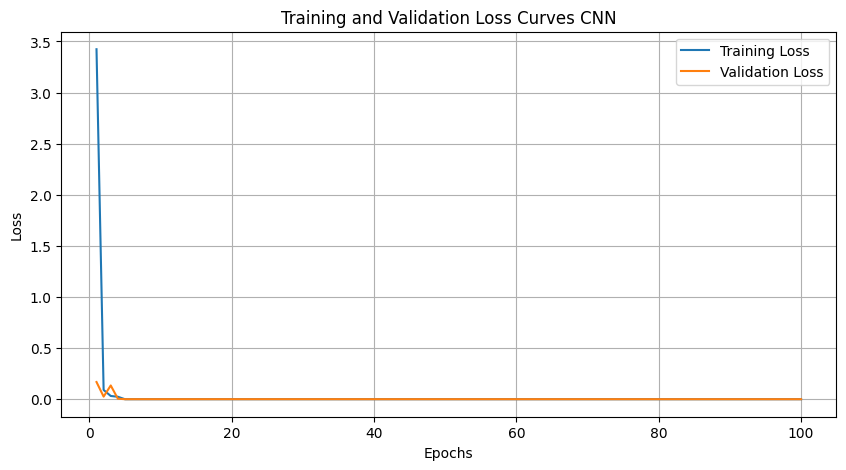

CLR for CNN is: 0.9971631205673759


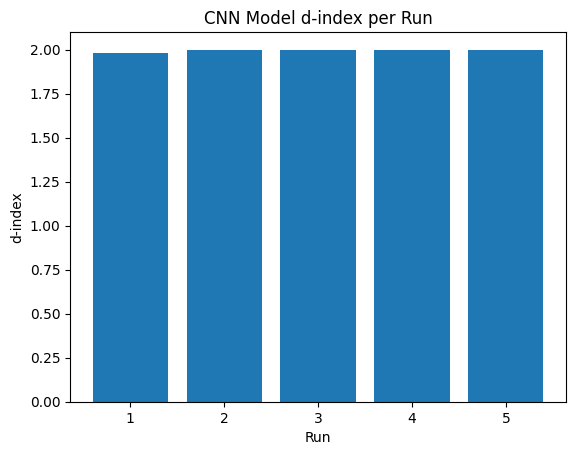

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method=None)

### LSTM

Epoch 1/100
15/15 [==============================] - 12s 532ms/step - loss: 1.0919 - accuracy: 0.4156 - val_loss: 1.0724 - val_accuracy: 0.4513
Epoch 2/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0790 - accuracy: 0.4400 - val_loss: 1.0417 - val_accuracy: 0.4956
Epoch 3/100
15/15 [==============================] - 7s 482ms/step - loss: 1.0571 - accuracy: 0.4600 - val_loss: 1.0360 - val_accuracy: 0.5133
Epoch 4/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0382 - accuracy: 0.4800 - val_loss: 1.0134 - val_accuracy: 0.5044
Epoch 5/100
15/15 [==============================] - 7s 483ms/step - loss: 1.0259 - accuracy: 0.4956 - val_loss: 0.9915 - val_accuracy: 0.5575
Epoch 6/100
15/15 [==============================] - 7s 487ms/step - loss: 0.9681 - accuracy: 0.5467 - val_loss: 0.9077 - val_accuracy: 0.5929
Epoch 7/100
15/15 [==============================] - 7s 482ms/step - loss: 0.9816 - accuracy: 0.5067 - val_loss: 0.9260 - val_accuracy: 0.619

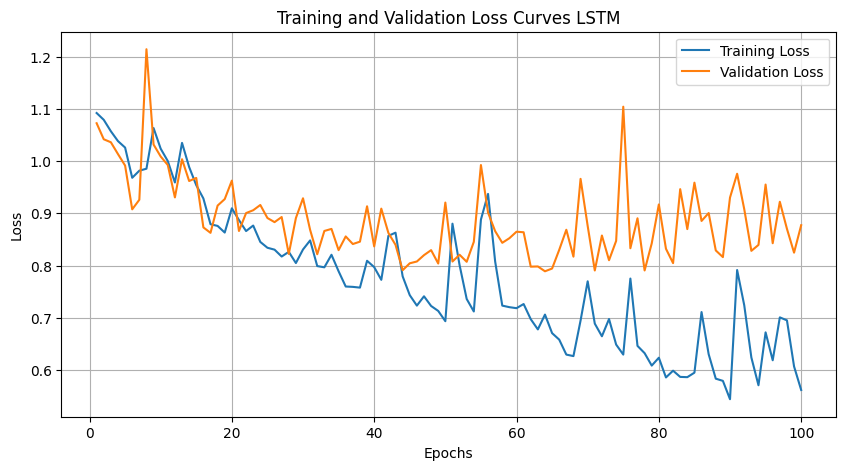

Epoch 1/100
15/15 [==============================] - 11s 532ms/step - loss: 1.0934 - accuracy: 0.4222 - val_loss: 1.0800 - val_accuracy: 0.4690
Epoch 2/100
15/15 [==============================] - 7s 486ms/step - loss: 1.0765 - accuracy: 0.4444 - val_loss: 1.0504 - val_accuracy: 0.4425
Epoch 3/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0644 - accuracy: 0.4622 - val_loss: 1.0493 - val_accuracy: 0.4779
Epoch 4/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0556 - accuracy: 0.4600 - val_loss: 1.0410 - val_accuracy: 0.4779
Epoch 5/100
15/15 [==============================] - 7s 483ms/step - loss: 1.0549 - accuracy: 0.4711 - val_loss: 1.0337 - val_accuracy: 0.4956
Epoch 6/100
15/15 [==============================] - 7s 486ms/step - loss: 1.0293 - accuracy: 0.4911 - val_loss: 0.9524 - val_accuracy: 0.6283
Epoch 7/100
15/15 [==============================] - 7s 486ms/step - loss: 1.0447 - accuracy: 0.4933 - val_loss: 1.0300 - val_accuracy: 0.522

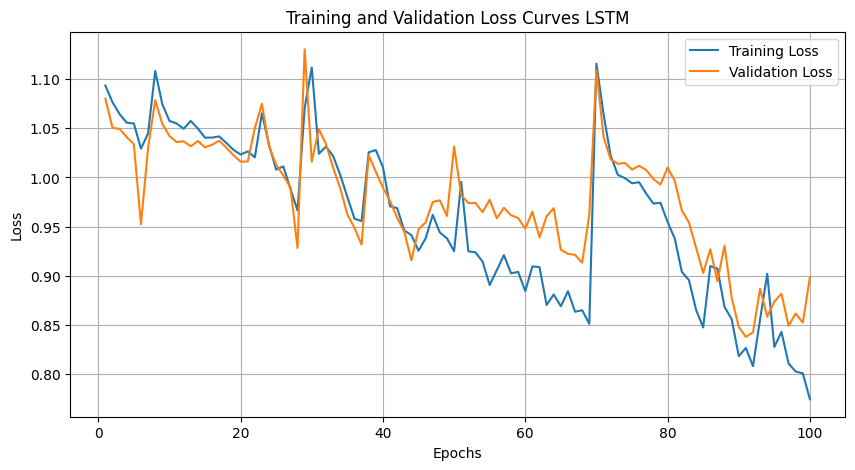

Epoch 1/100
15/15 [==============================] - 11s 528ms/step - loss: 1.0922 - accuracy: 0.3467 - val_loss: 1.0680 - val_accuracy: 0.4425
Epoch 2/100
15/15 [==============================] - 7s 482ms/step - loss: 1.0686 - accuracy: 0.3978 - val_loss: 1.0375 - val_accuracy: 0.4602
Epoch 3/100
15/15 [==============================] - 7s 480ms/step - loss: 1.0556 - accuracy: 0.4422 - val_loss: 1.0319 - val_accuracy: 0.4779
Epoch 4/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0513 - accuracy: 0.4667 - val_loss: 1.0352 - val_accuracy: 0.4867
Epoch 5/100
15/15 [==============================] - 7s 481ms/step - loss: 1.0512 - accuracy: 0.4378 - val_loss: 1.0241 - val_accuracy: 0.4602
Epoch 6/100
15/15 [==============================] - 7s 483ms/step - loss: 1.0424 - accuracy: 0.4622 - val_loss: 1.0183 - val_accuracy: 0.5310
Epoch 7/100
15/15 [==============================] - 7s 481ms/step - loss: 1.0385 - accuracy: 0.4800 - val_loss: 1.0174 - val_accuracy: 0.513

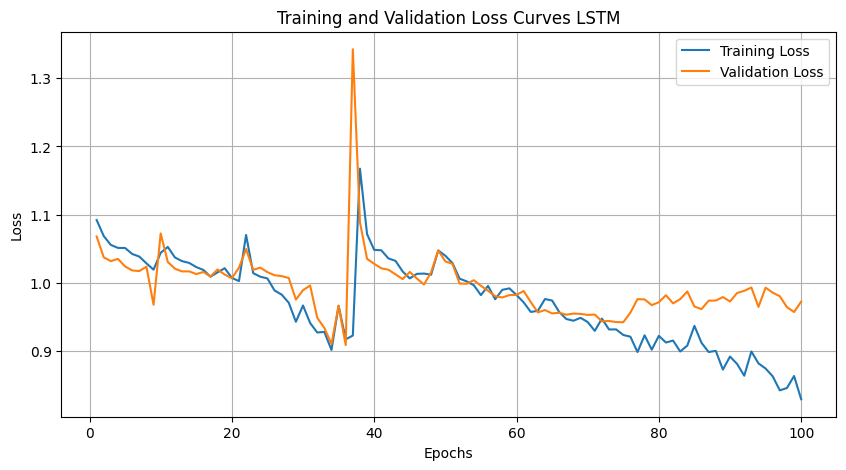

Epoch 1/100
15/15 [==============================] - 11s 557ms/step - loss: 1.0896 - accuracy: 0.3622 - val_loss: 1.0633 - val_accuracy: 0.4425
Epoch 2/100
15/15 [==============================] - 7s 482ms/step - loss: 1.0696 - accuracy: 0.3956 - val_loss: 1.0395 - val_accuracy: 0.4513
Epoch 3/100
15/15 [==============================] - 7s 481ms/step - loss: 1.0621 - accuracy: 0.4267 - val_loss: 1.0379 - val_accuracy: 0.4602
Epoch 4/100
15/15 [==============================] - 7s 482ms/step - loss: 1.0488 - accuracy: 0.4533 - val_loss: 1.0339 - val_accuracy: 0.4690
Epoch 5/100
15/15 [==============================] - 7s 482ms/step - loss: 1.0466 - accuracy: 0.4444 - val_loss: 1.0326 - val_accuracy: 0.4779
Epoch 6/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0496 - accuracy: 0.4600 - val_loss: 1.0303 - val_accuracy: 0.4956
Epoch 7/100
15/15 [==============================] - 7s 487ms/step - loss: 1.0260 - accuracy: 0.4911 - val_loss: 1.0087 - val_accuracy: 0.522

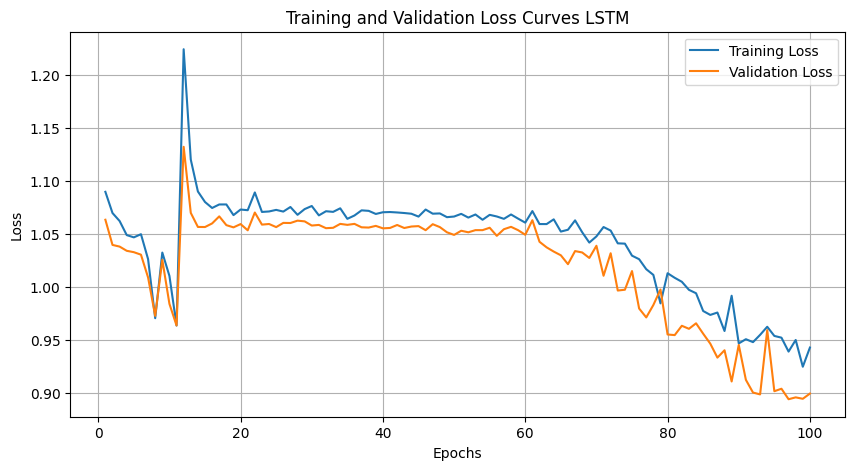

Epoch 1/100
15/15 [==============================] - 11s 531ms/step - loss: 1.0890 - accuracy: 0.4311 - val_loss: 1.0656 - val_accuracy: 0.4513
Epoch 2/100
15/15 [==============================] - 7s 481ms/step - loss: 1.0697 - accuracy: 0.4200 - val_loss: 1.0353 - val_accuracy: 0.4602
Epoch 3/100
15/15 [==============================] - 7s 485ms/step - loss: 1.0622 - accuracy: 0.4667 - val_loss: 1.0431 - val_accuracy: 0.4956
Epoch 4/100
15/15 [==============================] - 7s 481ms/step - loss: 1.0491 - accuracy: 0.4689 - val_loss: 1.0362 - val_accuracy: 0.5133
Epoch 5/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0464 - accuracy: 0.4756 - val_loss: 1.0215 - val_accuracy: 0.5044
Epoch 6/100
15/15 [==============================] - 7s 481ms/step - loss: 1.0342 - accuracy: 0.4956 - val_loss: 1.0162 - val_accuracy: 0.5133
Epoch 7/100
15/15 [==============================] - 7s 484ms/step - loss: 1.0128 - accuracy: 0.5156 - val_loss: 0.9323 - val_accuracy: 0.584

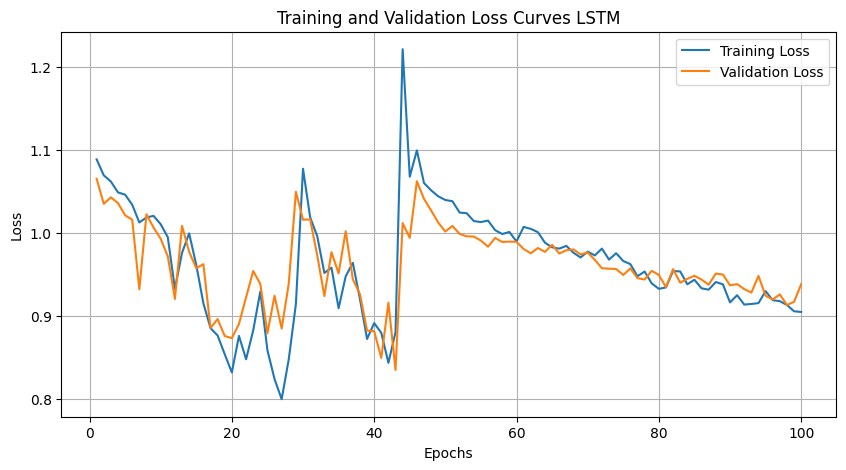

CLR for LSTM is: 0.5404255319148936


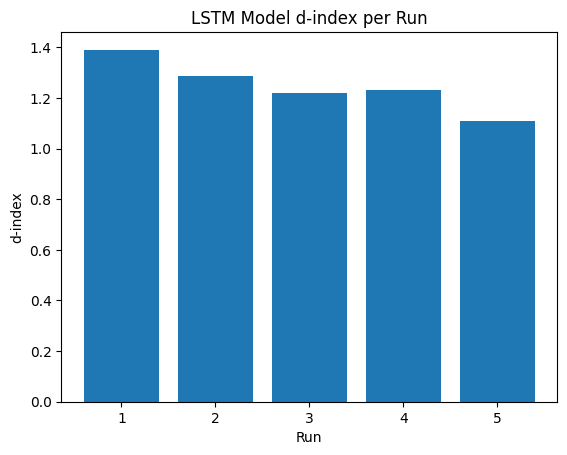

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method=None)

### GRU

Epoch 1/100
15/15 [==============================] - 7s 296ms/step - loss: 1.0792 - accuracy: 0.4333 - val_loss: 1.0514 - val_accuracy: 0.4956
Epoch 2/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0514 - accuracy: 0.4911 - val_loss: 1.0231 - val_accuracy: 0.5133
Epoch 3/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0340 - accuracy: 0.5000 - val_loss: 1.0072 - val_accuracy: 0.5221
Epoch 4/100
15/15 [==============================] - 4s 262ms/step - loss: 1.0177 - accuracy: 0.5200 - val_loss: 1.0008 - val_accuracy: 0.5398
Epoch 5/100
15/15 [==============================] - 4s 263ms/step - loss: 1.0157 - accuracy: 0.5200 - val_loss: 0.9914 - val_accuracy: 0.5398
Epoch 6/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0054 - accuracy: 0.5267 - val_loss: 0.9902 - val_accuracy: 0.5487
Epoch 7/100
15/15 [==============================] - 4s 260ms/step - loss: 1.0027 - accuracy: 0.5244 - val_loss: 0.9879 - val_accuracy: 0.5310

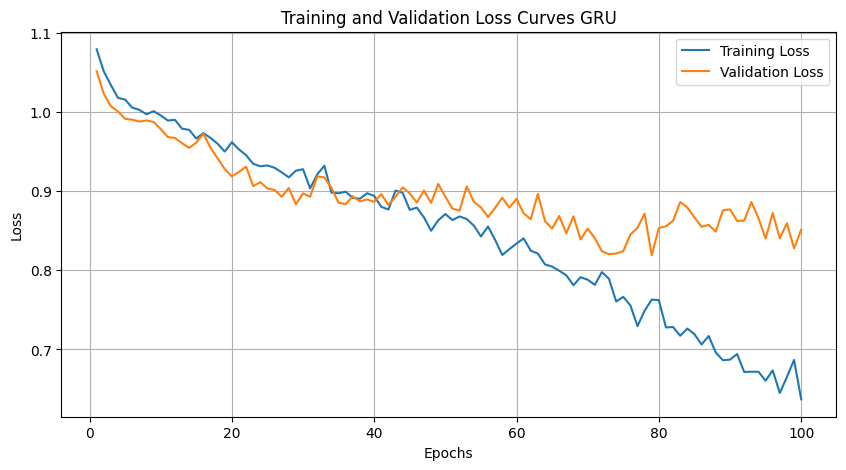

Epoch 1/100
15/15 [==============================] - 6s 292ms/step - loss: 1.0716 - accuracy: 0.4622 - val_loss: 1.0432 - val_accuracy: 0.5044
Epoch 2/100
15/15 [==============================] - 4s 262ms/step - loss: 1.0476 - accuracy: 0.4844 - val_loss: 1.0181 - val_accuracy: 0.5044
Epoch 3/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0349 - accuracy: 0.5022 - val_loss: 1.0050 - val_accuracy: 0.5398
Epoch 4/100
15/15 [==============================] - 4s 260ms/step - loss: 1.0227 - accuracy: 0.5178 - val_loss: 1.0008 - val_accuracy: 0.5310
Epoch 5/100
15/15 [==============================] - 4s 265ms/step - loss: 1.0131 - accuracy: 0.5156 - val_loss: 0.9919 - val_accuracy: 0.5221
Epoch 6/100
15/15 [==============================] - 4s 262ms/step - loss: 1.0113 - accuracy: 0.5111 - val_loss: 0.9911 - val_accuracy: 0.5310
Epoch 7/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0037 - accuracy: 0.5178 - val_loss: 0.9901 - val_accuracy: 0.5310

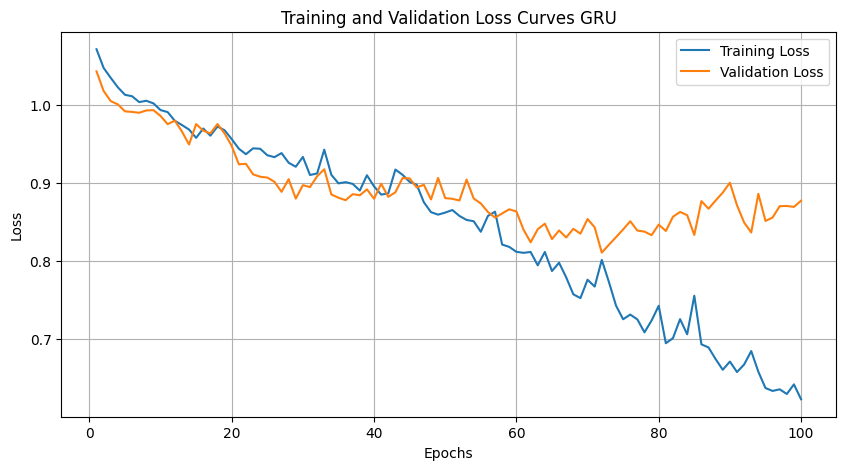

Epoch 1/100
15/15 [==============================] - 7s 293ms/step - loss: 1.0799 - accuracy: 0.4156 - val_loss: 1.0542 - val_accuracy: 0.4956
Epoch 2/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0557 - accuracy: 0.4844 - val_loss: 1.0266 - val_accuracy: 0.4867
Epoch 3/100
15/15 [==============================] - 4s 262ms/step - loss: 1.0394 - accuracy: 0.5111 - val_loss: 1.0106 - val_accuracy: 0.5487
Epoch 4/100
15/15 [==============================] - 4s 260ms/step - loss: 1.0270 - accuracy: 0.5022 - val_loss: 1.0051 - val_accuracy: 0.5398
Epoch 5/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0229 - accuracy: 0.5067 - val_loss: 0.9954 - val_accuracy: 0.5310
Epoch 6/100
15/15 [==============================] - 4s 263ms/step - loss: 1.0150 - accuracy: 0.5156 - val_loss: 0.9935 - val_accuracy: 0.5398
Epoch 7/100
15/15 [==============================] - 4s 263ms/step - loss: 1.0104 - accuracy: 0.5156 - val_loss: 0.9918 - val_accuracy: 0.5487

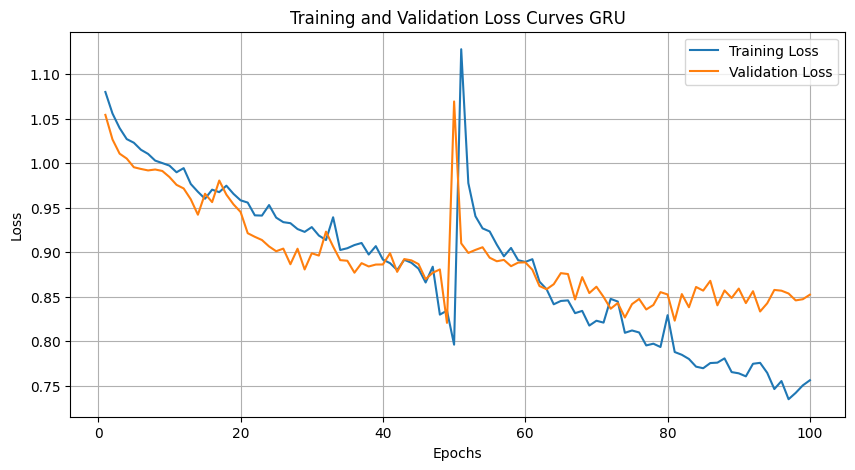

Epoch 1/100
15/15 [==============================] - 6s 289ms/step - loss: 1.0812 - accuracy: 0.3889 - val_loss: 1.0535 - val_accuracy: 0.5044
Epoch 2/100
15/15 [==============================] - 4s 259ms/step - loss: 1.0585 - accuracy: 0.4889 - val_loss: 1.0280 - val_accuracy: 0.4867
Epoch 3/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0408 - accuracy: 0.4911 - val_loss: 1.0130 - val_accuracy: 0.5133
Epoch 4/100
15/15 [==============================] - 4s 260ms/step - loss: 1.0323 - accuracy: 0.5156 - val_loss: 1.0074 - val_accuracy: 0.5398
Epoch 5/100
15/15 [==============================] - 4s 259ms/step - loss: 1.0203 - accuracy: 0.5222 - val_loss: 0.9997 - val_accuracy: 0.5310
Epoch 6/100
15/15 [==============================] - 4s 259ms/step - loss: 1.0157 - accuracy: 0.5156 - val_loss: 0.9974 - val_accuracy: 0.5310
Epoch 7/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0127 - accuracy: 0.5289 - val_loss: 0.9957 - val_accuracy: 0.5310

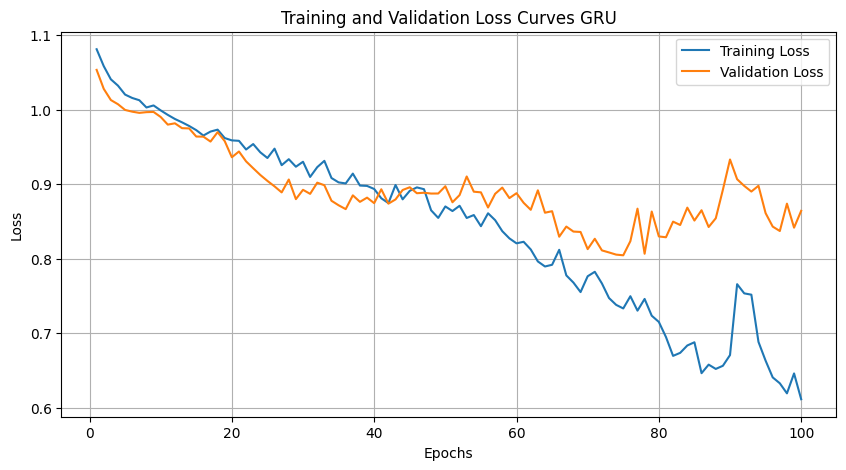

Epoch 1/100
15/15 [==============================] - 6s 286ms/step - loss: 1.0726 - accuracy: 0.4711 - val_loss: 1.0496 - val_accuracy: 0.5133
Epoch 2/100
15/15 [==============================] - 4s 259ms/step - loss: 1.0488 - accuracy: 0.4978 - val_loss: 1.0249 - val_accuracy: 0.5044
Epoch 3/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0367 - accuracy: 0.4978 - val_loss: 1.0096 - val_accuracy: 0.5310
Epoch 4/100
15/15 [==============================] - 4s 261ms/step - loss: 1.0148 - accuracy: 0.5133 - val_loss: 1.0026 - val_accuracy: 0.5398
Epoch 5/100
15/15 [==============================] - 4s 259ms/step - loss: 1.0120 - accuracy: 0.5133 - val_loss: 0.9926 - val_accuracy: 0.5398
Epoch 6/100
15/15 [==============================] - 4s 259ms/step - loss: 1.0051 - accuracy: 0.5244 - val_loss: 0.9916 - val_accuracy: 0.5398
Epoch 7/100
15/15 [==============================] - 4s 260ms/step - loss: 0.9993 - accuracy: 0.5289 - val_loss: 0.9899 - val_accuracy: 0.5398

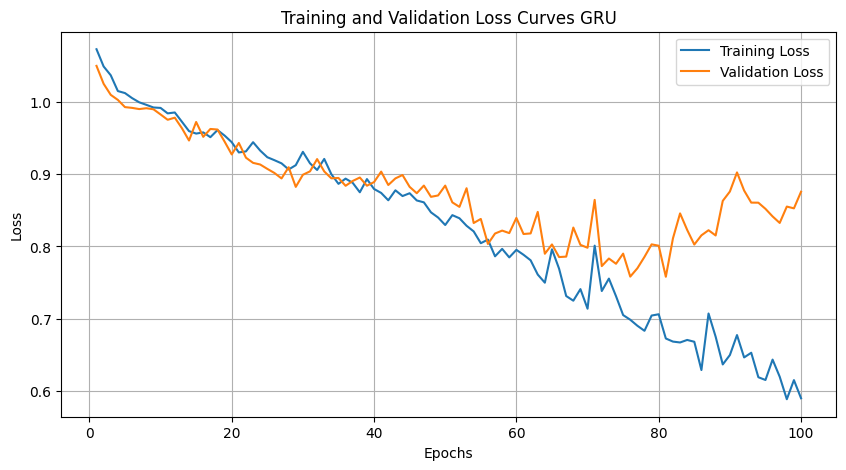

CLR for GRU is: 0.5787234042553192


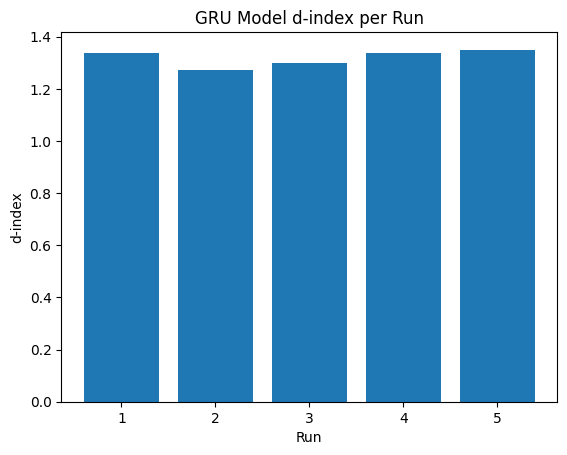

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method=None)

### PCA+TSNE DNN

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 1.2272 - accuracy: 0.4178 - val_loss: 0.3831 - val_accuracy: 0.9027
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3206 - accuracy: 0.8933 - val_loss: 0.1449 - val_accuracy: 0.9735
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1840 - accuracy: 0.9467 - val_loss: 0.0968 - val_accuracy: 0.9823
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1332 - accuracy: 0.9578 - val_loss: 0.0771 - val_accuracy: 0.9823
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1202 - accuracy: 0.9600 - val_loss: 0.0656 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0947 - accuracy: 0.9711 - val_loss: 0.0574 - val_accuracy: 0.9912
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0948 - accuracy: 0.9733 - val_loss: 0.0516 - val_accuracy: 0.9912
Epoch 8/100


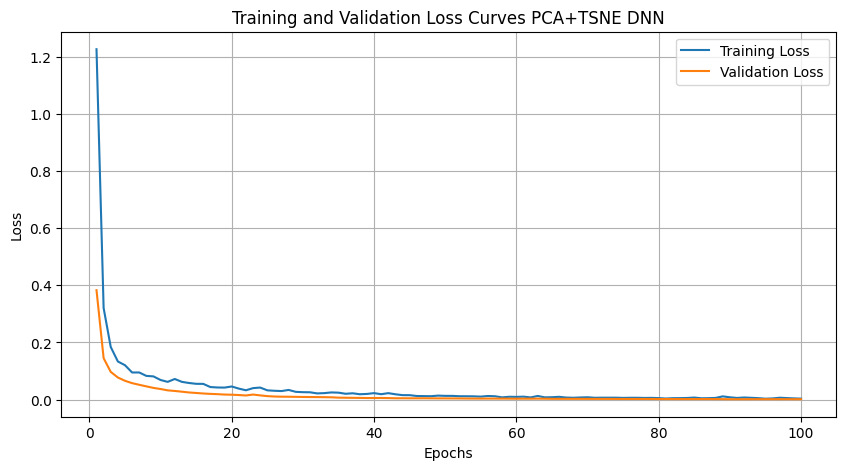

Epoch 1/100
15/15 [==============================] - 1s 14ms/step - loss: 1.0525 - accuracy: 0.4911 - val_loss: 0.3319 - val_accuracy: 0.8850
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2596 - accuracy: 0.9200 - val_loss: 0.1218 - val_accuracy: 0.9823
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1454 - accuracy: 0.9711 - val_loss: 0.0809 - val_accuracy: 0.9823
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1203 - accuracy: 0.9600 - val_loss: 0.0642 - val_accuracy: 0.9912
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1016 - accuracy: 0.9711 - val_loss: 0.0534 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1027 - accuracy: 0.9667 - val_loss: 0.0468 - val_accuracy: 0.9912
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0896 - accuracy: 0.9733 - val_loss: 0.0424 - val_accuracy: 0.9912
Epoch 8/100


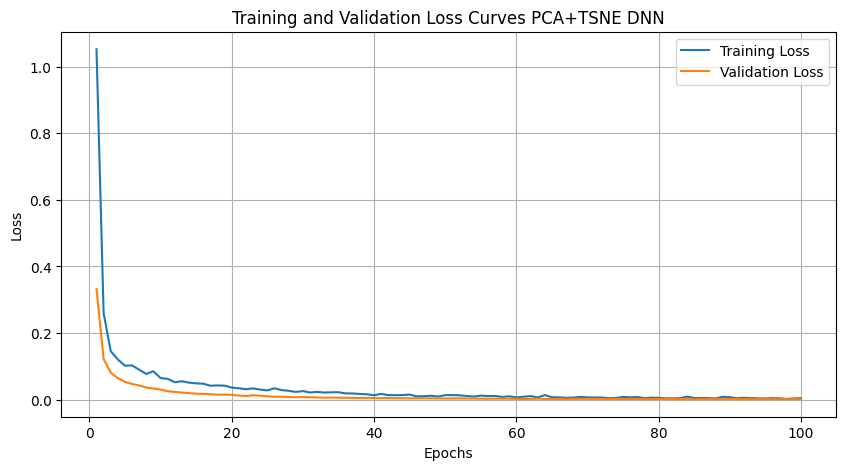

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 1.1829 - accuracy: 0.4800 - val_loss: 0.3244 - val_accuracy: 0.9292
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2706 - accuracy: 0.9156 - val_loss: 0.1185 - val_accuracy: 0.9735
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1663 - accuracy: 0.9467 - val_loss: 0.0798 - val_accuracy: 0.9823
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1227 - accuracy: 0.9622 - val_loss: 0.0640 - val_accuracy: 0.9823
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1024 - accuracy: 0.9622 - val_loss: 0.0555 - val_accuracy: 0.9823
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1011 - accuracy: 0.9644 - val_loss: 0.0489 - val_accuracy: 0.9823
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0937 - accuracy: 0.9667 - val_loss: 0.0441 - val_accuracy: 0.9823
Epoch 8/100


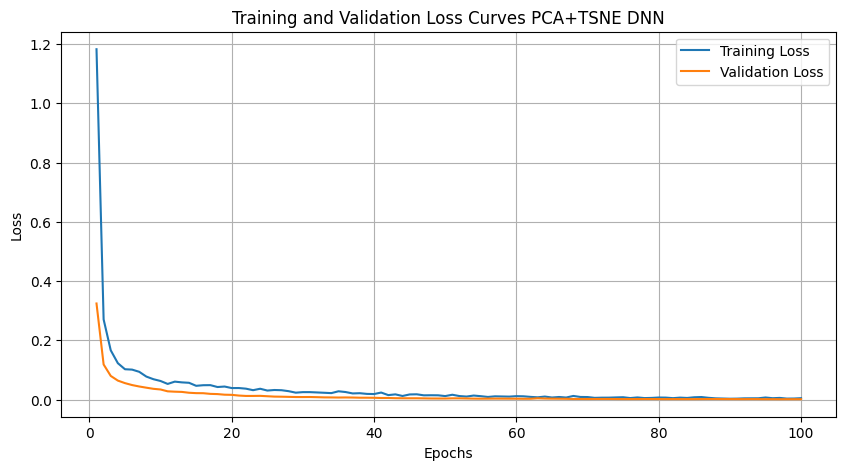

Epoch 1/100
15/15 [==============================] - 1s 14ms/step - loss: 0.6664 - accuracy: 0.7022 - val_loss: 0.1765 - val_accuracy: 0.9735
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1974 - accuracy: 0.9267 - val_loss: 0.0793 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1316 - accuracy: 0.9533 - val_loss: 0.0546 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1050 - accuracy: 0.9489 - val_loss: 0.0433 - val_accuracy: 0.9912
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0983 - accuracy: 0.9600 - val_loss: 0.0378 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0715 - accuracy: 0.9733 - val_loss: 0.0316 - val_accuracy: 0.9912
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0638 - accuracy: 0.9756 - val_loss: 0.0273 - val_accuracy: 1.0000
Epoch 8/100


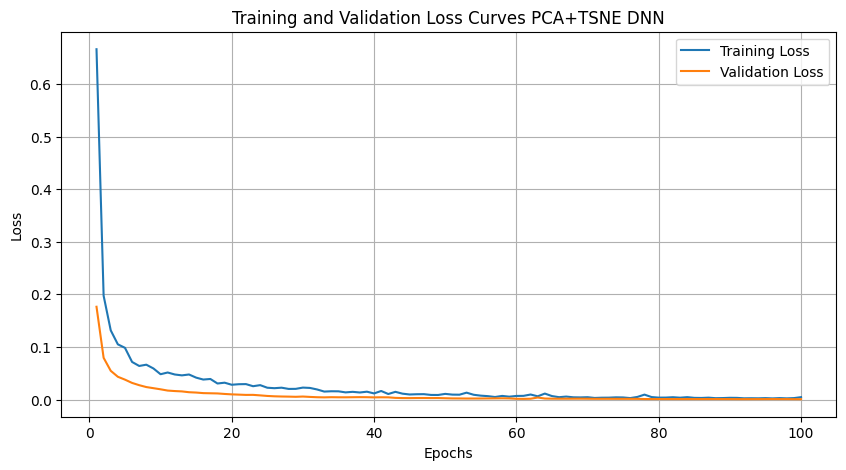

Epoch 1/100
15/15 [==============================] - 1s 14ms/step - loss: 0.5851 - accuracy: 0.8267 - val_loss: 0.1383 - val_accuracy: 0.9735
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2164 - accuracy: 0.9111 - val_loss: 0.0686 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1315 - accuracy: 0.9467 - val_loss: 0.0472 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1016 - accuracy: 0.9600 - val_loss: 0.0368 - val_accuracy: 0.9912
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0834 - accuracy: 0.9711 - val_loss: 0.0308 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0824 - accuracy: 0.9689 - val_loss: 0.0263 - val_accuracy: 0.9912
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0606 - accuracy: 0.9800 - val_loss: 0.0233 - val_accuracy: 1.0000
Epoch 8/100


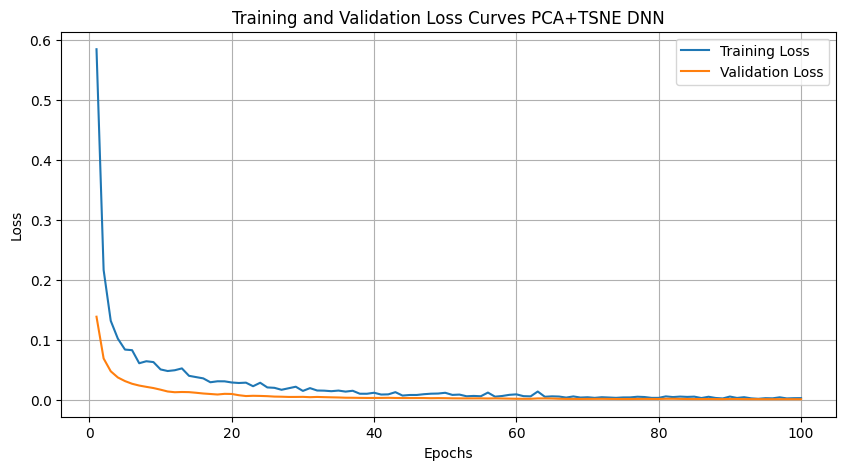

CLR for PCA+TSNE DNN is: 0.9957446808510639


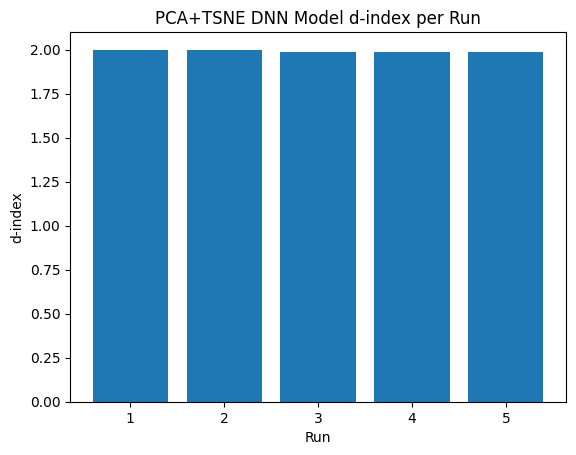

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE CNN

Epoch 1/100
15/15 [==============================] - 1s 20ms/step - loss: 0.4388 - accuracy: 0.8022 - val_loss: 0.1212 - val_accuracy: 0.9912
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0994 - accuracy: 0.9778 - val_loss: 0.0417 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0559 - accuracy: 0.9778 - val_loss: 0.0266 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0427 - accuracy: 0.9867 - val_loss: 0.0192 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.9867 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0300 - accuracy: 0.9911 - val_loss: 0.0125 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9933 - val_loss: 0.0103 - val_accuracy: 1.0000
Epoch 8/100


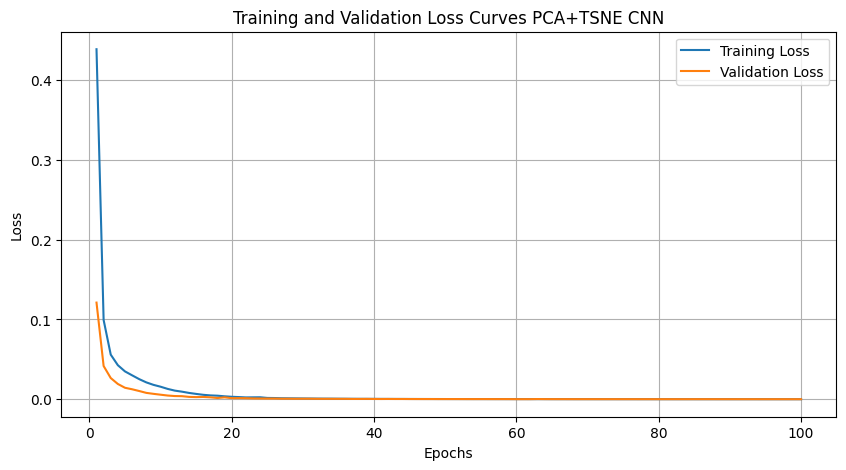

Epoch 1/100
15/15 [==============================] - 1s 16ms/step - loss: 0.4644 - accuracy: 0.8267 - val_loss: 0.1089 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0974 - accuracy: 0.9756 - val_loss: 0.0379 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0563 - accuracy: 0.9844 - val_loss: 0.0215 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.9867 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 0.9867 - val_loss: 0.0118 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0296 - accuracy: 0.9911 - val_loss: 0.0100 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 0.9933 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 8/100


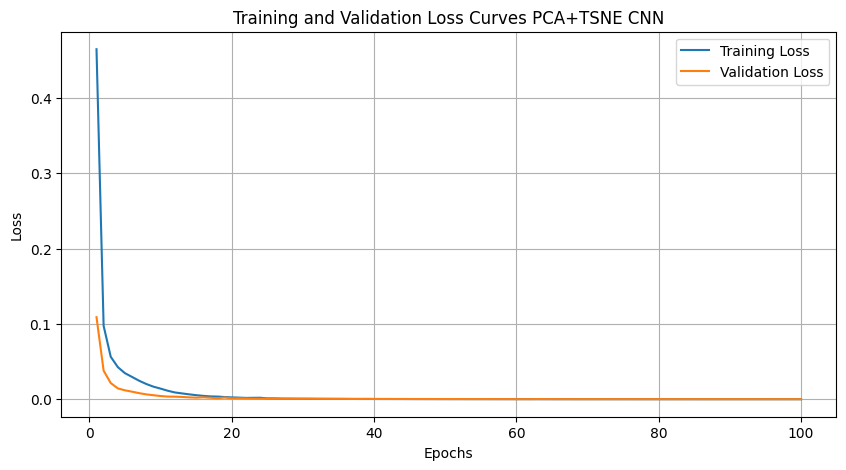

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 0.3376 - accuracy: 0.9311 - val_loss: 0.0960 - val_accuracy: 0.9912
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0882 - accuracy: 0.9756 - val_loss: 0.0374 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0566 - accuracy: 0.9778 - val_loss: 0.0228 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.9822 - val_loss: 0.0167 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.9889 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0309 - accuracy: 0.9889 - val_loss: 0.0106 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9911 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 8/100


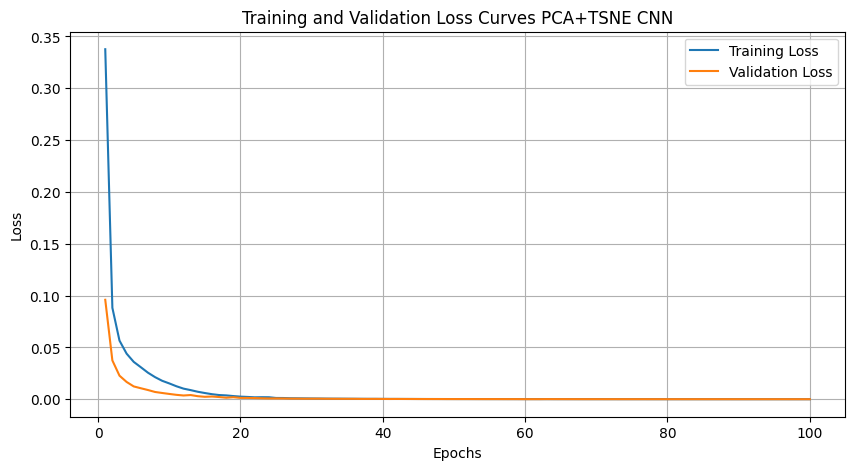

Epoch 1/100
15/15 [==============================] - 2s 16ms/step - loss: 0.5091 - accuracy: 0.8289 - val_loss: 0.0966 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0871 - accuracy: 0.9822 - val_loss: 0.0305 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0514 - accuracy: 0.9844 - val_loss: 0.0201 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.9867 - val_loss: 0.0154 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0318 - accuracy: 0.9867 - val_loss: 0.0120 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0265 - accuracy: 0.9911 - val_loss: 0.0105 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9933 - val_loss: 0.0087 - val_accuracy: 1.0000
Epoch 8/100


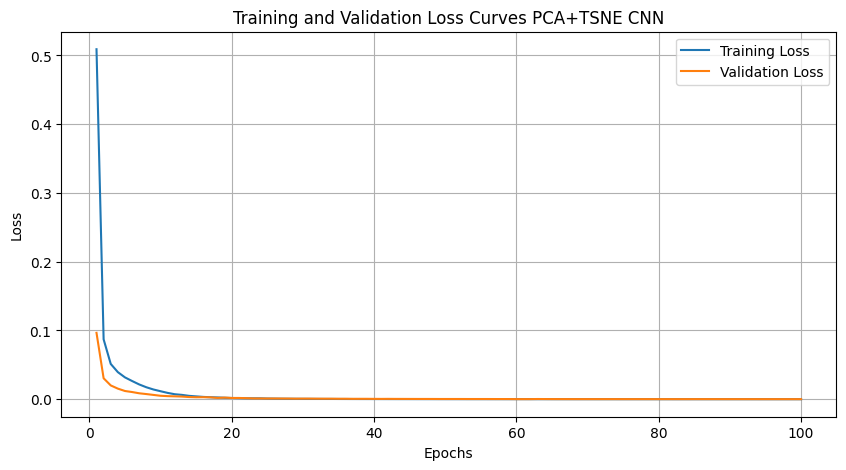

Epoch 1/100
15/15 [==============================] - 1s 16ms/step - loss: 0.5139 - accuracy: 0.7911 - val_loss: 0.0944 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0941 - accuracy: 0.9800 - val_loss: 0.0303 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0569 - accuracy: 0.9800 - val_loss: 0.0196 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0449 - accuracy: 0.9844 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 7ms/step - loss: 0.0375 - accuracy: 0.9844 - val_loss: 0.0108 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0324 - accuracy: 0.9844 - val_loss: 0.0101 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0274 - accuracy: 0.9911 - val_loss: 0.0084 - val_accuracy: 1.0000
Epoch 8/100


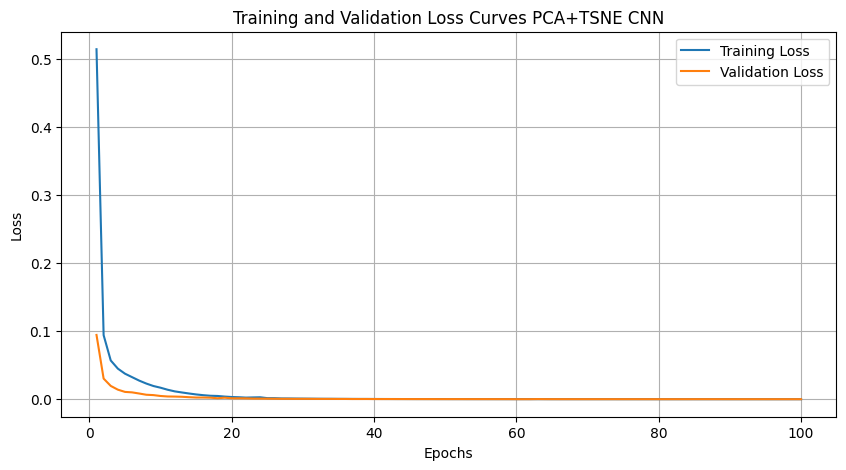

CLR for PCA+TSNE CNN is: 0.9929078014184396


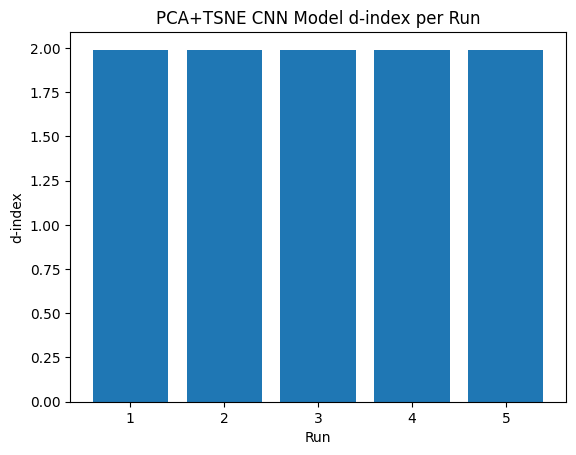

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE LSTM

Epoch 1/100
15/15 [==============================] - 4s 58ms/step - loss: 0.9802 - accuracy: 0.6933 - val_loss: 0.8532 - val_accuracy: 0.7434
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.7282 - accuracy: 0.7200 - val_loss: 0.6146 - val_accuracy: 0.7611
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.5533 - accuracy: 0.7422 - val_loss: 0.4900 - val_accuracy: 0.7699
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4532 - accuracy: 0.7889 - val_loss: 0.4126 - val_accuracy: 0.7788
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4016 - accuracy: 0.7733 - val_loss: 0.3439 - val_accuracy: 0.8938
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3457 - accuracy: 0.8489 - val_loss: 0.2864 - val_accuracy: 0.9292
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3020 - accuracy: 0.8489 - val_loss: 0.2325 - val_accuracy: 0.9558
Epoch 8/100


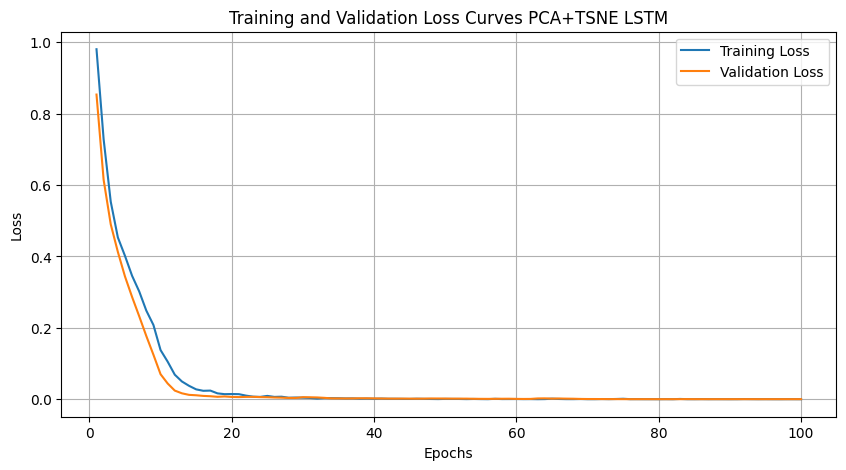

Epoch 1/100
15/15 [==============================] - 4s 58ms/step - loss: 0.9959 - accuracy: 0.7044 - val_loss: 0.8657 - val_accuracy: 0.7699
Epoch 2/100
15/15 [==============================] - 0s 7ms/step - loss: 0.7455 - accuracy: 0.7511 - val_loss: 0.6107 - val_accuracy: 0.7699
Epoch 3/100
15/15 [==============================] - 0s 7ms/step - loss: 0.5402 - accuracy: 0.7511 - val_loss: 0.4672 - val_accuracy: 0.7699
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.4586 - accuracy: 0.7711 - val_loss: 0.3908 - val_accuracy: 0.7788
Epoch 5/100
15/15 [==============================] - 0s 7ms/step - loss: 0.3998 - accuracy: 0.7822 - val_loss: 0.3240 - val_accuracy: 0.8938
Epoch 6/100
15/15 [==============================] - 0s 7ms/step - loss: 0.3306 - accuracy: 0.8511 - val_loss: 0.2613 - val_accuracy: 0.9469
Epoch 7/100
15/15 [==============================] - 0s 7ms/step - loss: 0.2666 - accuracy: 0.9111 - val_loss: 0.1950 - val_accuracy: 0.9646
Epoch 8/100


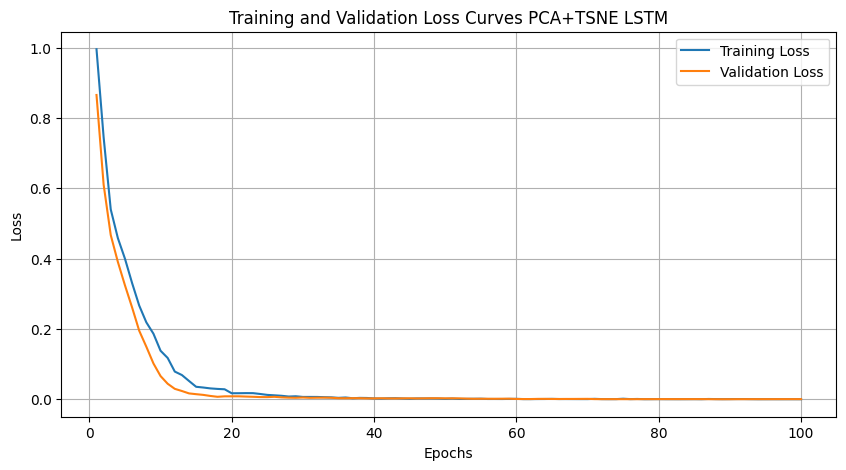

Epoch 1/100
15/15 [==============================] - 4s 57ms/step - loss: 1.0466 - accuracy: 0.5733 - val_loss: 0.9512 - val_accuracy: 0.7699
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.8336 - accuracy: 0.7667 - val_loss: 0.6966 - val_accuracy: 0.7522
Epoch 3/100
15/15 [==============================] - 0s 7ms/step - loss: 0.5927 - accuracy: 0.7711 - val_loss: 0.5230 - val_accuracy: 0.7611
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.4703 - accuracy: 0.8178 - val_loss: 0.4140 - val_accuracy: 0.8142
Epoch 5/100
15/15 [==============================] - 0s 7ms/step - loss: 0.3922 - accuracy: 0.7978 - val_loss: 0.3207 - val_accuracy: 0.9292
Epoch 6/100
15/15 [==============================] - 0s 7ms/step - loss: 0.3198 - accuracy: 0.8578 - val_loss: 0.2489 - val_accuracy: 0.9115
Epoch 7/100
15/15 [==============================] - 0s 7ms/step - loss: 0.2573 - accuracy: 0.8867 - val_loss: 0.1876 - val_accuracy: 0.9735
Epoch 8/100


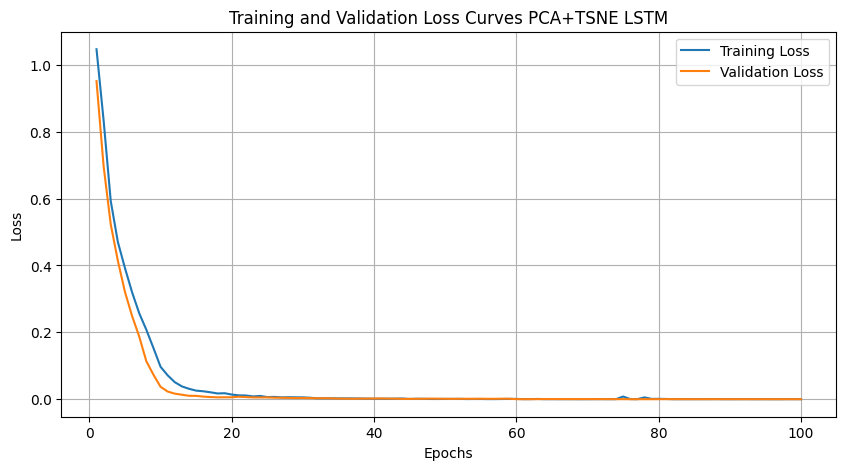

Epoch 1/100
15/15 [==============================] - 4s 57ms/step - loss: 1.0394 - accuracy: 0.6711 - val_loss: 0.9573 - val_accuracy: 0.7611
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.8552 - accuracy: 0.7444 - val_loss: 0.7216 - val_accuracy: 0.7611
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.6182 - accuracy: 0.7511 - val_loss: 0.5306 - val_accuracy: 0.7699
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4881 - accuracy: 0.7622 - val_loss: 0.4141 - val_accuracy: 0.7788
Epoch 5/100
15/15 [==============================] - 0s 7ms/step - loss: 0.4046 - accuracy: 0.7756 - val_loss: 0.3343 - val_accuracy: 0.8230
Epoch 6/100
15/15 [==============================] - 0s 7ms/step - loss: 0.3335 - accuracy: 0.8533 - val_loss: 0.2616 - val_accuracy: 0.8673
Epoch 7/100
15/15 [==============================] - 0s 7ms/step - loss: 0.2777 - accuracy: 0.8822 - val_loss: 0.1893 - val_accuracy: 0.9735
Epoch 8/100


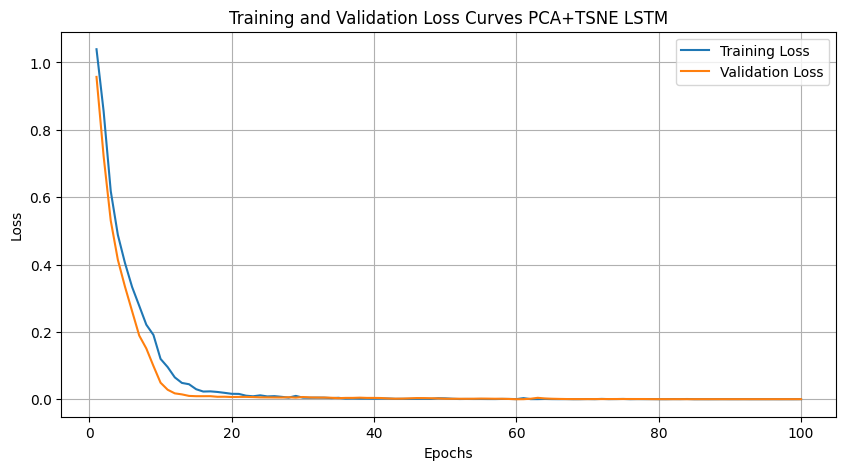

Epoch 1/100
15/15 [==============================] - 4s 57ms/step - loss: 0.9874 - accuracy: 0.7067 - val_loss: 0.8685 - val_accuracy: 0.7522
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.7500 - accuracy: 0.7378 - val_loss: 0.6230 - val_accuracy: 0.7611
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.5497 - accuracy: 0.7511 - val_loss: 0.4917 - val_accuracy: 0.7699
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.4660 - accuracy: 0.7689 - val_loss: 0.4206 - val_accuracy: 0.7788
Epoch 5/100
15/15 [==============================] - 0s 7ms/step - loss: 0.4065 - accuracy: 0.7733 - val_loss: 0.3526 - val_accuracy: 0.7876
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3564 - accuracy: 0.8356 - val_loss: 0.2927 - val_accuracy: 0.8673
Epoch 7/100
15/15 [==============================] - 0s 7ms/step - loss: 0.2982 - accuracy: 0.8600 - val_loss: 0.2316 - val_accuracy: 0.9646
Epoch 8/100


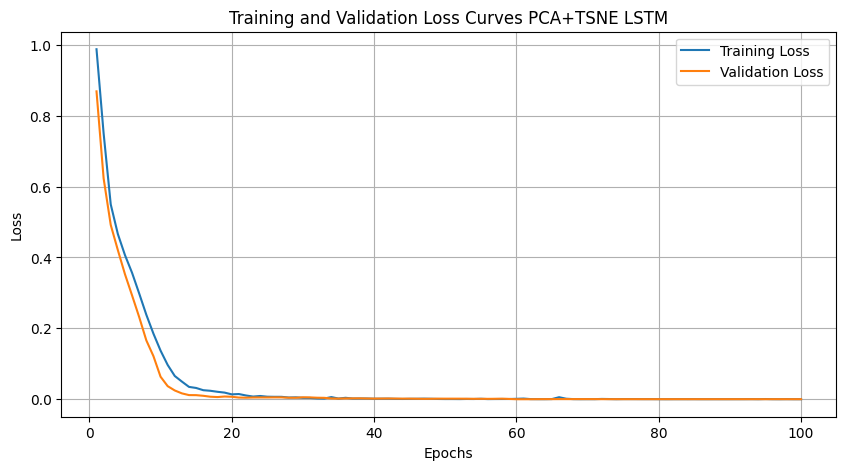

CLR for PCA+TSNE LSTM is: 0.9943262411347519


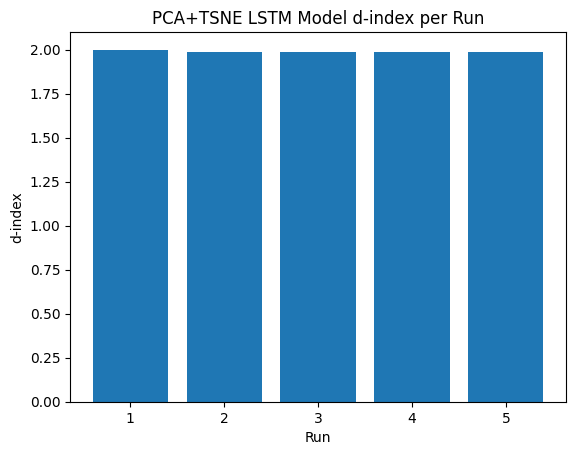

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE GRU

Epoch 1/100
15/15 [==============================] - 2s 25ms/step - loss: 0.9086 - accuracy: 0.6156 - val_loss: 0.6132 - val_accuracy: 0.9823
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4855 - accuracy: 0.9422 - val_loss: 0.3554 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3118 - accuracy: 0.9644 - val_loss: 0.2321 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.2188 - accuracy: 0.9733 - val_loss: 0.1615 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 7ms/step - loss: 0.1650 - accuracy: 0.9778 - val_loss: 0.1176 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 7ms/step - loss: 0.1341 - accuracy: 0.9822 - val_loss: 0.0909 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 7ms/step - loss: 0.1120 - accuracy: 0.9822 - val_loss: 0.0732 - val_accuracy: 1.0000
Epoch 8/100


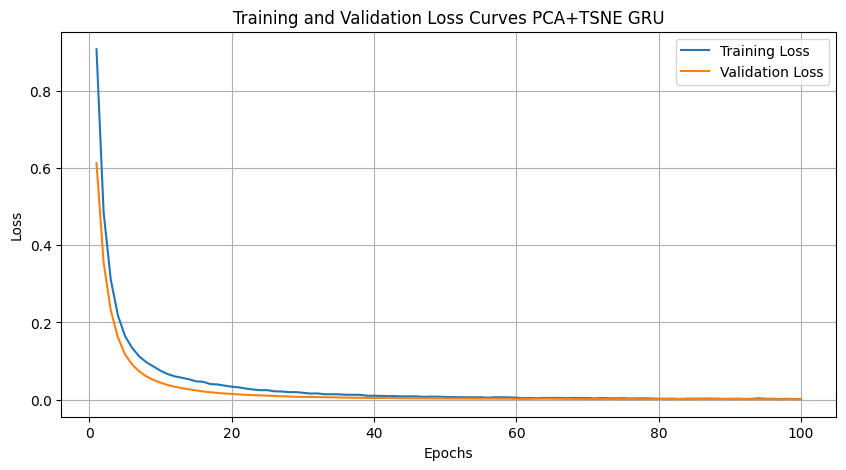

Epoch 1/100
15/15 [==============================] - 2s 24ms/step - loss: 0.7738 - accuracy: 0.7622 - val_loss: 0.5044 - val_accuracy: 0.9735
Epoch 2/100
15/15 [==============================] - 0s 7ms/step - loss: 0.4134 - accuracy: 0.9644 - val_loss: 0.2832 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 7ms/step - loss: 0.2540 - accuracy: 0.9778 - val_loss: 0.1849 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.1830 - accuracy: 0.9778 - val_loss: 0.1316 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1437 - accuracy: 0.9756 - val_loss: 0.0990 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1176 - accuracy: 0.9778 - val_loss: 0.0795 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1009 - accuracy: 0.9822 - val_loss: 0.0663 - val_accuracy: 1.0000
Epoch 8/100


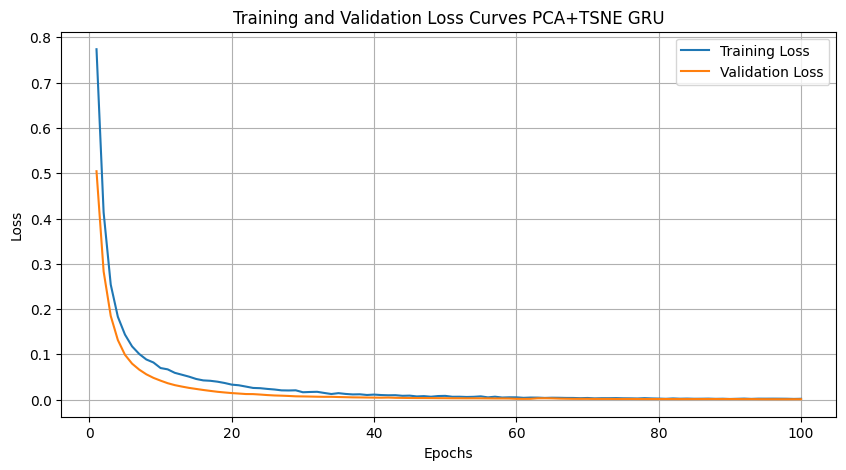

Epoch 1/100
15/15 [==============================] - 2s 25ms/step - loss: 0.9261 - accuracy: 0.6867 - val_loss: 0.6073 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4836 - accuracy: 0.9689 - val_loss: 0.3244 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.2888 - accuracy: 0.9711 - val_loss: 0.1979 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.1959 - accuracy: 0.9778 - val_loss: 0.1354 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1544 - accuracy: 0.9733 - val_loss: 0.0998 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1233 - accuracy: 0.9778 - val_loss: 0.0790 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 7ms/step - loss: 0.1082 - accuracy: 0.9756 - val_loss: 0.0652 - val_accuracy: 1.0000
Epoch 8/100


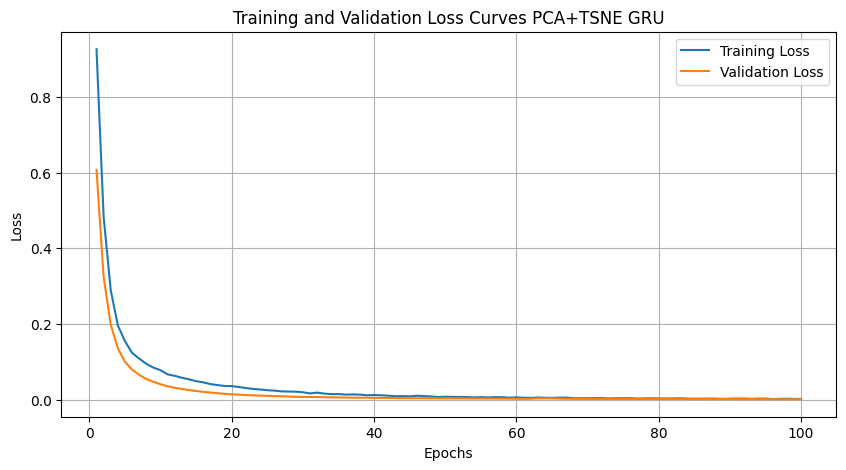

Epoch 1/100
15/15 [==============================] - 2s 24ms/step - loss: 0.7163 - accuracy: 0.7378 - val_loss: 0.4677 - val_accuracy: 0.9646
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3922 - accuracy: 0.9667 - val_loss: 0.2639 - val_accuracy: 0.9823
Epoch 3/100
15/15 [==============================] - 0s 7ms/step - loss: 0.2376 - accuracy: 0.9711 - val_loss: 0.1670 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.1737 - accuracy: 0.9778 - val_loss: 0.1160 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1335 - accuracy: 0.9778 - val_loss: 0.0869 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1094 - accuracy: 0.9756 - val_loss: 0.0696 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 7ms/step - loss: 0.0949 - accuracy: 0.9778 - val_loss: 0.0584 - val_accuracy: 1.0000
Epoch 8/100


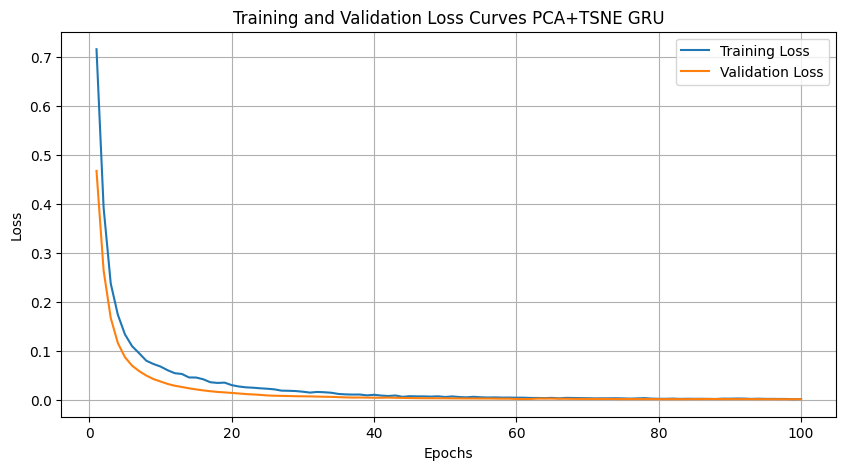

Epoch 1/100
15/15 [==============================] - 3s 26ms/step - loss: 0.9113 - accuracy: 0.6489 - val_loss: 0.6302 - val_accuracy: 0.9027
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4976 - accuracy: 0.9489 - val_loss: 0.3587 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3067 - accuracy: 0.9644 - val_loss: 0.2275 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.2179 - accuracy: 0.9667 - val_loss: 0.1581 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1694 - accuracy: 0.9800 - val_loss: 0.1158 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1366 - accuracy: 0.9800 - val_loss: 0.0906 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1183 - accuracy: 0.9822 - val_loss: 0.0739 - val_accuracy: 1.0000
Epoch 8/100


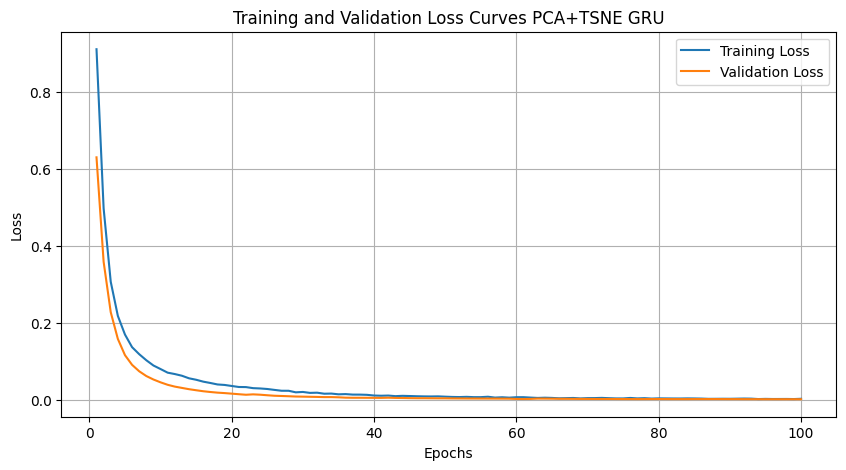

CLR for PCA+TSNE GRU is: 0.9929078014184396


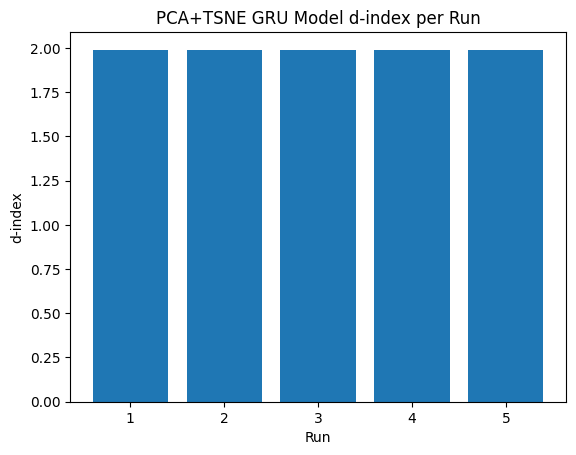

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA+t-SNE')

### PCA+TSNE 7 LAYER DNN

Epoch 1/100
15/15 [==============================] - 2s 17ms/step - loss: 0.7096 - accuracy: 0.7244 - val_loss: 0.2140 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.2017 - accuracy: 0.9333 - val_loss: 0.0302 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 6ms/step - loss: 0.1296 - accuracy: 0.9356 - val_loss: 0.0202 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0720 - accuracy: 0.9689 - val_loss: 0.0077 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0503 - accuracy: 0.9867 - val_loss: 0.0175 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0531 - accuracy: 0.9822 - val_loss: 0.0049 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0433 - accuracy: 0.9778 - val_loss: 0.0043 - val_accuracy: 1.0000
Epoch 8/100


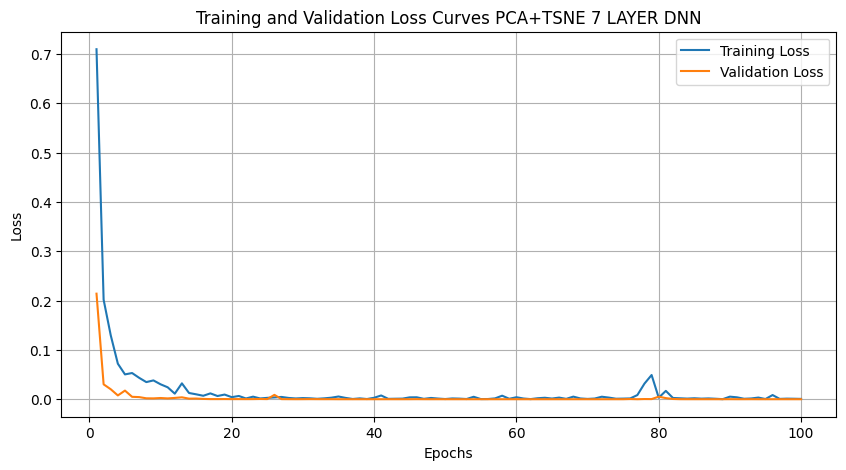

Epoch 1/100
15/15 [==============================] - 2s 17ms/step - loss: 0.6335 - accuracy: 0.8622 - val_loss: 0.1449 - val_accuracy: 0.9912
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.1533 - accuracy: 0.9689 - val_loss: 0.0257 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0900 - accuracy: 0.9644 - val_loss: 0.0247 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0526 - accuracy: 0.9778 - val_loss: 0.0102 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0475 - accuracy: 0.9800 - val_loss: 0.0061 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0417 - accuracy: 0.9800 - val_loss: 0.0113 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.9844 - val_loss: 0.0135 - val_accuracy: 0.9912
Epoch 8/100


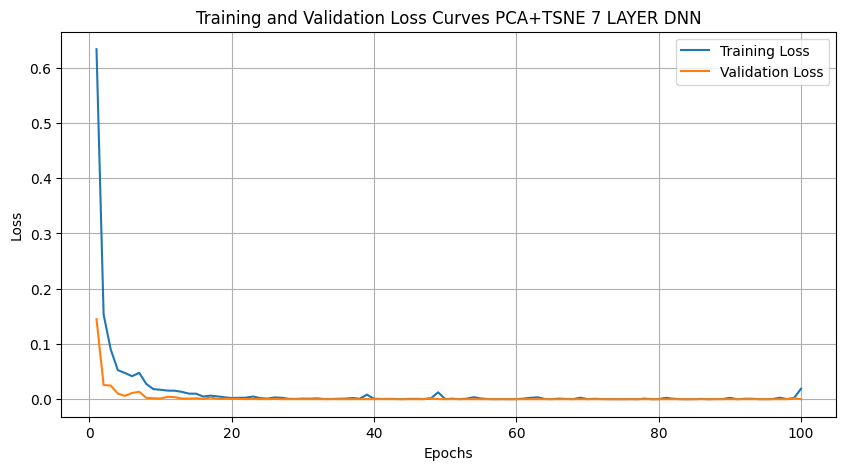

Epoch 1/100
15/15 [==============================] - 2s 17ms/step - loss: 0.5510 - accuracy: 0.7822 - val_loss: 0.2028 - val_accuracy: 0.9735
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.2000 - accuracy: 0.9422 - val_loss: 0.0893 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 6ms/step - loss: 0.1342 - accuracy: 0.9578 - val_loss: 0.0400 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0749 - accuracy: 0.9778 - val_loss: 0.0229 - val_accuracy: 0.9912
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9756 - val_loss: 0.0211 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0803 - accuracy: 0.9733 - val_loss: 0.0132 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0508 - accuracy: 0.9822 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 8/100


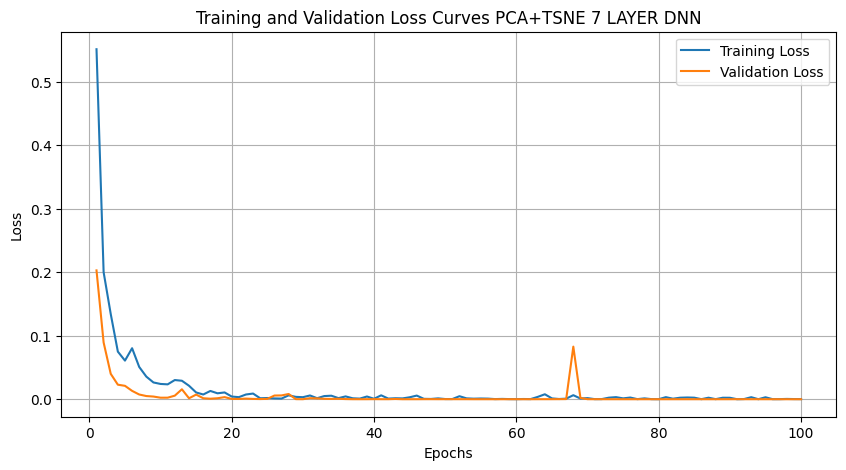

Epoch 1/100
15/15 [==============================] - 2s 16ms/step - loss: 0.5106 - accuracy: 0.8622 - val_loss: 0.1378 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1538 - accuracy: 0.9600 - val_loss: 0.0312 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0868 - accuracy: 0.9711 - val_loss: 0.0193 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0714 - accuracy: 0.9711 - val_loss: 0.0105 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0565 - accuracy: 0.9800 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 0.9867 - val_loss: 0.0066 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0271 - accuracy: 0.9911 - val_loss: 0.0042 - val_accuracy: 1.0000
Epoch 8/100


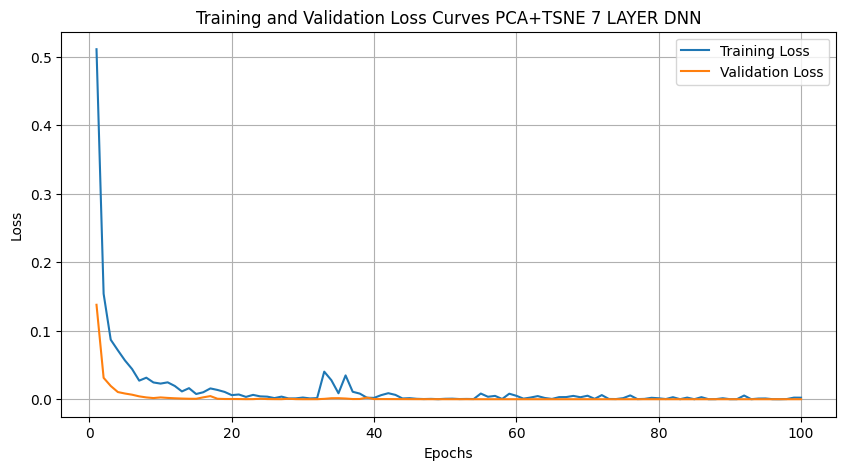

Epoch 1/100
15/15 [==============================] - 2s 17ms/step - loss: 0.6349 - accuracy: 0.7667 - val_loss: 0.1731 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.1410 - accuracy: 0.9622 - val_loss: 0.0313 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 7ms/step - loss: 0.0802 - accuracy: 0.9689 - val_loss: 0.0199 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0688 - accuracy: 0.9689 - val_loss: 0.0107 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0470 - accuracy: 0.9778 - val_loss: 0.0115 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0435 - accuracy: 0.9822 - val_loss: 0.0052 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.9867 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 8/100


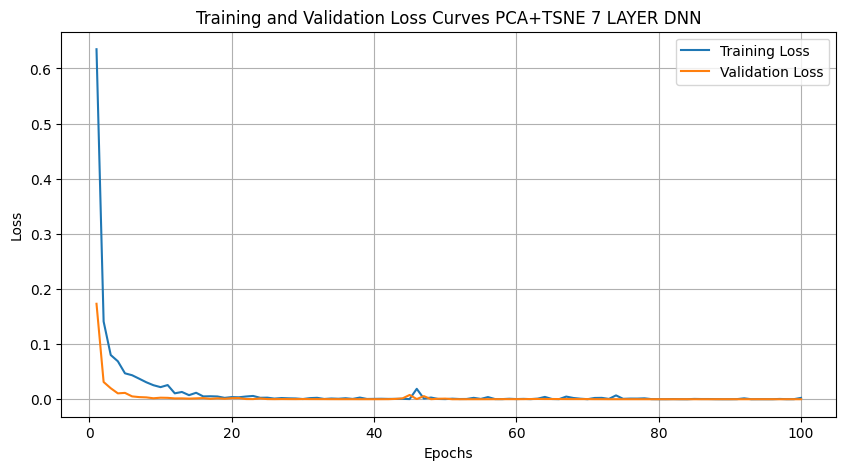

CLR for PCA+TSNE 7 LAYER DNN is: 0.9971631205673759


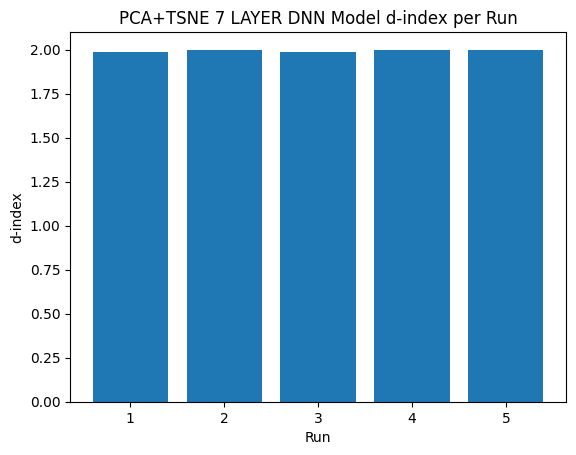

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER CNN

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 1.2552 - accuracy: 0.4244 - val_loss: 0.5761 - val_accuracy: 0.8761
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3856 - accuracy: 0.9311 - val_loss: 0.1943 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1867 - accuracy: 0.9711 - val_loss: 0.1053 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1228 - accuracy: 0.9800 - val_loss: 0.0690 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0933 - accuracy: 0.9778 - val_loss: 0.0513 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0784 - accuracy: 0.9800 - val_loss: 0.0416 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0686 - accuracy: 0.9800 - val_loss: 0.0353 - val_accuracy: 1.0000
Epoch 8/100


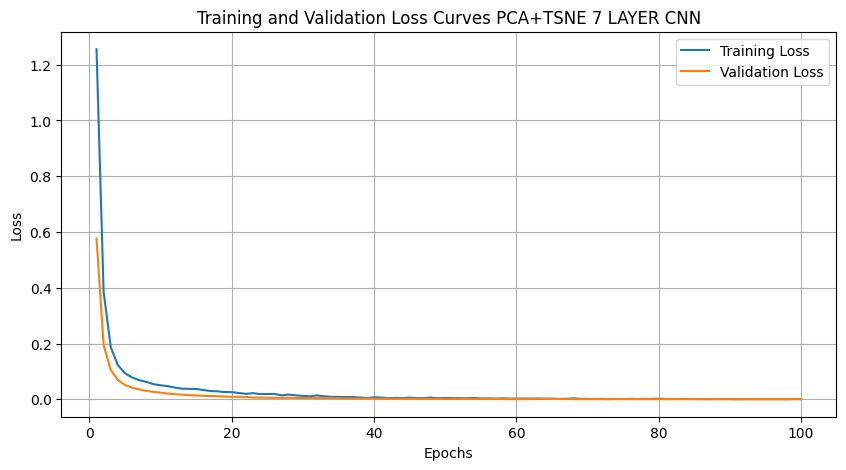

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 0.7232 - accuracy: 0.7244 - val_loss: 0.3999 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3217 - accuracy: 0.9667 - val_loss: 0.1799 - val_accuracy: 1.0000
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1767 - accuracy: 0.9756 - val_loss: 0.1006 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1224 - accuracy: 0.9733 - val_loss: 0.0657 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0972 - accuracy: 0.9756 - val_loss: 0.0478 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0814 - accuracy: 0.9778 - val_loss: 0.0363 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 0.9844 - val_loss: 0.0293 - val_accuracy: 1.0000
Epoch 8/100


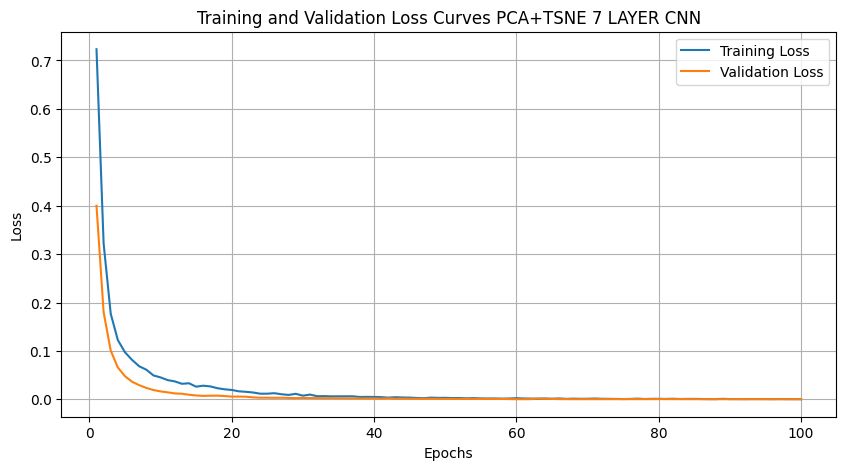

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 0.8848 - accuracy: 0.5800 - val_loss: 0.4439 - val_accuracy: 0.9558
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3507 - accuracy: 0.9422 - val_loss: 0.2096 - val_accuracy: 0.9735
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1989 - accuracy: 0.9689 - val_loss: 0.1244 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1358 - accuracy: 0.9756 - val_loss: 0.0842 - val_accuracy: 0.9912
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1051 - accuracy: 0.9756 - val_loss: 0.0612 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0847 - accuracy: 0.9800 - val_loss: 0.0480 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0730 - accuracy: 0.9800 - val_loss: 0.0395 - val_accuracy: 1.0000
Epoch 8/100


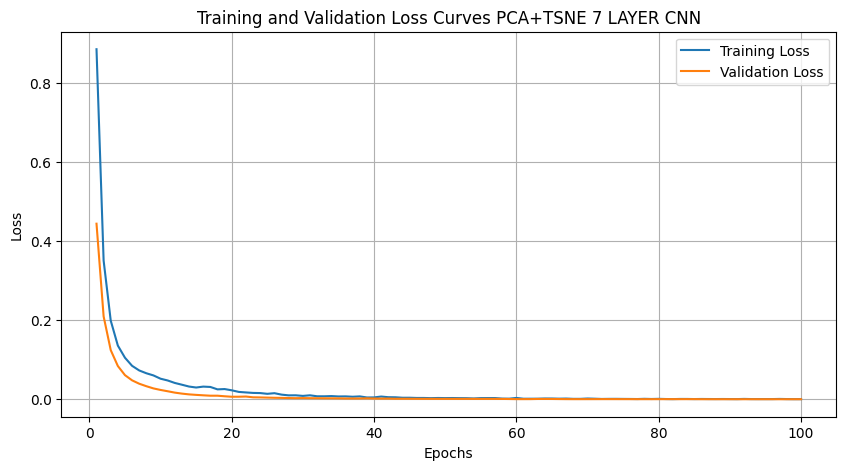

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 0.7801 - accuracy: 0.7289 - val_loss: 0.4121 - val_accuracy: 0.9646
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3380 - accuracy: 0.9578 - val_loss: 0.1974 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 6ms/step - loss: 0.2017 - accuracy: 0.9667 - val_loss: 0.1149 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1355 - accuracy: 0.9733 - val_loss: 0.0748 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1033 - accuracy: 0.9778 - val_loss: 0.0534 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0806 - accuracy: 0.9822 - val_loss: 0.0415 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0699 - accuracy: 0.9822 - val_loss: 0.0347 - val_accuracy: 1.0000
Epoch 8/100


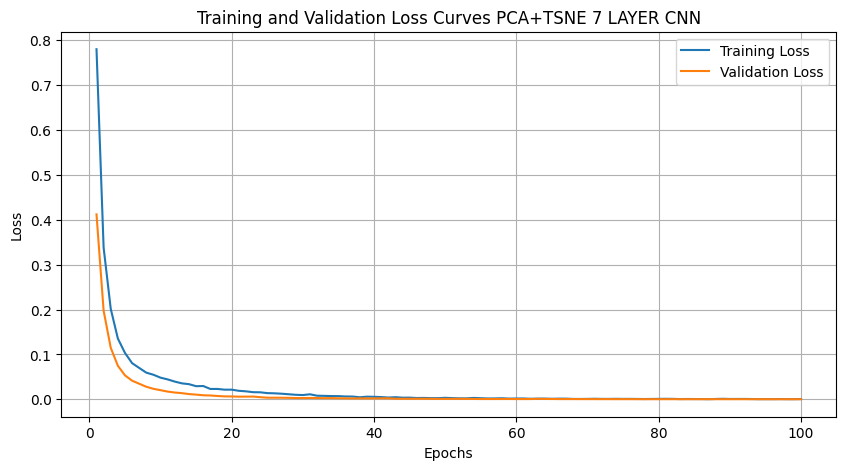

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 0.9176 - accuracy: 0.5800 - val_loss: 0.4880 - val_accuracy: 0.9646
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3762 - accuracy: 0.9578 - val_loss: 0.2102 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1925 - accuracy: 0.9711 - val_loss: 0.1131 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1256 - accuracy: 0.9733 - val_loss: 0.0706 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0948 - accuracy: 0.9756 - val_loss: 0.0504 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0757 - accuracy: 0.9778 - val_loss: 0.0394 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0656 - accuracy: 0.9822 - val_loss: 0.0325 - val_accuracy: 1.0000
Epoch 8/100


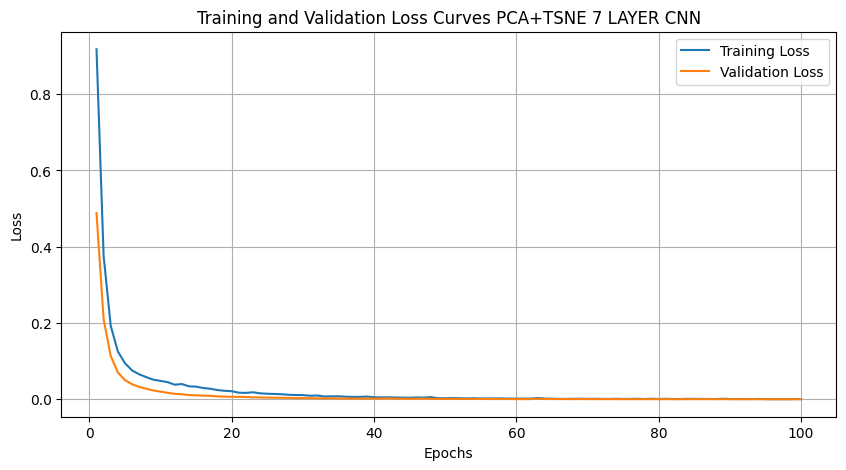

CLR for PCA+TSNE 7 LAYER CNN is: 0.9929078014184396


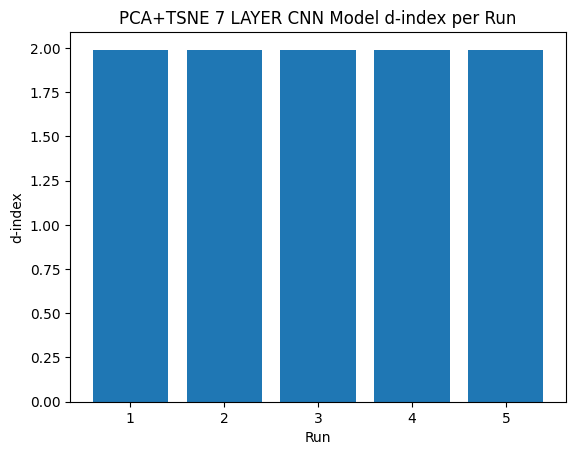

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER LSTM

Epoch 1/100
15/15 [==============================] - 6s 81ms/step - loss: 1.0580 - accuracy: 0.6422 - val_loss: 0.9810 - val_accuracy: 0.7080
Epoch 2/100
15/15 [==============================] - 0s 9ms/step - loss: 0.8481 - accuracy: 0.7400 - val_loss: 0.7003 - val_accuracy: 0.6814
Epoch 3/100
15/15 [==============================] - 0s 9ms/step - loss: 0.6011 - accuracy: 0.7356 - val_loss: 0.5160 - val_accuracy: 0.7699
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4944 - accuracy: 0.7511 - val_loss: 0.4074 - val_accuracy: 0.7788
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4133 - accuracy: 0.7667 - val_loss: 0.3645 - val_accuracy: 0.8938
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3766 - accuracy: 0.8267 - val_loss: 0.3099 - val_accuracy: 0.8053
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3135 - accuracy: 0.8378 - val_loss: 0.2657 - val_accuracy: 0.8673
Epoch 8/100


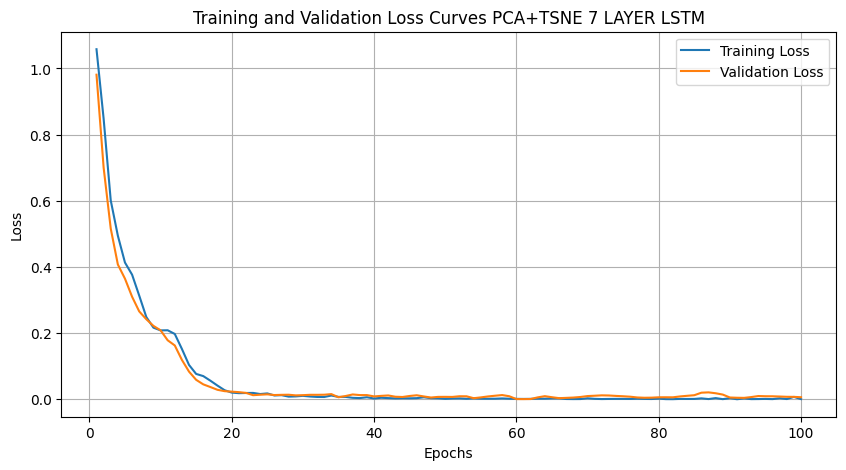

Epoch 1/100
15/15 [==============================] - 7s 80ms/step - loss: 1.0384 - accuracy: 0.6289 - val_loss: 0.9247 - val_accuracy: 0.7699
Epoch 2/100
15/15 [==============================] - 0s 9ms/step - loss: 0.8144 - accuracy: 0.7000 - val_loss: 0.6521 - val_accuracy: 0.7699
Epoch 3/100
15/15 [==============================] - 0s 9ms/step - loss: 0.5751 - accuracy: 0.7289 - val_loss: 0.4754 - val_accuracy: 0.7788
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4614 - accuracy: 0.7511 - val_loss: 0.3934 - val_accuracy: 0.7965
Epoch 5/100
15/15 [==============================] - 0s 9ms/step - loss: 0.3933 - accuracy: 0.7800 - val_loss: 0.3319 - val_accuracy: 0.7965
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3217 - accuracy: 0.8756 - val_loss: 0.2944 - val_accuracy: 0.9204
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.2793 - accuracy: 0.8889 - val_loss: 0.2359 - val_accuracy: 0.8938
Epoch 8/100


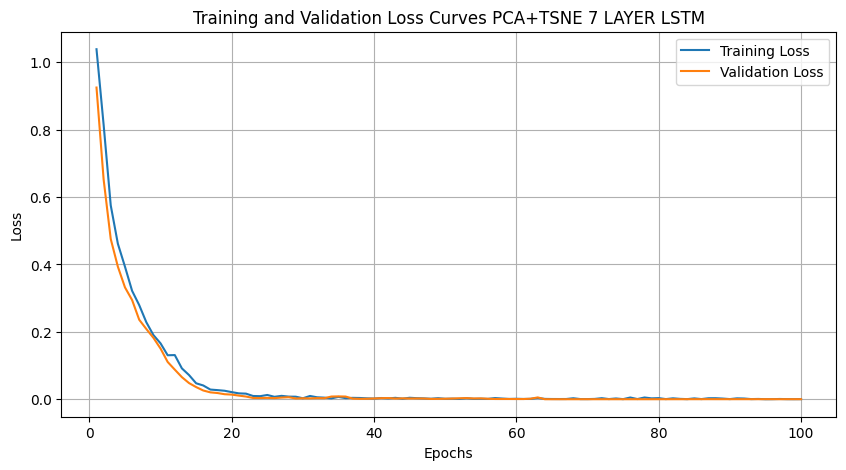

Epoch 1/100
15/15 [==============================] - 6s 76ms/step - loss: 1.0292 - accuracy: 0.6978 - val_loss: 0.8997 - val_accuracy: 0.7699
Epoch 2/100
15/15 [==============================] - 0s 9ms/step - loss: 0.7483 - accuracy: 0.7422 - val_loss: 0.5856 - val_accuracy: 0.7611
Epoch 3/100
15/15 [==============================] - 0s 9ms/step - loss: 0.5336 - accuracy: 0.7511 - val_loss: 0.4204 - val_accuracy: 0.7965
Epoch 4/100
15/15 [==============================] - 0s 9ms/step - loss: 0.4185 - accuracy: 0.7622 - val_loss: 0.3617 - val_accuracy: 0.7876
Epoch 5/100
15/15 [==============================] - 0s 9ms/step - loss: 0.3564 - accuracy: 0.7733 - val_loss: 0.3020 - val_accuracy: 0.7965
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.2982 - accuracy: 0.8400 - val_loss: 0.2710 - val_accuracy: 0.8761
Epoch 7/100
15/15 [==============================] - 0s 9ms/step - loss: 0.2695 - accuracy: 0.8844 - val_loss: 0.2467 - val_accuracy: 0.8938
Epoch 8/100


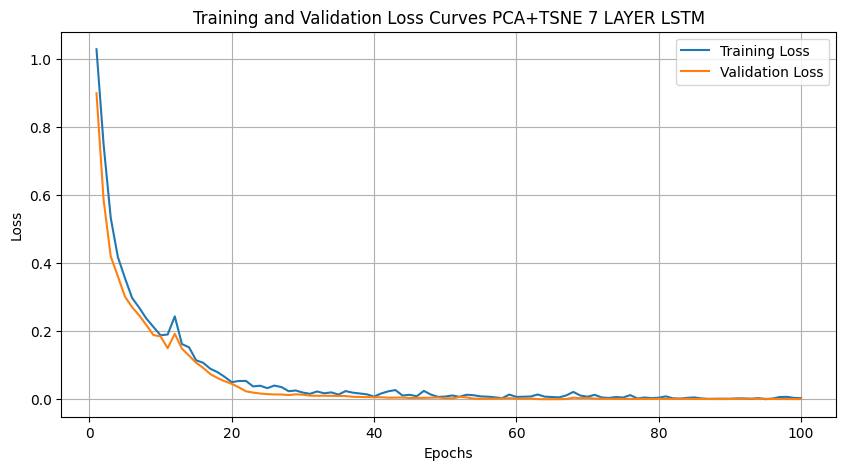

Epoch 1/100
15/15 [==============================] - 6s 78ms/step - loss: 1.0231 - accuracy: 0.5178 - val_loss: 0.9244 - val_accuracy: 0.6460
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.7830 - accuracy: 0.7022 - val_loss: 0.7271 - val_accuracy: 0.6283
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.6453 - accuracy: 0.7422 - val_loss: 0.5823 - val_accuracy: 0.7257
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.5328 - accuracy: 0.7867 - val_loss: 0.4765 - val_accuracy: 0.7876
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4570 - accuracy: 0.7667 - val_loss: 0.4049 - val_accuracy: 0.7965
Epoch 6/100
15/15 [==============================] - 0s 9ms/step - loss: 0.3814 - accuracy: 0.8333 - val_loss: 0.3377 - val_accuracy: 0.8142
Epoch 7/100
15/15 [==============================] - 0s 9ms/step - loss: 0.3345 - accuracy: 0.8511 - val_loss: 0.2809 - val_accuracy: 0.9292
Epoch 8/100


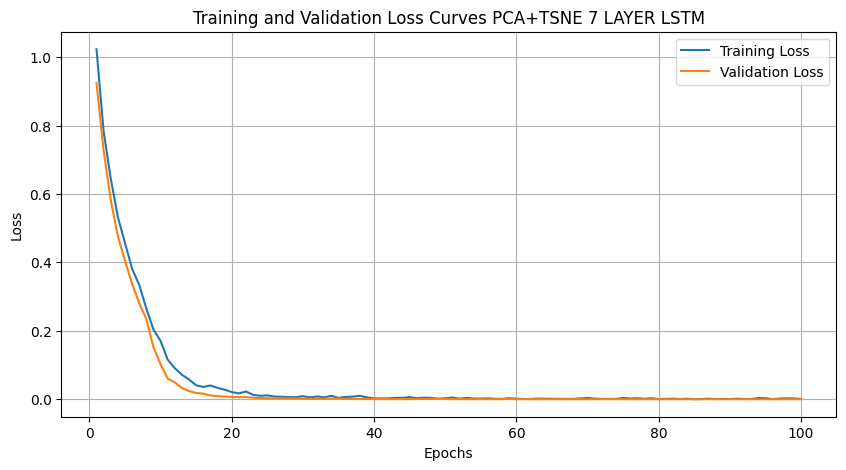

Epoch 1/100
15/15 [==============================] - 6s 77ms/step - loss: 1.0375 - accuracy: 0.6600 - val_loss: 0.9340 - val_accuracy: 0.6814
Epoch 2/100
15/15 [==============================] - 0s 9ms/step - loss: 0.7795 - accuracy: 0.6889 - val_loss: 0.7038 - val_accuracy: 0.7257
Epoch 3/100
15/15 [==============================] - 0s 9ms/step - loss: 0.6210 - accuracy: 0.7200 - val_loss: 0.5417 - val_accuracy: 0.7788
Epoch 4/100
15/15 [==============================] - 0s 9ms/step - loss: 0.5159 - accuracy: 0.7511 - val_loss: 0.4350 - val_accuracy: 0.7876
Epoch 5/100
15/15 [==============================] - 0s 9ms/step - loss: 0.4337 - accuracy: 0.7689 - val_loss: 0.3630 - val_accuracy: 0.7965
Epoch 6/100
15/15 [==============================] - 0s 9ms/step - loss: 0.3814 - accuracy: 0.8244 - val_loss: 0.3312 - val_accuracy: 0.8850
Epoch 7/100
15/15 [==============================] - 0s 9ms/step - loss: 0.3208 - accuracy: 0.8578 - val_loss: 0.2607 - val_accuracy: 0.9204
Epoch 8/100


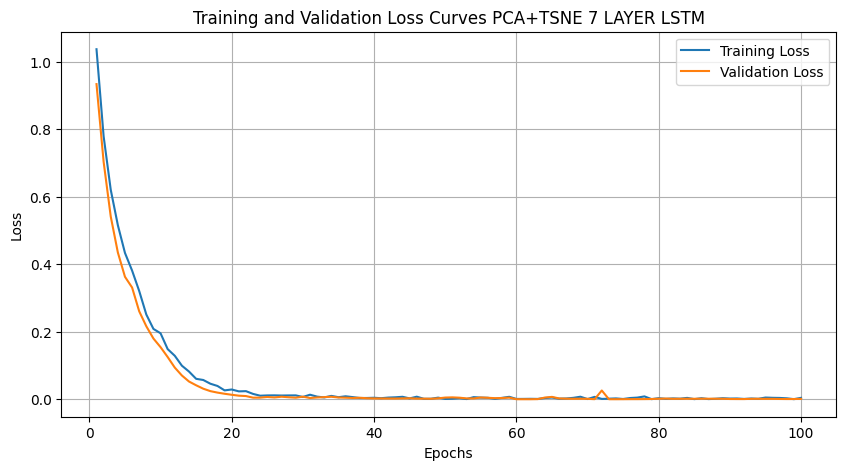

CLR for PCA+TSNE 7 LAYER LSTM is: 0.9929078014184396


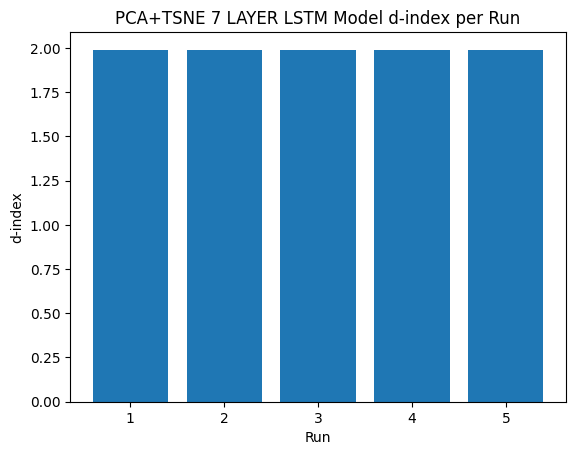

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA+TSNE 7 LAYER GRU

Epoch 1/100
15/15 [==============================] - 6s 70ms/step - loss: 0.9002 - accuracy: 0.8533 - val_loss: 0.6470 - val_accuracy: 0.9912
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4481 - accuracy: 0.9556 - val_loss: 0.2121 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1582 - accuracy: 0.9733 - val_loss: 0.0523 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0680 - accuracy: 0.9800 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0393 - accuracy: 0.9889 - val_loss: 0.0094 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0251 - accuracy: 0.9933 - val_loss: 0.0066 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0164 - accuracy: 0.9978 - val_loss: 0.0046 - val_accuracy: 1.0000
Epoch 8/100


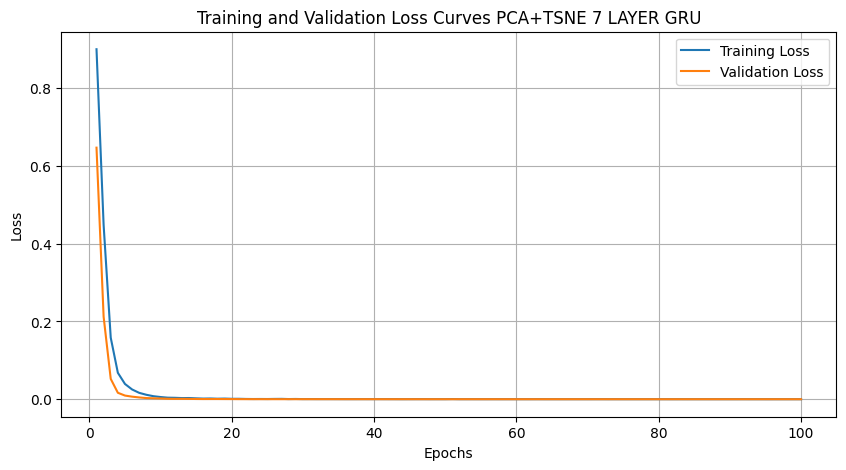

Epoch 1/100
15/15 [==============================] - 5s 70ms/step - loss: 1.0047 - accuracy: 0.7378 - val_loss: 0.8098 - val_accuracy: 0.8761
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.5998 - accuracy: 0.9356 - val_loss: 0.3224 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.2229 - accuracy: 0.9644 - val_loss: 0.0785 - val_accuracy: 0.9912
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0894 - accuracy: 0.9756 - val_loss: 0.0221 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0470 - accuracy: 0.9844 - val_loss: 0.0113 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 9ms/step - loss: 0.0317 - accuracy: 0.9933 - val_loss: 0.0091 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 9ms/step - loss: 0.0195 - accuracy: 0.9933 - val_loss: 0.0058 - val_accuracy: 1.0000
Epoch 8/100


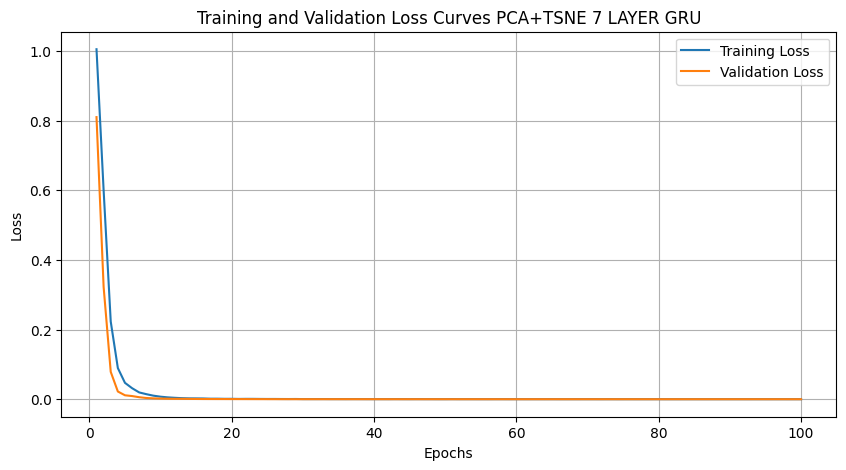

Epoch 1/100
15/15 [==============================] - 6s 70ms/step - loss: 0.9453 - accuracy: 0.7511 - val_loss: 0.6741 - val_accuracy: 0.9646
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.5284 - accuracy: 0.9578 - val_loss: 0.2922 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.2214 - accuracy: 0.9711 - val_loss: 0.0782 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0833 - accuracy: 0.9800 - val_loss: 0.0202 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0451 - accuracy: 0.9844 - val_loss: 0.0096 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0273 - accuracy: 0.9933 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0183 - accuracy: 0.9978 - val_loss: 0.0045 - val_accuracy: 1.0000
Epoch 8/100


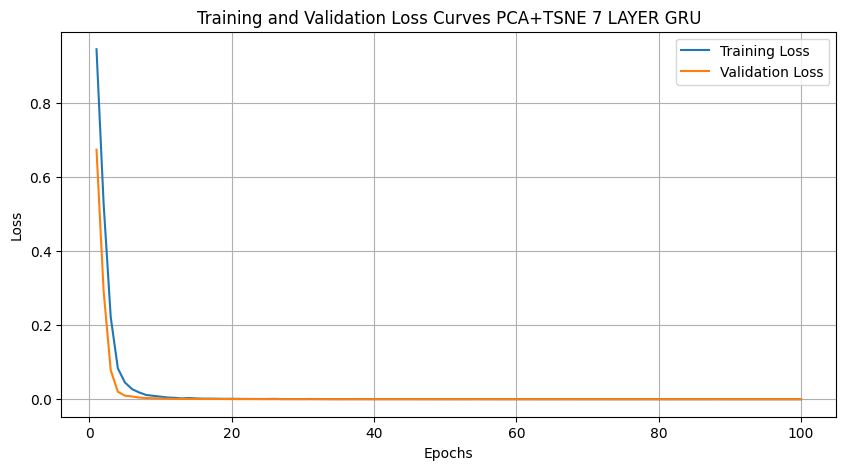

Epoch 1/100
15/15 [==============================] - 5s 68ms/step - loss: 0.9408 - accuracy: 0.8689 - val_loss: 0.6841 - val_accuracy: 1.0000
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.4924 - accuracy: 0.9689 - val_loss: 0.2274 - val_accuracy: 0.9912
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1706 - accuracy: 0.9711 - val_loss: 0.0544 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0775 - accuracy: 0.9822 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0409 - accuracy: 0.9889 - val_loss: 0.0085 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0258 - accuracy: 0.9933 - val_loss: 0.0075 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0166 - accuracy: 1.0000 - val_loss: 0.0047 - val_accuracy: 1.0000
Epoch 8/100


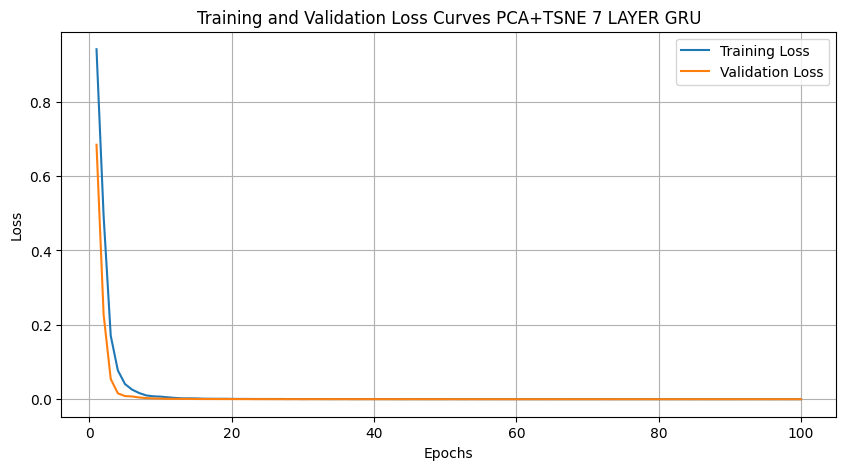

Epoch 1/100
15/15 [==============================] - 7s 74ms/step - loss: 0.8649 - accuracy: 0.9222 - val_loss: 0.5445 - val_accuracy: 0.9823
Epoch 2/100
15/15 [==============================] - 0s 8ms/step - loss: 0.3679 - accuracy: 0.9667 - val_loss: 0.1610 - val_accuracy: 0.9823
Epoch 3/100
15/15 [==============================] - 0s 8ms/step - loss: 0.1403 - accuracy: 0.9711 - val_loss: 0.0492 - val_accuracy: 1.0000
Epoch 4/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0667 - accuracy: 0.9778 - val_loss: 0.0164 - val_accuracy: 1.0000
Epoch 5/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0350 - accuracy: 0.9933 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 6/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0257 - accuracy: 0.9933 - val_loss: 0.0055 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 8ms/step - loss: 0.0147 - accuracy: 0.9978 - val_loss: 0.0042 - val_accuracy: 1.0000
Epoch 8/100


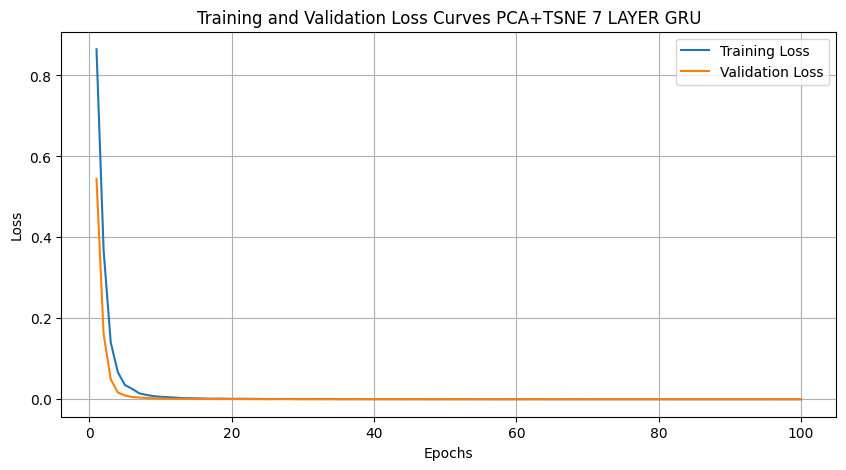

CLR for PCA+TSNE 7 LAYER GRU is: 0.9985815602836879


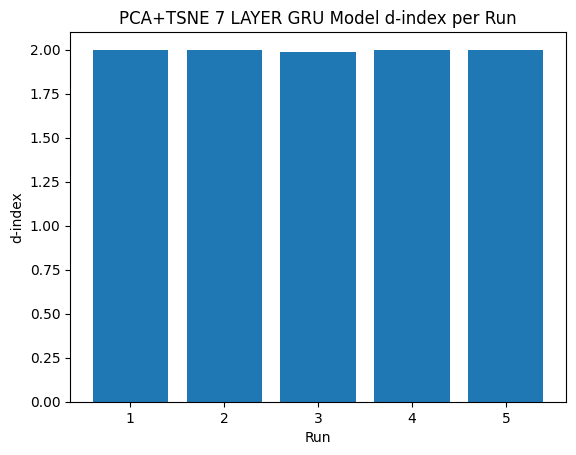

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA+t-SNE', use_seven_layer=True)

### PCA preprocessing DNN

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 1.6601 - accuracy: 0.4844 - val_loss: 0.7851 - val_accuracy: 0.7788
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.7324 - accuracy: 0.7311 - val_loss: 0.5475 - val_accuracy: 0.8584
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.5258 - accuracy: 0.8378 - val_loss: 0.4677 - val_accuracy: 0.9027
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3849 - accuracy: 0.8533 - val_loss: 0.3587 - val_accuracy: 0.9292
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3639 - accuracy: 0.8911 - val_loss: 0.3057 - val_accuracy: 0.9381
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2363 - accuracy: 0.9222 - val_loss: 0.2959 - val_accuracy: 0.9381
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1690 - accuracy: 0.9556 - val_loss: 0.3048 - val_accuracy: 0.9381
Epoch 8/100


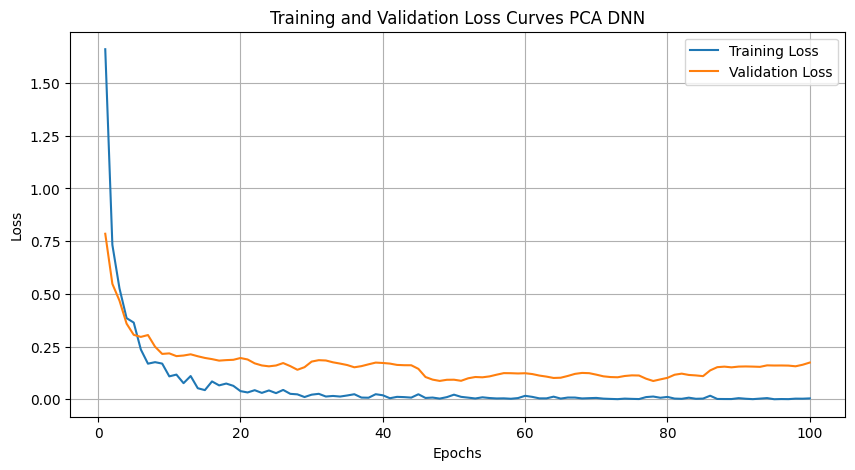

Epoch 1/100
15/15 [==============================] - 1s 16ms/step - loss: 3.3257 - accuracy: 0.3844 - val_loss: 0.7094 - val_accuracy: 0.7345
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 1.3707 - accuracy: 0.6178 - val_loss: 0.3803 - val_accuracy: 0.8407
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.8463 - accuracy: 0.7578 - val_loss: 0.2564 - val_accuracy: 0.9381
Epoch 4/100
15/15 [==============================] - 0s 6ms/step - loss: 0.5929 - accuracy: 0.8044 - val_loss: 0.2028 - val_accuracy: 0.9469
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.4334 - accuracy: 0.8489 - val_loss: 0.1592 - val_accuracy: 0.9646
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3311 - accuracy: 0.8822 - val_loss: 0.1283 - val_accuracy: 0.9735
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2555 - accuracy: 0.8800 - val_loss: 0.1221 - val_accuracy: 0.9823
Epoch 8/100


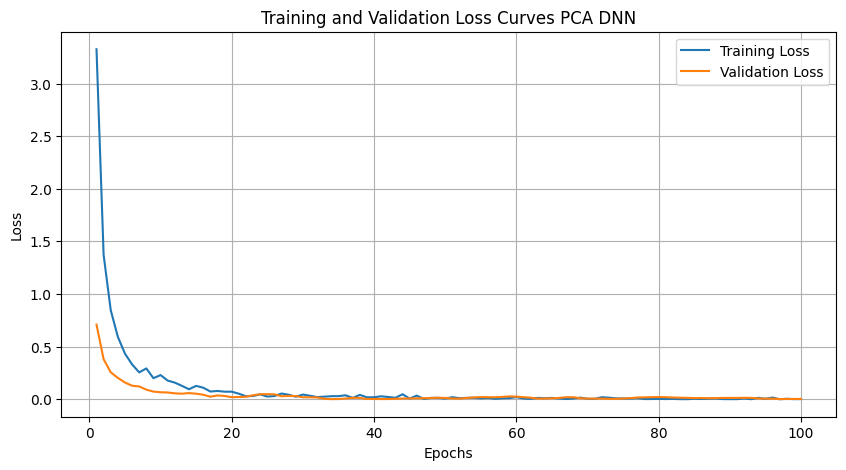

Epoch 1/100
15/15 [==============================] - 1s 16ms/step - loss: 1.8885 - accuracy: 0.5689 - val_loss: 0.8245 - val_accuracy: 0.7522
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.9394 - accuracy: 0.6844 - val_loss: 0.4255 - val_accuracy: 0.8496
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.5363 - accuracy: 0.8244 - val_loss: 0.2599 - val_accuracy: 0.9115
Epoch 4/100
15/15 [==============================] - 0s 7ms/step - loss: 0.4060 - accuracy: 0.8644 - val_loss: 0.1878 - val_accuracy: 0.9469
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 0.3037 - accuracy: 0.8933 - val_loss: 0.1142 - val_accuracy: 0.9646
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.2392 - accuracy: 0.9067 - val_loss: 0.0803 - val_accuracy: 0.9823
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.1592 - accuracy: 0.9556 - val_loss: 0.0582 - val_accuracy: 0.9823
Epoch 8/100


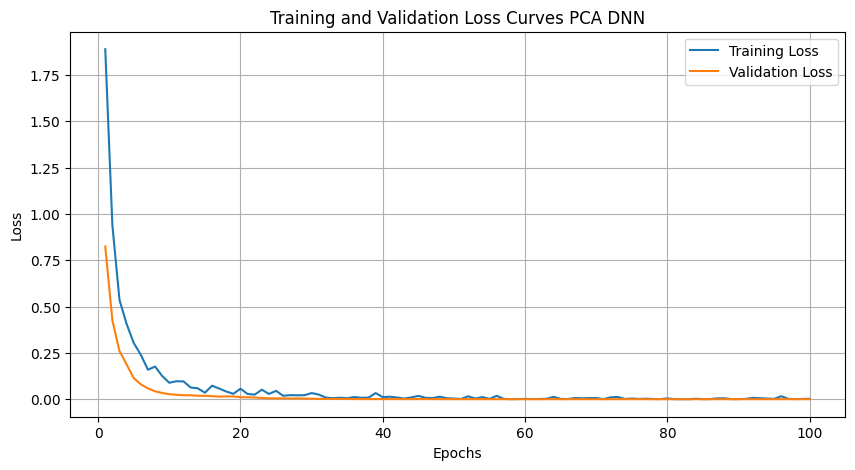

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 1.8173 - accuracy: 0.5111 - val_loss: 0.4424 - val_accuracy: 0.8673
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.7639 - accuracy: 0.7689 - val_loss: 0.2241 - val_accuracy: 0.9115
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.4955 - accuracy: 0.8622 - val_loss: 0.1573 - val_accuracy: 0.9381
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3620 - accuracy: 0.8889 - val_loss: 0.1418 - val_accuracy: 0.9381
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3153 - accuracy: 0.8844 - val_loss: 0.1056 - val_accuracy: 0.9558
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2659 - accuracy: 0.9200 - val_loss: 0.0720 - val_accuracy: 0.9823
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2384 - accuracy: 0.9133 - val_loss: 0.0507 - val_accuracy: 0.9823
Epoch 8/100


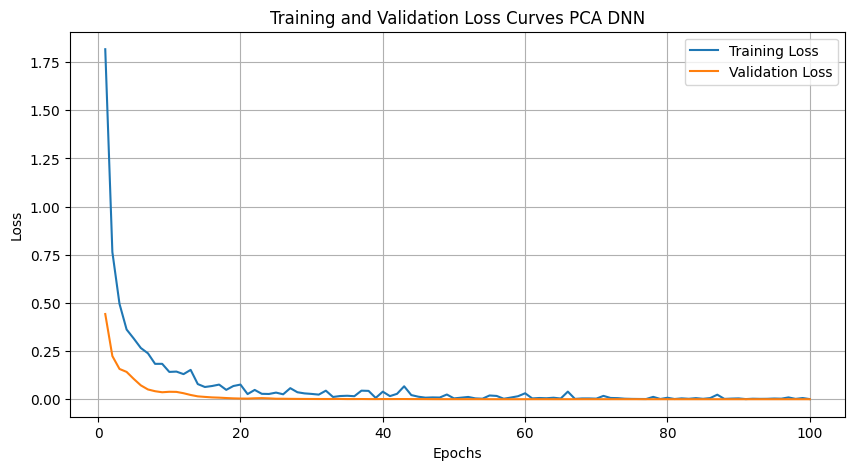

Epoch 1/100
15/15 [==============================] - 1s 15ms/step - loss: 2.7701 - accuracy: 0.4467 - val_loss: 1.0674 - val_accuracy: 0.6637
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 1.0492 - accuracy: 0.6467 - val_loss: 0.6488 - val_accuracy: 0.7965
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.6167 - accuracy: 0.8044 - val_loss: 0.4538 - val_accuracy: 0.9115
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.3487 - accuracy: 0.8711 - val_loss: 0.3558 - val_accuracy: 0.9204
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.4196 - accuracy: 0.8689 - val_loss: 0.2993 - val_accuracy: 0.9381
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2526 - accuracy: 0.9222 - val_loss: 0.2745 - val_accuracy: 0.9381
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2773 - accuracy: 0.9089 - val_loss: 0.2558 - val_accuracy: 0.9381
Epoch 8/100


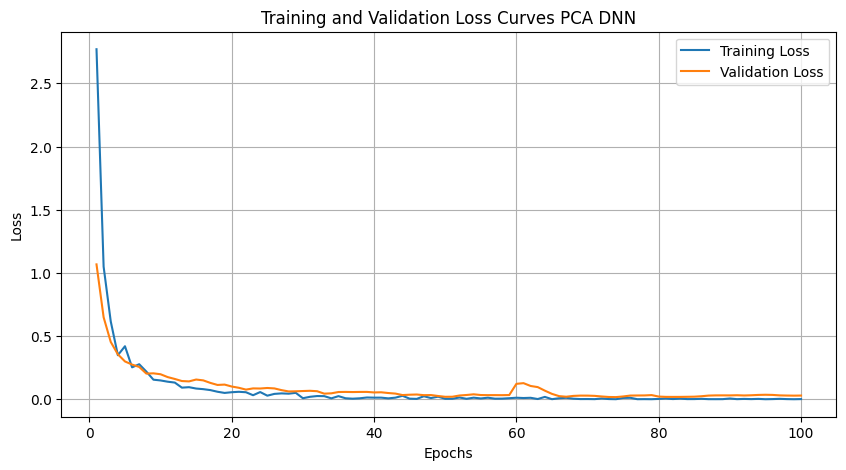

CLR for PCA DNN is: 0.9914893617021276


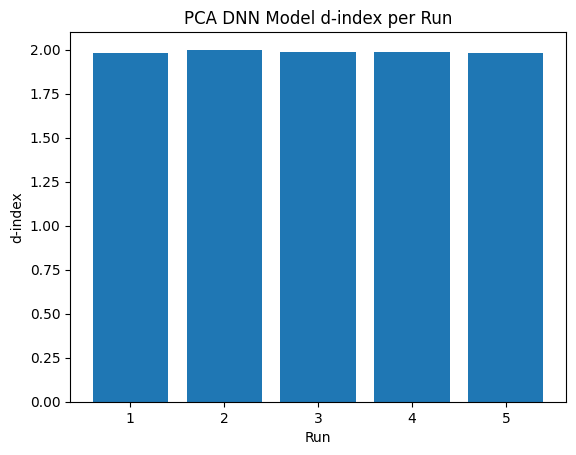

In [ ]:
run_single_model_combinations('DNN', X_train, X_test, y_train, y_test, method='PCA')

### PCA preprocessing CNN

Epoch 1/100
15/15 [==============================] - 1s 21ms/step - loss: 1.2725 - accuracy: 0.5178 - val_loss: 0.6626 - val_accuracy: 0.7699
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.5315 - accuracy: 0.8111 - val_loss: 0.3615 - val_accuracy: 0.9115
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2424 - accuracy: 0.9356 - val_loss: 0.2323 - val_accuracy: 0.9469
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1398 - accuracy: 0.9778 - val_loss: 0.1594 - val_accuracy: 0.9646
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0827 - accuracy: 0.9889 - val_loss: 0.1310 - val_accuracy: 0.9735
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0592 - accuracy: 0.9956 - val_loss: 0.0946 - val_accuracy: 0.9823
Epoch 7/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 1.0000 - val_loss: 0.0929 - val_accuracy: 0.9735
Epoch 8/100


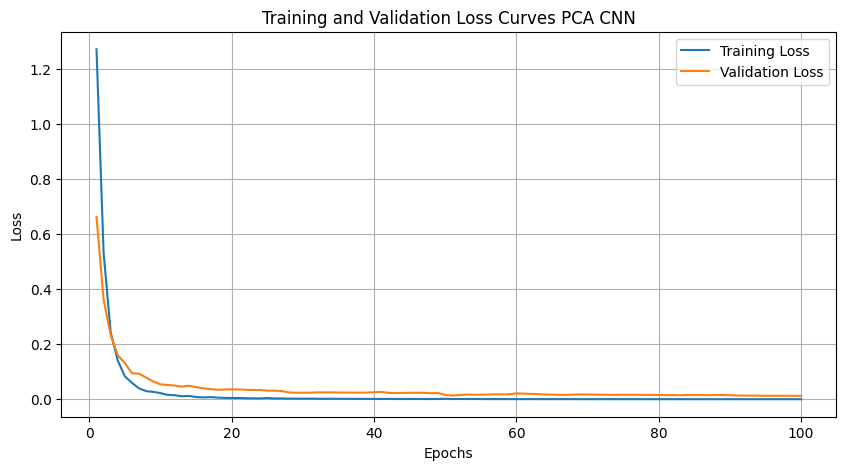

Epoch 1/100
15/15 [==============================] - 1s 16ms/step - loss: 1.5922 - accuracy: 0.3822 - val_loss: 0.7701 - val_accuracy: 0.6991
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.5562 - accuracy: 0.7978 - val_loss: 0.4000 - val_accuracy: 0.8584
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2766 - accuracy: 0.9267 - val_loss: 0.2418 - val_accuracy: 0.9646
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1698 - accuracy: 0.9644 - val_loss: 0.1681 - val_accuracy: 0.9735
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1025 - accuracy: 0.9867 - val_loss: 0.1217 - val_accuracy: 0.9912
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0697 - accuracy: 0.9956 - val_loss: 0.0942 - val_accuracy: 1.0000
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0507 - accuracy: 1.0000 - val_loss: 0.0768 - val_accuracy: 1.0000
Epoch 8/100


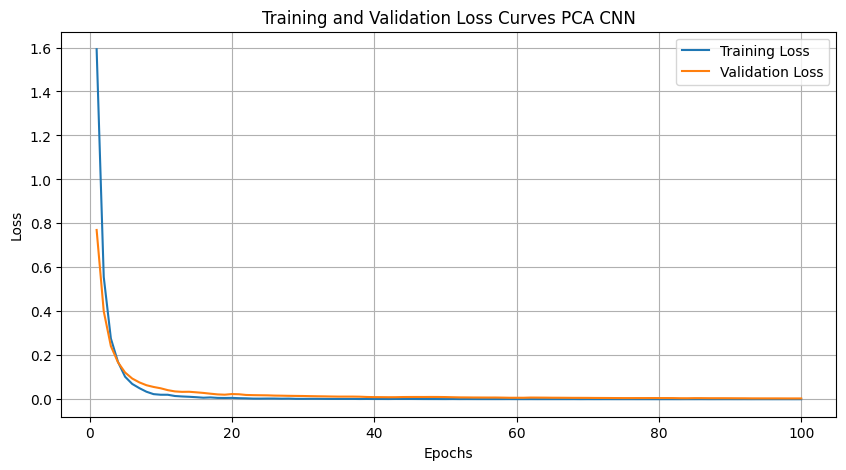

Epoch 1/100
15/15 [==============================] - 1s 16ms/step - loss: 1.2879 - accuracy: 0.4133 - val_loss: 0.7994 - val_accuracy: 0.6637
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.5467 - accuracy: 0.8022 - val_loss: 0.4320 - val_accuracy: 0.9115
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2995 - accuracy: 0.9267 - val_loss: 0.2535 - val_accuracy: 0.9469
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1525 - accuracy: 0.9733 - val_loss: 0.1696 - val_accuracy: 0.9646
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1056 - accuracy: 0.9800 - val_loss: 0.1177 - val_accuracy: 0.9735
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0588 - accuracy: 0.9978 - val_loss: 0.0929 - val_accuracy: 0.9823
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.9956 - val_loss: 0.0706 - val_accuracy: 0.9912
Epoch 8/100


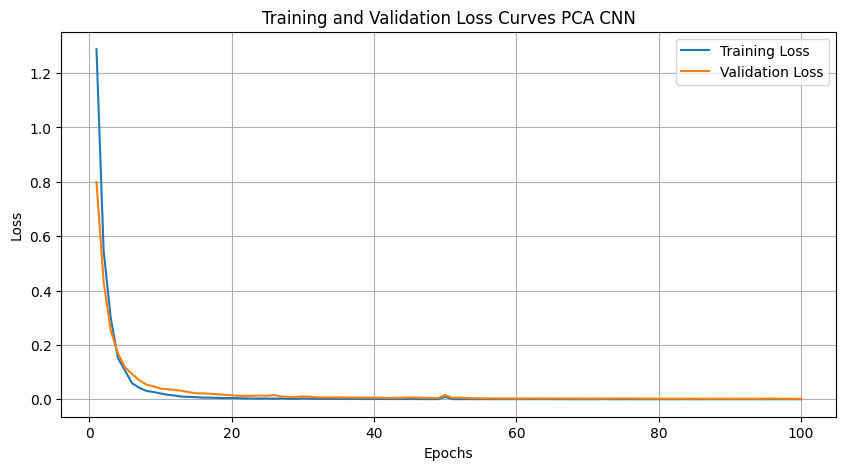

Epoch 1/100
15/15 [==============================] - 1s 17ms/step - loss: 1.2136 - accuracy: 0.5244 - val_loss: 0.6510 - val_accuracy: 0.7965
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.5107 - accuracy: 0.8422 - val_loss: 0.3821 - val_accuracy: 0.9204
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2704 - accuracy: 0.9400 - val_loss: 0.2383 - val_accuracy: 0.9646
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1417 - accuracy: 0.9822 - val_loss: 0.1806 - val_accuracy: 0.9646
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0904 - accuracy: 0.9933 - val_loss: 0.1424 - val_accuracy: 0.9735
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0598 - accuracy: 0.9956 - val_loss: 0.1147 - val_accuracy: 0.9823
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.9956 - val_loss: 0.1037 - val_accuracy: 0.9823
Epoch 8/100


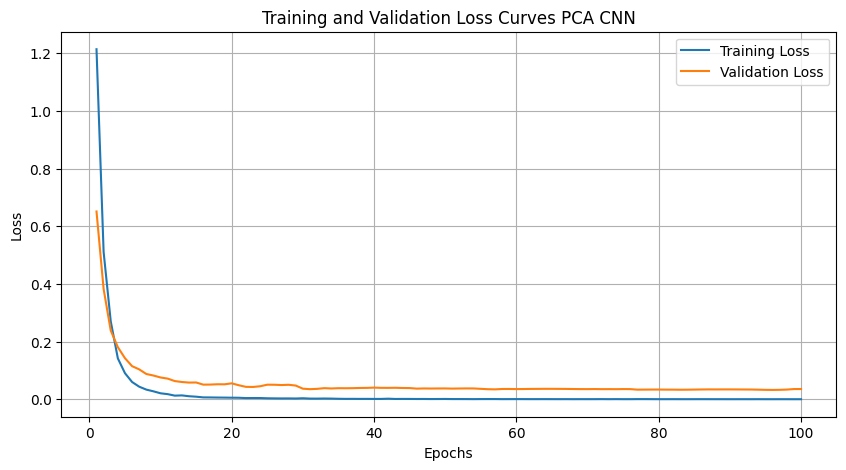

Epoch 1/100
15/15 [==============================] - 1s 16ms/step - loss: 1.1245 - accuracy: 0.5711 - val_loss: 0.6137 - val_accuracy: 0.7699
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 0.4038 - accuracy: 0.8689 - val_loss: 0.3484 - val_accuracy: 0.9469
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.2320 - accuracy: 0.9489 - val_loss: 0.2301 - val_accuracy: 0.9558
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.1289 - accuracy: 0.9733 - val_loss: 0.1787 - val_accuracy: 0.9646
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0900 - accuracy: 0.9867 - val_loss: 0.1328 - val_accuracy: 0.9646
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0481 - accuracy: 0.9978 - val_loss: 0.1165 - val_accuracy: 0.9735
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.9956 - val_loss: 0.0977 - val_accuracy: 0.9823
Epoch 8/100


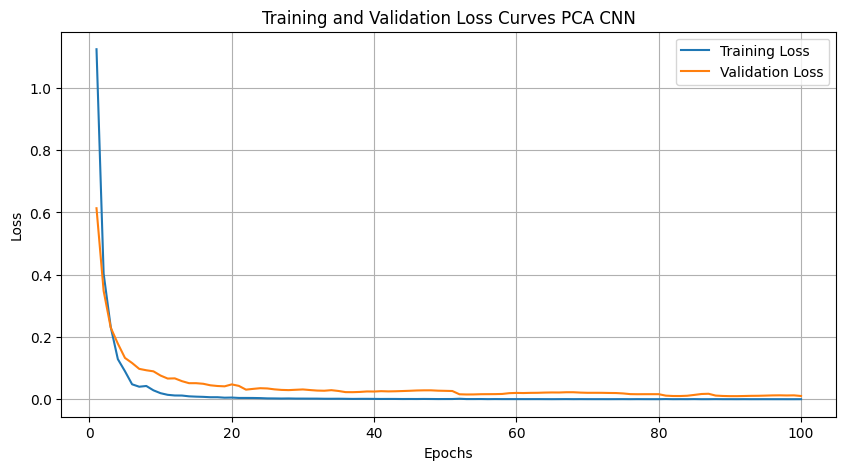

CLR for PCA CNN is: 0.9957446808510639


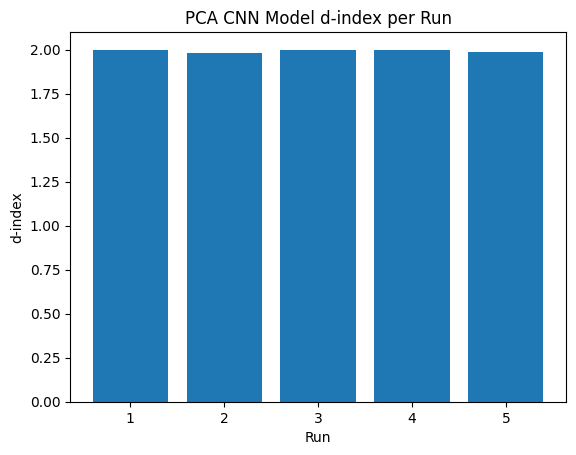

In [ ]:
run_single_model_combinations('CNN', X_train, X_test, y_train, y_test, method='PCA')

### PCA preprocessing LSTM

Epoch 1/100
15/15 [==============================] - 4s 62ms/step - loss: 1.0002 - accuracy: 0.4911 - val_loss: 0.7921 - val_accuracy: 0.6637
Epoch 2/100
15/15 [==============================] - 0s 12ms/step - loss: 0.7085 - accuracy: 0.7022 - val_loss: 0.4995 - val_accuracy: 0.8053
Epoch 3/100
15/15 [==============================] - 0s 12ms/step - loss: 0.5404 - accuracy: 0.7689 - val_loss: 0.4093 - val_accuracy: 0.8673
Epoch 4/100
15/15 [==============================] - 0s 11ms/step - loss: 0.3714 - accuracy: 0.8667 - val_loss: 0.2253 - val_accuracy: 0.9469
Epoch 5/100
15/15 [==============================] - 0s 10ms/step - loss: 0.2396 - accuracy: 0.9222 - val_loss: 0.1617 - val_accuracy: 0.9292
Epoch 6/100
15/15 [==============================] - 0s 10ms/step - loss: 0.1571 - accuracy: 0.9556 - val_loss: 0.1396 - val_accuracy: 0.9381
Epoch 7/100
15/15 [==============================] - 0s 10ms/step - loss: 0.1058 - accuracy: 0.9667 - val_loss: 0.1490 - val_accuracy: 0.9558
Epoch 

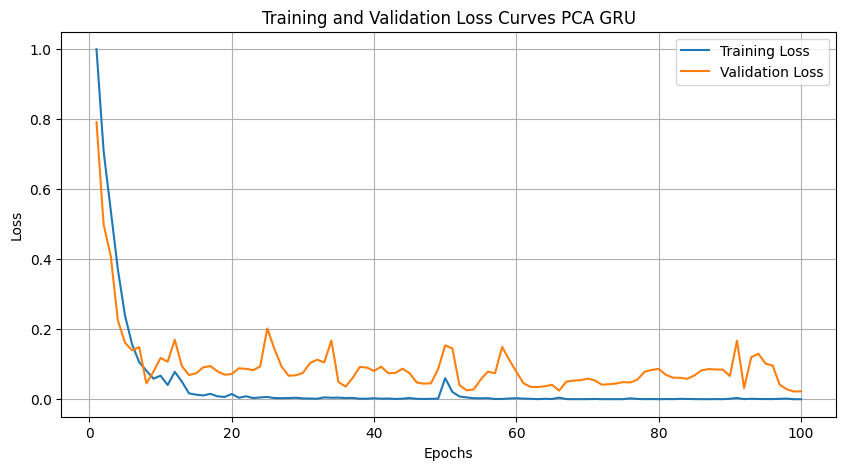

Epoch 1/100
15/15 [==============================] - 4s 61ms/step - loss: 0.9628 - accuracy: 0.5844 - val_loss: 0.7215 - val_accuracy: 0.7080
Epoch 2/100
15/15 [==============================] - 0s 12ms/step - loss: 0.6744 - accuracy: 0.7111 - val_loss: 0.5184 - val_accuracy: 0.7788
Epoch 3/100
15/15 [==============================] - 0s 11ms/step - loss: 0.5387 - accuracy: 0.7889 - val_loss: 0.3924 - val_accuracy: 0.8584
Epoch 4/100
15/15 [==============================] - 0s 10ms/step - loss: 0.3578 - accuracy: 0.8844 - val_loss: 0.3132 - val_accuracy: 0.8496
Epoch 5/100
15/15 [==============================] - 0s 10ms/step - loss: 0.2906 - accuracy: 0.9089 - val_loss: 0.2422 - val_accuracy: 0.8938
Epoch 6/100
15/15 [==============================] - 0s 9ms/step - loss: 0.2120 - accuracy: 0.9333 - val_loss: 0.1470 - val_accuracy: 0.9558
Epoch 7/100
15/15 [==============================] - 0s 9ms/step - loss: 0.1535 - accuracy: 0.9489 - val_loss: 0.2218 - val_accuracy: 0.9292
Epoch 8/

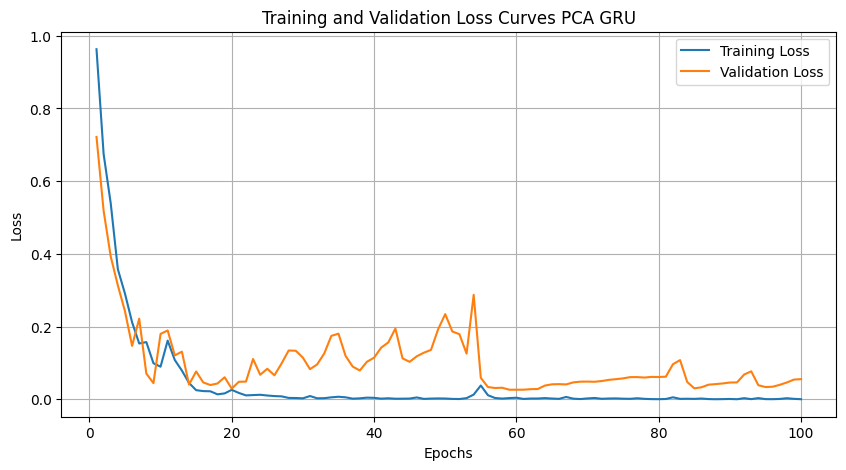

Epoch 1/100
15/15 [==============================] - 4s 61ms/step - loss: 1.0237 - accuracy: 0.5467 - val_loss: 0.8892 - val_accuracy: 0.7080
Epoch 2/100
15/15 [==============================] - 0s 12ms/step - loss: 0.8140 - accuracy: 0.6667 - val_loss: 0.6119 - val_accuracy: 0.7876
Epoch 3/100
15/15 [==============================] - 0s 11ms/step - loss: 0.6076 - accuracy: 0.7444 - val_loss: 0.4570 - val_accuracy: 0.8407
Epoch 4/100
15/15 [==============================] - 0s 10ms/step - loss: 0.4065 - accuracy: 0.8400 - val_loss: 0.3747 - val_accuracy: 0.8496
Epoch 5/100
15/15 [==============================] - 0s 10ms/step - loss: 0.3193 - accuracy: 0.8911 - val_loss: 0.2251 - val_accuracy: 0.9204
Epoch 6/100
15/15 [==============================] - 0s 11ms/step - loss: 0.1912 - accuracy: 0.9356 - val_loss: 0.1648 - val_accuracy: 0.9381
Epoch 7/100
15/15 [==============================] - 0s 11ms/step - loss: 0.1620 - accuracy: 0.9444 - val_loss: 0.2188 - val_accuracy: 0.9469
Epoch 

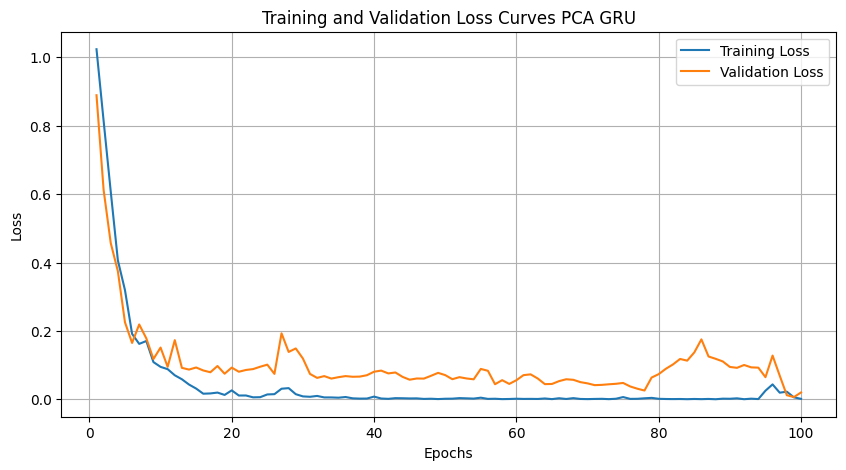

Epoch 1/100
15/15 [==============================] - 6s 62ms/step - loss: 0.9443 - accuracy: 0.5533 - val_loss: 0.7415 - val_accuracy: 0.7080
Epoch 2/100
15/15 [==============================] - 0s 12ms/step - loss: 0.7373 - accuracy: 0.6778 - val_loss: 0.6490 - val_accuracy: 0.7522
Epoch 3/100
15/15 [==============================] - 0s 11ms/step - loss: 0.5994 - accuracy: 0.7533 - val_loss: 0.4912 - val_accuracy: 0.7876
Epoch 4/100
15/15 [==============================] - 0s 10ms/step - loss: 0.4444 - accuracy: 0.8333 - val_loss: 0.3234 - val_accuracy: 0.8850
Epoch 5/100
15/15 [==============================] - 0s 10ms/step - loss: 0.3577 - accuracy: 0.8711 - val_loss: 0.2432 - val_accuracy: 0.9204
Epoch 6/100
15/15 [==============================] - 0s 10ms/step - loss: 0.2090 - accuracy: 0.9378 - val_loss: 0.1453 - val_accuracy: 0.9646
Epoch 7/100
15/15 [==============================] - 0s 10ms/step - loss: 0.1782 - accuracy: 0.9378 - val_loss: 0.1482 - val_accuracy: 0.9292
Epoch 

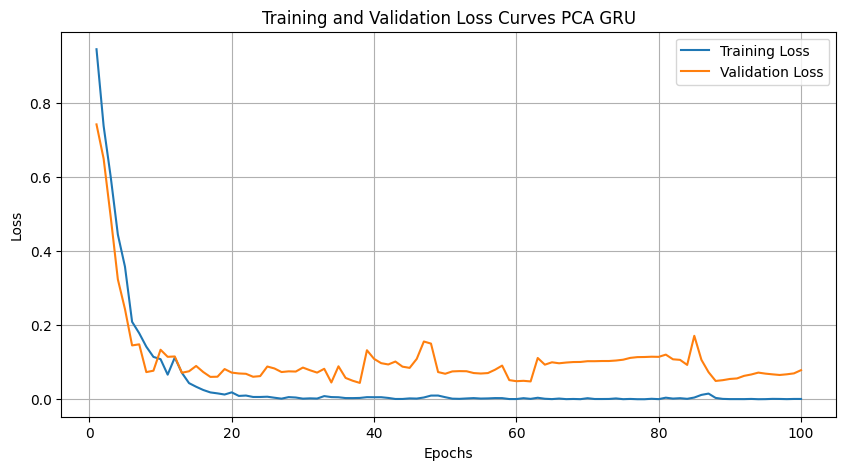

Epoch 1/100
15/15 [==============================] - 4s 63ms/step - loss: 0.9852 - accuracy: 0.5511 - val_loss: 0.7988 - val_accuracy: 0.5929
Epoch 2/100
15/15 [==============================] - 0s 12ms/step - loss: 0.7145 - accuracy: 0.6956 - val_loss: 0.5521 - val_accuracy: 0.7788
Epoch 3/100
15/15 [==============================] - 0s 12ms/step - loss: 0.5385 - accuracy: 0.7867 - val_loss: 0.4430 - val_accuracy: 0.8584
Epoch 4/100
15/15 [==============================] - 0s 11ms/step - loss: 0.4149 - accuracy: 0.8467 - val_loss: 0.2823 - val_accuracy: 0.9292
Epoch 5/100
15/15 [==============================] - 0s 11ms/step - loss: 0.3218 - accuracy: 0.8667 - val_loss: 0.2756 - val_accuracy: 0.9027
Epoch 6/100
15/15 [==============================] - 0s 11ms/step - loss: 0.2338 - accuracy: 0.9222 - val_loss: 0.1211 - val_accuracy: 0.9823
Epoch 7/100
15/15 [==============================] - 0s 10ms/step - loss: 0.1230 - accuracy: 0.9644 - val_loss: 0.0959 - val_accuracy: 0.9558
Epoch 

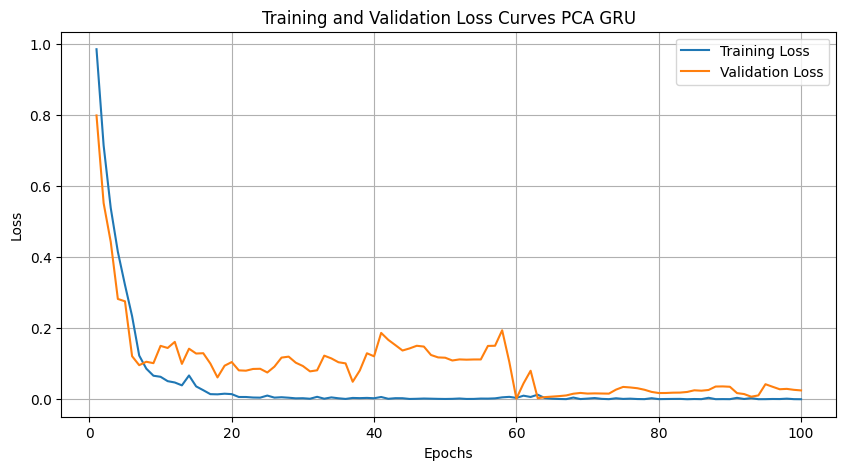

CLR for PCA LSTM is: 0.9858156028368793


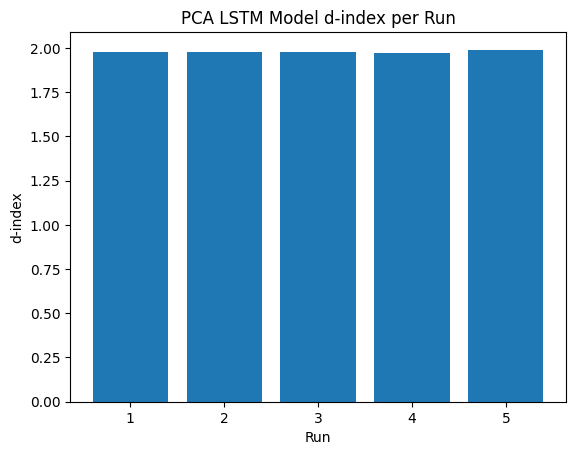

In [ ]:
run_single_model_combinations('LSTM', X_train, X_test, y_train, y_test, method='PCA')

### PCA preprocessing GRU

Epoch 1/100
15/15 [==============================] - 6s 76ms/step - loss: 0.9312 - accuracy: 0.6000 - val_loss: 0.6766 - val_accuracy: 0.7080
Epoch 2/100
15/15 [==============================] - 0s 14ms/step - loss: 0.6093 - accuracy: 0.7667 - val_loss: 0.4889 - val_accuracy: 0.8142
Epoch 3/100
15/15 [==============================] - 0s 12ms/step - loss: 0.4439 - accuracy: 0.8200 - val_loss: 0.3687 - val_accuracy: 0.8584
Epoch 4/100
15/15 [==============================] - 0s 11ms/step - loss: 0.2738 - accuracy: 0.9000 - val_loss: 0.2114 - val_accuracy: 0.9115
Epoch 5/100
15/15 [==============================] - 0s 11ms/step - loss: 0.1628 - accuracy: 0.9556 - val_loss: 0.1324 - val_accuracy: 0.9558
Epoch 6/100
15/15 [==============================] - 0s 11ms/step - loss: 0.0981 - accuracy: 0.9756 - val_loss: 0.1203 - val_accuracy: 0.9735
Epoch 7/100
15/15 [==============================] - 0s 11ms/step - loss: 0.0596 - accuracy: 0.9867 - val_loss: 0.0774 - val_accuracy: 0.9646
Epoch 

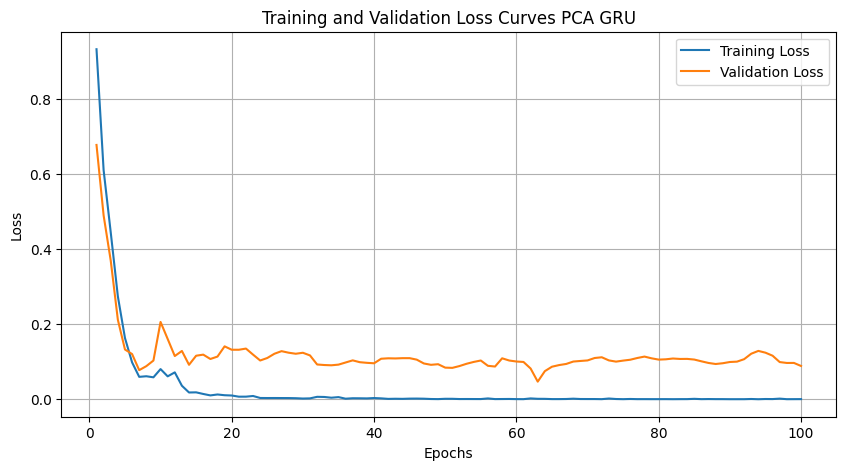

Epoch 1/100
15/15 [==============================] - 6s 79ms/step - loss: 0.9042 - accuracy: 0.5778 - val_loss: 0.6447 - val_accuracy: 0.7257
Epoch 2/100
15/15 [==============================] - 0s 14ms/step - loss: 0.5976 - accuracy: 0.7489 - val_loss: 0.4658 - val_accuracy: 0.8053
Epoch 3/100
15/15 [==============================] - 0s 12ms/step - loss: 0.3656 - accuracy: 0.8667 - val_loss: 0.2706 - val_accuracy: 0.8673
Epoch 4/100
15/15 [==============================] - 0s 11ms/step - loss: 0.2096 - accuracy: 0.9356 - val_loss: 0.1541 - val_accuracy: 0.9204
Epoch 5/100
15/15 [==============================] - 0s 11ms/step - loss: 0.1228 - accuracy: 0.9733 - val_loss: 0.1084 - val_accuracy: 0.9735
Epoch 6/100
15/15 [==============================] - 0s 11ms/step - loss: 0.0804 - accuracy: 0.9867 - val_loss: 0.1170 - val_accuracy: 0.9381
Epoch 7/100
15/15 [==============================] - 0s 11ms/step - loss: 0.0553 - accuracy: 0.9867 - val_loss: 0.0923 - val_accuracy: 0.9646
Epoch 

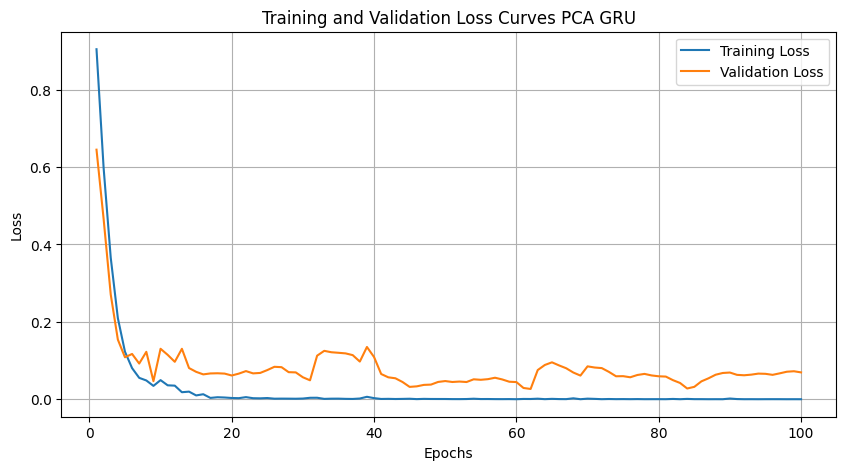

Epoch 1/100
15/15 [==============================] - 6s 77ms/step - loss: 0.9586 - accuracy: 0.5444 - val_loss: 0.6863 - val_accuracy: 0.6903
Epoch 2/100
15/15 [==============================] - 0s 15ms/step - loss: 0.6176 - accuracy: 0.7578 - val_loss: 0.4890 - val_accuracy: 0.7699
Epoch 3/100
15/15 [==============================] - 0s 12ms/step - loss: 0.4451 - accuracy: 0.8400 - val_loss: 0.3166 - val_accuracy: 0.8584
Epoch 4/100
15/15 [==============================] - 0s 11ms/step - loss: 0.2322 - accuracy: 0.9311 - val_loss: 0.1795 - val_accuracy: 0.9204
Epoch 5/100
15/15 [==============================] - 0s 11ms/step - loss: 0.1550 - accuracy: 0.9556 - val_loss: 0.1394 - val_accuracy: 0.9646
Epoch 6/100
15/15 [==============================] - 0s 11ms/step - loss: 0.0861 - accuracy: 0.9756 - val_loss: 0.1110 - val_accuracy: 0.9735
Epoch 7/100
15/15 [==============================] - 0s 11ms/step - loss: 0.0462 - accuracy: 0.9911 - val_loss: 0.0883 - val_accuracy: 0.9823
Epoch 

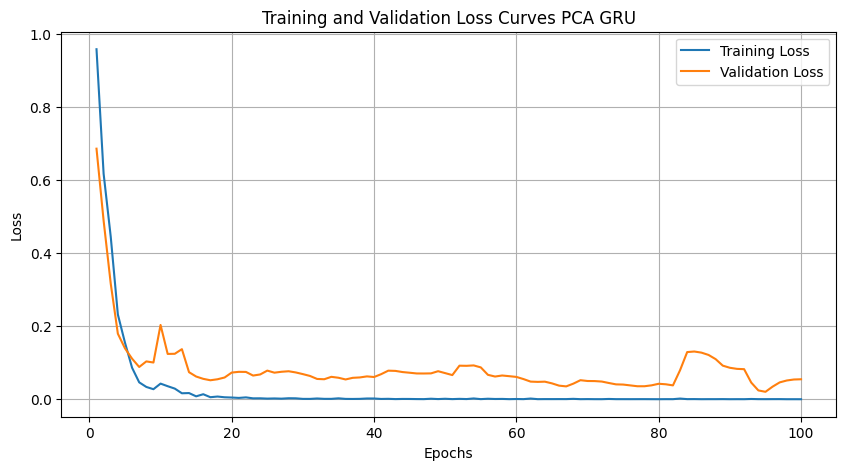

Epoch 1/100
15/15 [==============================] - 6s 75ms/step - loss: 0.9604 - accuracy: 0.5644 - val_loss: 0.7439 - val_accuracy: 0.7168
Epoch 2/100
15/15 [==============================] - 0s 14ms/step - loss: 0.6526 - accuracy: 0.7400 - val_loss: 0.5096 - val_accuracy: 0.7611
Epoch 3/100
15/15 [==============================] - 0s 12ms/step - loss: 0.4542 - accuracy: 0.8156 - val_loss: 0.3197 - val_accuracy: 0.8673
Epoch 4/100
15/15 [==============================] - 0s 12ms/step - loss: 0.2864 - accuracy: 0.9022 - val_loss: 0.1544 - val_accuracy: 0.9646
Epoch 5/100
15/15 [==============================] - 0s 12ms/step - loss: 0.1497 - accuracy: 0.9489 - val_loss: 0.1100 - val_accuracy: 0.9823
Epoch 6/100
15/15 [==============================] - 0s 12ms/step - loss: 0.0845 - accuracy: 0.9756 - val_loss: 0.1336 - val_accuracy: 0.9381
Epoch 7/100
15/15 [==============================] - 0s 12ms/step - loss: 0.0707 - accuracy: 0.9822 - val_loss: 0.0819 - val_accuracy: 0.9646
Epoch 

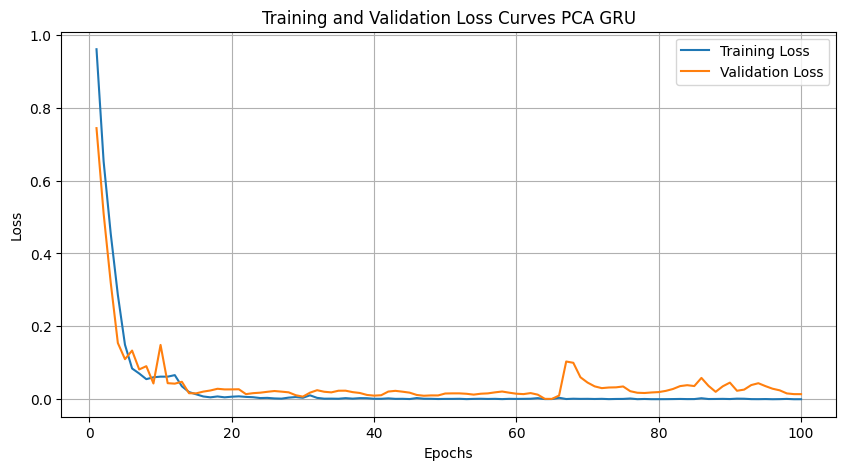

Epoch 1/100
15/15 [==============================] - 7s 78ms/step - loss: 0.9226 - accuracy: 0.5511 - val_loss: 0.6978 - val_accuracy: 0.6991
Epoch 2/100
15/15 [==============================] - 0s 14ms/step - loss: 0.6618 - accuracy: 0.7022 - val_loss: 0.5473 - val_accuracy: 0.7699
Epoch 3/100
15/15 [==============================] - 0s 12ms/step - loss: 0.4954 - accuracy: 0.7644 - val_loss: 0.4124 - val_accuracy: 0.8230
Epoch 4/100
15/15 [==============================] - 0s 12ms/step - loss: 0.3449 - accuracy: 0.8533 - val_loss: 0.2581 - val_accuracy: 0.9115
Epoch 5/100
15/15 [==============================] - 0s 11ms/step - loss: 0.2132 - accuracy: 0.9267 - val_loss: 0.1595 - val_accuracy: 0.9558
Epoch 6/100
15/15 [==============================] - 0s 11ms/step - loss: 0.1238 - accuracy: 0.9622 - val_loss: 0.1055 - val_accuracy: 0.9558
Epoch 7/100
15/15 [==============================] - 0s 12ms/step - loss: 0.0864 - accuracy: 0.9778 - val_loss: 0.0766 - val_accuracy: 0.9646
Epoch 

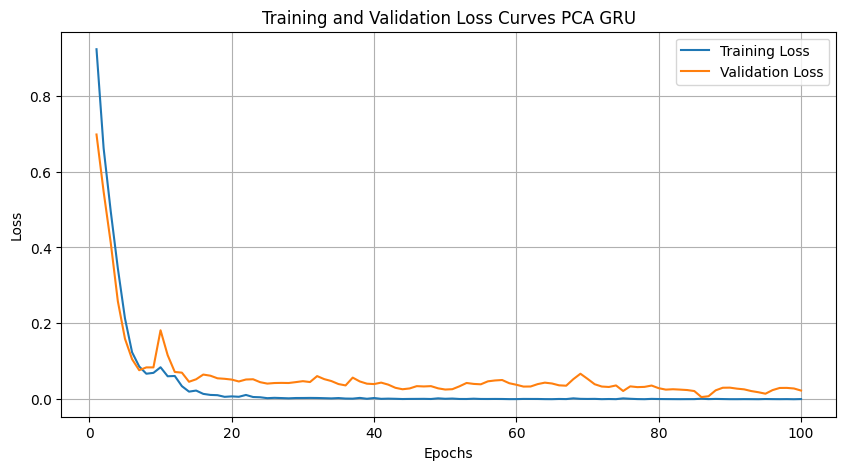

CLR for PCA GRU is: 0.9858156028368794


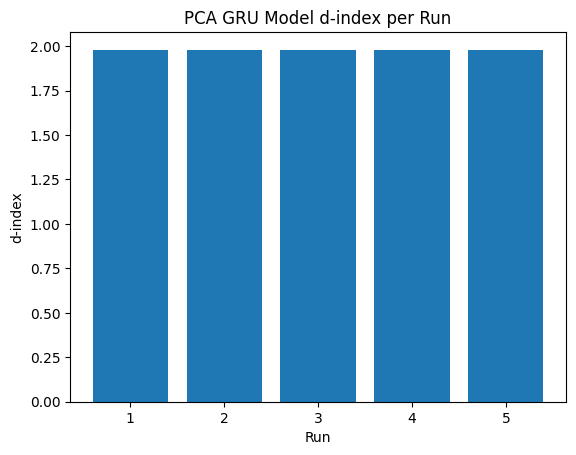

In [ ]:
run_single_model_combinations('GRU', X_train, X_test, y_train, y_test, method='PCA')

# Conclusion

This study underscores the importance of selecting appropriate model architectures and preprocessing techniques to achieve both high performance and reproducibility in deep learning tasks. Across the three datasets, DNN and CNN models consistently demonstrated robustness, particularly when paired with PCA preprocessing. The introduction of 7-layer architectures further enhanced model performance, especially on more complex datasets like Kolod. However, while PCA+TSNE provided a boost in accuracy, it also introduced variability, highlighting the trade-off between accuracy and reproducibility.

Ultimately, this study provides valuable insights into how different combinations of models and preprocessing techniques can be leveraged to optimize deep learning performance across varied datasets. These findings can inform future work in building more reliable and consistent machine learning pipelines.